# imports 

In [2]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="0"

%reload_ext autoreload
%autoreload 2
#%matplotlib notebook
%matplotlib inline

from typing import List, Callable, Dict

import sys
import os

#https://github.com/FAU-DLM/wsi_processing_pipeline
sys.path.append("../")
sys.path.append("../wsi_processing_pipeline/")
sys.path.append("../wsi_processing_pipeline/tile_extraction")
sys.path.append("../wsi_processing_pipeline/shared")
import wsi_processing_pipeline
import tile_extraction
import preprocessing
import postprocessing
import shared
from wsi_processing_pipeline.shared import roi
from wsi_processing_pipeline.tile_extraction import tiles, util, slide, filter
from wsi_processing_pipeline.preprocessing import *
import wsi_processing_pipeline.preprocessing.files_getter
import wsi_processing_pipeline.preprocessing.name_getter
from wsi_processing_pipeline.preprocessing.name_getter import NameGetter
from wsi_processing_pipeline.preprocessing.tile_image_block import TileImage, label_tl_image, tile_image, TileTransform
from wsi_processing_pipeline.preprocessing.tile_image_block import show_batch, TileImageBlock
from shared.patient_manager import PatientManager
from shared.enums import DatasetType, EvaluationLevel

sys.path.append('../models-pytorch/pretrained-models.pytorch')
import pretrainedmodels
from pretrainedmodels import *


import fastai
from fastai.vision.all import *
from typing import Dict
import pandas
import pandas as pd
import numpy as np
import os
import torch
torch.backends.cudnn.benchmark=True
import torchvision
from torchvision.models import *
from torchsummary import summary
from functools import partial, update_wrapper
from tqdm import tqdm_notebook as tqdm
import matplotlib.image as mpimg
import shutil

# to fix python OSError: broken data stream when reading image file
# https://stackoverflow.com/questions/42462431/oserror-broken-data-stream-when-reading-image-file
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

import sklearn
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, KFold
from tqdm.notebook import tqdm

import pathlib
from pathlib import Path
Path.ls = lambda x: [p for p in list(x.iterdir()) if '.ipynb_checkpoints' not in p.name]


from concurrent.futures import as_completed, ProcessPoolExecutor
from tqdm import tqdm

#against DecompressionBombWarning
Image.MAX_IMAGE_PIXELS = 10000000000   

PATH = Path('/home/Deep_Learner/private/datasets/DNTs_vs_GGs/')
PATH_DNET = PATH/'DNETs'
PATH_DNET_WSIS = PATH_DNET/'wsis'
PATH_GANGLIOGLIOMA = PATH/'Ganglioglioma'


seed = 42
np.random.seed(seed)

# data

## wsi and json paths

In [3]:
wsi_paths_dnets = fastai.data.transforms.get_files(path=PATH_DNET_WSIS, extensions=['.ndpi'])
wsi_paths_ganglioglioma = fastai.data.transforms.get_files(path=PATH_GANGLIOGLIOMA, extensions=['.ndpi'])
wsi_paths = list(wsi_paths_dnets+wsi_paths_ganglioglioma)

json_paths_dnets = fastai.data.transforms.get_files(path=PATH_DNET, extensions=['.json'])
json_paths_ganglioglioma = fastai.data.transforms.get_files(path=PATH_GANGLIOGLIOMA, extensions=['.json'])
json_paths = list(json_paths_dnets+json_paths_ganglioglioma)

In [4]:
print(len(wsi_paths_dnets))
print(len(json_paths_dnets))
print(len(wsi_paths_ganglioglioma))
print(len(json_paths_ganglioglioma))

55
52
176
167


## wsi path to json file mapping and roi creation

In [5]:
def get_json_path_for_wsi(wsi_path:pathlib.Path, json_paths:List[pathlib.Path])->pathlib.Path:
    """
    Arguments:
        wsi_path: path to whole-slide image
        json_paths: a list of paths to all json files, which contain the coordinates of region of interests of the
                    corresponding wsi
    Returns:
        Returns path of corresponding json file or raises FileNotFoundError, if json file cannot be found in json_paths
    """
    wsi_name = wsi_path.stem
    for jp in json_paths:
        if(wsi_name == jp.stem):
            return jp
    
    raise FileNotFoundError(f'json file could not be found for {wsi_path}')

        
def get_rois_from_wsi_path(wsi_path:pathlib.Path, json_paths:List[pathlib.Path])\
                            ->List[wsi_processing_pipeline.shared.roi.RegionOfInterestPolygon]:
    json_path = get_json_path_for_wsi(wsi_path=wsi_path, json_paths=json_paths)
    return roi.get_list_of_RegionOfInterestPolygon_from_json(json_path=json_path)

In [6]:
wsi_paths_all_without_corresponding_json_file = []
wsi_path_to_json_path = {}

for wp in wsi_paths:
    try:
        json_path = get_json_path_for_wsi(wsi_path=wp, json_paths=json_paths)
        wsi_path_to_json_path[wp] = json_path
        
        #if(json_path in duplicates):
        #if(json_path in jps):
        #    print(wp)
        #jps.append(json_path)
    except FileNotFoundError:
        wsi_paths_all_without_corresponding_json_file.append(wp)

In [7]:
wsi_paths_all_without_corresponding_json_file

[Path('/home/Deep_Learner/private/datasets/DNTs_vs_GGs/DNETs/wsis/N1365-13-I2.ndpi'),
 Path('/home/Deep_Learner/private/datasets/DNTs_vs_GGs/DNETs/wsis/N1825-18-I13.ndpi'),
 Path('/home/Deep_Learner/private/datasets/DNTs_vs_GGs/DNETs/wsis/N1684 18-I8.ndpi'),
 Path('/home/Deep_Learner/private/datasets/DNTs_vs_GGs/DNETs/wsis/N1825-18-I7.ndpi'),
 Path('/home/Deep_Learner/private/datasets/DNTs_vs_GGs/Ganglioglioma/tumor_ja/WSIs mit beschädigten Tiles/N164-19-5.ndpi'),
 Path('/home/Deep_Learner/private/datasets/DNTs_vs_GGs/Ganglioglioma/tumor_ja/WSIs mit beschädigten Tiles/N402-16.ndpi'),
 Path('/home/Deep_Learner/private/datasets/DNTs_vs_GGs/Ganglioglioma/tumor_ja/WSIs mit beschädigten Tiles/N829-17-IV2.ndpi'),
 Path('/home/Deep_Learner/private/datasets/DNTs_vs_GGs/Ganglioglioma/tumor_ja/WSIs mit beschädigten Tiles/N1531-15-II3.1.ndpi'),
 Path('/home/Deep_Learner/private/datasets/DNTs_vs_GGs/Ganglioglioma/tumor_ja/WSIs mit beschädigten Tiles/N1531-15-II6.ndpi'),
 Path('/home/Deep_Learner/p

In [8]:
wsi_paths_with_json_files = list(wsi_path_to_json_path.keys())

In [9]:
wsi_path_to_rois = {}
for wp in wsi_paths_with_json_files:
    wsi_path_to_rois[wp] = get_rois_from_wsi_path(wsi_path=wp, json_paths=json_paths)

## id and label funcs

In [10]:
# one case per patient => patient id == case id
def get_patient_id_from_wsi_path(wsi_path:pathlib.Path)->str:
    return get_case_id_from_wsi_path(wsi_path=wsi_path)
    
def get_case_id_from_wsi_path(wsi_path:pathlib.Path)->str:
    if('casus' in str(wsi_path.stem)):
        return wsi_path.stem
    split = wsi_path.stem.split('-')
    return f'{split[0]}-{split[1]}'    

def get_slide_id_from_wsi_path(wsi_path:pathlib.Path)->str:
    return wsi_path.stem

def get_labels_from_wsi_path(wsi_path:pathlib.Path, roi=None)->List[int]:
    if('Ganglioglioma' in str(wsi_path.parent)):
        return ['Ganglioglioma']
    if('DNETs' in str(wsi_path)):
        return ['DNET']
    raise AssertionError(f'No label could be determinated for {wsi_path}')

## tiles

In [11]:
tilesummaries = tiles.WsisToTilesParallel(wsi_paths=wsi_path_to_json_path.keys(),
                                          shifted_grid=False,
                                          tile_height=1024, 
                                          tile_width=1024, 
                                          minimal_acceptable_tile_height=0.7, 
                                          minimal_acceptable_tile_width=0.7,
                                          tile_scoring_function=tiles.scoring_function_2,
                                          tile_score_thresh=0.2, 
                                          level=0, 
                                          wsi_path_to_rois=wsi_path_to_rois ,
                                          minimal_tile_roi_intersection_ratio=0.9, 
                                          verbose=False)

  0%|          | 0/218 [00:00<?, ?it/s]

Can't validate JPEG for directory 0: Expected marker at 4294975591, found none


  6%|▌         | 13/218 [00:12<02:50,  1.20it/s]

Can't validate JPEG for directory 0: Expected marker at 4294976039, found none


 14%|█▍        | 30/218 [00:19<01:24,  2.23it/s]

Can't validate JPEG for directory 0: Expected marker at 4294972560, found none
Can't validate JPEG for directory 0: Expected marker at 4294974338, found none


 28%|██▊       | 62/218 [00:34<01:31,  1.70it/s]

Can't validate JPEG for directory 0: Expected marker at 4294970859, found none
Can't validate JPEG for directory 0: Expected marker at 4294970978, found none


 30%|██▉       | 65/218 [00:36<02:14,  1.14it/s]

Can't validate JPEG for directory 0: Expected marker at 4294970979, found none


 45%|████▍     | 98/218 [00:49<00:34,  3.50it/s]

Can't validate JPEG for directory 0: Expected marker at 4294970798, found none
Can't validate JPEG for directory 0: Expected marker at 4294970878, found none
Can't validate JPEG for directory 0: Expected marker at 4294970918, found none


 46%|████▌     | 100/218 [00:50<00:40,  2.94it/s]

Can't validate JPEG for directory 0: Expected marker at 4294976126, found none
Can't validate JPEG for directory 0: Expected marker at 4294973902, found none


 51%|█████▏    | 112/218 [00:54<00:51,  2.06it/s]TopologyException: Input geom 0 is invalid: Self-intersection at or near point 89612.963333591149 37976.510000000002 at 89612.963333591149 37976.510000000002


The operation 'GEOSIntersection_r' could not be performed. Likely cause is invalidity of the geometry <shapely.geometry.polygon.Polygon object at 0x7fe25d701b10>


 65%|██████▌   | 142/218 [01:07<00:39,  1.90it/s]

Can't validate JPEG for directory 0: Expected marker at 4294974266, found none
Can't validate JPEG for directory 0: Expected marker at 4294971043, found none
Can't validate JPEG for directory 0: Expected marker at 4294970639, found none


 66%|██████▌   | 143/218 [01:07<00:34,  2.20it/s]

Can't validate JPEG for directory 0: Expected marker at 4294976170, found none


 92%|█████████▏| 201/218 [02:02<01:42,  6.00s/it]

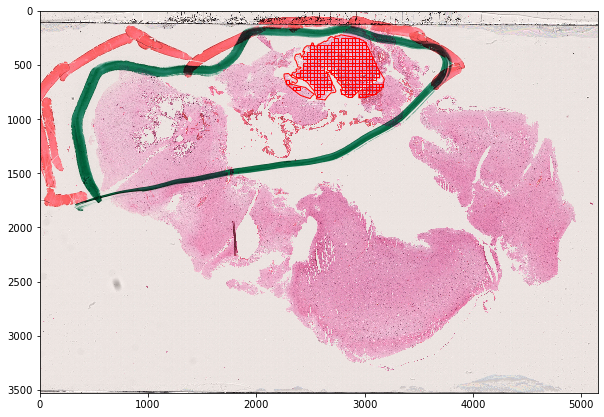

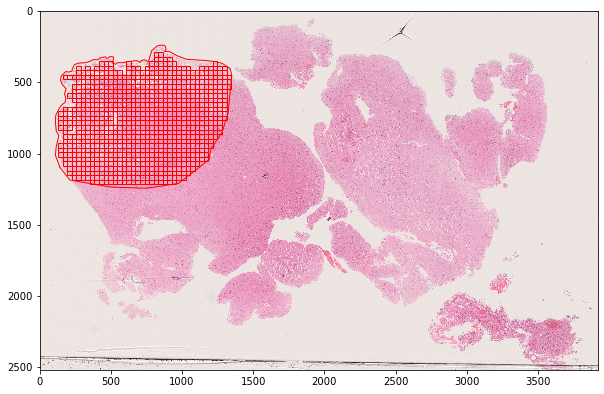

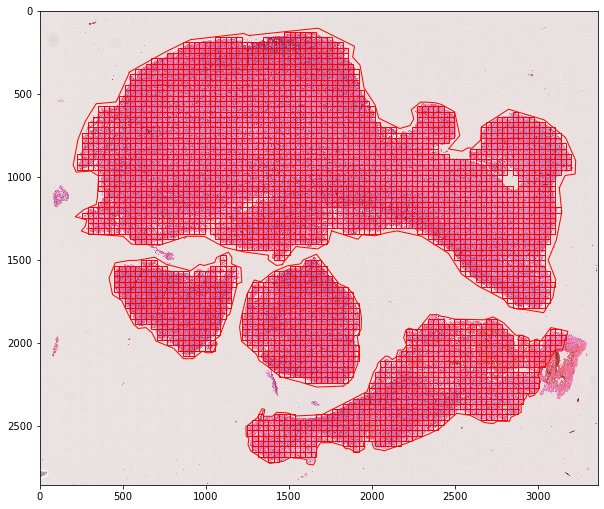

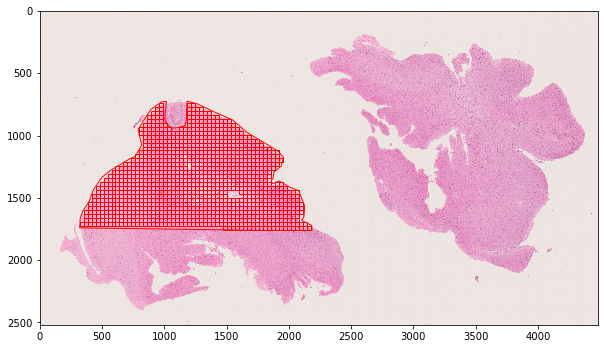

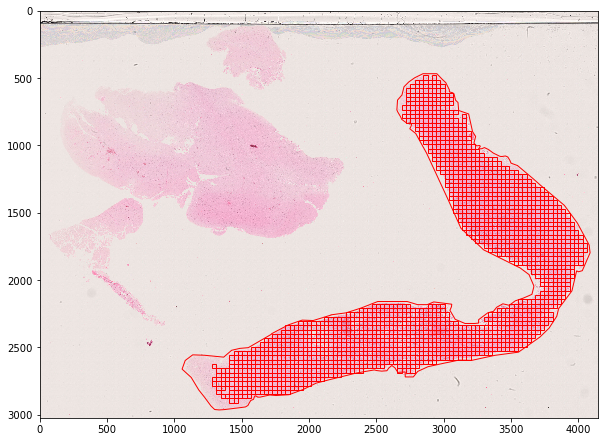

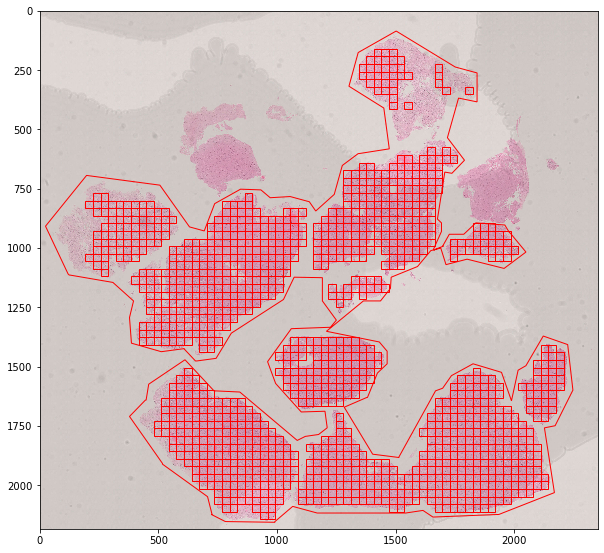

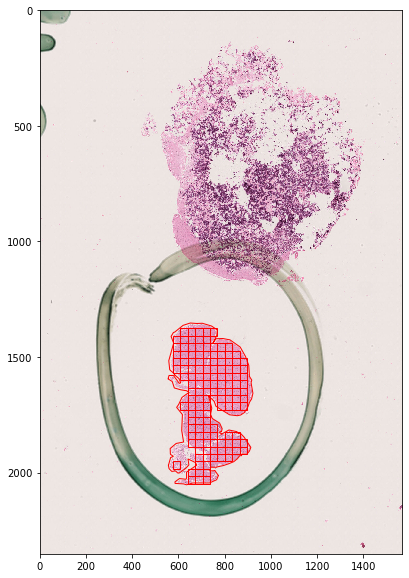

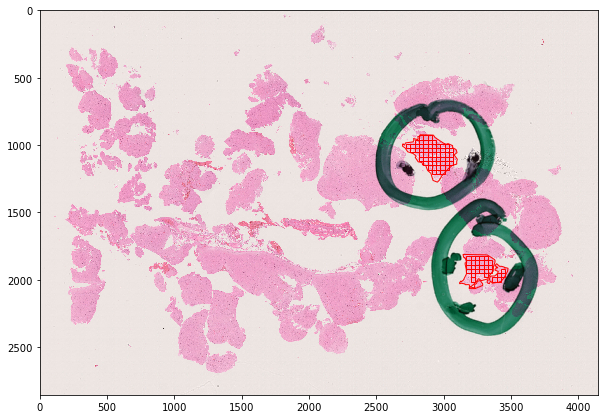

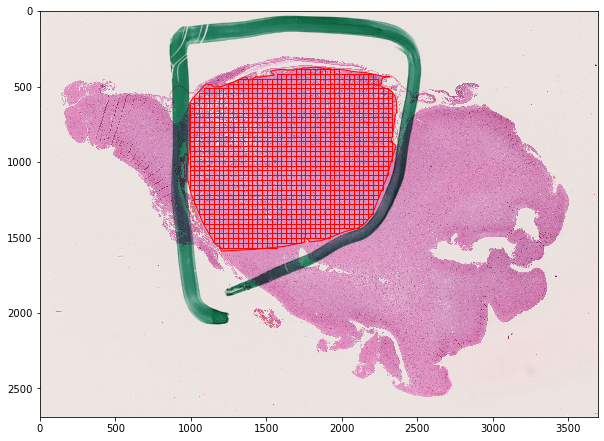

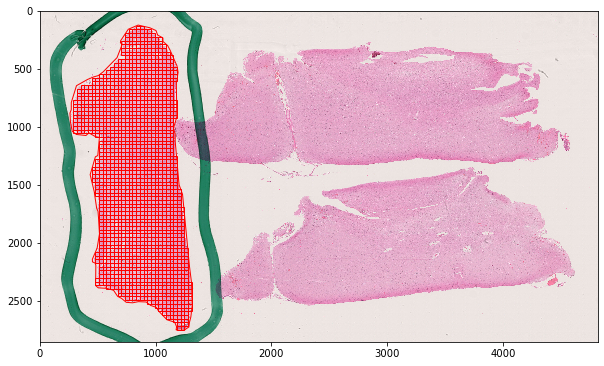

In [22]:
for ts in random.sample(tilesummaries, 10):
    ts.show_wsi_with_top_tiles()

## patient manager 

In [12]:
patient_manager = PatientManager()

In [13]:
patient_manager.create_from_tilesummaries(tilesummaries=tilesummaries, 
                                          patient_id_getter=get_patient_id_from_wsi_path, 
                                          case_id_getter=get_case_id_from_wsi_path, 
                                          slide_id_getter=get_slide_id_from_wsi_path, 
                                          labels_getter=get_labels_from_wsi_path)


100%|██████████| 201/201 [00:01<00:00, 103.05it/s]


In [14]:
train_size = 0.85
validation_size = 0.15
test_size = 0.0

patient_manager.split(train_size=train_size, validation_size=validation_size, test_size=test_size, random_state=seed)

In [15]:
class_distribution_all_tiles = patient_manager.get_class_distribution(level=shared.enums.EvaluationLevel.tile, 
                                                            dataset_type=shared.enums.DatasetType.all)

In [16]:
class_distribution_all_tiles

(206034,
 {'DNET': 34520, 'Ganglioglioma': 171514},
 {'DNET': 0.1675451624489162, 'Ganglioglioma': 0.8324548375510838})

In [17]:
class_distribution_all_cases = patient_manager.get_class_distribution(level=shared.enums.EvaluationLevel.case, 
                                                            dataset_type=shared.enums.DatasetType.all)

In [18]:
class_distribution_all_cases

(139,
 {'DNET': 24, 'Ganglioglioma': 104},
 {'DNET': 0.17266187050359713, 'Ganglioglioma': 0.7482014388489209})

In [19]:
class_distribution_train = patient_manager.get_class_distribution(level=shared.enums.EvaluationLevel.tile, 
                                                            dataset_type=shared.enums.DatasetType.train)

In [20]:
class_distribution_train

(170104,
 {'DNET': 27923, 'Ganglioglioma': 142181},
 {'DNET': 0.1641525184592955, 'Ganglioglioma': 0.8358474815407045})

In [21]:
class_distribution_valid = patient_manager.get_class_distribution(level=shared.enums.EvaluationLevel.tile, 
                                                            dataset_type=shared.enums.DatasetType.validation)

In [22]:
class_distribution_valid

(35930,
 {'DNET': 6597, 'Ganglioglioma': 29333},
 {'DNET': 0.1836070136376287, 'Ganglioglioma': 0.8163929863623712})

## data block api

In [23]:
final_size = 512
bs = 35

data = fastai.data.block.DataBlock(
        blocks=(TileImageBlock, fastai.data.block.MultiCategoryBlock),
        get_x=lambda x: x, 
        get_y=lambda x: x.get_labels(),
        splitter=fastai.data.transforms.FuncSplitter(lambda x: x.get_dataset_type() == shared.enums.DatasetType.validation),
        item_tfms=fastai.vision.augment.Resize(size=final_size, method = 'squish'),
        batch_tfms=fastai.vision.augment.aug_transforms(flip_vert=True))

dls = data.dataloaders(patient_manager.get_tiles(dataset_type=DatasetType.train)\
                        +patient_manager.get_tiles(dataset_type=DatasetType.validation), 
                       bs=bs, 
                       verbose=False)

In [128]:
batch = dls.train.one_batch()

In [131]:
batch[0].shape

torch.Size([35, 3, 512, 512])

In [24]:
len(patient_manager.get_tiles(dataset_type=shared.enums.DatasetType.train))

170104

In [25]:
len(dls.train_ds)

170104

In [26]:
len(patient_manager.get_tiles(dataset_type=shared.enums.DatasetType.validation))

35930

In [27]:
len(dls.valid_ds)

35930

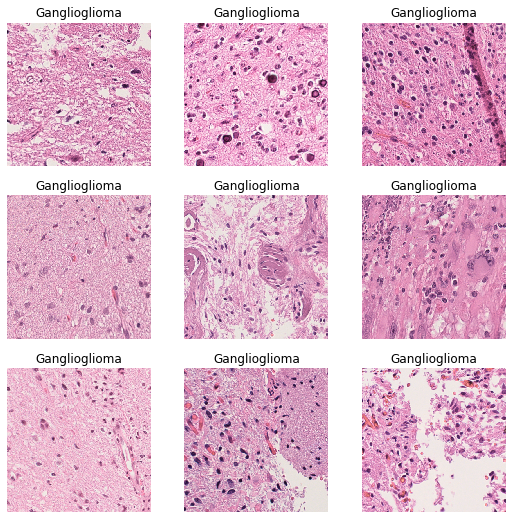

In [26]:
dls.show_batch()

# learner

## n

In [28]:
n=1

## create

In [29]:
#arch = torchvision.models.resnet.resnext101_32x8d
arch = torchvision.models.resnet50

In [30]:
learner = cnn_learner(dls=dls, 
                     arch=arch, 
                     metrics=[fastai.metrics.accuracy_multi],
                     pretrained=True,
                     path=PATH/'models'/f'{n}-{arch.__name__}')

In [31]:
learner.to_fp16()

In [32]:
learner.path

Path('/home/Deep_Learner/private/datasets/DNTs_vs_GGs/models/1-resnet50')

In [33]:
learner.path.parent.mkdir(exist_ok=True)

In [34]:
learner.path.mkdir(exist_ok=True)

## name

In [35]:
epochs_frozen = 5
epochs_unfrozen = 10

In [36]:
nameBase = f'{n}-{arch.__name__}'
nameBase

'1-resnet50'

## train

In [ ]:
learner.lr_find(start_lr=1e-15, end_lr=10, num_it=200)

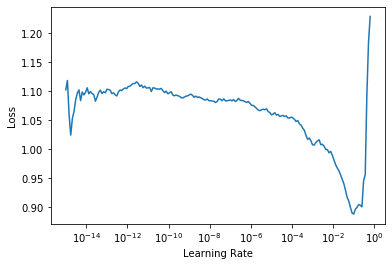

In [41]:
learner.recorder.plot_lr_find()

In [36]:
lr1 = 1e-2

In [37]:
log_head_name = 'log-head.csv'

In [ ]:
learner.fit_one_cycle(n_epoch=epochs_frozen, 
                      lr_max=lr1, 
                      cbs=[CSVLogger(fname=log_head_name, append=True), SaveModelCallback(every_epoch=True, fname='head')])

epoch,train_loss,valid_loss,accuracy_multi,time


In [45]:
pd.read_csv(learner.path/log_head_name)

,epoch,train_loss,valid_loss,accuracy_multi,time
0,0,1.102658987045288,07:54,NaN,NaN
1,epoch,train_loss,valid_loss,accuracy_multi,time
2,0,0.1272624433040619,0.3058910369873047,0.8797662258148193,31:23:05
3,1,0.08808394521474838,0.2312178760766983,0.941998302936554,29:50:28
4,2,0.05362435802817345,0.35570651292800903,0.9329529404640198,29:06:20
5,3,0.03311864286661148,0.2640641927719116,0.939521312713623,15:10:05
6,4,0.03425982967019081,0.34742024540901184,0.9323685169219971,20:39:57


In [ ]:
nameHead = f'{nameBase}-head';nameHead

In [ ]:
learner.save(nameHead)

In [48]:
learner.unfreeze()

In [ ]:
learner.lr_find(start_lr=1e-11, end_lr=1e-2, num_it=500)

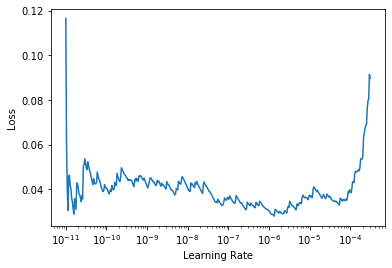

In [55]:
learner.recorder.plot_lr_find()

In [56]:
lr2 = 1e-8
lr3 = 1e-7
lr4 = 1e-6

In [57]:
log_complete_name = 'log-complete.csv'

In [ ]:
learner.fit_one_cycle(n_epoch=epochs_unfrozen, 
                      lr_max=[lr2, lr3, lr4], 
                      cbs=[CSVLogger(fname=log_complete_name, append=True), SaveModelCallback(every_epoch=True, fname='complete')])

epoch,train_loss,valid_loss,accuracy_multi,time


In [ ]:
pd.read_csv(learner.path/log_complete_name)

In [37]:
nameComplete = f'{nameBase}-complete'; nameComplete

'1-resnet50-complete'

In [38]:
#learner.save(nameComplete)
learner.load(nameComplete)

# prediction

In [168]:
tiles_dnets = [t for t in patient_manager.get_tiles(dataset_type=DatasetType.validation) if 'DNET' in t.get_labels()]
tiles_ggs = [t for t in patient_manager.get_tiles(dataset_type=DatasetType.validation) if 'Ganglioglioma' in t.get_labels()]
tiles_train = patient_manager.get_tiles(dataset_type=shared.enums.DatasetType.train)

ts_valid_sample = random.sample(tiles_dnets+tiles_ggs, 50)

In [152]:
for t in ts_valid_sample:
    print(t.get_labels())

['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['DNET']
['DNET']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['DNET']
['DNET']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['DNET']
['DNET']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['DNET']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']
['Ganglioglioma']


In [154]:
for t in ts_valid_sample:
    print(t.get_dataset_type()==shared.enums.DatasetType.validation)

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


In [171]:
data_exp = fastai.data.block.DataBlock(
        blocks=(TileImageBlock, fastai.data.block.MultiCategoryBlock),
        get_x=lambda x: x, 
        get_y=lambda x: x.get_labels(),
        splitter=fastai.data.transforms.FuncSplitter(lambda x: not(x.get_dataset_type()==shared.enums.DatasetType.validation)),
        item_tfms=fastai.vision.augment.Resize(size=final_size, method = 'squish'))

dl_train_exp = data.dataloaders(tiles_train[:5]+ts_valid_sample, 
                           bs=bs, 
                           verbose=False).train

#print(dls_exp.vocab)
#print(dls_exp.valid_ds)

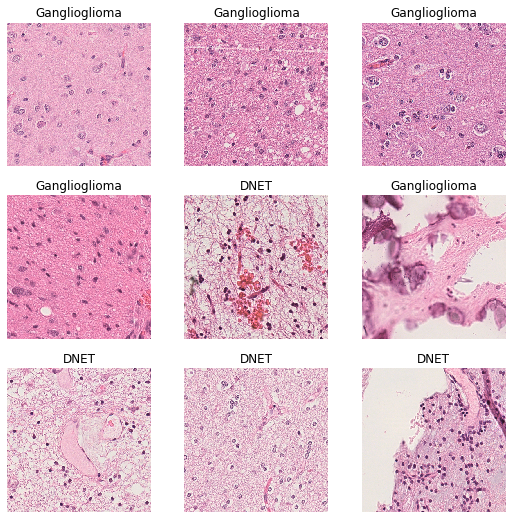

In [42]:
dls_exp.valid.show_batch()

In [170]:
dl_valid_exp = learner.dls.test_dl(test_items=ts_valid_sample)
print(dl_valid_exp)

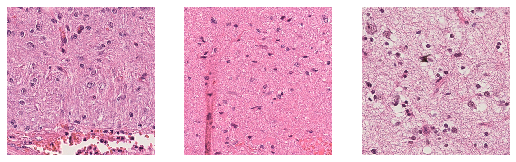

In [120]:
dl_valid_exp.show_batch()

In [121]:
preds = learner.get_preds(dl=dl_valid_exp, with_loss=True)

IndexError: tuple index out of range

In [44]:
preds

(tensor([[8.5303e-06, 9.9999e-01],
         [7.1491e-03, 9.9285e-01],
         [6.5135e-03, 9.9349e-01],
         [5.5943e-06, 9.9999e-01],
         [4.5208e-03, 9.9548e-01],
         [1.1496e-08, 1.0000e+00],
         [5.7929e-04, 9.9942e-01],
         [3.3274e-04, 9.9967e-01],
         [5.0334e-04, 9.9950e-01],
         [8.5476e-05, 9.9991e-01]]),
 TensorMultiCategory([[0., 1.],
         [0., 1.],
         [0., 1.],
         [0., 1.],
         [1., 0.],
         [0., 1.],
         [1., 0.],
         [1., 0.],
         [1., 0.],
         [0., 1.]]),
 TensorBase([8.5830e-06, 7.1748e-03, 6.5348e-03, 5.6028e-06, 5.3991e+00, 0.0000e+00,
         7.4537e+00, 8.0081e+00, 7.5943e+00, 8.5469e-05]))

In [143]:
for t in ts_valid_sample:
    print(t.get_labels_one_hot_encoded())
    print(t.predictions_raw)

[1 0]
{'DNET': 0.00019716942915692925, 'Ganglioglioma': 0.9998028874397278}
[1 0]
{'DNET': 0.0002305067318957299, 'Ganglioglioma': 0.9997695088386536}
[1 0]
{'DNET': 0.04913078621029854, 'Ganglioglioma': 0.9508692026138306}
[1 0]
{'DNET': 0.0002492325147613883, 'Ganglioglioma': 0.9997507929801941}
[1 0]
{'DNET': 0.01400956604629755, 'Ganglioglioma': 0.9859904050827026}


In [64]:
for n, t in enumerate(ts_valid_sample):
    print(f'y_true: {t.get_labels()}')
    print(f'preds from get_preds: {preds[0][n]}')
    print(f'learner.predict: {learner.predict(t)}')
    print(f'----------------------------------------------------------------------')

y_true: ['DNET']
preds from get_preds: tensor([8.5303e-06, 9.9999e-01])


learner.predict: (['DNET'], tensor([ True, False]), tensor([9.9963e-01, 3.6974e-04]))
----------------------------------------------------------------------
y_true: ['Ganglioglioma']
preds from get_preds: tensor([0.0071, 0.9929])


learner.predict: (['Ganglioglioma'], tensor([False,  True]), tensor([0.0290, 0.9710]))
----------------------------------------------------------------------
y_true: ['Ganglioglioma']
preds from get_preds: tensor([0.0065, 0.9935])


learner.predict: (['Ganglioglioma'], tensor([False,  True]), tensor([1.3232e-08, 1.0000e+00]))
----------------------------------------------------------------------
y_true: ['Ganglioglioma']
preds from get_preds: tensor([5.5943e-06, 9.9999e-01])


learner.predict: (['Ganglioglioma'], tensor([False,  True]), tensor([2.1112e-05, 9.9998e-01]))
----------------------------------------------------------------------
y_true: ['DNET']
preds from get_preds: tensor([0.0045, 0.9955])


learner.predict: (['DNET'], tensor([ True, False]), tensor([9.9999e-01, 8.6647e-06]))
----------------------------------------------------------------------
y_true: ['Ganglioglioma']
preds from get_preds: tensor([1.1496e-08, 1.0000e+00])


learner.predict: (['Ganglioglioma'], tensor([False,  True]), tensor([3.6338e-18, 1.0000e+00]))
----------------------------------------------------------------------
y_true: ['Ganglioglioma']
preds from get_preds: tensor([5.7929e-04, 9.9942e-01])


learner.predict: (['Ganglioglioma'], tensor([False,  True]), tensor([0.1542, 0.8458]))
----------------------------------------------------------------------
y_true: ['Ganglioglioma']
preds from get_preds: tensor([3.3274e-04, 9.9967e-01])


learner.predict: (['Ganglioglioma'], tensor([False,  True]), tensor([7.0423e-08, 1.0000e+00]))
----------------------------------------------------------------------
y_true: ['Ganglioglioma']
preds from get_preds: tensor([5.0334e-04, 9.9950e-01])


learner.predict: (['Ganglioglioma'], tensor([False,  True]), tensor([1.8448e-06, 1.0000e+00]))
----------------------------------------------------------------------
y_true: ['Ganglioglioma']
preds from get_preds: tensor([8.5476e-05, 9.9991e-01])


learner.predict: (['Ganglioglioma'], tensor([False,  True]), tensor([6.3392e-06, 9.9999e-01]))
----------------------------------------------------------------------
y_true: ['Ganglioglioma']


IndexError: index 10 is out of bounds for dimension 0 with size 10

In [148]:
for t in patient_manager.get_tiles(dataset_type=shared.enums.DatasetType.validation):
    print(t.predictions_raw)

{'DNET': 0.0013885232619941235, 'Ganglioglioma': 0.9986114501953125}
{'DNET': 0.0042151594534516335, 'Ganglioglioma': 0.9957848191261292}
{'DNET': 0.001622967072762549, 'Ganglioglioma': 0.9983769655227661}
{'DNET': 0.0006932422984391451, 'Ganglioglioma': 0.9993067979812622}
{'DNET': 0.001220795209519565, 'Ganglioglioma': 0.9987792372703552}
{'DNET': 9.535461140330881e-05, 'Ganglioglioma': 0.9999046325683594}
{'DNET': 1.3846004549122881e-05, 'Ganglioglioma': 0.9999861717224121}
{'DNET': 5.285515385367034e-07, 'Ganglioglioma': 0.9999995231628418}
{'DNET': 0.001220795209519565, 'Ganglioglioma': 0.9987792372703552}
{'DNET': 0.007636216003447771, 'Ganglioglioma': 0.9923638105392456}
{'DNET': 0.0060975621454417706, 'Ganglioglioma': 0.9939024448394775}
{'DNET': 0.0010202174307778478, 'Ganglioglioma': 0.9989797472953796}
{'DNET': 0.0024438868276774883, 'Ganglioglioma': 0.9975560903549194}
{'DNET': 0.005888159852474928, 'Ganglioglioma': 0.9941118359565735}
{'DNET': 0.010408313944935799, 'Gangli

{'DNET': 0.00024536947603337467, 'Ganglioglioma': 0.9997546076774597}
{'DNET': 1.0616134204610717e-05, 'Ganglioglioma': 0.99998939037323}
{'DNET': 9.99303229036741e-05, 'Ganglioglioma': 0.9999001026153564}
{'DNET': 0.003538086311891675, 'Ganglioglioma': 0.9964619278907776}
{'DNET': 0.002225670963525772, 'Ganglioglioma': 0.9977743029594421}
{'DNET': 8.80110019352287e-06, 'Ganglioglioma': 0.9999911785125732}
{'DNET': 0.00027159214369021356, 'Ganglioglioma': 0.9997305274009705}
{'DNET': 0.003869391046464443, 'Ganglioglioma': 0.9961305856704712}
{'DNET': 0.0120537793263793, 'Ganglioglioma': 0.9879462122917175}
{'DNET': 0.0037800956051796675, 'Ganglioglioma': 0.9962199330329895}
{'DNET': 0.022759154438972473, 'Ganglioglioma': 0.9772408604621887}
{'DNET': 0.006121281534433365, 'Ganglioglioma': 0.9938787817955017}
{'DNET': 0.013742320239543915, 'Ganglioglioma': 0.9862577319145203}
{'DNET': 0.02145073004066944, 'Ganglioglioma': 0.9785493016242981}
{'DNET': 0.008644177578389645, 'Ganglioglioma'

{'DNET': 0.004538431763648987, 'Ganglioglioma': 0.9954615235328674}
{'DNET': 0.001103026675991714, 'Ganglioglioma': 0.9988969564437866}
{'DNET': 0.027742892503738403, 'Ganglioglioma': 0.9722570776939392}
{'DNET': 0.01945657469332218, 'Ganglioglioma': 0.9805434346199036}
{'DNET': 0.010944577865302563, 'Ganglioglioma': 0.9890553951263428}
{'DNET': 0.004700060468167067, 'Ganglioglioma': 0.9952999353408813}
{'DNET': 0.001483718864619732, 'Ganglioglioma': 0.9985162615776062}
{'DNET': 0.06548520922660828, 'Ganglioglioma': 0.9345147609710693}
{'DNET': 0.008881675079464912, 'Ganglioglioma': 0.9911182522773743}
{'DNET': 0.004681822378188372, 'Ganglioglioma': 0.9953181147575378}
{'DNET': 0.0004529758298303932, 'Ganglioglioma': 0.9995469450950623}
{'DNET': 0.0029464049730449915, 'Ganglioglioma': 0.9970536231994629}
{'DNET': 0.005598248913884163, 'Ganglioglioma': 0.994401752948761}
{'DNET': 0.0019418168812990189, 'Ganglioglioma': 0.9980581402778625}
{'DNET': 0.009303949773311615, 'Ganglioglioma': 

{'DNET': 0.0036499870475381613, 'Ganglioglioma': 0.9963500499725342}
{'DNET': 0.0005132579244673252, 'Ganglioglioma': 0.9994866847991943}
{'DNET': 0.0015247863484546542, 'Ganglioglioma': 0.9984752535820007}
{'DNET': 0.0002673826238606125, 'Ganglioglioma': 0.9997325539588928}
{'DNET': 0.008711384609341621, 'Ganglioglioma': 0.9912885427474976}
{'DNET': 0.00026947917649522424, 'Ganglioglioma': 0.9997305274009705}
{'DNET': 0.00023231418163049966, 'Ganglioglioma': 0.9997677206993103}
{'DNET': 0.0005336928297765553, 'Ganglioglioma': 0.9994663596153259}
{'DNET': 5.014734597352799e-06, 'Ganglioglioma': 0.9999949932098389}
{'DNET': 4.331903619458899e-05, 'Ganglioglioma': 0.9999567270278931}
{'DNET': 0.0029008574783802032, 'Ganglioglioma': 0.9970991611480713}
{'DNET': 0.004086002707481384, 'Ganglioglioma': 0.9959140419960022}
{'DNET': 0.005426943302154541, 'Ganglioglioma': 0.9945730566978455}
{'DNET': 0.0075187175534665585, 'Ganglioglioma': 0.9924813508987427}
{'DNET': 0.0015669888816773891, 'Ga

{'DNET': 0.00025514140725135803, 'Ganglioglioma': 0.9997448325157166}
{'DNET': 0.0008899655076675117, 'Ganglioglioma': 0.9991100430488586}
{'DNET': 0.00031258779927156866, 'Ganglioglioma': 0.9996874332427979}
{'DNET': 0.00029365462251007557, 'Ganglioglioma': 0.9997063279151917}
{'DNET': 0.0001823546044761315, 'Ganglioglioma': 0.9998176693916321}
{'DNET': 0.0009362827986478806, 'Ganglioglioma': 0.9990637898445129}
{'DNET': 0.002396730938926339, 'Ganglioglioma': 0.9976032376289368}
{'DNET': 0.001138000632636249, 'Ganglioglioma': 0.9988620281219482}
{'DNET': 0.0021074723917990923, 'Ganglioglioma': 0.9978925585746765}
{'DNET': 0.004331502132117748, 'Ganglioglioma': 0.9956685304641724}
{'DNET': 0.0010649627074599266, 'Ganglioglioma': 0.9989350438117981}
{'DNET': 0.00032250722870230675, 'Ganglioglioma': 0.9996775388717651}
{'DNET': 0.00015236754552461207, 'Ganglioglioma': 0.9998476505279541}
{'DNET': 8.029783930396661e-05, 'Ganglioglioma': 0.9999196529388428}
{'DNET': 0.00040765260928310454,

{'DNET': 4.092911240149988e-06, 'Ganglioglioma': 0.9999959468841553}
{'DNET': 7.368592923739925e-05, 'Ganglioglioma': 0.9999263286590576}
{'DNET': 8.73261069500586e-06, 'Ganglioglioma': 0.9999912977218628}
{'DNET': 3.5968401590480426e-08, 'Ganglioglioma': 1.0}
{'DNET': 1.0953122909995727e-05, 'Ganglioglioma': 0.9999890327453613}
{'DNET': 0.00014202365127857774, 'Ganglioglioma': 0.9998579025268555}
{'DNET': 0.000414069538237527, 'Ganglioglioma': 0.9995859265327454}
{'DNET': 9.535461140330881e-05, 'Ganglioglioma': 0.9999046325683594}
{'DNET': 8.156224794220179e-05, 'Ganglioglioma': 0.9999184608459473}
{'DNET': 0.00017265156202483922, 'Ganglioglioma': 0.9998273253440857}
{'DNET': 0.0011160142021253705, 'Ganglioglioma': 0.9988840222358704}
{'DNET': 5.649793456541374e-05, 'Ganglioglioma': 0.9999434947967529}
{'DNET': 2.2827996872365475e-05, 'Ganglioglioma': 0.9999772310256958}
{'DNET': 1.6571451851632446e-05, 'Ganglioglioma': 0.9999834299087524}
{'DNET': 2.6220211566396756e-06, 'Ganglioglio

{'DNET': 0.002199798123911023, 'Ganglioglioma': 0.9978001713752747}
{'DNET': 0.00010554686014074832, 'Ganglioglioma': 0.9998944997787476}
{'DNET': 0.0015487611526623368, 'Ganglioglioma': 0.9984512329101562}
{'DNET': 0.004038591869175434, 'Ganglioglioma': 0.9959613680839539}
{'DNET': 0.00046917638974264264, 'Ganglioglioma': 0.9995307922363281}
{'DNET': 0.0010901900241151452, 'Ganglioglioma': 0.9989098310470581}
{'DNET': 0.0011649561347439885, 'Ganglioglioma': 0.998835027217865}
{'DNET': 0.0009773503988981247, 'Ganglioglioma': 0.9990226030349731}
{'DNET': 0.0017207354540005326, 'Ganglioglioma': 0.998279333114624}
{'DNET': 0.00028462239424698055, 'Ganglioglioma': 0.9997153878211975}
{'DNET': 0.030675802379846573, 'Ganglioglioma': 0.9693241715431213}
{'DNET': 0.00019716942915692925, 'Ganglioglioma': 0.9998044371604919}
{'DNET': 0.0007466114475391805, 'Ganglioglioma': 0.9992533326148987}
{'DNET': 0.0020911062601953745, 'Ganglioglioma': 0.9979089498519897}
{'DNET': 0.0003770285693462938, 'Ga

{'DNET': 3.2955729693640023e-05, 'Ganglioglioma': 0.999967098236084}
{'DNET': 0.00015236754552461207, 'Ganglioglioma': 0.9998476505279541}
{'DNET': 2.8857117285951972e-05, 'Ganglioglioma': 0.9999711513519287}
{'DNET': 4.683888255385682e-05, 'Ganglioglioma': 0.9999531507492065}
{'DNET': 7.2395987444906496e-06, 'Ganglioglioma': 0.9999927282333374}
{'DNET': 3.1941821362124756e-05, 'Ganglioglioma': 0.9999680519104004}
{'DNET': 6.591734290850582e-06, 'Ganglioglioma': 0.9999934434890747}
{'DNET': 0.00018667821132112294, 'Ganglioglioma': 0.9998133778572083}
{'DNET': 0.0002415662893326953, 'Ganglioglioma': 0.9997584223747253}
{'DNET': 1.3420013601717073e-05, 'Ganglioglioma': 0.9999865293502808}
{'DNET': 1.9073577277595177e-05, 'Ganglioglioma': 0.9999809265136719}
{'DNET': 0.0002131875662598759, 'Ganglioglioma': 0.9997867941856384}
{'DNET': 1.4908486889453343e-07, 'Ganglioglioma': 0.9999998807907104}
{'DNET': 0.00020027377468068153, 'Ganglioglioma': 0.9997997879981995}
{'DNET': 5.87484209972899

{'DNET': 1.22376322408968e-08, 'Ganglioglioma': 1.0}
{'DNET': 8.939696272136644e-06, 'Ganglioglioma': 0.9999910593032837}
{'DNET': 0.00011412239109631628, 'Ganglioglioma': 0.9998867511749268}
{'DNET': 0.0002305067318957299, 'Ganglioglioma': 0.9997695088386536}
{'DNET': 5.9673518990166485e-05, 'Ganglioglioma': 0.9999402761459351}
{'DNET': 0.0011247574584558606, 'Ganglioglioma': 0.9988752007484436}
{'DNET': 4.9086618673754856e-05, 'Ganglioglioma': 0.9999508857727051}
{'DNET': 0.0003053489199373871, 'Ganglioglioma': 0.9996947050094604}
{'DNET': 6.97647119523026e-05, 'Ganglioglioma': 0.9999302625656128}
{'DNET': 3.6954447835135795e-10, 'Ganglioglioma': 1.0}
{'DNET': 4.572869194419127e-09, 'Ganglioglioma': 1.0}
{'DNET': 3.244481558795087e-05, 'Ganglioglioma': 0.9999675750732422}
{'DNET': 0.00018093576363753527, 'Ganglioglioma': 0.9998190999031067}
{'DNET': 5.1845658163074404e-05, 'Ganglioglioma': 0.9999481439590454}
{'DNET': 0.00013238185783848166, 'Ganglioglioma': 0.9998675584793091}
{'DNE

{'DNET': 0.0002891032490879297, 'Ganglioglioma': 0.9997108578681946}
{'DNET': 0.00024346048303414136, 'Ganglioglioma': 0.9997565150260925}
{'DNET': 3.3145429370051716e-06, 'Ganglioglioma': 0.9999966621398926}
{'DNET': 0.00021654405281879008, 'Ganglioglioma': 0.999783456325531}
{'DNET': 0.04001227021217346, 'Ganglioglioma': 0.9599877595901489}
{'DNET': 0.02876158617436886, 'Ganglioglioma': 0.9711838364601135}
{'DNET': 0.00043904531048610806, 'Ganglioglioma': 0.9995608925819397}
{'DNET': 0.004485794343054295, 'Ganglioglioma': 0.9955142140388489}
{'DNET': 0.00847840216010809, 'Ganglioglioma': 0.9915215969085693}
{'DNET': 0.00847840216010809, 'Ganglioglioma': 0.9915215969085693}
{'DNET': 0.0001956353517016396, 'Ganglioglioma': 0.9998044371604919}
{'DNET': 0.03371654078364372, 'Ganglioglioma': 0.9662834405899048}
{'DNET': 0.024940254166722298, 'Ganglioglioma': 0.9750598073005676}
{'DNET': 0.0014664583140984178, 'Ganglioglioma': 0.9985334873199463}
{'DNET': 0.038756195455789566, 'Ganglioglio

{'DNET': 0.0014103584690019488, 'Ganglioglioma': 0.9985895752906799}
{'DNET': 0.00466365460306406, 'Ganglioglioma': 0.9953363537788391}
{'DNET': 0.00010310211655450985, 'Ganglioglioma': 0.9998968839645386}
{'DNET': 0.0076066721230745316, 'Ganglioglioma': 0.9923933744430542}
{'DNET': 0.022158870473504066, 'Ganglioglioma': 0.9778411984443665}
{'DNET': 0.000317508791340515, 'Ganglioglioma': 0.9996825456619263}
{'DNET': 0.002305125119164586, 'Ganglioglioma': 0.9976949095726013}
{'DNET': 0.0007466114475391805, 'Ganglioglioma': 0.9992533326148987}
{'DNET': 1.6701422282494605e-05, 'Ganglioglioma': 0.9999833106994629}
{'DNET': 0.0011649561347439885, 'Ganglioglioma': 0.998835027217865}
{'DNET': 0.0009362827986478806, 'Ganglioglioma': 0.9990637898445129}
{'DNET': 0.00857748556882143, 'Ganglioglioma': 0.9914224743843079}
{'DNET': 0.0009811719646677375, 'Ganglioglioma': 0.9990187883377075}
{'DNET': 0.00042223287164233625, 'Ganglioglioma': 0.9995778203010559}
{'DNET': 0.0020190139766782522, 'Gangli

{'DNET': 0.0003770285693462938, 'Ganglioglioma': 0.9996229410171509}
{'DNET': 0.00045474793296307325, 'Ganglioglioma': 0.9995452761650085}
{'DNET': 0.0001511819864390418, 'Ganglioglioma': 0.9998488426208496}
{'DNET': 2.332074700461817e-06, 'Ganglioglioma': 0.999997615814209}
{'DNET': 0.00048406238784082234, 'Ganglioglioma': 0.9995158910751343}
{'DNET': 9.610241977497935e-05, 'Ganglioglioma': 0.9999039173126221}
{'DNET': 0.0001837845629779622, 'Ganglioglioma': 0.9998162388801575}
{'DNET': 0.00048595608677715063, 'Ganglioglioma': 0.999514102935791}
{'DNET': 1.0699395716073923e-05, 'Ganglioglioma': 0.9999892711639404}
{'DNET': 1.4064044080441818e-05, 'Ganglioglioma': 0.999985933303833}
{'DNET': 0.0008693673880770802, 'Ganglioglioma': 0.9991306662559509}
{'DNET': 0.00038446192047558725, 'Ganglioglioma': 0.9996155500411987}
{'DNET': 0.0006667023408226669, 'Ganglioglioma': 0.9993333220481873}
{'DNET': 0.0018821860430762172, 'Ganglioglioma': 0.9981178045272827}
{'DNET': 0.0027683854568749666,

{'DNET': 0.0006798428948968649, 'Ganglioglioma': 0.9993201494216919}
{'DNET': 0.00024346048303414136, 'Ganglioglioma': 0.9997565150260925}
{'DNET': 0.0014895173953846097, 'Ganglioglioma': 0.9985104203224182}
{'DNET': 0.000191104321856983, 'Ganglioglioma': 0.9998089671134949}
{'DNET': 0.0008459375239908695, 'Ganglioglioma': 0.9991540908813477}
{'DNET': 0.0030994154512882233, 'Ganglioglioma': 0.9969005584716797}
{'DNET': 0.0009811719646677375, 'Ganglioglioma': 0.9990187883377075}
{'DNET': 0.017242778092622757, 'Ganglioglioma': 0.9827572107315063}
{'DNET': 0.0004407629603520036, 'Ganglioglioma': 0.999559223651886}
{'DNET': 0.006168995052576065, 'Ganglioglioma': 0.9938309192657471}
{'DNET': 0.00022341636940836906, 'Ganglioglioma': 0.9997765421867371}
{'DNET': 0.0022518474142998457, 'Ganglioglioma': 0.9977481961250305}
{'DNET': 0.0014103584690019488, 'Ganglioglioma': 0.9985895752906799}
{'DNET': 0.0012545944191515446, 'Ganglioglioma': 0.998745322227478}
{'DNET': 0.001314724562689662, 'Gangl

{'DNET': 8.67778116031559e-09, 'Ganglioglioma': 1.0}
{'DNET': 3.7558677377091954e-06, 'Ganglioglioma': 0.9999961853027344}
{'DNET': 9.66610878094798e-06, 'Ganglioglioma': 0.9999903440475464}
{'DNET': 1.370957193103095e-06, 'Ganglioglioma': 0.9999985694885254}
{'DNET': 2.96490611617628e-07, 'Ganglioglioma': 0.9999997615814209}
{'DNET': 5.594337835646002e-06, 'Ganglioglioma': 0.9999943971633911}
{'DNET': 1.207325937002679e-07, 'Ganglioglioma': 0.9999998807907104}
{'DNET': 2.0729566674315691e-10, 'Ganglioglioma': 1.0}
{'DNET': 2.228638384949022e-09, 'Ganglioglioma': 1.0}
{'DNET': 2.030369250860531e-05, 'Ganglioglioma': 0.9999797344207764}
{'DNET': 4.485758893224556e-07, 'Ganglioglioma': 0.9999995231628418}
{'DNET': 1.0861517241167462e-09, 'Ganglioglioma': 1.0}
{'DNET': 0.00016093082376755774, 'Ganglioglioma': 0.9998390674591064}
{'DNET': 8.375501681090469e-11, 'Ganglioglioma': 1.0}
{'DNET': 0.0007916296017356217, 'Ganglioglioma': 0.999208390712738}
{'DNET': 2.406102339591598e-06, 'Ganglio

In [61]:
predictor.get_classes()

['DNET', 'Ganglioglioma']

In [47]:
    def one_hot_encode(vocab:List[Union[str, int]], labels:List[Union[str, int]])->np.ndarray:
        """
        vocab: List of all possible classes (strings or ints)
        labels: labels of the object
        """
        for l in labels:
            if(l not in vocab):
                raise ValueError(f'{l} is in labels but not in vocab.')
                
        ohe_labels = np.zeros(len(vocab), dtype=np.int0)
        for n, v in enumerate(vocab):
            if(v in labels):
                ohe_labels[n] = 1
        return ohe_labels

In [85]:
target = torch.ones([1, 64], dtype=torch.float32)
output = torch.full([1, 64], 1.5)  # A prediction (logit)

In [86]:
target.shape

torch.Size([1, 64])

In [87]:
output.shape

torch.Size([1, 64])

In [83]:
learner.loss_func(output, target)

TensorBase(0.2014)

In [70]:
preds_raw.shape

torch.Size([2])

In [71]:
preds_raw.unsqueeze(0).shape

torch.Size([1, 2])

In [77]:
torch.tensor(y_true_ohe).unsqueeze(0).shape

torch.Size([1, 2])

In [91]:
t = ts_valid_sample[0]
vocab = learner.dls.vocab
y_true = t.get_labels()
print(y_true)
y_true_ohe = one_hot_encode(vocab=vocab, labels=y_true)
_,_, preds_raw = learner.predict(t)
predictions_raw = {}
for Class, pred_raw in zip(vocab, preds_raw):
    predictions_raw[Class] = pred_raw
#loss = learner.loss_func(torch.tensor(preds_raw.unsqueeze), torch.tensor(y_true_ohe, dtype=torch.float32).unsqueeze(0))

['Ganglioglioma']


In [103]:
t.get_pil_image().shape

(1024, 1024)

In [172]:
from postprocessing.predictor import Predictor

In [173]:
predictor = Predictor(learner=learner, patient_manager=patient_manager)

In [174]:
from preprocessing import tile_image_block

In [ ]:
predictor.predict_on_tiles(prediction_type=shared.enums.PredictionType.tiles_on_the_fly, 
                          dataset_type=shared.enums.DatasetType.validation,
                          tile_size=final_size, 
                          batch_size=bs)









  0%|          | 0/35930 [00:00<?, ?it/s]









  0%|          | 1/35930 [00:01<17:39:14,  1.77s/it]









  0%|          | 2/35930 [00:05<22:26:38,  2.25s/it]









  0%|          | 3/35930 [00:06<20:30:58,  2.06s/it]









  0%|          | 4/35930 [00:09<22:47:11,  2.28s/it]









  0%|          | 5/35930 [00:12<24:34:05,  2.46s/it]









  0%|          | 6/35930 [00:14<22:57:04,  2.30s/it]









  0%|          | 7/35930 [00:16<21:42:17,  2.18s/it]









  0%|          | 8/35930 [00:19<25:16:24,  2.53s/it]









  0%|          | 9/35930 [00:23<28:02:52,  2.81s/it]









  0%|          | 10/35930 [00:26<30:43:33,  3.08s/it]









  0%|          | 11/35930 [00:28<26:52:08,  2.69s/it]









  0%|          | 12/35930 [00:30<24:40:50,  2.47s/it]









  0%|          | 13/35930 [00:33<27:05:18,  2.72s/it]









  0%|          | 14/35930 [00:35<24:12:07,  2.43s/it]









  0%|          | 15/35930 [00:37<21:45:56,  2.18s/it]









  0%|          | 16/35930 [00:38<19:56:13,  2.00s/it]









  0%|          | 17/35930 [00:40<20:12:14,  2.03s/it]









  0%|          | 18/35930 [00:44<25:17:33,  2.54s/it]









  0%|          | 19/35930 [00:46<23:50:18,  2.39s/it]









  0%|          | 20/35930 [00:48<22:51:38,  2.29s/it]









  0%|          | 21/35930 [00:50<22:32:54,  2.26s/it]









  0%|          | 22/35930 [00:52<21:34:26,  2.16s/it]









  0%|          | 23/35930 [00:54<20:18:25,  2.04s/it]









  0%|          | 24/35930 [00:56<18:58:58,  1.90s/it]









  0%|          | 25/35930 [00:59<23:01:00,  2.31s/it]









  0%|          | 26/35930 [01:01<21:55:16,  2.20s/it]









  0%|          | 27/35930 [01:02<19:52:50,  1.99s/it]









  0%|          | 28/35930 [01:05<23:08:03,  2.32s/it]









  0%|          | 29/35930 [01:07<21:54:34,  2.20s/it]









  0%|          | 30/35930 [01:09<20:59:25,  2.10s/it]









  0%|          | 31/35930 [01:11<20:26:16,  2.05s/it]









  0%|          | 32/35930 [01:13<19:17:39,  1.93s/it]









  0%|          | 33/35930 [01:14<18:33:08,  1.86s/it]









  0%|          | 34/35930 [01:16<17:56:59,  1.80s/it]









  0%|          | 35/35930 [01:18<17:32:16,  1.76s/it]









  0%|          | 36/35930 [01:22<25:55:23,  2.60s/it]









  0%|          | 37/35930 [01:25<25:50:46,  2.59s/it]









  0%|          | 38/35930 [01:28<28:24:23,  2.85s/it]









  0%|          | 39/35930 [01:31<27:44:27,  2.78s/it]









  0%|          | 40/35930 [01:35<30:13:49,  3.03s/it]









  0%|          | 41/35930 [01:38<31:51:26,  3.20s/it]









  0%|          | 42/35930 [01:42<33:20:01,  3.34s/it]









  0%|          | 43/35930 [01:49<45:26:33,  4.56s/it]









  0%|          | 44/35930 [01:51<37:32:20,  3.77s/it]









  0%|          | 45/35930 [01:53<32:17:11,  3.24s/it]









  0%|          | 46/35930 [01:55<29:14:25,  2.93s/it]









  0%|          | 47/35930 [01:58<27:46:24,  2.79s/it]









  0%|          | 48/35930 [02:04<37:24:19,  3.75s/it]









  0%|          | 49/35930 [02:06<33:47:30,  3.39s/it]









  0%|          | 50/35930 [02:08<29:44:12,  2.98s/it]









  0%|          | 51/35930 [02:11<27:09:38,  2.73s/it]









  0%|          | 52/35930 [02:12<24:04:37,  2.42s/it]









  0%|          | 53/35930 [02:14<22:56:22,  2.30s/it]









  0%|          | 54/35930 [02:17<23:49:03,  2.39s/it]









  0%|          | 55/35930 [02:22<30:21:24,  3.05s/it]









  0%|          | 56/35930 [02:26<33:22:18,  3.35s/it]









  0%|          | 57/35930 [02:29<33:36:44,  3.37s/it]









  0%|          | 58/35930 [02:33<36:43:59,  3.69s/it]









  0%|          | 59/35930 [02:39<41:34:20,  4.17s/it]









  0%|          | 60/35930 [02:42<38:49:32,  3.90s/it]









  0%|          | 61/35930 [02:44<33:04:34,  3.32s/it]









  0%|          | 62/35930 [02:48<33:56:10,  3.41s/it]









  0%|          | 63/35930 [02:49<28:18:47,  2.84s/it]









  0%|          | 64/35930 [02:51<25:30:56,  2.56s/it]









  0%|          | 65/35930 [02:53<24:26:11,  2.45s/it]









  0%|          | 66/35930 [02:56<25:44:53,  2.58s/it]









  0%|          | 67/35930 [02:59<27:43:28,  2.78s/it]









  0%|          | 68/35930 [03:02<28:24:50,  2.85s/it]









  0%|          | 69/35930 [03:04<26:16:58,  2.64s/it]









  0%|          | 70/35930 [03:06<23:30:21,  2.36s/it]









  0%|          | 71/35930 [03:08<22:47:59,  2.29s/it]









  0%|          | 72/35930 [03:11<25:20:05,  2.54s/it]









  0%|          | 73/35930 [03:13<23:43:49,  2.38s/it]









  0%|          | 74/35930 [03:15<22:16:58,  2.24s/it]









  0%|          | 75/35930 [03:19<25:28:33,  2.56s/it]









  0%|          | 76/35930 [03:23<30:25:58,  3.06s/it]









  0%|          | 77/35930 [03:26<31:59:02,  3.21s/it]









  0%|          | 78/35930 [03:31<37:24:17,  3.76s/it]









  0%|          | 79/35930 [03:33<31:58:38,  3.21s/it]









  0%|          | 80/35930 [03:37<32:06:58,  3.23s/it]









  0%|          | 81/35930 [03:38<27:51:33,  2.80s/it]









  0%|          | 82/35930 [03:40<25:33:17,  2.57s/it]









  0%|          | 83/35930 [03:42<23:49:58,  2.39s/it]









  0%|          | 84/35930 [03:45<23:01:47,  2.31s/it]









  0%|          | 85/35930 [03:48<24:48:48,  2.49s/it]









  0%|          | 86/35930 [03:50<26:13:05,  2.63s/it]









  0%|          | 87/35930 [03:55<31:12:51,  3.14s/it]









  0%|          | 88/35930 [03:57<29:29:34,  2.96s/it]









  0%|          | 89/35930 [03:59<26:24:28,  2.65s/it]









  0%|          | 90/35930 [04:04<31:12:10,  3.13s/it]









  0%|          | 91/35930 [04:07<30:52:52,  3.10s/it]









  0%|          | 92/35930 [04:10<30:59:02,  3.11s/it]









  0%|          | 93/35930 [04:14<35:38:25,  3.58s/it]









  0%|          | 94/35930 [04:16<30:42:10,  3.08s/it]









  0%|          | 95/35930 [04:18<27:57:40,  2.81s/it]









  0%|          | 96/35930 [04:20<25:34:36,  2.57s/it]









  0%|          | 97/35930 [04:22<23:36:23,  2.37s/it]









  0%|          | 98/35930 [04:25<24:45:24,  2.49s/it]









  0%|          | 99/35930 [04:28<26:16:11,  2.64s/it]









  0%|          | 100/35930 [04:32<29:21:21,  2.95s/it]









  0%|          | 101/35930 [04:34<26:57:50,  2.71s/it]









  0%|          | 102/35930 [04:36<25:20:28,  2.55s/it]









  0%|          | 103/35930 [04:38<24:09:11,  2.43s/it]









  0%|          | 104/35930 [04:42<27:27:44,  2.76s/it]









  0%|          | 105/35930 [04:45<28:33:23,  2.87s/it]









  0%|          | 106/35930 [04:47<26:02:53,  2.62s/it]









  0%|          | 107/35930 [04:49<23:56:20,  2.41s/it]









  0%|          | 108/35930 [04:52<26:00:10,  2.61s/it]









  0%|          | 109/35930 [04:54<24:56:01,  2.51s/it]









  0%|          | 110/35930 [04:56<23:11:43,  2.33s/it]









  0%|          | 111/35930 [05:00<28:52:31,  2.90s/it]









  0%|          | 112/35930 [05:05<32:54:00,  3.31s/it]









  0%|          | 113/35930 [05:07<30:26:31,  3.06s/it]









  0%|          | 114/35930 [05:09<27:10:35,  2.73s/it]









  0%|          | 115/35930 [05:11<24:55:05,  2.50s/it]









  0%|          | 116/35930 [05:13<23:35:52,  2.37s/it]









  0%|          | 117/35930 [05:17<26:57:27,  2.71s/it]









  0%|          | 118/35930 [05:19<24:50:04,  2.50s/it]









  0%|          | 119/35930 [05:21<23:36:33,  2.37s/it]









  0%|          | 120/35930 [05:24<26:04:21,  2.62s/it]









  0%|          | 121/35930 [05:29<32:56:28,  3.31s/it]









  0%|          | 122/35930 [05:31<30:18:28,  3.05s/it]









  0%|          | 123/35930 [05:34<30:14:50,  3.04s/it]









  0%|          | 124/35930 [05:36<25:49:16,  2.60s/it]









  0%|          | 125/35930 [05:40<30:46:27,  3.09s/it]









  0%|          | 126/35930 [05:46<38:11:32,  3.84s/it]









  0%|          | 127/35930 [05:48<33:21:59,  3.36s/it]









  0%|          | 128/35930 [05:49<27:46:32,  2.79s/it]









  0%|          | 129/35930 [05:53<29:09:39,  2.93s/it]









  0%|          | 130/35930 [05:55<27:05:24,  2.72s/it]









  0%|          | 131/35930 [05:57<24:41:49,  2.48s/it]









  0%|          | 132/35930 [05:59<25:15:42,  2.54s/it]









  0%|          | 133/35930 [06:01<21:36:25,  2.17s/it]









  0%|          | 134/35930 [06:05<26:36:23,  2.68s/it]









  0%|          | 135/35930 [06:08<27:57:46,  2.81s/it]









  0%|          | 136/35930 [06:09<22:54:33,  2.30s/it]









  0%|          | 137/35930 [06:10<19:06:54,  1.92s/it]









  0%|          | 138/35930 [06:12<19:10:19,  1.93s/it]









  0%|          | 139/35930 [06:13<18:12:32,  1.83s/it]









  0%|          | 140/35930 [06:16<20:06:02,  2.02s/it]









  0%|          | 141/35930 [06:18<19:02:49,  1.92s/it]









  0%|          | 142/35930 [06:19<18:24:06,  1.85s/it]









  0%|          | 143/35930 [06:21<18:08:27,  1.82s/it]









  0%|          | 144/35930 [06:23<18:32:46,  1.87s/it]









  0%|          | 145/35930 [06:25<18:40:42,  1.88s/it]









  0%|          | 146/35930 [06:27<18:51:21,  1.90s/it]









  0%|          | 147/35930 [06:30<22:02:43,  2.22s/it]









  0%|          | 148/35930 [06:32<21:44:57,  2.19s/it]









  0%|          | 149/35930 [06:34<21:46:54,  2.19s/it]









  0%|          | 150/35930 [06:36<20:47:34,  2.09s/it]









  0%|          | 151/35930 [06:38<20:50:13,  2.10s/it]









  0%|          | 152/35930 [06:40<20:20:48,  2.05s/it]









  0%|          | 153/35930 [06:44<25:15:28,  2.54s/it]









  0%|          | 154/35930 [06:46<22:56:39,  2.31s/it]









  0%|          | 155/35930 [06:47<21:29:57,  2.16s/it]









  0%|          | 156/35930 [06:50<21:36:03,  2.17s/it]









  0%|          | 157/35930 [06:52<22:17:31,  2.24s/it]









  0%|          | 158/35930 [06:56<27:03:34,  2.72s/it]









  0%|          | 159/35930 [06:58<24:41:05,  2.48s/it]









  0%|          | 160/35930 [07:03<33:33:22,  3.38s/it]









  0%|          | 161/35930 [07:06<32:41:45,  3.29s/it]









  0%|          | 162/35930 [07:09<31:25:05,  3.16s/it]









  0%|          | 163/35930 [07:14<36:20:41,  3.66s/it]









  0%|          | 164/35930 [07:16<31:35:02,  3.18s/it]









  0%|          | 165/35930 [07:20<35:13:16,  3.55s/it]









  0%|          | 166/35930 [07:25<36:55:24,  3.72s/it]









  0%|          | 167/35930 [07:28<36:14:42,  3.65s/it]









  0%|          | 168/35930 [07:30<32:14:31,  3.25s/it]









  0%|          | 169/35930 [07:32<28:27:37,  2.87s/it]









  0%|          | 170/35930 [07:38<36:15:54,  3.65s/it]









  0%|          | 171/35930 [07:40<31:22:15,  3.16s/it]









  0%|          | 172/35930 [07:42<27:36:00,  2.78s/it]









  0%|          | 173/35930 [07:44<25:00:54,  2.52s/it]









  0%|          | 174/35930 [07:47<26:21:01,  2.65s/it]









  0%|          | 175/35930 [07:48<23:56:32,  2.41s/it]









  0%|          | 176/35930 [07:52<28:40:14,  2.89s/it]









  0%|          | 177/35930 [07:58<37:32:13,  3.78s/it]









  0%|          | 178/35930 [08:01<33:34:23,  3.38s/it]









  0%|          | 179/35930 [08:03<31:22:15,  3.16s/it]









  1%|          | 180/35930 [08:06<28:33:45,  2.88s/it]









  1%|          | 181/35930 [08:08<27:04:34,  2.73s/it]









  1%|          | 182/35930 [08:12<30:48:47,  3.10s/it]









  1%|          | 183/35930 [08:14<27:17:43,  2.75s/it]









  1%|          | 184/35930 [08:16<25:08:04,  2.53s/it]









  1%|          | 185/35930 [08:18<22:26:39,  2.26s/it]









  1%|          | 186/35930 [08:19<19:25:31,  1.96s/it]









  1%|          | 187/35930 [08:21<20:12:02,  2.03s/it]









  1%|          | 188/35930 [08:24<22:51:44,  2.30s/it]









  1%|          | 189/35930 [08:26<22:21:41,  2.25s/it]









  1%|          | 190/35930 [08:30<27:46:05,  2.80s/it]









  1%|          | 191/35930 [08:34<29:52:24,  3.01s/it]









  1%|          | 192/35930 [08:36<26:45:36,  2.70s/it]









  1%|          | 193/35930 [08:38<26:20:13,  2.65s/it]









  1%|          | 194/35930 [08:41<27:51:29,  2.81s/it]









  1%|          | 195/35930 [08:44<27:12:31,  2.74s/it]









  1%|          | 196/35930 [08:46<24:28:05,  2.47s/it]









  1%|          | 197/35930 [08:48<23:12:45,  2.34s/it]









  1%|          | 198/35930 [08:50<22:44:34,  2.29s/it]









  1%|          | 199/35930 [08:55<31:25:08,  3.17s/it]









  1%|          | 200/35930 [08:57<27:49:03,  2.80s/it]









  1%|          | 201/35930 [09:01<31:15:10,  3.15s/it]









  1%|          | 202/35930 [09:05<34:21:06,  3.46s/it]









  1%|          | 203/35930 [09:08<32:03:52,  3.23s/it]









  1%|          | 204/35930 [09:10<27:26:44,  2.77s/it]









  1%|          | 205/35930 [09:11<24:22:27,  2.46s/it]









  1%|          | 206/35930 [09:13<22:33:39,  2.27s/it]









  1%|          | 207/35930 [09:16<23:17:19,  2.35s/it]









  1%|          | 208/35930 [09:19<24:52:31,  2.51s/it]









  1%|          | 209/35930 [09:20<22:59:12,  2.32s/it]









  1%|          | 210/35930 [09:22<21:56:50,  2.21s/it]









  1%|          | 211/35930 [09:24<20:55:14,  2.11s/it]









  1%|          | 212/35930 [09:26<20:20:44,  2.05s/it]









  1%|          | 213/35930 [09:29<23:28:37,  2.37s/it]









  1%|          | 214/35930 [09:33<28:08:32,  2.84s/it]









  1%|          | 215/35930 [09:35<25:07:43,  2.53s/it]









  1%|          | 216/35930 [09:37<22:41:10,  2.29s/it]









  1%|          | 217/35930 [09:40<24:02:48,  2.42s/it]









  1%|          | 218/35930 [09:43<25:50:35,  2.61s/it]









  1%|          | 219/35930 [09:46<27:38:34,  2.79s/it]









  1%|          | 220/35930 [09:47<24:20:08,  2.45s/it]









  1%|          | 221/35930 [09:49<21:34:17,  2.17s/it]









  1%|          | 222/35930 [09:51<20:34:38,  2.07s/it]









  1%|          | 223/35930 [09:53<19:34:05,  1.97s/it]









  1%|          | 224/35930 [09:54<19:07:03,  1.93s/it]









  1%|          | 225/35930 [09:56<18:46:37,  1.89s/it]









  1%|          | 226/35930 [10:00<23:11:52,  2.34s/it]









  1%|          | 227/35930 [10:01<21:24:02,  2.16s/it]









  1%|          | 228/35930 [10:04<23:32:06,  2.37s/it]









  1%|          | 229/35930 [10:08<28:14:24,  2.85s/it]









  1%|          | 230/35930 [10:11<27:17:42,  2.75s/it]









  1%|          | 231/35930 [10:15<31:10:42,  3.14s/it]









  1%|          | 232/35930 [10:17<27:52:05,  2.81s/it]









  1%|          | 233/35930 [10:19<25:44:31,  2.60s/it]









  1%|          | 234/35930 [10:22<26:19:26,  2.65s/it]









  1%|          | 235/35930 [10:25<28:32:33,  2.88s/it]









  1%|          | 236/35930 [10:28<28:01:26,  2.83s/it]









  1%|          | 237/35930 [10:30<26:35:15,  2.68s/it]









  1%|          | 238/35930 [10:34<30:48:34,  3.11s/it]









  1%|          | 239/35930 [10:38<31:45:50,  3.20s/it]









  1%|          | 240/35930 [10:39<27:13:17,  2.75s/it]









  1%|          | 241/35930 [10:41<23:28:19,  2.37s/it]









  1%|          | 242/35930 [10:42<20:44:30,  2.09s/it]









  1%|          | 243/35930 [10:44<19:45:27,  1.99s/it]









  1%|          | 244/35930 [10:46<19:52:01,  2.00s/it]









  1%|          | 245/35930 [10:49<23:48:57,  2.40s/it]









  1%|          | 246/35930 [10:53<27:44:07,  2.80s/it]









  1%|          | 247/35930 [10:57<30:13:52,  3.05s/it]









  1%|          | 248/35930 [10:59<26:51:02,  2.71s/it]









  1%|          | 249/35930 [11:02<28:50:23,  2.91s/it]









  1%|          | 250/35930 [11:05<30:07:26,  3.04s/it]









  1%|          | 251/35930 [11:08<28:25:16,  2.87s/it]









  1%|          | 252/35930 [11:11<30:11:21,  3.05s/it]









  1%|          | 253/35930 [11:13<27:02:23,  2.73s/it]









  1%|          | 254/35930 [11:17<29:07:22,  2.94s/it]









  1%|          | 255/35930 [11:21<31:52:49,  3.22s/it]









  1%|          | 256/35930 [11:23<30:41:13,  3.10s/it]









  1%|          | 257/35930 [11:28<35:49:59,  3.62s/it]









  1%|          | 258/35930 [11:30<30:57:03,  3.12s/it]









  1%|          | 259/35930 [11:32<28:15:35,  2.85s/it]









  1%|          | 260/35930 [11:35<26:19:07,  2.66s/it]









  1%|          | 261/35930 [11:36<24:02:19,  2.43s/it]









  1%|          | 262/35930 [11:38<22:11:32,  2.24s/it]









  1%|          | 263/35930 [11:40<20:13:04,  2.04s/it]









  1%|          | 264/35930 [11:42<19:03:34,  1.92s/it]









  1%|          | 265/35930 [11:43<19:11:53,  1.94s/it]









  1%|          | 266/35930 [11:48<27:46:07,  2.80s/it]









  1%|          | 267/35930 [11:50<24:46:55,  2.50s/it]









  1%|          | 268/35930 [11:52<22:58:04,  2.32s/it]









  1%|          | 269/35930 [11:54<21:11:52,  2.14s/it]









  1%|          | 270/35930 [11:55<19:49:48,  2.00s/it]









  1%|          | 271/35930 [12:03<37:19:08,  3.77s/it]









  1%|          | 272/35930 [12:08<39:00:57,  3.94s/it]









  1%|          | 273/35930 [12:10<35:43:26,  3.61s/it]









  1%|          | 274/35930 [12:14<34:05:08,  3.44s/it]









  1%|          | 275/35930 [12:18<36:17:28,  3.66s/it]









  1%|          | 276/35930 [12:20<31:19:36,  3.16s/it]









  1%|          | 277/35930 [12:27<44:06:14,  4.45s/it]









  1%|          | 278/35930 [12:29<37:32:48,  3.79s/it]









  1%|          | 279/35930 [12:31<32:30:28,  3.28s/it]









  1%|          | 280/35930 [12:33<28:38:58,  2.89s/it]









  1%|          | 281/35930 [12:35<24:39:32,  2.49s/it]









  1%|          | 282/35930 [12:37<22:38:25,  2.29s/it]









  1%|          | 283/35930 [12:39<21:13:19,  2.14s/it]









  1%|          | 284/35930 [12:42<25:44:12,  2.60s/it]









  1%|          | 285/35930 [12:47<33:19:02,  3.36s/it]









  1%|          | 286/35930 [12:49<29:10:29,  2.95s/it]









  1%|          | 287/35930 [12:53<31:32:11,  3.19s/it]









  1%|          | 288/35930 [12:55<28:38:02,  2.89s/it]









  1%|          | 289/35930 [12:58<26:29:05,  2.68s/it]









  1%|          | 290/35930 [13:03<33:41:03,  3.40s/it]









  1%|          | 291/35930 [13:04<29:00:42,  2.93s/it]









  1%|          | 292/35930 [13:06<25:24:15,  2.57s/it]









  1%|          | 293/35930 [13:08<22:44:15,  2.30s/it]









  1%|          | 294/35930 [13:11<24:44:28,  2.50s/it]









  1%|          | 295/35930 [13:14<26:14:16,  2.65s/it]









  1%|          | 296/35930 [13:17<27:56:57,  2.82s/it]









  1%|          | 297/35930 [13:19<24:34:56,  2.48s/it]









  1%|          | 298/35930 [13:21<22:47:44,  2.30s/it]









  1%|          | 299/35930 [13:24<27:09:55,  2.74s/it]









  1%|          | 300/35930 [13:26<24:31:40,  2.48s/it]









  1%|          | 301/35930 [13:29<25:36:42,  2.59s/it]









  1%|          | 302/35930 [13:37<42:15:05,  4.27s/it]









  1%|          | 303/35930 [13:40<37:03:03,  3.74s/it]









  1%|          | 304/35930 [13:43<35:55:34,  3.63s/it]









  1%|          | 305/35930 [13:47<37:16:08,  3.77s/it]









  1%|          | 306/35930 [13:55<48:07:56,  4.86s/it]









  1%|          | 307/35930 [13:57<40:35:51,  4.10s/it]









  1%|          | 308/35930 [13:59<34:38:43,  3.50s/it]









  1%|          | 309/35930 [14:01<30:40:06,  3.10s/it]









  1%|          | 310/35930 [14:03<26:45:54,  2.71s/it]









  1%|          | 311/35930 [14:06<28:43:36,  2.90s/it]









  1%|          | 312/35930 [14:10<31:06:02,  3.14s/it]









  1%|          | 313/35930 [14:12<26:44:22,  2.70s/it]









  1%|          | 314/35930 [14:13<23:35:37,  2.38s/it]









  1%|          | 315/35930 [14:15<21:13:23,  2.15s/it]









  1%|          | 316/35930 [14:17<20:16:25,  2.05s/it]









  1%|          | 317/35930 [14:19<19:57:35,  2.02s/it]









  1%|          | 318/35930 [14:22<22:40:22,  2.29s/it]









  1%|          | 319/35930 [14:24<23:05:07,  2.33s/it]









  1%|          | 320/35930 [14:26<20:23:29,  2.06s/it]









  1%|          | 321/35930 [14:27<19:44:46,  2.00s/it]









  1%|          | 322/35930 [14:29<18:59:03,  1.92s/it]









  1%|          | 323/35930 [14:31<18:37:32,  1.88s/it]









  1%|          | 324/35930 [14:35<23:49:31,  2.41s/it]









  1%|          | 325/35930 [14:36<21:52:57,  2.21s/it]









  1%|          | 326/35930 [14:40<26:17:03,  2.66s/it]









  1%|          | 327/35930 [14:42<24:26:42,  2.47s/it]









  1%|          | 328/35930 [14:44<23:09:17,  2.34s/it]









  1%|          | 329/35930 [14:46<21:16:53,  2.15s/it]









  1%|          | 330/35930 [14:48<21:18:51,  2.16s/it]









  1%|          | 331/35930 [14:50<21:28:33,  2.17s/it]









  1%|          | 332/35930 [14:54<25:28:41,  2.58s/it]









  1%|          | 333/35930 [14:55<22:48:33,  2.31s/it]









  1%|          | 334/35930 [14:57<21:41:31,  2.19s/it]









  1%|          | 335/35930 [14:59<20:51:04,  2.11s/it]









  1%|          | 336/35930 [15:01<20:18:31,  2.05s/it]









  1%|          | 337/35930 [15:03<19:35:22,  1.98s/it]









  1%|          | 338/35930 [15:05<19:30:12,  1.97s/it]









  1%|          | 339/35930 [15:07<18:59:46,  1.92s/it]









  1%|          | 340/35930 [15:10<22:01:30,  2.23s/it]









  1%|          | 341/35930 [15:11<20:34:59,  2.08s/it]









  1%|          | 342/35930 [15:14<23:08:13,  2.34s/it]









  1%|          | 343/35930 [15:18<25:56:40,  2.62s/it]









  1%|          | 344/35930 [15:20<23:44:21,  2.40s/it]









  1%|          | 345/35930 [15:21<21:07:05,  2.14s/it]









  1%|          | 346/35930 [15:23<21:29:39,  2.17s/it]









  1%|          | 347/35930 [15:26<22:10:18,  2.24s/it]









  1%|          | 348/35930 [15:27<19:43:41,  2.00s/it]









  1%|          | 349/35930 [15:28<16:56:06,  1.71s/it]









  1%|          | 350/35930 [15:30<16:59:47,  1.72s/it]









  1%|          | 351/35930 [15:32<17:33:10,  1.78s/it]









  1%|          | 352/35930 [15:34<19:38:38,  1.99s/it]









  1%|          | 353/35930 [15:37<22:53:03,  2.32s/it]









  1%|          | 354/35930 [15:39<21:07:49,  2.14s/it]









  1%|          | 355/35930 [15:41<19:46:50,  2.00s/it]









  1%|          | 356/35930 [15:43<21:45:33,  2.20s/it]









  1%|          | 357/35930 [15:48<29:03:40,  2.94s/it]









  1%|          | 358/35930 [15:51<30:01:17,  3.04s/it]









  1%|          | 359/35930 [15:53<26:12:06,  2.65s/it]









  1%|          | 360/35930 [15:55<23:12:35,  2.35s/it]









  1%|          | 361/35930 [15:57<22:39:12,  2.29s/it]









  1%|          | 362/35930 [16:02<30:09:26,  3.05s/it]









  1%|          | 363/35930 [16:04<28:27:24,  2.88s/it]









  1%|          | 364/35930 [16:06<25:42:32,  2.60s/it]









  1%|          | 365/35930 [16:08<24:28:44,  2.48s/it]









  1%|          | 366/35930 [16:11<25:20:44,  2.57s/it]









  1%|          | 367/35930 [16:16<33:12:20,  3.36s/it]









  1%|          | 368/35930 [16:18<28:32:08,  2.89s/it]









  1%|          | 369/35930 [16:20<24:40:36,  2.50s/it]









  1%|          | 370/35930 [16:21<21:17:27,  2.16s/it]









  1%|          | 371/35930 [16:23<20:17:31,  2.05s/it]









  1%|          | 372/35930 [16:25<19:13:29,  1.95s/it]









  1%|          | 373/35930 [16:27<18:56:59,  1.92s/it]









  1%|          | 374/35930 [16:30<23:56:16,  2.42s/it]









  1%|          | 375/35930 [16:32<22:33:16,  2.28s/it]









  1%|          | 376/35930 [16:34<21:15:08,  2.15s/it]









  1%|          | 377/35930 [16:36<21:01:57,  2.13s/it]









  1%|          | 378/35930 [16:38<20:19:43,  2.06s/it]









  1%|          | 379/35930 [16:40<21:23:53,  2.17s/it]









  1%|          | 380/35930 [16:43<22:37:21,  2.29s/it]









  1%|          | 381/35930 [16:45<21:54:04,  2.22s/it]









  1%|          | 382/35930 [16:48<24:01:28,  2.43s/it]









  1%|          | 383/35930 [16:52<28:21:23,  2.87s/it]









  1%|          | 384/35930 [16:56<31:21:16,  3.18s/it]









  1%|          | 385/35930 [16:58<28:02:30,  2.84s/it]









  1%|          | 386/35930 [17:00<25:02:12,  2.54s/it]









  1%|          | 387/35930 [17:01<22:58:40,  2.33s/it]









  1%|          | 388/35930 [17:04<22:49:46,  2.31s/it]









  1%|          | 389/35930 [17:06<22:08:14,  2.24s/it]









  1%|          | 390/35930 [17:08<22:03:37,  2.23s/it]









  1%|          | 391/35930 [17:10<21:24:24,  2.17s/it]









  1%|          | 392/35930 [17:12<20:26:36,  2.07s/it]









  1%|          | 393/35930 [17:14<20:24:36,  2.07s/it]









  1%|          | 394/35930 [17:16<19:39:32,  1.99s/it]









  1%|          | 395/35930 [17:17<19:05:09,  1.93s/it]









  1%|          | 396/35930 [17:21<22:48:05,  2.31s/it]









  1%|          | 397/35930 [17:22<20:52:12,  2.11s/it]









  1%|          | 398/35930 [17:24<20:06:04,  2.04s/it]









  1%|          | 399/35930 [17:26<19:56:29,  2.02s/it]









  1%|          | 400/35930 [17:29<23:34:40,  2.39s/it]









  1%|          | 401/35930 [17:31<22:20:50,  2.26s/it]









  1%|          | 402/35930 [17:34<21:57:33,  2.23s/it]









  1%|          | 403/35930 [17:36<22:18:15,  2.26s/it]









  1%|          | 404/35930 [17:38<21:20:00,  2.16s/it]









  1%|          | 405/35930 [17:41<24:00:46,  2.43s/it]









  1%|          | 406/35930 [17:42<21:17:24,  2.16s/it]









  1%|          | 407/35930 [17:44<20:06:38,  2.04s/it]









  1%|          | 408/35930 [17:47<23:44:22,  2.41s/it]









  1%|          | 409/35930 [17:52<30:57:17,  3.14s/it]









  1%|          | 410/35930 [17:54<28:09:48,  2.85s/it]









  1%|          | 411/35930 [17:57<28:27:24,  2.88s/it]









  1%|          | 412/35930 [18:00<29:07:27,  2.95s/it]









  1%|          | 413/35930 [18:03<26:43:13,  2.71s/it]









  1%|          | 414/35930 [18:04<23:41:34,  2.40s/it]









  1%|          | 415/35930 [18:07<24:06:05,  2.44s/it]









  1%|          | 416/35930 [18:09<22:43:40,  2.30s/it]









  1%|          | 417/35930 [18:14<31:25:12,  3.19s/it]









  1%|          | 418/35930 [18:16<27:17:45,  2.77s/it]









  1%|          | 419/35930 [18:19<26:55:18,  2.73s/it]









  1%|          | 420/35930 [18:21<27:32:17,  2.79s/it]









  1%|          | 421/35930 [18:24<25:23:53,  2.57s/it]









  1%|          | 422/35930 [18:25<23:10:28,  2.35s/it]









  1%|          | 423/35930 [18:27<21:59:42,  2.23s/it]









  1%|          | 424/35930 [18:29<21:46:48,  2.21s/it]









  1%|          | 425/35930 [18:32<22:07:38,  2.24s/it]









  1%|          | 426/35930 [18:35<25:26:25,  2.58s/it]









  1%|          | 427/35930 [18:37<24:04:11,  2.44s/it]









  1%|          | 428/35930 [18:39<21:51:34,  2.22s/it]









  1%|          | 429/35930 [18:41<20:44:59,  2.10s/it]









  1%|          | 430/35930 [18:44<23:09:00,  2.35s/it]









  1%|          | 431/35930 [18:49<30:56:00,  3.14s/it]









  1%|          | 432/35930 [18:52<31:32:51,  3.20s/it]









  1%|          | 433/35930 [18:54<28:02:25,  2.84s/it]









  1%|          | 434/35930 [18:57<29:26:43,  2.99s/it]









  1%|          | 435/35930 [18:59<26:14:54,  2.66s/it]









  1%|          | 436/35930 [19:01<23:42:47,  2.41s/it]









  1%|          | 437/35930 [19:03<23:15:01,  2.36s/it]









  1%|          | 438/35930 [19:06<23:32:50,  2.39s/it]









  1%|          | 439/35930 [19:08<24:08:38,  2.45s/it]









  1%|          | 440/35930 [19:11<23:21:35,  2.37s/it]









  1%|          | 441/35930 [19:13<22:32:30,  2.29s/it]









  1%|          | 442/35930 [19:15<22:16:11,  2.26s/it]









  1%|          | 443/35930 [19:17<22:05:23,  2.24s/it]









  1%|          | 444/35930 [19:28<48:25:09,  4.91s/it]









  1%|          | 445/35930 [19:33<47:15:09,  4.79s/it]









  1%|          | 446/35930 [19:35<40:46:53,  4.14s/it]









  1%|          | 447/35930 [19:39<39:12:10,  3.98s/it]









  1%|          | 448/35930 [19:42<37:51:06,  3.84s/it]









  1%|          | 449/35930 [19:45<32:45:21,  3.32s/it]









  1%|▏         | 450/35930 [19:46<27:58:39,  2.84s/it]









  1%|▏         | 451/35930 [19:48<25:52:39,  2.63s/it]









  1%|▏         | 452/35930 [19:54<34:38:13,  3.51s/it]









  1%|▏         | 453/35930 [19:59<40:13:10,  4.08s/it]









  1%|▏         | 454/35930 [20:02<35:34:50,  3.61s/it]









  1%|▏         | 455/35930 [20:03<29:36:33,  3.00s/it]









  1%|▏         | 456/35930 [20:05<25:15:09,  2.56s/it]









  1%|▏         | 457/35930 [20:08<27:46:04,  2.82s/it]









  1%|▏         | 458/35930 [20:11<25:56:15,  2.63s/it]









  1%|▏         | 459/35930 [20:12<23:40:19,  2.40s/it]









  1%|▏         | 460/35930 [20:14<22:22:18,  2.27s/it]









  1%|▏         | 461/35930 [20:16<20:48:13,  2.11s/it]









  1%|▏         | 462/35930 [20:18<20:31:44,  2.08s/it]









  1%|▏         | 463/35930 [20:25<34:45:32,  3.53s/it]









  1%|▏         | 464/35930 [20:28<31:47:18,  3.23s/it]









  1%|▏         | 465/35930 [20:32<34:50:38,  3.54s/it]









  1%|▏         | 466/35930 [20:36<35:58:48,  3.65s/it]









  1%|▏         | 467/35930 [20:38<32:09:54,  3.27s/it]









  1%|▏         | 468/35930 [20:42<33:54:51,  3.44s/it]









  1%|▏         | 469/35930 [20:47<38:03:53,  3.86s/it]









  1%|▏         | 470/35930 [20:50<35:23:10,  3.59s/it]









  1%|▏         | 471/35930 [20:53<35:05:55,  3.56s/it]









  1%|▏         | 472/35930 [20:55<29:42:36,  3.02s/it]









  1%|▏         | 473/35930 [20:56<24:56:18,  2.53s/it]









  1%|▏         | 474/35930 [20:58<22:28:03,  2.28s/it]









  1%|▏         | 475/35930 [21:00<21:39:00,  2.20s/it]









  1%|▏         | 476/35930 [21:04<26:54:08,  2.73s/it]









  1%|▏         | 477/35930 [21:07<27:13:18,  2.76s/it]









  1%|▏         | 478/35930 [21:11<29:37:18,  3.01s/it]









  1%|▏         | 479/35930 [21:12<25:58:04,  2.64s/it]









  1%|▏         | 480/35930 [21:14<22:45:22,  2.31s/it]









  1%|▏         | 481/35930 [21:17<24:03:48,  2.44s/it]









  1%|▏         | 482/35930 [21:19<25:08:29,  2.55s/it]









  1%|▏         | 483/35930 [21:23<27:00:05,  2.74s/it]









  1%|▏         | 484/35930 [21:25<24:29:50,  2.49s/it]









  1%|▏         | 485/35930 [21:27<23:46:48,  2.42s/it]









  1%|▏         | 486/35930 [21:30<26:08:34,  2.66s/it]









  1%|▏         | 487/35930 [21:32<23:40:07,  2.40s/it]









  1%|▏         | 488/35930 [21:34<21:44:20,  2.21s/it]









  1%|▏         | 489/35930 [21:37<25:43:46,  2.61s/it]









  1%|▏         | 490/35930 [21:39<22:50:57,  2.32s/it]









  1%|▏         | 491/35930 [21:41<21:56:59,  2.23s/it]









  1%|▏         | 492/35930 [21:43<20:55:53,  2.13s/it]









  1%|▏         | 493/35930 [21:45<20:54:55,  2.12s/it]









  1%|▏         | 494/35930 [21:48<23:58:58,  2.44s/it]









  1%|▏         | 495/35930 [21:52<27:36:14,  2.80s/it]









  1%|▏         | 496/35930 [21:54<24:58:37,  2.54s/it]









  1%|▏         | 497/35930 [21:55<22:55:25,  2.33s/it]









  1%|▏         | 498/35930 [21:57<21:24:42,  2.18s/it]









  1%|▏         | 499/35930 [21:59<20:26:23,  2.08s/it]









  1%|▏         | 500/35930 [22:07<37:49:55,  3.84s/it]









  1%|▏         | 501/35930 [22:09<32:37:26,  3.31s/it]









  1%|▏         | 502/35930 [22:11<28:52:34,  2.93s/it]









  1%|▏         | 503/35930 [22:13<24:53:53,  2.53s/it]









  1%|▏         | 504/35930 [22:17<30:53:02,  3.14s/it]









  1%|▏         | 505/35930 [22:22<35:52:44,  3.65s/it]









  1%|▏         | 506/35930 [22:24<31:21:25,  3.19s/it]









  1%|▏         | 507/35930 [22:26<27:47:14,  2.82s/it]









  1%|▏         | 508/35930 [22:29<28:26:47,  2.89s/it]









  1%|▏         | 509/35930 [22:33<30:39:13,  3.12s/it]









  1%|▏         | 510/35930 [22:38<37:44:45,  3.84s/it]









  1%|▏         | 511/35930 [22:42<38:02:21,  3.87s/it]









  1%|▏         | 512/35930 [22:44<32:09:12,  3.27s/it]









  1%|▏         | 513/35930 [22:46<28:31:57,  2.90s/it]









  1%|▏         | 514/35930 [22:48<26:03:38,  2.65s/it]









  1%|▏         | 515/35930 [22:52<27:46:54,  2.82s/it]









  1%|▏         | 516/35930 [22:54<27:04:15,  2.75s/it]









  1%|▏         | 517/35930 [23:00<35:42:05,  3.63s/it]









  1%|▏         | 518/35930 [23:03<34:08:02,  3.47s/it]









  1%|▏         | 519/35930 [23:05<29:33:43,  3.01s/it]









  1%|▏         | 520/35930 [23:09<33:36:58,  3.42s/it]









  1%|▏         | 521/35930 [23:11<28:37:47,  2.91s/it]









  1%|▏         | 522/35930 [23:13<26:17:12,  2.67s/it]









  1%|▏         | 523/35930 [23:17<30:41:14,  3.12s/it]









  1%|▏         | 524/35930 [23:21<31:13:22,  3.17s/it]









  1%|▏         | 525/35930 [23:23<29:59:35,  3.05s/it]









  1%|▏         | 526/35930 [23:26<30:03:24,  3.06s/it]









  1%|▏         | 527/35930 [23:29<29:45:48,  3.03s/it]









  1%|▏         | 528/35930 [23:32<30:04:51,  3.06s/it]









  1%|▏         | 529/35930 [23:34<26:12:52,  2.67s/it]









  1%|▏         | 530/35930 [23:37<27:14:44,  2.77s/it]









  1%|▏         | 531/35930 [23:39<25:30:27,  2.59s/it]









  1%|▏         | 532/35930 [23:42<24:19:17,  2.47s/it]









  1%|▏         | 533/35930 [23:44<22:40:32,  2.31s/it]









  1%|▏         | 534/35930 [23:46<22:10:23,  2.26s/it]









  1%|▏         | 535/35930 [23:48<21:41:32,  2.21s/it]









  1%|▏         | 536/35930 [23:53<32:10:31,  3.27s/it]









  1%|▏         | 537/35930 [23:58<35:42:47,  3.63s/it]









  1%|▏         | 538/35930 [24:00<31:05:05,  3.16s/it]









  2%|▏         | 539/35930 [24:02<26:52:36,  2.73s/it]









  2%|▏         | 540/35930 [24:04<23:57:23,  2.44s/it]









  2%|▏         | 541/35930 [24:06<23:04:51,  2.35s/it]









  2%|▏         | 542/35930 [24:08<24:11:38,  2.46s/it]









  2%|▏         | 543/35930 [24:12<29:04:46,  2.96s/it]









  2%|▏         | 544/35930 [24:14<26:11:07,  2.66s/it]









  2%|▏         | 545/35930 [24:18<29:42:31,  3.02s/it]









  2%|▏         | 546/35930 [24:24<37:58:03,  3.86s/it]









  2%|▏         | 547/35930 [24:28<37:12:05,  3.79s/it]









  2%|▏         | 548/35930 [24:31<35:56:39,  3.66s/it]









  2%|▏         | 549/35930 [24:33<30:30:39,  3.10s/it]









  2%|▏         | 550/35930 [24:35<26:11:50,  2.67s/it]









  2%|▏         | 551/35930 [24:36<23:57:43,  2.44s/it]









  2%|▏         | 552/35930 [24:40<28:04:00,  2.86s/it]









  2%|▏         | 553/35930 [24:44<31:13:57,  3.18s/it]









  2%|▏         | 554/35930 [24:47<28:40:30,  2.92s/it]









  2%|▏         | 555/35930 [24:50<30:42:46,  3.13s/it]









  2%|▏         | 556/35930 [24:52<27:59:31,  2.85s/it]









  2%|▏         | 557/35930 [24:57<31:59:04,  3.26s/it]









  2%|▏         | 558/35930 [25:00<31:28:41,  3.20s/it]









  2%|▏         | 559/35930 [25:01<27:24:33,  2.79s/it]









  2%|▏         | 560/35930 [25:03<24:58:20,  2.54s/it]









  2%|▏         | 561/35930 [25:07<27:28:24,  2.80s/it]









  2%|▏         | 562/35930 [25:11<30:56:43,  3.15s/it]









  2%|▏         | 563/35930 [25:14<30:09:54,  3.07s/it]









  2%|▏         | 564/35930 [25:15<25:47:50,  2.63s/it]









  2%|▏         | 565/35930 [25:17<23:26:29,  2.39s/it]









  2%|▏         | 566/35930 [25:19<22:00:20,  2.24s/it]









  2%|▏         | 567/35930 [25:21<20:11:11,  2.06s/it]









  2%|▏         | 568/35930 [25:23<19:47:21,  2.01s/it]









  2%|▏         | 569/35930 [25:26<23:39:35,  2.41s/it]









  2%|▏         | 570/35930 [25:28<24:11:57,  2.46s/it]









  2%|▏         | 571/35930 [25:32<28:34:21,  2.91s/it]









  2%|▏         | 572/35930 [25:36<31:16:38,  3.18s/it]









  2%|▏         | 573/35930 [25:39<30:29:48,  3.11s/it]









  2%|▏         | 574/35930 [25:44<35:44:46,  3.64s/it]









  2%|▏         | 575/35930 [25:48<36:41:04,  3.74s/it]









  2%|▏         | 576/35930 [25:50<32:20:58,  3.29s/it]









  2%|▏         | 577/35930 [25:52<27:44:20,  2.82s/it]









  2%|▏         | 578/35930 [25:54<25:35:42,  2.61s/it]









  2%|▏         | 579/35930 [25:57<27:22:07,  2.79s/it]









  2%|▏         | 580/35930 [26:01<30:47:43,  3.14s/it]









  2%|▏         | 581/35930 [26:03<26:47:50,  2.73s/it]









  2%|▏         | 582/35930 [26:05<23:27:19,  2.39s/it]









  2%|▏         | 583/35930 [26:10<33:00:25,  3.36s/it]









  2%|▏         | 584/35930 [26:13<30:13:13,  3.08s/it]









  2%|▏         | 585/35930 [26:15<28:20:00,  2.89s/it]









  2%|▏         | 586/35930 [26:17<25:14:31,  2.57s/it]









  2%|▏         | 587/35930 [26:19<24:39:08,  2.51s/it]









  2%|▏         | 588/35930 [26:23<26:52:11,  2.74s/it]









  2%|▏         | 589/35930 [26:24<24:03:29,  2.45s/it]









  2%|▏         | 590/35930 [26:28<26:12:24,  2.67s/it]









  2%|▏         | 591/35930 [26:32<30:34:59,  3.12s/it]









  2%|▏         | 592/35930 [26:34<28:43:51,  2.93s/it]









  2%|▏         | 593/35930 [26:36<26:13:47,  2.67s/it]









  2%|▏         | 594/35930 [26:38<24:08:25,  2.46s/it]









  2%|▏         | 595/35930 [26:42<26:58:25,  2.75s/it]









  2%|▏         | 596/35930 [26:49<39:53:51,  4.06s/it]









  2%|▏         | 597/35930 [26:51<34:14:04,  3.49s/it]









  2%|▏         | 598/35930 [26:53<30:03:32,  3.06s/it]









  2%|▏         | 599/35930 [26:57<32:53:43,  3.35s/it]









  2%|▏         | 600/35930 [26:59<28:33:24,  2.91s/it]









  2%|▏         | 601/35930 [27:01<24:52:13,  2.53s/it]









  2%|▏         | 602/35930 [27:02<22:01:21,  2.24s/it]









  2%|▏         | 603/35930 [27:04<19:36:10,  2.00s/it]









  2%|▏         | 604/35930 [27:07<24:56:21,  2.54s/it]









  2%|▏         | 605/35930 [27:09<22:43:29,  2.32s/it]









  2%|▏         | 606/35930 [27:11<20:34:56,  2.10s/it]









  2%|▏         | 607/35930 [27:13<20:36:55,  2.10s/it]









  2%|▏         | 608/35930 [27:15<21:47:10,  2.22s/it]









  2%|▏         | 609/35930 [27:19<27:23:08,  2.79s/it]









  2%|▏         | 610/35930 [27:21<24:26:28,  2.49s/it]









  2%|▏         | 611/35930 [27:24<25:09:01,  2.56s/it]









  2%|▏         | 612/35930 [27:27<27:06:09,  2.76s/it]









  2%|▏         | 613/35930 [27:31<30:09:13,  3.07s/it]









  2%|▏         | 614/35930 [27:35<32:06:08,  3.27s/it]









  2%|▏         | 615/35930 [27:39<34:25:29,  3.51s/it]









  2%|▏         | 616/35930 [27:41<31:02:06,  3.16s/it]









  2%|▏         | 617/35930 [27:43<27:56:41,  2.85s/it]









  2%|▏         | 618/35930 [27:45<25:39:46,  2.62s/it]









  2%|▏         | 619/35930 [27:47<23:37:11,  2.41s/it]









  2%|▏         | 620/35930 [27:50<23:03:41,  2.35s/it]









  2%|▏         | 621/35930 [27:52<22:25:39,  2.29s/it]









  2%|▏         | 622/35930 [27:53<21:04:32,  2.15s/it]









  2%|▏         | 623/35930 [27:56<20:55:27,  2.13s/it]









  2%|▏         | 624/35930 [27:57<20:00:39,  2.04s/it]









  2%|▏         | 625/35930 [27:59<18:06:06,  1.85s/it]









  2%|▏         | 626/35930 [28:02<21:44:58,  2.22s/it]









  2%|▏         | 627/35930 [28:04<20:35:54,  2.10s/it]









  2%|▏         | 628/35930 [28:05<19:36:51,  2.00s/it]









  2%|▏         | 629/35930 [28:07<19:06:08,  1.95s/it]









  2%|▏         | 630/35930 [28:11<24:14:30,  2.47s/it]









  2%|▏         | 631/35930 [28:13<23:37:24,  2.41s/it]









  2%|▏         | 632/35930 [28:15<22:33:57,  2.30s/it]









  2%|▏         | 633/35930 [28:17<21:29:00,  2.19s/it]









  2%|▏         | 634/35930 [28:19<20:29:29,  2.09s/it]









  2%|▏         | 635/35930 [28:21<20:12:04,  2.06s/it]









  2%|▏         | 636/35930 [28:23<21:02:04,  2.15s/it]









  2%|▏         | 637/35930 [28:28<26:52:32,  2.74s/it]









  2%|▏         | 638/35930 [28:31<29:09:46,  2.97s/it]









  2%|▏         | 639/35930 [28:33<26:32:08,  2.71s/it]









  2%|▏         | 640/35930 [28:35<24:42:45,  2.52s/it]









  2%|▏         | 641/35930 [28:37<22:56:15,  2.34s/it]









  2%|▏         | 642/35930 [28:39<22:31:15,  2.30s/it]









  2%|▏         | 643/35930 [28:44<29:36:55,  3.02s/it]









  2%|▏         | 644/35930 [28:47<29:42:48,  3.03s/it]









  2%|▏         | 645/35930 [28:49<26:21:35,  2.69s/it]









  2%|▏         | 646/35930 [28:51<24:06:17,  2.46s/it]









  2%|▏         | 647/35930 [28:54<24:31:28,  2.50s/it]









  2%|▏         | 648/35930 [28:58<31:13:06,  3.19s/it]









  2%|▏         | 649/35930 [29:03<35:32:47,  3.63s/it]









  2%|▏         | 650/35930 [29:05<31:16:18,  3.19s/it]









  2%|▏         | 651/35930 [29:09<32:06:05,  3.28s/it]









  2%|▏         | 652/35930 [29:14<37:18:53,  3.81s/it]









  2%|▏         | 653/35930 [29:17<36:43:03,  3.75s/it]









  2%|▏         | 654/35930 [29:21<35:10:24,  3.59s/it]









  2%|▏         | 655/35930 [29:23<33:09:04,  3.38s/it]









  2%|▏         | 656/35930 [29:25<28:33:03,  2.91s/it]









  2%|▏         | 657/35930 [29:27<24:28:02,  2.50s/it]









  2%|▏         | 658/35930 [29:30<26:43:29,  2.73s/it]









  2%|▏         | 659/35930 [29:33<28:37:40,  2.92s/it]









  2%|▏         | 660/35930 [29:35<26:13:41,  2.68s/it]









  2%|▏         | 661/35930 [29:37<23:52:04,  2.44s/it]









  2%|▏         | 662/35930 [29:39<22:38:20,  2.31s/it]









  2%|▏         | 663/35930 [29:41<21:24:03,  2.18s/it]









  2%|▏         | 664/35930 [29:43<20:54:15,  2.13s/it]









  2%|▏         | 665/35930 [29:45<20:37:33,  2.11s/it]









  2%|▏         | 666/35930 [29:50<28:31:19,  2.91s/it]









  2%|▏         | 667/35930 [29:52<26:02:07,  2.66s/it]









  2%|▏         | 668/35930 [29:56<28:05:06,  2.87s/it]









  2%|▏         | 669/35930 [29:57<24:48:19,  2.53s/it]









  2%|▏         | 670/35930 [30:00<26:27:20,  2.70s/it]









  2%|▏         | 671/35930 [30:03<24:47:01,  2.53s/it]









  2%|▏         | 672/35930 [30:04<22:17:16,  2.28s/it]









  2%|▏         | 673/35930 [30:06<20:22:46,  2.08s/it]









  2%|▏         | 674/35930 [30:08<19:29:09,  1.99s/it]









  2%|▏         | 675/35930 [30:13<29:35:53,  3.02s/it]









  2%|▏         | 676/35930 [30:16<28:39:24,  2.93s/it]









  2%|▏         | 677/35930 [30:18<25:42:02,  2.62s/it]









  2%|▏         | 678/35930 [30:22<29:42:54,  3.03s/it]









  2%|▏         | 679/35930 [30:24<29:00:32,  2.96s/it]









  2%|▏         | 680/35930 [30:26<26:14:31,  2.68s/it]









  2%|▏         | 681/35930 [30:31<32:13:06,  3.29s/it]









  2%|▏         | 682/35930 [30:33<28:16:43,  2.89s/it]









  2%|▏         | 683/35930 [30:38<32:57:57,  3.37s/it]









  2%|▏         | 684/35930 [30:39<28:26:24,  2.90s/it]









  2%|▏         | 685/35930 [30:41<25:07:56,  2.57s/it]









  2%|▏         | 686/35930 [30:43<23:07:51,  2.36s/it]









  2%|▏         | 687/35930 [30:45<22:38:29,  2.31s/it]









  2%|▏         | 688/35930 [30:48<25:10:46,  2.57s/it]









  2%|▏         | 689/35930 [30:52<28:03:21,  2.87s/it]









  2%|▏         | 690/35930 [30:55<27:41:15,  2.83s/it]









  2%|▏         | 691/35930 [31:00<35:45:51,  3.65s/it]









  2%|▏         | 692/35930 [31:02<30:55:53,  3.16s/it]









  2%|▏         | 693/35930 [31:05<28:15:11,  2.89s/it]









  2%|▏         | 694/35930 [31:09<31:53:32,  3.26s/it]









  2%|▏         | 695/35930 [31:12<31:27:41,  3.21s/it]









  2%|▏         | 696/35930 [31:15<30:37:33,  3.13s/it]









  2%|▏         | 697/35930 [31:20<35:32:15,  3.63s/it]









  2%|▏         | 698/35930 [31:23<34:35:59,  3.54s/it]









  2%|▏         | 699/35930 [31:26<33:51:15,  3.46s/it]









  2%|▏         | 700/35930 [31:28<29:20:59,  3.00s/it]









  2%|▏         | 701/35930 [31:30<26:21:24,  2.69s/it]









  2%|▏         | 702/35930 [31:32<23:55:02,  2.44s/it]









  2%|▏         | 703/35930 [31:34<22:14:24,  2.27s/it]









  2%|▏         | 704/35930 [31:35<20:23:41,  2.08s/it]









  2%|▏         | 705/35930 [31:37<19:17:47,  1.97s/it]









  2%|▏         | 706/35930 [31:40<23:13:01,  2.37s/it]









  2%|▏         | 707/35930 [31:42<21:57:32,  2.24s/it]









  2%|▏         | 708/35930 [31:44<21:19:31,  2.18s/it]









  2%|▏         | 709/35930 [31:47<23:09:54,  2.37s/it]









  2%|▏         | 710/35930 [31:51<25:49:45,  2.64s/it]









  2%|▏         | 711/35930 [31:53<24:29:40,  2.50s/it]









  2%|▏         | 712/35930 [31:55<24:56:21,  2.55s/it]









  2%|▏         | 713/35930 [31:59<27:12:50,  2.78s/it]









  2%|▏         | 714/35930 [32:01<24:53:23,  2.54s/it]









  2%|▏         | 715/35930 [32:04<26:28:17,  2.71s/it]









  2%|▏         | 716/35930 [32:07<27:45:43,  2.84s/it]









  2%|▏         | 717/35930 [32:09<24:40:26,  2.52s/it]









  2%|▏         | 718/35930 [32:11<23:27:19,  2.40s/it]









  2%|▏         | 719/35930 [32:15<29:10:48,  2.98s/it]









  2%|▏         | 720/35930 [32:17<24:54:19,  2.55s/it]









  2%|▏         | 721/35930 [32:19<24:04:35,  2.46s/it]









  2%|▏         | 722/35930 [32:21<21:24:27,  2.19s/it]









  2%|▏         | 723/35930 [32:25<27:09:42,  2.78s/it]









  2%|▏         | 724/35930 [32:28<27:32:06,  2.82s/it]









  2%|▏         | 725/35930 [32:32<30:53:18,  3.16s/it]









  2%|▏         | 726/35930 [32:36<33:24:48,  3.42s/it]









  2%|▏         | 727/35930 [32:38<30:48:19,  3.15s/it]









  2%|▏         | 728/35930 [32:42<31:51:37,  3.26s/it]









  2%|▏         | 729/35930 [32:43<27:12:15,  2.78s/it]









  2%|▏         | 730/35930 [32:45<23:22:25,  2.39s/it]









  2%|▏         | 731/35930 [32:48<26:39:56,  2.73s/it]









  2%|▏         | 732/35930 [32:50<24:47:53,  2.54s/it]









  2%|▏         | 733/35930 [32:52<22:52:41,  2.34s/it]









  2%|▏         | 734/35930 [32:56<27:29:57,  2.81s/it]









  2%|▏         | 735/35930 [32:59<28:39:45,  2.93s/it]









  2%|▏         | 736/35930 [33:01<25:49:21,  2.64s/it]









  2%|▏         | 737/35930 [33:03<24:06:03,  2.47s/it]









  2%|▏         | 738/35930 [33:06<23:32:34,  2.41s/it]









  2%|▏         | 739/35930 [33:10<28:06:35,  2.88s/it]









  2%|▏         | 740/35930 [33:12<26:13:37,  2.68s/it]









  2%|▏         | 741/35930 [33:14<24:14:42,  2.48s/it]









  2%|▏         | 742/35930 [33:18<29:18:04,  3.00s/it]









  2%|▏         | 743/35930 [33:20<25:26:54,  2.60s/it]









  2%|▏         | 744/35930 [33:21<22:23:44,  2.29s/it]









  2%|▏         | 745/35930 [33:23<20:08:24,  2.06s/it]









  2%|▏         | 746/35930 [33:24<18:26:59,  1.89s/it]









  2%|▏         | 747/35930 [33:26<17:24:30,  1.78s/it]









  2%|▏         | 748/35930 [33:28<17:32:16,  1.79s/it]









  2%|▏         | 749/35930 [33:31<22:18:08,  2.28s/it]









  2%|▏         | 750/35930 [33:34<25:01:36,  2.56s/it]









  2%|▏         | 751/35930 [33:38<27:51:09,  2.85s/it]









  2%|▏         | 752/35930 [33:40<25:37:37,  2.62s/it]









  2%|▏         | 753/35930 [33:43<27:32:00,  2.82s/it]









  2%|▏         | 754/35930 [33:45<25:33:12,  2.62s/it]









  2%|▏         | 755/35930 [33:50<31:27:12,  3.22s/it]









  2%|▏         | 756/35930 [33:52<28:22:19,  2.90s/it]









  2%|▏         | 757/35930 [33:56<32:09:03,  3.29s/it]









  2%|▏         | 758/35930 [33:58<27:24:35,  2.81s/it]









  2%|▏         | 759/35930 [33:59<23:37:29,  2.42s/it]









  2%|▏         | 760/35930 [34:02<22:59:19,  2.35s/it]









  2%|▏         | 761/35930 [34:04<22:16:17,  2.28s/it]









  2%|▏         | 762/35930 [34:07<26:12:27,  2.68s/it]









  2%|▏         | 763/35930 [34:11<28:33:55,  2.92s/it]









  2%|▏         | 764/35930 [34:13<25:20:45,  2.59s/it]









  2%|▏         | 765/35930 [34:15<23:07:40,  2.37s/it]









  2%|▏         | 766/35930 [34:18<25:50:25,  2.65s/it]









  2%|▏         | 767/35930 [34:20<23:32:21,  2.41s/it]









  2%|▏         | 768/35930 [34:26<35:16:40,  3.61s/it]









  2%|▏         | 769/35930 [34:29<34:08:22,  3.50s/it]









  2%|▏         | 770/35930 [34:33<33:51:21,  3.47s/it]









  2%|▏         | 771/35930 [34:35<30:08:20,  3.09s/it]









  2%|▏         | 772/35930 [34:39<32:37:07,  3.34s/it]









  2%|▏         | 773/35930 [34:42<32:50:27,  3.36s/it]









  2%|▏         | 774/35930 [34:46<33:12:20,  3.40s/it]









  2%|▏         | 775/35930 [34:48<30:46:32,  3.15s/it]









  2%|▏         | 776/35930 [34:50<26:09:54,  2.68s/it]









  2%|▏         | 777/35930 [34:52<23:10:01,  2.37s/it]









  2%|▏         | 778/35930 [34:54<21:48:53,  2.23s/it]









  2%|▏         | 779/35930 [34:55<20:28:21,  2.10s/it]









  2%|▏         | 780/35930 [34:58<21:28:05,  2.20s/it]









  2%|▏         | 781/35930 [35:01<25:10:14,  2.58s/it]









  2%|▏         | 782/35930 [35:05<27:46:44,  2.85s/it]









  2%|▏         | 783/35930 [35:09<33:08:03,  3.39s/it]









  2%|▏         | 784/35930 [35:15<41:04:18,  4.21s/it]









  2%|▏         | 785/35930 [35:19<38:34:04,  3.95s/it]









  2%|▏         | 786/35930 [35:20<31:28:43,  3.22s/it]









  2%|▏         | 787/35930 [35:22<26:03:25,  2.67s/it]









  2%|▏         | 788/35930 [35:23<22:23:06,  2.29s/it]









  2%|▏         | 789/35930 [35:26<23:02:16,  2.36s/it]









  2%|▏         | 790/35930 [35:27<21:02:23,  2.16s/it]









  2%|▏         | 791/35930 [35:29<20:31:04,  2.10s/it]









  2%|▏         | 792/35930 [35:31<20:06:51,  2.06s/it]









  2%|▏         | 793/35930 [35:33<19:40:22,  2.02s/it]









  2%|▏         | 794/35930 [35:35<19:59:06,  2.05s/it]









  2%|▏         | 795/35930 [35:38<21:22:45,  2.19s/it]









  2%|▏         | 796/35930 [35:41<23:20:01,  2.39s/it]









  2%|▏         | 797/35930 [35:44<25:25:06,  2.60s/it]









  2%|▏         | 798/35930 [35:46<24:00:08,  2.46s/it]









  2%|▏         | 799/35930 [35:48<23:15:21,  2.38s/it]









  2%|▏         | 800/35930 [35:50<21:27:19,  2.20s/it]









  2%|▏         | 801/35930 [35:52<20:17:46,  2.08s/it]









  2%|▏         | 802/35930 [35:55<22:42:17,  2.33s/it]









  2%|▏         | 803/35930 [35:56<20:33:58,  2.11s/it]









  2%|▏         | 804/35930 [35:58<19:47:37,  2.03s/it]









  2%|▏         | 805/35930 [36:00<18:49:17,  1.93s/it]









  2%|▏         | 806/35930 [36:02<21:01:50,  2.16s/it]









  2%|▏         | 807/35930 [36:04<20:10:44,  2.07s/it]









  2%|▏         | 808/35930 [36:07<23:03:36,  2.36s/it]









  2%|▏         | 809/35930 [36:10<23:11:09,  2.38s/it]









  2%|▏         | 810/35930 [36:13<26:47:32,  2.75s/it]









  2%|▏         | 811/35930 [36:19<35:47:08,  3.67s/it]









  2%|▏         | 812/35930 [36:24<39:20:32,  4.03s/it]









  2%|▏         | 813/35930 [36:26<33:38:04,  3.45s/it]









  2%|▏         | 814/35930 [36:28<29:26:03,  3.02s/it]









  2%|▏         | 815/35930 [36:30<25:47:07,  2.64s/it]









  2%|▏         | 816/35930 [36:32<23:28:37,  2.41s/it]









  2%|▏         | 817/35930 [36:34<24:21:17,  2.50s/it]









  2%|▏         | 818/35930 [36:40<32:55:31,  3.38s/it]









  2%|▏         | 819/35930 [36:42<28:48:41,  2.95s/it]









  2%|▏         | 820/35930 [36:45<29:40:56,  3.04s/it]









  2%|▏         | 821/35930 [36:50<33:43:19,  3.46s/it]









  2%|▏         | 822/35930 [36:52<30:11:13,  3.10s/it]









  2%|▏         | 823/35930 [36:54<26:31:18,  2.72s/it]









  2%|▏         | 824/35930 [36:56<24:28:14,  2.51s/it]









  2%|▏         | 825/35930 [36:58<23:20:34,  2.39s/it]









  2%|▏         | 826/35930 [37:01<25:03:28,  2.57s/it]









  2%|▏         | 827/35930 [37:03<22:53:34,  2.35s/it]









  2%|▏         | 828/35930 [37:04<21:21:50,  2.19s/it]









  2%|▏         | 829/35930 [37:08<24:56:51,  2.56s/it]









  2%|▏         | 830/35930 [37:10<23:40:29,  2.43s/it]









  2%|▏         | 831/35930 [37:12<22:09:09,  2.27s/it]









  2%|▏         | 832/35930 [37:14<22:24:00,  2.30s/it]









  2%|▏         | 833/35930 [37:19<29:28:11,  3.02s/it]









  2%|▏         | 834/35930 [37:21<26:29:03,  2.72s/it]









  2%|▏         | 835/35930 [37:24<26:47:35,  2.75s/it]









  2%|▏         | 836/35930 [37:27<28:19:32,  2.91s/it]









  2%|▏         | 837/35930 [37:29<26:36:31,  2.73s/it]









  2%|▏         | 838/35930 [37:31<24:20:35,  2.50s/it]









  2%|▏         | 839/35930 [37:33<21:44:43,  2.23s/it]









  2%|▏         | 840/35930 [37:35<19:54:35,  2.04s/it]









  2%|▏         | 841/35930 [37:37<20:47:22,  2.13s/it]









  2%|▏         | 842/35930 [37:41<27:11:08,  2.79s/it]









  2%|▏         | 843/35930 [37:44<26:05:08,  2.68s/it]









  2%|▏         | 844/35930 [37:46<24:55:31,  2.56s/it]









  2%|▏         | 845/35930 [37:50<29:10:18,  2.99s/it]









  2%|▏         | 846/35930 [37:53<29:00:44,  2.98s/it]









  2%|▏         | 847/35930 [37:56<31:02:37,  3.19s/it]









  2%|▏         | 848/35930 [38:00<30:47:47,  3.16s/it]









  2%|▏         | 849/35930 [38:02<27:51:53,  2.86s/it]









  2%|▏         | 850/35930 [38:04<26:18:20,  2.70s/it]









  2%|▏         | 851/35930 [38:09<32:06:41,  3.30s/it]









  2%|▏         | 852/35930 [38:11<28:30:38,  2.93s/it]









  2%|▏         | 853/35930 [38:13<25:26:28,  2.61s/it]









  2%|▏         | 854/35930 [38:15<23:48:58,  2.44s/it]









  2%|▏         | 855/35930 [38:17<21:55:23,  2.25s/it]









  2%|▏         | 856/35930 [38:19<22:11:57,  2.28s/it]









  2%|▏         | 857/35930 [38:21<22:14:13,  2.28s/it]









  2%|▏         | 858/35930 [38:23<21:33:54,  2.21s/it]









  2%|▏         | 859/35930 [38:25<20:19:14,  2.09s/it]









  2%|▏         | 860/35930 [38:27<18:45:38,  1.93s/it]









  2%|▏         | 861/35930 [38:28<18:35:17,  1.91s/it]









  2%|▏         | 862/35930 [38:30<17:34:04,  1.80s/it]









  2%|▏         | 863/35930 [38:33<20:49:34,  2.14s/it]









  2%|▏         | 864/35930 [38:35<21:00:27,  2.16s/it]









  2%|▏         | 865/35930 [38:38<24:17:18,  2.49s/it]









  2%|▏         | 866/35930 [38:41<23:11:24,  2.38s/it]









  2%|▏         | 867/35930 [38:45<30:20:00,  3.11s/it]









  2%|▏         | 868/35930 [38:48<27:45:14,  2.85s/it]









  2%|▏         | 869/35930 [38:49<24:49:56,  2.55s/it]









  2%|▏         | 870/35930 [38:55<34:00:47,  3.49s/it]









  2%|▏         | 871/35930 [38:58<32:59:54,  3.39s/it]









  2%|▏         | 872/35930 [39:01<31:06:56,  3.20s/it]









  2%|▏         | 873/35930 [39:05<32:15:30,  3.31s/it]









  2%|▏         | 874/35930 [39:08<33:54:38,  3.48s/it]









  2%|▏         | 875/35930 [39:13<37:10:00,  3.82s/it]









  2%|▏         | 876/35930 [39:17<38:48:35,  3.99s/it]









  2%|▏         | 877/35930 [39:20<33:08:47,  3.40s/it]









  2%|▏         | 878/35930 [39:22<29:14:31,  3.00s/it]









  2%|▏         | 879/35930 [39:25<31:13:27,  3.21s/it]









  2%|▏         | 880/35930 [39:28<28:32:57,  2.93s/it]









  2%|▏         | 881/35930 [39:29<25:13:24,  2.59s/it]









  2%|▏         | 882/35930 [39:31<22:54:14,  2.35s/it]









  2%|▏         | 883/35930 [39:33<20:38:00,  2.12s/it]









  2%|▏         | 884/35930 [39:35<20:54:42,  2.15s/it]









  2%|▏         | 885/35930 [39:38<24:56:55,  2.56s/it]









  2%|▏         | 886/35930 [39:43<29:44:35,  3.06s/it]









  2%|▏         | 887/35930 [39:46<31:20:46,  3.22s/it]









  2%|▏         | 888/35930 [39:48<28:00:21,  2.88s/it]









  2%|▏         | 889/35930 [39:52<28:55:05,  2.97s/it]









  2%|▏         | 890/35930 [39:54<28:48:36,  2.96s/it]









  2%|▏         | 891/35930 [39:56<25:13:14,  2.59s/it]









  2%|▏         | 892/35930 [39:58<22:23:10,  2.30s/it]









  2%|▏         | 893/35930 [40:00<21:40:01,  2.23s/it]









  2%|▏         | 894/35930 [40:03<23:49:41,  2.45s/it]









  2%|▏         | 895/35930 [40:04<21:28:03,  2.21s/it]









  2%|▏         | 896/35930 [40:06<20:07:56,  2.07s/it]









  2%|▏         | 897/35930 [40:10<24:20:31,  2.50s/it]









  2%|▏         | 898/35930 [40:12<22:47:28,  2.34s/it]









  3%|▎         | 899/35930 [40:15<25:46:31,  2.65s/it]









  3%|▎         | 900/35930 [40:17<25:01:05,  2.57s/it]









  3%|▎         | 901/35930 [40:20<23:42:15,  2.44s/it]









  3%|▎         | 902/35930 [40:24<30:38:36,  3.15s/it]









  3%|▎         | 903/35930 [40:27<29:58:58,  3.08s/it]









  3%|▎         | 904/35930 [40:32<35:32:47,  3.65s/it]









  3%|▎         | 905/35930 [40:35<31:21:30,  3.22s/it]









  3%|▎         | 906/35930 [40:36<27:41:05,  2.85s/it]









  3%|▎         | 907/35930 [40:38<24:29:00,  2.52s/it]









  3%|▎         | 908/35930 [40:40<22:51:12,  2.35s/it]









  3%|▎         | 909/35930 [40:44<25:45:38,  2.65s/it]









  3%|▎         | 910/35930 [40:46<23:56:36,  2.46s/it]









  3%|▎         | 911/35930 [40:50<31:04:21,  3.19s/it]









  3%|▎         | 912/35930 [40:53<27:57:04,  2.87s/it]









  3%|▎         | 913/35930 [40:57<31:39:30,  3.25s/it]









  3%|▎         | 914/35930 [41:01<33:55:45,  3.49s/it]









  3%|▎         | 915/35930 [41:03<28:54:22,  2.97s/it]









  3%|▎         | 916/35930 [41:06<30:48:00,  3.17s/it]









  3%|▎         | 917/35930 [41:08<27:37:43,  2.84s/it]









  3%|▎         | 918/35930 [41:10<25:07:20,  2.58s/it]









  3%|▎         | 919/35930 [41:13<25:31:20,  2.62s/it]









  3%|▎         | 920/35930 [41:15<24:35:33,  2.53s/it]









  3%|▎         | 921/35930 [41:18<25:37:34,  2.64s/it]









  3%|▎         | 922/35930 [41:23<31:14:10,  3.21s/it]









  3%|▎         | 923/35930 [41:25<27:59:55,  2.88s/it]









  3%|▎         | 924/35930 [41:28<28:18:26,  2.91s/it]









  3%|▎         | 925/35930 [41:34<36:56:52,  3.80s/it]









  3%|▎         | 926/35930 [41:35<29:36:54,  3.05s/it]









  3%|▎         | 927/35930 [41:37<26:02:57,  2.68s/it]









  3%|▎         | 928/35930 [41:38<22:52:25,  2.35s/it]









  3%|▎         | 929/35930 [41:40<21:03:51,  2.17s/it]









  3%|▎         | 930/35930 [41:42<19:36:52,  2.02s/it]









  3%|▎         | 931/35930 [41:43<18:24:46,  1.89s/it]









  3%|▎         | 932/35930 [41:46<19:17:51,  1.99s/it]









  3%|▎         | 933/35930 [41:48<20:10:24,  2.08s/it]









  3%|▎         | 934/35930 [41:51<22:46:40,  2.34s/it]









  3%|▎         | 935/35930 [41:52<20:42:44,  2.13s/it]









  3%|▎         | 936/35930 [41:54<18:18:39,  1.88s/it]









  3%|▎         | 937/35930 [41:59<27:22:38,  2.82s/it]









  3%|▎         | 938/35930 [42:02<28:33:59,  2.94s/it]









  3%|▎         | 939/35930 [42:05<28:11:43,  2.90s/it]









  3%|▎         | 940/35930 [42:06<24:04:02,  2.48s/it]









  3%|▎         | 941/35930 [42:08<21:21:07,  2.20s/it]









  3%|▎         | 942/35930 [42:09<19:20:25,  1.99s/it]









  3%|▎         | 943/35930 [42:12<22:15:28,  2.29s/it]









  3%|▎         | 944/35930 [42:16<27:15:00,  2.80s/it]









  3%|▎         | 945/35930 [42:19<27:12:30,  2.80s/it]









  3%|▎         | 946/35930 [42:23<31:17:26,  3.22s/it]









  3%|▎         | 947/35930 [42:28<36:44:43,  3.78s/it]









  3%|▎         | 948/35930 [42:33<38:04:17,  3.92s/it]









  3%|▎         | 949/35930 [42:35<34:57:32,  3.60s/it]









  3%|▎         | 950/35930 [42:38<30:40:00,  3.16s/it]









  3%|▎         | 951/35930 [42:41<30:08:02,  3.10s/it]









  3%|▎         | 952/35930 [42:42<26:33:44,  2.73s/it]









  3%|▎         | 953/35930 [42:44<23:43:58,  2.44s/it]









  3%|▎         | 954/35930 [42:46<21:48:29,  2.24s/it]









  3%|▎         | 955/35930 [42:48<20:40:05,  2.13s/it]









  3%|▎         | 956/35930 [42:52<25:48:58,  2.66s/it]









  3%|▎         | 957/35930 [42:57<33:06:06,  3.41s/it]









  3%|▎         | 958/35930 [43:01<35:04:41,  3.61s/it]









  3%|▎         | 959/35930 [43:03<29:44:32,  3.06s/it]









  3%|▎         | 960/35930 [43:07<32:28:10,  3.34s/it]









  3%|▎         | 961/35930 [43:08<27:39:19,  2.85s/it]









  3%|▎         | 962/35930 [43:10<24:49:05,  2.56s/it]









  3%|▎         | 963/35930 [43:12<22:33:23,  2.32s/it]









  3%|▎         | 964/35930 [43:14<20:29:38,  2.11s/it]









  3%|▎         | 965/35930 [43:16<19:49:25,  2.04s/it]









  3%|▎         | 966/35930 [43:17<19:07:51,  1.97s/it]









  3%|▎         | 967/35930 [43:19<18:07:41,  1.87s/it]









  3%|▎         | 968/35930 [43:22<21:40:55,  2.23s/it]









  3%|▎         | 969/35930 [43:26<26:26:47,  2.72s/it]









  3%|▎         | 970/35930 [43:28<25:30:53,  2.63s/it]









  3%|▎         | 971/35930 [43:31<24:06:46,  2.48s/it]









  3%|▎         | 972/35930 [43:34<27:17:22,  2.81s/it]









  3%|▎         | 973/35930 [43:37<27:25:13,  2.82s/it]









  3%|▎         | 974/35930 [43:39<25:21:17,  2.61s/it]









  3%|▎         | 975/35930 [43:41<23:47:35,  2.45s/it]









  3%|▎         | 976/35930 [43:43<22:24:01,  2.31s/it]









  3%|▎         | 977/35930 [43:45<20:41:19,  2.13s/it]









  3%|▎         | 978/35930 [43:49<25:55:38,  2.67s/it]









  3%|▎         | 979/35930 [43:51<23:39:55,  2.44s/it]









  3%|▎         | 980/35930 [43:52<21:12:27,  2.18s/it]









  3%|▎         | 981/35930 [43:54<19:53:10,  2.05s/it]









  3%|▎         | 982/35930 [43:56<19:50:40,  2.04s/it]









  3%|▎         | 983/35930 [43:58<19:53:07,  2.05s/it]









  3%|▎         | 984/35930 [44:00<19:30:49,  2.01s/it]









  3%|▎         | 985/35930 [44:03<22:56:54,  2.36s/it]









  3%|▎         | 986/35930 [44:05<21:37:33,  2.23s/it]









  3%|▎         | 987/35930 [44:07<20:23:28,  2.10s/it]









  3%|▎         | 988/35930 [44:09<19:21:27,  1.99s/it]









  3%|▎         | 989/35930 [44:12<21:58:19,  2.26s/it]









  3%|▎         | 990/35930 [44:14<23:04:31,  2.38s/it]









  3%|▎         | 991/35930 [44:21<36:31:52,  3.76s/it]









  3%|▎         | 992/35930 [44:23<31:03:20,  3.20s/it]









  3%|▎         | 993/35930 [44:25<27:35:40,  2.84s/it]









  3%|▎         | 994/35930 [44:27<25:03:57,  2.58s/it]









  3%|▎         | 995/35930 [44:30<26:36:02,  2.74s/it]









  3%|▎         | 996/35930 [44:34<30:28:33,  3.14s/it]









  3%|▎         | 997/35930 [44:37<30:35:05,  3.15s/it]









  3%|▎         | 998/35930 [44:42<34:12:59,  3.53s/it]









  3%|▎         | 999/35930 [44:44<29:32:25,  3.04s/it]









  3%|▎         | 1000/35930 [44:46<26:42:15,  2.75s/it]









  3%|▎         | 1001/35930 [44:48<23:51:12,  2.46s/it]









  3%|▎         | 1002/35930 [44:52<28:52:06,  2.98s/it]









  3%|▎         | 1003/35930 [44:54<27:01:16,  2.79s/it]









  3%|▎         | 1004/35930 [44:56<24:31:31,  2.53s/it]









  3%|▎         | 1005/35930 [44:58<22:57:44,  2.37s/it]









  3%|▎         | 1006/35930 [45:00<21:36:40,  2.23s/it]









  3%|▎         | 1007/35930 [45:02<21:00:48,  2.17s/it]









  3%|▎         | 1008/35930 [45:06<25:59:14,  2.68s/it]









  3%|▎         | 1009/35930 [45:09<26:24:11,  2.72s/it]









  3%|▎         | 1010/35930 [45:11<24:32:24,  2.53s/it]









  3%|▎         | 1011/35930 [45:16<33:17:06,  3.43s/it]









  3%|▎         | 1012/35930 [45:19<32:17:30,  3.33s/it]









  3%|▎         | 1013/35930 [45:23<33:09:18,  3.42s/it]









  3%|▎         | 1014/35930 [45:27<33:35:16,  3.46s/it]









  3%|▎         | 1015/35930 [45:28<28:53:46,  2.98s/it]









  3%|▎         | 1016/35930 [45:31<26:26:31,  2.73s/it]









  3%|▎         | 1017/35930 [45:33<26:40:01,  2.75s/it]









  3%|▎         | 1018/35930 [45:35<23:54:21,  2.47s/it]









  3%|▎         | 1019/35930 [45:37<21:46:19,  2.25s/it]









  3%|▎         | 1020/35930 [45:40<25:05:01,  2.59s/it]









  3%|▎         | 1021/35930 [45:42<23:11:21,  2.39s/it]









  3%|▎         | 1022/35930 [45:44<21:22:14,  2.20s/it]









  3%|▎         | 1023/35930 [45:46<20:29:31,  2.11s/it]









  3%|▎         | 1024/35930 [45:48<20:17:06,  2.09s/it]









  3%|▎         | 1025/35930 [45:50<20:00:37,  2.06s/it]









  3%|▎         | 1026/35930 [45:52<19:44:09,  2.04s/it]









  3%|▎         | 1027/35930 [45:57<28:22:17,  2.93s/it]









  3%|▎         | 1028/35930 [45:59<25:52:06,  2.67s/it]









  3%|▎         | 1029/35930 [46:01<23:49:25,  2.46s/it]









  3%|▎         | 1030/35930 [46:06<30:06:16,  3.11s/it]









  3%|▎         | 1031/35930 [46:07<25:58:03,  2.68s/it]









  3%|▎         | 1032/35930 [46:09<23:12:54,  2.39s/it]









  3%|▎         | 1033/35930 [46:10<20:20:50,  2.10s/it]









  3%|▎         | 1034/35930 [46:12<19:59:02,  2.06s/it]









  3%|▎         | 1035/35930 [46:14<19:43:59,  2.04s/it]









  3%|▎         | 1036/35930 [46:17<20:24:47,  2.11s/it]









  3%|▎         | 1037/35930 [46:19<20:09:54,  2.08s/it]









  3%|▎         | 1038/35930 [46:21<19:50:41,  2.05s/it]









  3%|▎         | 1039/35930 [46:26<28:13:48,  2.91s/it]









  3%|▎         | 1040/35930 [46:28<25:58:46,  2.68s/it]









  3%|▎         | 1041/35930 [46:30<24:04:18,  2.48s/it]









  3%|▎         | 1042/35930 [46:31<21:57:30,  2.27s/it]









  3%|▎         | 1043/35930 [46:33<20:45:01,  2.14s/it]









  3%|▎         | 1044/35930 [46:37<26:20:44,  2.72s/it]









  3%|▎         | 1045/35930 [46:39<23:24:32,  2.42s/it]









  3%|▎         | 1046/35930 [46:41<21:17:58,  2.20s/it]









  3%|▎         | 1047/35930 [46:42<19:22:32,  2.00s/it]









  3%|▎         | 1048/35930 [46:45<22:31:19,  2.32s/it]









  3%|▎         | 1049/35930 [46:48<22:23:04,  2.31s/it]









  3%|▎         | 1050/35930 [46:50<21:59:20,  2.27s/it]









  3%|▎         | 1051/35930 [46:52<21:30:10,  2.22s/it]









  3%|▎         | 1052/35930 [46:54<20:55:05,  2.16s/it]









  3%|▎         | 1053/35930 [46:57<23:37:34,  2.44s/it]









  3%|▎         | 1054/35930 [47:01<28:41:26,  2.96s/it]









  3%|▎         | 1055/35930 [47:06<32:40:53,  3.37s/it]









  3%|▎         | 1056/35930 [47:08<29:07:44,  3.01s/it]









  3%|▎         | 1057/35930 [47:11<30:04:48,  3.11s/it]









  3%|▎         | 1058/35930 [47:13<26:19:12,  2.72s/it]









  3%|▎         | 1059/35930 [47:15<26:01:21,  2.69s/it]









  3%|▎         | 1060/35930 [47:17<23:19:18,  2.41s/it]









  3%|▎         | 1061/35930 [47:21<28:02:14,  2.89s/it]









  3%|▎         | 1062/35930 [47:25<29:50:51,  3.08s/it]









  3%|▎         | 1063/35930 [47:27<26:04:15,  2.69s/it]









  3%|▎         | 1064/35930 [47:28<23:47:12,  2.46s/it]









  3%|▎         | 1065/35930 [47:30<22:07:18,  2.28s/it]









  3%|▎         | 1066/35930 [47:32<20:52:16,  2.16s/it]









  3%|▎         | 1067/35930 [47:36<25:39:43,  2.65s/it]









  3%|▎         | 1068/35930 [47:38<24:07:19,  2.49s/it]









  3%|▎         | 1069/35930 [47:44<34:44:47,  3.59s/it]









  3%|▎         | 1070/35930 [47:46<29:19:59,  3.03s/it]









  3%|▎         | 1071/35930 [47:48<26:11:31,  2.70s/it]









  3%|▎         | 1072/35930 [47:50<25:02:34,  2.59s/it]









  3%|▎         | 1073/35930 [47:53<24:15:14,  2.50s/it]









  3%|▎         | 1074/35930 [47:55<23:11:55,  2.40s/it]









  3%|▎         | 1075/35930 [47:56<20:11:21,  2.09s/it]









  3%|▎         | 1076/35930 [47:58<18:20:38,  1.89s/it]









  3%|▎         | 1077/35930 [48:00<21:20:16,  2.20s/it]









  3%|▎         | 1078/35930 [48:05<27:43:27,  2.86s/it]









  3%|▎         | 1079/35930 [48:07<24:42:05,  2.55s/it]









  3%|▎         | 1080/35930 [48:09<23:20:29,  2.41s/it]









  3%|▎         | 1081/35930 [48:13<28:10:15,  2.91s/it]









  3%|▎         | 1082/35930 [48:16<27:47:31,  2.87s/it]









  3%|▎         | 1083/35930 [48:18<26:46:03,  2.77s/it]









  3%|▎         | 1084/35930 [48:19<21:57:29,  2.27s/it]









  3%|▎         | 1085/35930 [48:21<19:02:38,  1.97s/it]









  3%|▎         | 1086/35930 [48:22<17:31:36,  1.81s/it]









  3%|▎         | 1087/35930 [48:26<24:00:22,  2.48s/it]









  3%|▎         | 1088/35930 [48:30<27:15:05,  2.82s/it]









  3%|▎         | 1089/35930 [48:31<24:03:36,  2.49s/it]









  3%|▎         | 1090/35930 [48:33<22:11:31,  2.29s/it]









  3%|▎         | 1091/35930 [48:35<21:06:54,  2.18s/it]









  3%|▎         | 1092/35930 [48:37<20:49:39,  2.15s/it]









  3%|▎         | 1093/35930 [48:39<20:05:34,  2.08s/it]









  3%|▎         | 1094/35930 [48:41<20:19:40,  2.10s/it]









  3%|▎         | 1095/35930 [48:44<21:22:23,  2.21s/it]









  3%|▎         | 1096/35930 [48:47<24:03:45,  2.49s/it]









  3%|▎         | 1097/35930 [48:50<26:34:01,  2.75s/it]









  3%|▎         | 1098/35930 [48:52<24:51:50,  2.57s/it]









  3%|▎         | 1099/35930 [48:56<28:47:42,  2.98s/it]









  3%|▎         | 1100/35930 [49:02<36:18:07,  3.75s/it]









  3%|▎         | 1101/35930 [49:04<30:53:46,  3.19s/it]









  3%|▎         | 1102/35930 [49:05<26:46:03,  2.77s/it]









  3%|▎         | 1103/35930 [49:07<23:21:06,  2.41s/it]









  3%|▎         | 1104/35930 [49:09<21:19:37,  2.20s/it]









  3%|▎         | 1105/35930 [49:11<20:07:20,  2.08s/it]









  3%|▎         | 1106/35930 [49:12<18:39:40,  1.93s/it]









  3%|▎         | 1107/35930 [49:14<17:59:52,  1.86s/it]









  3%|▎         | 1108/35930 [49:15<16:46:04,  1.73s/it]









  3%|▎         | 1109/35930 [49:18<18:44:24,  1.94s/it]









  3%|▎         | 1110/35930 [49:19<17:10:42,  1.78s/it]









  3%|▎         | 1111/35930 [49:20<15:49:56,  1.64s/it]









  3%|▎         | 1112/35930 [49:23<20:02:26,  2.07s/it]









  3%|▎         | 1113/35930 [49:27<23:35:22,  2.44s/it]









  3%|▎         | 1114/35930 [49:30<24:30:54,  2.53s/it]









  3%|▎         | 1115/35930 [49:35<31:52:08,  3.30s/it]









  3%|▎         | 1116/35930 [49:40<36:51:46,  3.81s/it]









  3%|▎         | 1117/35930 [49:42<31:25:41,  3.25s/it]









  3%|▎         | 1118/35930 [49:45<30:30:59,  3.16s/it]









  3%|▎         | 1119/35930 [49:47<29:06:16,  3.01s/it]









  3%|▎         | 1120/35930 [49:49<25:28:29,  2.63s/it]









  3%|▎         | 1121/35930 [49:51<23:44:42,  2.46s/it]









  3%|▎         | 1122/35930 [49:56<32:13:49,  3.33s/it]









  3%|▎         | 1123/35930 [49:58<28:42:58,  2.97s/it]









  3%|▎         | 1124/35930 [50:01<25:58:56,  2.69s/it]









  3%|▎         | 1125/35930 [50:04<27:12:44,  2.81s/it]









  3%|▎         | 1126/35930 [50:06<25:13:41,  2.61s/it]









  3%|▎         | 1127/35930 [50:09<27:14:49,  2.82s/it]









  3%|▎         | 1128/35930 [50:11<25:57:14,  2.68s/it]









  3%|▎         | 1129/35930 [50:13<23:47:50,  2.46s/it]









  3%|▎         | 1130/35930 [50:15<22:31:30,  2.33s/it]









  3%|▎         | 1131/35930 [50:19<26:25:02,  2.73s/it]









  3%|▎         | 1132/35930 [50:21<25:04:09,  2.59s/it]









  3%|▎         | 1133/35930 [50:23<22:59:02,  2.38s/it]









  3%|▎         | 1134/35930 [50:25<22:10:09,  2.29s/it]









  3%|▎         | 1135/35930 [50:27<20:51:32,  2.16s/it]









  3%|▎         | 1136/35930 [50:31<24:53:46,  2.58s/it]









  3%|▎         | 1137/35930 [50:35<28:55:46,  2.99s/it]









  3%|▎         | 1138/35930 [50:43<44:57:19,  4.65s/it]









  3%|▎         | 1139/35930 [50:47<41:18:03,  4.27s/it]









  3%|▎         | 1140/35930 [50:48<34:03:00,  3.52s/it]









  3%|▎         | 1141/35930 [50:50<28:56:57,  3.00s/it]









  3%|▎         | 1142/35930 [50:52<24:48:13,  2.57s/it]









  3%|▎         | 1143/35930 [50:53<22:15:24,  2.30s/it]









  3%|▎         | 1144/35930 [50:55<20:34:38,  2.13s/it]









  3%|▎         | 1145/35930 [50:57<19:58:41,  2.07s/it]









  3%|▎         | 1146/35930 [50:59<20:03:30,  2.08s/it]









  3%|▎         | 1147/35930 [51:02<21:39:50,  2.24s/it]









  3%|▎         | 1148/35930 [51:04<22:49:17,  2.36s/it]









  3%|▎         | 1149/35930 [51:07<22:24:25,  2.32s/it]









  3%|▎         | 1150/35930 [51:09<21:45:34,  2.25s/it]









  3%|▎         | 1151/35930 [51:11<21:08:48,  2.19s/it]









  3%|▎         | 1152/35930 [51:13<20:21:47,  2.11s/it]









  3%|▎         | 1153/35930 [51:14<18:43:31,  1.94s/it]









  3%|▎         | 1154/35930 [51:16<17:27:21,  1.81s/it]









  3%|▎         | 1155/35930 [51:19<20:58:52,  2.17s/it]









  3%|▎         | 1156/35930 [51:20<19:37:29,  2.03s/it]









  3%|▎         | 1157/35930 [51:22<19:28:07,  2.02s/it]









  3%|▎         | 1158/35930 [51:24<18:05:15,  1.87s/it]









  3%|▎         | 1159/35930 [51:25<16:53:16,  1.75s/it]









  3%|▎         | 1160/35930 [51:29<22:32:26,  2.33s/it]









  3%|▎         | 1161/35930 [51:33<28:19:54,  2.93s/it]









  3%|▎         | 1162/35930 [51:36<25:52:35,  2.68s/it]









  3%|▎         | 1163/35930 [51:37<23:29:30,  2.43s/it]









  3%|▎         | 1164/35930 [51:39<21:29:04,  2.22s/it]









  3%|▎         | 1165/35930 [51:41<20:56:27,  2.17s/it]









  3%|▎         | 1166/35930 [51:43<19:54:14,  2.06s/it]









  3%|▎         | 1167/35930 [51:46<22:30:00,  2.33s/it]









  3%|▎         | 1168/35930 [51:47<20:02:24,  2.08s/it]









  3%|▎         | 1169/35930 [51:50<20:46:45,  2.15s/it]









  3%|▎         | 1170/35930 [51:56<31:49:47,  3.30s/it]









  3%|▎         | 1171/35930 [52:02<40:38:02,  4.21s/it]









  3%|▎         | 1172/35930 [52:06<40:07:03,  4.16s/it]









  3%|▎         | 1173/35930 [52:08<34:43:52,  3.60s/it]









  3%|▎         | 1174/35930 [52:10<30:00:16,  3.11s/it]









  3%|▎         | 1175/35930 [52:12<26:38:25,  2.76s/it]









  3%|▎         | 1176/35930 [52:14<23:42:34,  2.46s/it]









  3%|▎         | 1177/35930 [52:16<21:38:06,  2.24s/it]









  3%|▎         | 1178/35930 [52:21<30:22:50,  3.15s/it]









  3%|▎         | 1179/35930 [52:23<25:39:49,  2.66s/it]









  3%|▎         | 1180/35930 [52:25<23:46:27,  2.46s/it]









  3%|▎         | 1181/35930 [52:26<21:57:42,  2.28s/it]









  3%|▎         | 1182/35930 [52:29<22:48:56,  2.36s/it]









  3%|▎         | 1183/35930 [52:33<28:45:09,  2.98s/it]









  3%|▎         | 1184/35930 [52:37<31:16:33,  3.24s/it]









  3%|▎         | 1185/35930 [52:39<27:57:05,  2.90s/it]









  3%|▎         | 1186/35930 [52:41<25:37:52,  2.66s/it]









  3%|▎         | 1187/35930 [52:43<23:41:51,  2.46s/it]









  3%|▎         | 1188/35930 [52:48<28:30:09,  2.95s/it]









  3%|▎         | 1189/35930 [52:50<26:33:33,  2.75s/it]









  3%|▎         | 1190/35930 [52:52<24:06:27,  2.50s/it]









  3%|▎         | 1191/35930 [52:55<25:50:06,  2.68s/it]









  3%|▎         | 1192/35930 [52:59<30:09:52,  3.13s/it]









  3%|▎         | 1193/35930 [53:02<30:56:31,  3.21s/it]









  3%|▎         | 1194/35930 [53:05<28:34:42,  2.96s/it]









  3%|▎         | 1195/35930 [53:07<27:14:05,  2.82s/it]









  3%|▎         | 1196/35930 [53:10<25:54:13,  2.68s/it]









  3%|▎         | 1197/35930 [53:11<23:10:08,  2.40s/it]









  3%|▎         | 1198/35930 [53:14<23:57:00,  2.48s/it]









  3%|▎         | 1199/35930 [53:16<21:51:37,  2.27s/it]









  3%|▎         | 1200/35930 [53:19<24:12:57,  2.51s/it]









  3%|▎         | 1201/35930 [53:21<23:32:25,  2.44s/it]









  3%|▎         | 1202/35930 [53:24<25:35:37,  2.65s/it]









  3%|▎         | 1203/35930 [53:26<23:14:58,  2.41s/it]









  3%|▎         | 1204/35930 [53:29<23:10:06,  2.40s/it]









  3%|▎         | 1205/35930 [53:31<24:04:42,  2.50s/it]









  3%|▎         | 1206/35930 [53:34<23:34:53,  2.44s/it]









  3%|▎         | 1207/35930 [53:35<21:44:12,  2.25s/it]









  3%|▎         | 1208/35930 [53:37<19:49:41,  2.06s/it]









  3%|▎         | 1209/35930 [53:39<19:24:08,  2.01s/it]









  3%|▎         | 1210/35930 [53:43<26:12:47,  2.72s/it]









  3%|▎         | 1211/35930 [53:47<27:55:56,  2.90s/it]









  3%|▎         | 1212/35930 [53:50<28:42:47,  2.98s/it]









  3%|▎         | 1213/35930 [53:52<25:28:27,  2.64s/it]









  3%|▎         | 1214/35930 [53:55<27:57:38,  2.90s/it]









  3%|▎         | 1215/35930 [53:57<25:18:52,  2.63s/it]









  3%|▎         | 1216/35930 [53:59<23:14:24,  2.41s/it]









  3%|▎         | 1217/35930 [54:01<21:53:53,  2.27s/it]









  3%|▎         | 1218/35930 [54:04<25:03:24,  2.60s/it]









  3%|▎         | 1219/35930 [54:08<29:08:45,  3.02s/it]









  3%|▎         | 1220/35930 [54:16<43:23:25,  4.50s/it]









  3%|▎         | 1221/35930 [54:19<37:49:47,  3.92s/it]









  3%|▎         | 1222/35930 [54:21<32:13:22,  3.34s/it]









  3%|▎         | 1223/35930 [54:23<27:58:19,  2.90s/it]









  3%|▎         | 1224/35930 [54:25<24:51:32,  2.58s/it]









  3%|▎         | 1225/35930 [54:27<23:16:16,  2.41s/it]









  3%|▎         | 1226/35930 [54:31<28:26:56,  2.95s/it]









  3%|▎         | 1227/35930 [54:34<30:21:22,  3.15s/it]









  3%|▎         | 1228/35930 [54:37<29:02:48,  3.01s/it]









  3%|▎         | 1229/35930 [54:41<31:59:39,  3.32s/it]









  3%|▎         | 1230/35930 [54:44<31:29:00,  3.27s/it]









  3%|▎         | 1231/35930 [54:46<26:56:38,  2.80s/it]









  3%|▎         | 1232/35930 [54:48<23:26:26,  2.43s/it]









  3%|▎         | 1233/35930 [54:51<25:04:56,  2.60s/it]









  3%|▎         | 1234/35930 [54:52<22:51:27,  2.37s/it]









  3%|▎         | 1235/35930 [54:54<22:04:29,  2.29s/it]









  3%|▎         | 1236/35930 [54:56<21:15:37,  2.21s/it]









  3%|▎         | 1237/35930 [54:58<20:11:15,  2.09s/it]









  3%|▎         | 1238/35930 [55:01<22:38:44,  2.35s/it]









  3%|▎         | 1239/35930 [55:05<26:30:59,  2.75s/it]









  3%|▎         | 1240/35930 [55:09<29:05:29,  3.02s/it]









  3%|▎         | 1241/35930 [55:11<26:17:30,  2.73s/it]









  3%|▎         | 1242/35930 [55:13<24:25:55,  2.54s/it]









  3%|▎         | 1243/35930 [55:15<22:49:16,  2.37s/it]









  3%|▎         | 1244/35930 [55:16<21:10:55,  2.20s/it]









  3%|▎         | 1245/35930 [55:18<20:08:24,  2.09s/it]









  3%|▎         | 1246/35930 [55:21<20:40:02,  2.15s/it]









  3%|▎         | 1247/35930 [55:23<21:30:33,  2.23s/it]









  3%|▎         | 1248/35930 [55:27<27:12:51,  2.82s/it]









  3%|▎         | 1249/35930 [55:29<24:21:30,  2.53s/it]









  3%|▎         | 1250/35930 [55:31<21:40:07,  2.25s/it]









  3%|▎         | 1251/35930 [55:33<20:49:53,  2.16s/it]









  3%|▎         | 1252/35930 [55:35<20:52:32,  2.17s/it]









  3%|▎         | 1253/35930 [55:37<19:50:01,  2.06s/it]









  3%|▎         | 1254/35930 [55:42<30:51:49,  3.20s/it]









  3%|▎         | 1255/35930 [55:46<31:43:35,  3.29s/it]









  3%|▎         | 1256/35930 [55:50<34:56:47,  3.63s/it]









  3%|▎         | 1257/35930 [55:54<34:34:48,  3.59s/it]









  4%|▎         | 1258/35930 [55:56<30:53:54,  3.21s/it]









  4%|▎         | 1259/35930 [55:58<26:15:48,  2.73s/it]









  4%|▎         | 1260/35930 [56:01<28:41:55,  2.98s/it]









  4%|▎         | 1261/35930 [56:04<28:59:21,  3.01s/it]









  4%|▎         | 1262/35930 [56:07<26:56:18,  2.80s/it]









  4%|▎         | 1263/35930 [56:09<24:30:49,  2.55s/it]









  4%|▎         | 1264/35930 [56:12<27:40:22,  2.87s/it]









  4%|▎         | 1265/35930 [56:14<25:08:53,  2.61s/it]









  4%|▎         | 1266/35930 [56:16<22:33:07,  2.34s/it]









  4%|▎         | 1267/35930 [56:18<21:16:08,  2.21s/it]









  4%|▎         | 1268/35930 [56:20<20:14:06,  2.10s/it]









  4%|▎         | 1269/35930 [56:22<19:01:52,  1.98s/it]









  4%|▎         | 1270/35930 [56:23<18:05:53,  1.88s/it]









  4%|▎         | 1271/35930 [56:26<22:08:58,  2.30s/it]









  4%|▎         | 1272/35930 [56:28<21:10:35,  2.20s/it]









  4%|▎         | 1273/35930 [56:30<20:00:32,  2.08s/it]









  4%|▎         | 1274/35930 [56:32<19:42:20,  2.05s/it]









  4%|▎         | 1275/35930 [56:36<25:06:23,  2.61s/it]









  4%|▎         | 1276/35930 [56:38<23:05:09,  2.40s/it]









  4%|▎         | 1277/35930 [56:41<25:05:38,  2.61s/it]









  4%|▎         | 1278/35930 [56:45<28:13:11,  2.93s/it]









  4%|▎         | 1279/35930 [56:47<25:22:05,  2.64s/it]









  4%|▎         | 1280/35930 [56:51<28:56:15,  3.01s/it]









  4%|▎         | 1281/35930 [56:53<26:25:45,  2.75s/it]









  4%|▎         | 1282/35930 [56:55<23:35:27,  2.45s/it]









  4%|▎         | 1283/35930 [56:56<20:42:31,  2.15s/it]









  4%|▎         | 1284/35930 [56:58<19:51:32,  2.06s/it]









  4%|▎         | 1285/35930 [57:02<24:54:11,  2.59s/it]









  4%|▎         | 1286/35930 [57:05<28:33:19,  2.97s/it]









  4%|▎         | 1287/35930 [57:07<25:47:10,  2.68s/it]









  4%|▎         | 1288/35930 [57:13<34:07:27,  3.55s/it]









  4%|▎         | 1289/35930 [57:17<33:58:20,  3.53s/it]









  4%|▎         | 1290/35930 [57:20<32:37:21,  3.39s/it]









  4%|▎         | 1291/35930 [57:23<31:28:15,  3.27s/it]









  4%|▎         | 1292/35930 [57:27<35:26:06,  3.68s/it]









  4%|▎         | 1293/35930 [57:29<30:39:08,  3.19s/it]









  4%|▎         | 1294/35930 [57:31<26:42:17,  2.78s/it]









  4%|▎         | 1295/35930 [57:33<23:57:26,  2.49s/it]









  4%|▎         | 1296/35930 [57:35<22:45:53,  2.37s/it]









  4%|▎         | 1297/35930 [57:37<21:32:50,  2.24s/it]









  4%|▎         | 1298/35930 [57:39<20:38:45,  2.15s/it]









  4%|▎         | 1299/35930 [57:42<23:23:18,  2.43s/it]









  4%|▎         | 1300/35930 [57:44<21:38:07,  2.25s/it]









  4%|▎         | 1301/35930 [57:47<24:23:42,  2.54s/it]









  4%|▎         | 1302/35930 [57:49<23:37:18,  2.46s/it]









  4%|▎         | 1303/35930 [57:51<22:47:21,  2.37s/it]









  4%|▎         | 1304/35930 [57:54<22:03:51,  2.29s/it]









  4%|▎         | 1305/35930 [57:56<21:36:53,  2.25s/it]









  4%|▎         | 1306/35930 [57:59<23:30:43,  2.44s/it]









  4%|▎         | 1307/35930 [58:02<26:59:24,  2.81s/it]









  4%|▎         | 1308/35930 [58:07<31:52:39,  3.31s/it]









  4%|▎         | 1309/35930 [58:10<31:30:59,  3.28s/it]









  4%|▎         | 1310/35930 [58:12<27:18:37,  2.84s/it]









  4%|▎         | 1311/35930 [58:14<24:24:51,  2.54s/it]









  4%|▎         | 1312/35930 [58:15<22:34:19,  2.35s/it]









  4%|▎         | 1313/35930 [58:17<21:10:22,  2.20s/it]









  4%|▎         | 1314/35930 [58:20<23:49:52,  2.48s/it]









  4%|▎         | 1315/35930 [58:24<25:27:05,  2.65s/it]









  4%|▎         | 1316/35930 [58:27<26:24:29,  2.75s/it]









  4%|▎         | 1317/35930 [58:28<23:34:46,  2.45s/it]









  4%|▎         | 1318/35930 [58:32<28:27:49,  2.96s/it]









  4%|▎         | 1319/35930 [58:34<25:53:04,  2.69s/it]









  4%|▎         | 1320/35930 [58:37<24:24:37,  2.54s/it]









  4%|▎         | 1321/35930 [58:39<22:30:25,  2.34s/it]









  4%|▎         | 1322/35930 [58:41<21:58:02,  2.29s/it]









  4%|▎         | 1323/35930 [58:45<27:43:02,  2.88s/it]









  4%|▎         | 1324/35930 [58:48<27:56:35,  2.91s/it]









  4%|▎         | 1325/35930 [58:50<25:08:29,  2.62s/it]









  4%|▎         | 1326/35930 [58:52<23:23:54,  2.43s/it]









  4%|▎         | 1327/35930 [58:54<21:41:40,  2.26s/it]









  4%|▎         | 1328/35930 [58:57<23:16:07,  2.42s/it]









  4%|▎         | 1329/35930 [58:58<21:54:59,  2.28s/it]









  4%|▎         | 1330/35930 [59:00<20:51:47,  2.17s/it]









  4%|▎         | 1331/35930 [59:02<20:10:28,  2.10s/it]









  4%|▎         | 1332/35930 [59:05<22:50:23,  2.38s/it]









  4%|▎         | 1333/35930 [59:07<20:38:49,  2.15s/it]









  4%|▎         | 1334/35930 [59:09<19:13:28,  2.00s/it]









  4%|▎         | 1335/35930 [59:10<18:23:05,  1.91s/it]









  4%|▎         | 1336/35930 [59:15<26:55:34,  2.80s/it]









  4%|▎         | 1337/35930 [59:18<28:08:35,  2.93s/it]









  4%|▎         | 1338/35930 [59:23<32:12:37,  3.35s/it]









  4%|▎         | 1339/35930 [59:26<30:40:37,  3.19s/it]









  4%|▎         | 1340/35930 [59:27<25:48:56,  2.69s/it]









  4%|▎         | 1341/35930 [59:29<23:02:24,  2.40s/it]









  4%|▎         | 1342/35930 [59:31<21:27:47,  2.23s/it]









  4%|▎         | 1343/35930 [59:32<20:06:00,  2.09s/it]









  4%|▎         | 1344/35930 [59:34<19:34:03,  2.04s/it]









  4%|▎         | 1345/35930 [59:38<24:28:52,  2.55s/it]









  4%|▎         | 1346/35930 [59:42<27:58:10,  2.91s/it]









  4%|▎         | 1347/35930 [59:45<27:24:08,  2.85s/it]









  4%|▍         | 1348/35930 [59:47<25:05:00,  2.61s/it]









  4%|▍         | 1349/35930 [59:49<23:04:10,  2.40s/it]









  4%|▍         | 1350/35930 [59:50<21:22:15,  2.22s/it]









  4%|▍         | 1351/35930 [59:52<19:38:06,  2.04s/it]









  4%|▍         | 1352/35930 [59:54<18:24:56,  1.92s/it]









  4%|▍         | 1353/35930 [59:55<18:04:30,  1.88s/it]









  4%|▍         | 1354/35930 [59:57<18:42:33,  1.95s/it]









  4%|▍         | 1355/35930 [59:59<18:39:55,  1.94s/it]









  4%|▍         | 1356/35930 [1:00:01<19:02:38,  1.98s/it]









  4%|▍         | 1357/35930 [1:00:03<18:14:38,  1.90s/it]









  4%|▍         | 1358/35930 [1:00:07<22:32:23,  2.35s/it]









  4%|▍         | 1359/35930 [1:00:09<21:56:01,  2.28s/it]









  4%|▍         | 1360/35930 [1:00:11<21:09:22,  2.20s/it]









  4%|▍         | 1361/35930 [1:00:13<20:21:04,  2.12s/it]









  4%|▍         | 1362/35930 [1:00:14<19:09:50,  2.00s/it]









  4%|▍         | 1363/35930 [1:00:18<22:37:10,  2.36s/it]









  4%|▍         | 1364/35930 [1:00:19<20:58:36,  2.18s/it]









  4%|▍         | 1365/35930 [1:00:21<19:19:01,  2.01s/it]









  4%|▍         | 1366/35930 [1:00:23<19:30:28,  2.03s/it]









  4%|▍         | 1367/35930 [1:00:25<19:47:21,  2.06s/it]









  4%|▍         | 1368/35930 [1:00:27<20:19:37,  2.12s/it]









  4%|▍         | 1369/35930 [1:00:29<19:47:17,  2.06s/it]









  4%|▍         | 1370/35930 [1:00:31<19:48:33,  2.06s/it]









  4%|▍         | 1371/35930 [1:00:33<18:28:10,  1.92s/it]









  4%|▍         | 1372/35930 [1:00:37<25:01:58,  2.61s/it]









  4%|▍         | 1373/35930 [1:00:39<22:35:55,  2.35s/it]









  4%|▍         | 1374/35930 [1:00:42<25:22:17,  2.64s/it]









  4%|▍         | 1375/35930 [1:00:44<23:43:36,  2.47s/it]









  4%|▍         | 1376/35930 [1:00:47<22:48:56,  2.38s/it]









  4%|▍         | 1377/35930 [1:00:48<21:27:19,  2.24s/it]









  4%|▍         | 1378/35930 [1:00:50<19:40:27,  2.05s/it]









  4%|▍         | 1379/35930 [1:00:53<21:56:48,  2.29s/it]









  4%|▍         | 1380/35930 [1:00:55<22:45:23,  2.37s/it]









  4%|▍         | 1381/35930 [1:00:58<23:58:41,  2.50s/it]









  4%|▍         | 1382/35930 [1:01:00<21:23:29,  2.23s/it]









  4%|▍         | 1383/35930 [1:01:01<19:41:00,  2.05s/it]









  4%|▍         | 1384/35930 [1:01:03<18:59:58,  1.98s/it]









  4%|▍         | 1385/35930 [1:01:05<18:33:13,  1.93s/it]









  4%|▍         | 1386/35930 [1:01:11<31:12:49,  3.25s/it]









  4%|▍         | 1387/35930 [1:01:14<28:06:47,  2.93s/it]









  4%|▍         | 1388/35930 [1:01:15<24:34:11,  2.56s/it]









  4%|▍         | 1389/35930 [1:01:18<24:55:18,  2.60s/it]









  4%|▍         | 1390/35930 [1:01:20<21:59:49,  2.29s/it]









  4%|▍         | 1391/35930 [1:01:22<23:09:52,  2.41s/it]









  4%|▍         | 1392/35930 [1:01:24<21:39:02,  2.26s/it]









  4%|▍         | 1393/35930 [1:01:26<19:57:58,  2.08s/it]









  4%|▍         | 1394/35930 [1:01:28<19:44:52,  2.06s/it]









  4%|▍         | 1395/35930 [1:01:32<26:30:42,  2.76s/it]









  4%|▍         | 1396/35930 [1:01:35<26:56:42,  2.81s/it]









  4%|▍         | 1397/35930 [1:01:37<24:29:55,  2.55s/it]









  4%|▍         | 1398/35930 [1:01:42<30:08:54,  3.14s/it]









  4%|▍         | 1399/35930 [1:01:44<26:57:49,  2.81s/it]









  4%|▍         | 1400/35930 [1:01:46<25:45:37,  2.69s/it]









  4%|▍         | 1401/35930 [1:01:49<26:44:05,  2.79s/it]









  4%|▍         | 1402/35930 [1:01:52<28:12:25,  2.94s/it]









  4%|▍         | 1403/35930 [1:01:55<26:08:01,  2.72s/it]









  4%|▍         | 1404/35930 [1:01:57<24:32:34,  2.56s/it]









  4%|▍         | 1405/35930 [1:01:59<22:16:21,  2.32s/it]









  4%|▍         | 1406/35930 [1:02:00<20:09:30,  2.10s/it]









  4%|▍         | 1407/35930 [1:02:02<19:30:06,  2.03s/it]









  4%|▍         | 1408/35930 [1:02:04<18:36:23,  1.94s/it]









  4%|▍         | 1409/35930 [1:02:08<23:55:23,  2.49s/it]









  4%|▍         | 1410/35930 [1:02:09<22:13:33,  2.32s/it]









  4%|▍         | 1411/35930 [1:02:11<20:37:18,  2.15s/it]









  4%|▍         | 1412/35930 [1:02:14<23:43:33,  2.47s/it]









  4%|▍         | 1413/35930 [1:02:17<23:31:23,  2.45s/it]









  4%|▍         | 1414/35930 [1:02:20<26:33:49,  2.77s/it]









  4%|▍         | 1415/35930 [1:02:22<23:46:43,  2.48s/it]









  4%|▍         | 1416/35930 [1:02:25<25:09:30,  2.62s/it]









  4%|▍         | 1417/35930 [1:02:27<23:42:24,  2.47s/it]









  4%|▍         | 1418/35930 [1:02:30<24:33:29,  2.56s/it]









  4%|▍         | 1419/35930 [1:02:33<25:36:35,  2.67s/it]









  4%|▍         | 1420/35930 [1:02:37<28:23:51,  2.96s/it]









  4%|▍         | 1421/35930 [1:02:40<29:26:55,  3.07s/it]









  4%|▍         | 1422/35930 [1:02:46<37:04:51,  3.87s/it]









  4%|▍         | 1423/35930 [1:02:50<37:42:15,  3.93s/it]









  4%|▍         | 1424/35930 [1:02:52<31:34:42,  3.29s/it]









  4%|▍         | 1425/35930 [1:02:54<28:39:01,  2.99s/it]









  4%|▍         | 1426/35930 [1:02:56<26:48:04,  2.80s/it]









  4%|▍         | 1427/35930 [1:02:58<24:19:35,  2.54s/it]









  4%|▍         | 1428/35930 [1:03:00<22:56:23,  2.39s/it]









  4%|▍         | 1429/35930 [1:03:02<21:10:08,  2.21s/it]









  4%|▍         | 1430/35930 [1:03:04<21:03:31,  2.20s/it]









  4%|▍         | 1431/35930 [1:03:06<20:02:15,  2.09s/it]









  4%|▍         | 1432/35930 [1:03:08<20:03:24,  2.09s/it]









  4%|▍         | 1433/35930 [1:03:11<22:48:48,  2.38s/it]









  4%|▍         | 1434/35930 [1:03:18<35:15:53,  3.68s/it]









  4%|▍         | 1435/35930 [1:03:20<32:19:30,  3.37s/it]









  4%|▍         | 1436/35930 [1:03:23<28:45:49,  3.00s/it]









  4%|▍         | 1437/35930 [1:03:25<26:37:52,  2.78s/it]









  4%|▍         | 1438/35930 [1:03:28<28:39:38,  2.99s/it]









  4%|▍         | 1439/35930 [1:03:31<26:17:52,  2.74s/it]









  4%|▍         | 1440/35930 [1:03:33<24:32:30,  2.56s/it]









  4%|▍         | 1441/35930 [1:03:35<23:00:08,  2.40s/it]









  4%|▍         | 1442/35930 [1:03:37<22:49:36,  2.38s/it]









  4%|▍         | 1443/35930 [1:03:39<21:44:14,  2.27s/it]









  4%|▍         | 1444/35930 [1:03:42<23:26:33,  2.45s/it]









  4%|▍         | 1445/35930 [1:03:45<26:24:48,  2.76s/it]









  4%|▍         | 1446/35930 [1:03:47<23:58:52,  2.50s/it]









  4%|▍         | 1447/35930 [1:03:49<21:19:16,  2.23s/it]









  4%|▍         | 1448/35930 [1:03:52<23:41:25,  2.47s/it]









  4%|▍         | 1449/35930 [1:03:54<21:12:43,  2.21s/it]









  4%|▍         | 1450/35930 [1:03:55<19:53:48,  2.08s/it]









  4%|▍         | 1451/35930 [1:03:57<19:17:00,  2.01s/it]









  4%|▍         | 1452/35930 [1:04:00<22:42:04,  2.37s/it]









  4%|▍         | 1453/35930 [1:04:03<22:09:37,  2.31s/it]









  4%|▍         | 1454/35930 [1:04:04<20:36:45,  2.15s/it]









  4%|▍         | 1455/35930 [1:04:09<27:27:31,  2.87s/it]









  4%|▍         | 1456/35930 [1:04:11<25:28:15,  2.66s/it]









  4%|▍         | 1457/35930 [1:04:15<30:02:56,  3.14s/it]









  4%|▍         | 1458/35930 [1:04:18<28:20:56,  2.96s/it]









  4%|▍         | 1459/35930 [1:04:20<26:15:47,  2.74s/it]









  4%|▍         | 1460/35930 [1:04:22<24:49:58,  2.59s/it]









  4%|▍         | 1461/35930 [1:04:29<35:20:03,  3.69s/it]









  4%|▍         | 1462/35930 [1:04:32<35:00:30,  3.66s/it]









  4%|▍         | 1463/35930 [1:04:35<31:41:36,  3.31s/it]









  4%|▍         | 1464/35930 [1:04:36<27:21:02,  2.86s/it]









  4%|▍         | 1465/35930 [1:04:39<25:27:29,  2.66s/it]









  4%|▍         | 1466/35930 [1:04:41<23:52:01,  2.49s/it]









  4%|▍         | 1467/35930 [1:04:43<21:59:58,  2.30s/it]









  4%|▍         | 1468/35930 [1:04:44<20:50:00,  2.18s/it]









  4%|▍         | 1469/35930 [1:04:47<20:40:35,  2.16s/it]









  4%|▍         | 1470/35930 [1:04:51<26:57:43,  2.82s/it]









  4%|▍         | 1471/35930 [1:04:53<24:51:22,  2.60s/it]









  4%|▍         | 1472/35930 [1:04:55<23:15:58,  2.43s/it]









  4%|▍         | 1473/35930 [1:04:57<22:20:01,  2.33s/it]









  4%|▍         | 1474/35930 [1:04:59<21:38:22,  2.26s/it]









  4%|▍         | 1475/35930 [1:05:01<21:16:45,  2.22s/it]









  4%|▍         | 1476/35930 [1:05:03<20:33:03,  2.15s/it]









  4%|▍         | 1477/35930 [1:05:05<20:33:23,  2.15s/it]









  4%|▍         | 1478/35930 [1:05:08<21:29:30,  2.25s/it]









  4%|▍         | 1479/35930 [1:05:10<21:01:12,  2.20s/it]









  4%|▍         | 1480/35930 [1:05:13<24:27:37,  2.56s/it]









  4%|▍         | 1481/35930 [1:05:16<23:47:29,  2.49s/it]









  4%|▍         | 1482/35930 [1:05:18<21:54:54,  2.29s/it]









  4%|▍         | 1483/35930 [1:05:23<30:28:18,  3.18s/it]









  4%|▍         | 1484/35930 [1:05:25<27:56:45,  2.92s/it]









  4%|▍         | 1485/35930 [1:05:27<25:24:41,  2.66s/it]









  4%|▍         | 1486/35930 [1:05:29<24:11:50,  2.53s/it]









  4%|▍         | 1487/35930 [1:05:31<22:44:52,  2.38s/it]









  4%|▍         | 1488/35930 [1:05:34<21:55:16,  2.29s/it]









  4%|▍         | 1489/35930 [1:05:35<20:25:15,  2.13s/it]









  4%|▍         | 1490/35930 [1:05:39<25:56:54,  2.71s/it]









  4%|▍         | 1491/35930 [1:05:41<23:55:29,  2.50s/it]









  4%|▍         | 1492/35930 [1:05:43<22:05:35,  2.31s/it]









  4%|▍         | 1493/35930 [1:05:45<21:26:26,  2.24s/it]









  4%|▍         | 1494/35930 [1:05:48<21:48:48,  2.28s/it]









  4%|▍         | 1495/35930 [1:05:50<21:14:59,  2.22s/it]









  4%|▍         | 1496/35930 [1:05:55<29:03:38,  3.04s/it]









  4%|▍         | 1497/35930 [1:05:59<32:03:37,  3.35s/it]









  4%|▍         | 1498/35930 [1:06:01<28:15:42,  2.95s/it]









  4%|▍         | 1499/35930 [1:06:04<29:17:55,  3.06s/it]









  4%|▍         | 1500/35930 [1:06:06<26:12:18,  2.74s/it]









  4%|▍         | 1501/35930 [1:06:08<23:33:09,  2.46s/it]









  4%|▍         | 1502/35930 [1:06:10<21:01:37,  2.20s/it]









  4%|▍         | 1503/35930 [1:06:11<18:51:12,  1.97s/it]









  4%|▍         | 1504/35930 [1:06:12<16:30:23,  1.73s/it]









  4%|▍         | 1505/35930 [1:06:14<16:25:07,  1.72s/it]









  4%|▍         | 1506/35930 [1:06:17<19:31:04,  2.04s/it]









  4%|▍         | 1507/35930 [1:06:18<18:02:36,  1.89s/it]









  4%|▍         | 1508/35930 [1:06:20<17:38:16,  1.84s/it]









  4%|▍         | 1509/35930 [1:06:22<18:31:51,  1.94s/it]









  4%|▍         | 1510/35930 [1:06:24<18:18:47,  1.92s/it]









  4%|▍         | 1511/35930 [1:06:27<22:37:48,  2.37s/it]









  4%|▍         | 1512/35930 [1:06:33<30:38:41,  3.21s/it]









  4%|▍         | 1513/35930 [1:06:36<32:16:43,  3.38s/it]









  4%|▍         | 1514/35930 [1:06:40<34:04:27,  3.56s/it]









  4%|▍         | 1515/35930 [1:06:42<28:57:25,  3.03s/it]









  4%|▍         | 1516/35930 [1:06:44<25:30:46,  2.67s/it]









  4%|▍         | 1517/35930 [1:06:46<23:23:54,  2.45s/it]









  4%|▍         | 1518/35930 [1:06:48<21:38:48,  2.26s/it]









  4%|▍         | 1519/35930 [1:06:50<20:46:11,  2.17s/it]









  4%|▍         | 1520/35930 [1:06:52<19:55:49,  2.09s/it]









  4%|▍         | 1521/35930 [1:06:55<24:56:12,  2.61s/it]









  4%|▍         | 1522/35930 [1:06:58<25:15:51,  2.64s/it]









  4%|▍         | 1523/35930 [1:07:01<26:45:54,  2.80s/it]









  4%|▍         | 1524/35930 [1:07:03<23:51:52,  2.50s/it]









  4%|▍         | 1525/35930 [1:07:05<23:05:34,  2.42s/it]









  4%|▍         | 1526/35930 [1:07:07<22:06:46,  2.31s/it]









  4%|▍         | 1527/35930 [1:07:09<20:28:38,  2.14s/it]









  4%|▍         | 1528/35930 [1:07:15<31:26:42,  3.29s/it]









  4%|▍         | 1529/35930 [1:07:18<31:54:12,  3.34s/it]









  4%|▍         | 1530/35930 [1:07:20<27:55:25,  2.92s/it]









  4%|▍         | 1531/35930 [1:07:22<24:51:00,  2.60s/it]









  4%|▍         | 1532/35930 [1:07:26<27:35:49,  2.89s/it]









  4%|▍         | 1533/35930 [1:07:31<35:28:47,  3.71s/it]









  4%|▍         | 1534/35930 [1:07:33<30:07:29,  3.15s/it]









  4%|▍         | 1535/35930 [1:07:35<26:16:50,  2.75s/it]









  4%|▍         | 1536/35930 [1:07:37<24:45:48,  2.59s/it]









  4%|▍         | 1537/35930 [1:07:39<22:48:34,  2.39s/it]









  4%|▍         | 1538/35930 [1:07:41<21:17:44,  2.23s/it]









  4%|▍         | 1539/35930 [1:07:43<20:22:14,  2.13s/it]









  4%|▍         | 1540/35930 [1:07:45<19:52:38,  2.08s/it]









  4%|▍         | 1541/35930 [1:07:47<19:04:36,  2.00s/it]









  4%|▍         | 1542/35930 [1:07:49<19:28:50,  2.04s/it]









  4%|▍         | 1543/35930 [1:07:51<19:16:28,  2.02s/it]









  4%|▍         | 1544/35930 [1:07:54<22:12:00,  2.32s/it]









  4%|▍         | 1545/35930 [1:07:57<24:20:47,  2.55s/it]









  4%|▍         | 1546/35930 [1:08:00<26:30:48,  2.78s/it]









  4%|▍         | 1547/35930 [1:08:02<24:18:36,  2.55s/it]









  4%|▍         | 1548/35930 [1:08:04<22:51:14,  2.39s/it]









  4%|▍         | 1549/35930 [1:08:06<21:40:54,  2.27s/it]









  4%|▍         | 1550/35930 [1:08:08<20:48:22,  2.18s/it]









  4%|▍         | 1551/35930 [1:08:12<23:56:20,  2.51s/it]









  4%|▍         | 1552/35930 [1:08:14<22:51:39,  2.39s/it]









  4%|▍         | 1553/35930 [1:08:16<21:17:53,  2.23s/it]









  4%|▍         | 1554/35930 [1:08:17<19:58:19,  2.09s/it]









  4%|▍         | 1555/35930 [1:08:19<18:46:03,  1.97s/it]









  4%|▍         | 1556/35930 [1:08:21<18:08:14,  1.90s/it]









  4%|▍         | 1557/35930 [1:08:22<17:01:56,  1.78s/it]









  4%|▍         | 1558/35930 [1:08:24<17:08:43,  1.80s/it]









  4%|▍         | 1559/35930 [1:08:26<17:26:09,  1.83s/it]









  4%|▍         | 1560/35930 [1:08:28<17:57:38,  1.88s/it]









  4%|▍         | 1561/35930 [1:08:31<19:58:17,  2.09s/it]









  4%|▍         | 1562/35930 [1:08:34<22:31:18,  2.36s/it]









  4%|▍         | 1563/35930 [1:08:36<21:39:18,  2.27s/it]









  4%|▍         | 1564/35930 [1:08:38<21:10:51,  2.22s/it]









  4%|▍         | 1565/35930 [1:08:41<23:51:52,  2.50s/it]









  4%|▍         | 1566/35930 [1:08:44<26:01:55,  2.73s/it]









  4%|▍         | 1567/35930 [1:08:48<28:21:35,  2.97s/it]









  4%|▍         | 1568/35930 [1:08:49<24:37:58,  2.58s/it]









  4%|▍         | 1569/35930 [1:08:54<30:51:09,  3.23s/it]









  4%|▍         | 1570/35930 [1:08:56<26:32:45,  2.78s/it]









  4%|▍         | 1571/35930 [1:08:58<23:38:32,  2.48s/it]









  4%|▍         | 1572/35930 [1:09:00<22:44:22,  2.38s/it]









  4%|▍         | 1573/35930 [1:09:04<28:12:43,  2.96s/it]









  4%|▍         | 1574/35930 [1:09:10<37:04:34,  3.89s/it]









  4%|▍         | 1575/35930 [1:09:12<32:24:25,  3.40s/it]









  4%|▍         | 1576/35930 [1:09:15<30:52:30,  3.24s/it]









  4%|▍         | 1577/35930 [1:09:17<26:37:13,  2.79s/it]









  4%|▍         | 1578/35930 [1:09:19<23:08:03,  2.42s/it]









  4%|▍         | 1579/35930 [1:09:20<20:42:38,  2.17s/it]









  4%|▍         | 1580/35930 [1:09:22<19:15:13,  2.02s/it]









  4%|▍         | 1581/35930 [1:09:24<18:51:47,  1.98s/it]









  4%|▍         | 1582/35930 [1:09:26<19:16:55,  2.02s/it]









  4%|▍         | 1583/35930 [1:09:29<23:32:12,  2.47s/it]









  4%|▍         | 1584/35930 [1:09:31<21:47:45,  2.28s/it]









  4%|▍         | 1585/35930 [1:09:36<27:45:38,  2.91s/it]









  4%|▍         | 1586/35930 [1:09:38<26:22:26,  2.76s/it]









  4%|▍         | 1587/35930 [1:09:41<28:05:11,  2.94s/it]









  4%|▍         | 1588/35930 [1:09:44<26:09:06,  2.74s/it]









  4%|▍         | 1589/35930 [1:09:46<24:15:52,  2.54s/it]









  4%|▍         | 1590/35930 [1:09:49<27:54:08,  2.93s/it]









  4%|▍         | 1591/35930 [1:09:53<28:38:09,  3.00s/it]









  4%|▍         | 1592/35930 [1:09:55<25:41:32,  2.69s/it]









  4%|▍         | 1593/35930 [1:09:57<23:59:08,  2.51s/it]









  4%|▍         | 1594/35930 [1:09:59<22:43:39,  2.38s/it]









  4%|▍         | 1595/35930 [1:10:01<21:33:08,  2.26s/it]









  4%|▍         | 1596/35930 [1:10:02<19:51:10,  2.08s/it]









  4%|▍         | 1597/35930 [1:10:04<18:19:07,  1.92s/it]









  4%|▍         | 1598/35930 [1:10:06<18:19:29,  1.92s/it]









  4%|▍         | 1599/35930 [1:10:08<17:40:18,  1.85s/it]









  4%|▍         | 1600/35930 [1:10:12<23:46:12,  2.49s/it]









  4%|▍         | 1601/35930 [1:10:16<28:46:38,  3.02s/it]









  4%|▍         | 1602/35930 [1:10:19<30:23:34,  3.19s/it]









  4%|▍         | 1603/35930 [1:10:22<28:05:51,  2.95s/it]









  4%|▍         | 1604/35930 [1:10:24<25:43:08,  2.70s/it]









  4%|▍         | 1605/35930 [1:10:26<23:07:47,  2.43s/it]









  4%|▍         | 1606/35930 [1:10:29<26:24:47,  2.77s/it]









  4%|▍         | 1607/35930 [1:10:32<27:20:53,  2.87s/it]









  4%|▍         | 1608/35930 [1:10:36<29:40:51,  3.11s/it]









  4%|▍         | 1609/35930 [1:10:39<29:24:59,  3.09s/it]









  4%|▍         | 1610/35930 [1:10:44<33:20:01,  3.50s/it]









  4%|▍         | 1611/35930 [1:10:48<35:46:41,  3.75s/it]









  4%|▍         | 1612/35930 [1:10:51<33:05:04,  3.47s/it]









  4%|▍         | 1613/35930 [1:10:56<38:25:24,  4.03s/it]









  4%|▍         | 1614/35930 [1:11:00<38:43:11,  4.06s/it]









  4%|▍         | 1615/35930 [1:11:02<32:38:21,  3.42s/it]









  4%|▍         | 1616/35930 [1:11:04<28:22:50,  2.98s/it]









  5%|▍         | 1617/35930 [1:11:10<36:09:34,  3.79s/it]









  5%|▍         | 1618/35930 [1:11:13<34:46:38,  3.65s/it]









  5%|▍         | 1619/35930 [1:11:17<36:33:02,  3.83s/it]









  5%|▍         | 1620/35930 [1:11:21<36:45:38,  3.86s/it]









  5%|▍         | 1621/35930 [1:11:23<30:51:42,  3.24s/it]









  5%|▍         | 1622/35930 [1:11:27<34:20:39,  3.60s/it]









  5%|▍         | 1623/35930 [1:11:30<31:26:04,  3.30s/it]









  5%|▍         | 1624/35930 [1:11:33<29:56:05,  3.14s/it]









  5%|▍         | 1625/35930 [1:11:36<29:12:11,  3.06s/it]









  5%|▍         | 1626/35930 [1:11:38<26:01:38,  2.73s/it]









  5%|▍         | 1627/35930 [1:11:39<22:46:24,  2.39s/it]









  5%|▍         | 1628/35930 [1:11:41<19:45:04,  2.07s/it]









  5%|▍         | 1629/35930 [1:11:44<23:28:23,  2.46s/it]









  5%|▍         | 1630/35930 [1:11:46<22:24:11,  2.35s/it]









  5%|▍         | 1631/35930 [1:11:48<22:14:50,  2.34s/it]









  5%|▍         | 1632/35930 [1:11:51<23:42:30,  2.49s/it]









  5%|▍         | 1633/35930 [1:11:55<26:11:45,  2.75s/it]









  5%|▍         | 1634/35930 [1:11:57<23:51:12,  2.50s/it]









  5%|▍         | 1635/35930 [1:11:59<23:08:05,  2.43s/it]









  5%|▍         | 1636/35930 [1:12:03<29:33:35,  3.10s/it]









  5%|▍         | 1637/35930 [1:12:05<25:11:35,  2.64s/it]









  5%|▍         | 1638/35930 [1:12:08<27:11:22,  2.85s/it]









  5%|▍         | 1639/35930 [1:12:10<24:21:53,  2.56s/it]









  5%|▍         | 1640/35930 [1:12:13<26:21:20,  2.77s/it]









  5%|▍         | 1641/35930 [1:12:18<30:17:21,  3.18s/it]









  5%|▍         | 1642/35930 [1:12:20<29:13:17,  3.07s/it]









  5%|▍         | 1643/35930 [1:12:23<27:39:45,  2.90s/it]









  5%|▍         | 1644/35930 [1:12:26<28:38:00,  3.01s/it]









  5%|▍         | 1645/35930 [1:12:28<25:33:25,  2.68s/it]









  5%|▍         | 1646/35930 [1:12:31<24:59:44,  2.62s/it]









  5%|▍         | 1647/35930 [1:12:33<23:12:27,  2.44s/it]









  5%|▍         | 1648/35930 [1:12:36<24:39:52,  2.59s/it]









  5%|▍         | 1649/35930 [1:12:39<25:54:25,  2.72s/it]









  5%|▍         | 1650/35930 [1:12:40<23:14:48,  2.44s/it]









  5%|▍         | 1651/35930 [1:12:45<28:51:53,  3.03s/it]









  5%|▍         | 1652/35930 [1:12:47<27:17:45,  2.87s/it]









  5%|▍         | 1653/35930 [1:12:50<26:33:26,  2.79s/it]









  5%|▍         | 1654/35930 [1:12:55<32:42:53,  3.44s/it]









  5%|▍         | 1655/35930 [1:12:58<30:52:59,  3.24s/it]









  5%|▍         | 1656/35930 [1:13:00<27:23:37,  2.88s/it]









  5%|▍         | 1657/35930 [1:13:02<25:08:55,  2.64s/it]









  5%|▍         | 1658/35930 [1:13:04<23:23:02,  2.46s/it]









  5%|▍         | 1659/35930 [1:13:06<22:31:19,  2.37s/it]









  5%|▍         | 1660/35930 [1:13:08<21:50:59,  2.30s/it]









  5%|▍         | 1661/35930 [1:13:11<24:51:39,  2.61s/it]









  5%|▍         | 1662/35930 [1:13:13<23:19:48,  2.45s/it]









  5%|▍         | 1663/35930 [1:13:15<20:46:14,  2.18s/it]









  5%|▍         | 1664/35930 [1:13:17<19:56:37,  2.10s/it]









  5%|▍         | 1665/35930 [1:13:19<19:26:19,  2.04s/it]









  5%|▍         | 1666/35930 [1:13:21<19:03:26,  2.00s/it]









  5%|▍         | 1667/35930 [1:13:23<20:11:19,  2.12s/it]









  5%|▍         | 1668/35930 [1:13:26<22:05:03,  2.32s/it]









  5%|▍         | 1669/35930 [1:13:28<20:52:22,  2.19s/it]









  5%|▍         | 1670/35930 [1:13:30<19:45:53,  2.08s/it]









  5%|▍         | 1671/35930 [1:13:31<18:49:20,  1.98s/it]









  5%|▍         | 1672/35930 [1:13:33<17:19:56,  1.82s/it]









  5%|▍         | 1673/35930 [1:13:34<16:42:10,  1.76s/it]









  5%|▍         | 1674/35930 [1:13:38<21:22:00,  2.25s/it]









  5%|▍         | 1675/35930 [1:13:40<22:15:22,  2.34s/it]









  5%|▍         | 1676/35930 [1:13:42<20:27:17,  2.15s/it]









  5%|▍         | 1677/35930 [1:13:44<19:27:34,  2.05s/it]









  5%|▍         | 1678/35930 [1:13:46<18:57:53,  1.99s/it]









  5%|▍         | 1679/35930 [1:13:48<18:37:12,  1.96s/it]









  5%|▍         | 1680/35930 [1:13:50<18:25:27,  1.94s/it]









  5%|▍         | 1681/35930 [1:13:53<22:26:56,  2.36s/it]









  5%|▍         | 1682/35930 [1:13:55<21:43:31,  2.28s/it]









  5%|▍         | 1683/35930 [1:13:57<20:53:10,  2.20s/it]









  5%|▍         | 1684/35930 [1:13:59<19:51:39,  2.09s/it]









  5%|▍         | 1685/35930 [1:14:01<20:48:12,  2.19s/it]









  5%|▍         | 1686/35930 [1:14:04<23:18:26,  2.45s/it]









  5%|▍         | 1687/35930 [1:14:08<26:31:04,  2.79s/it]









  5%|▍         | 1688/35930 [1:14:10<24:20:55,  2.56s/it]









  5%|▍         | 1689/35930 [1:14:12<23:10:07,  2.44s/it]









  5%|▍         | 1690/35930 [1:14:14<22:02:57,  2.32s/it]









  5%|▍         | 1691/35930 [1:14:16<21:11:35,  2.23s/it]









  5%|▍         | 1692/35930 [1:14:18<19:52:11,  2.09s/it]









  5%|▍         | 1693/35930 [1:14:19<18:12:53,  1.92s/it]









  5%|▍         | 1694/35930 [1:14:22<19:46:11,  2.08s/it]









  5%|▍         | 1695/35930 [1:14:23<18:00:37,  1.89s/it]









  5%|▍         | 1696/35930 [1:14:27<23:34:23,  2.48s/it]









  5%|▍         | 1697/35930 [1:14:31<27:28:38,  2.89s/it]









  5%|▍         | 1698/35930 [1:14:33<24:00:31,  2.52s/it]









  5%|▍         | 1699/35930 [1:14:37<28:28:24,  2.99s/it]









  5%|▍         | 1700/35930 [1:14:39<25:26:08,  2.68s/it]









  5%|▍         | 1701/35930 [1:14:41<23:20:15,  2.45s/it]









  5%|▍         | 1702/35930 [1:14:43<22:43:29,  2.39s/it]









  5%|▍         | 1703/35930 [1:14:45<22:45:16,  2.39s/it]









  5%|▍         | 1704/35930 [1:14:49<26:59:12,  2.84s/it]









  5%|▍         | 1705/35930 [1:14:51<24:22:52,  2.56s/it]









  5%|▍         | 1706/35930 [1:14:55<27:11:51,  2.86s/it]









  5%|▍         | 1707/35930 [1:14:56<24:14:12,  2.55s/it]









  5%|▍         | 1708/35930 [1:14:58<22:33:19,  2.37s/it]









  5%|▍         | 1709/35930 [1:15:01<21:57:37,  2.31s/it]









  5%|▍         | 1710/35930 [1:15:03<22:01:13,  2.32s/it]









  5%|▍         | 1711/35930 [1:15:05<21:31:48,  2.27s/it]









  5%|▍         | 1712/35930 [1:15:07<21:05:38,  2.22s/it]









  5%|▍         | 1713/35930 [1:15:11<25:51:25,  2.72s/it]









  5%|▍         | 1714/35930 [1:15:15<29:14:36,  3.08s/it]









  5%|▍         | 1715/35930 [1:15:19<33:24:05,  3.51s/it]









  5%|▍         | 1716/35930 [1:15:21<28:20:22,  2.98s/it]









  5%|▍         | 1717/35930 [1:15:24<27:25:58,  2.89s/it]









  5%|▍         | 1718/35930 [1:15:29<33:29:34,  3.52s/it]









  5%|▍         | 1719/35930 [1:15:31<29:39:15,  3.12s/it]









  5%|▍         | 1720/35930 [1:15:35<30:42:21,  3.23s/it]









  5%|▍         | 1721/35930 [1:15:36<26:54:49,  2.83s/it]









  5%|▍         | 1722/35930 [1:15:40<27:56:22,  2.94s/it]









  5%|▍         | 1723/35930 [1:15:42<24:57:56,  2.63s/it]









  5%|▍         | 1724/35930 [1:15:44<23:25:57,  2.47s/it]









  5%|▍         | 1725/35930 [1:15:46<21:59:07,  2.31s/it]









  5%|▍         | 1726/35930 [1:15:47<20:16:27,  2.13s/it]









  5%|▍         | 1727/35930 [1:15:49<18:45:13,  1.97s/it]









  5%|▍         | 1728/35930 [1:15:51<18:55:21,  1.99s/it]









  5%|▍         | 1729/35930 [1:15:53<18:32:14,  1.95s/it]









  5%|▍         | 1730/35930 [1:15:55<18:07:14,  1.91s/it]









  5%|▍         | 1731/35930 [1:15:57<18:09:25,  1.91s/it]









  5%|▍         | 1732/35930 [1:15:58<17:25:54,  1.84s/it]









  5%|▍         | 1733/35930 [1:16:02<21:46:00,  2.29s/it]









  5%|▍         | 1734/35930 [1:16:04<21:04:12,  2.22s/it]









  5%|▍         | 1735/35930 [1:16:06<20:37:47,  2.17s/it]









  5%|▍         | 1736/35930 [1:16:08<19:42:32,  2.07s/it]









  5%|▍         | 1737/35930 [1:16:10<19:53:04,  2.09s/it]









  5%|▍         | 1738/35930 [1:16:13<24:50:48,  2.62s/it]









  5%|▍         | 1739/35930 [1:16:16<23:31:13,  2.48s/it]









  5%|▍         | 1740/35930 [1:16:17<21:36:41,  2.28s/it]









  5%|▍         | 1741/35930 [1:16:19<19:40:59,  2.07s/it]









  5%|▍         | 1742/35930 [1:16:21<18:55:40,  1.99s/it]









  5%|▍         | 1743/35930 [1:16:23<18:41:05,  1.97s/it]









  5%|▍         | 1744/35930 [1:16:25<19:37:31,  2.07s/it]









  5%|▍         | 1745/35930 [1:16:29<24:38:19,  2.59s/it]









  5%|▍         | 1746/35930 [1:16:34<31:40:48,  3.34s/it]









  5%|▍         | 1747/35930 [1:16:37<29:50:41,  3.14s/it]









  5%|▍         | 1748/35930 [1:16:38<25:29:26,  2.68s/it]









  5%|▍         | 1749/35930 [1:16:40<22:15:19,  2.34s/it]









  5%|▍         | 1750/35930 [1:16:45<30:49:22,  3.25s/it]









  5%|▍         | 1751/35930 [1:16:49<32:39:58,  3.44s/it]









  5%|▍         | 1752/35930 [1:16:52<32:20:55,  3.41s/it]









  5%|▍         | 1753/35930 [1:16:55<29:10:03,  3.07s/it]









  5%|▍         | 1754/35930 [1:16:58<29:06:41,  3.07s/it]









  5%|▍         | 1755/35930 [1:17:01<30:39:07,  3.23s/it]









  5%|▍         | 1756/35930 [1:17:05<31:24:38,  3.31s/it]









  5%|▍         | 1757/35930 [1:17:07<27:57:41,  2.95s/it]









  5%|▍         | 1758/35930 [1:17:11<32:13:39,  3.40s/it]









  5%|▍         | 1759/35930 [1:17:16<35:31:58,  3.74s/it]









  5%|▍         | 1760/35930 [1:17:20<36:04:28,  3.80s/it]









  5%|▍         | 1761/35930 [1:17:22<32:07:37,  3.38s/it]









  5%|▍         | 1762/35930 [1:17:24<28:15:39,  2.98s/it]









  5%|▍         | 1763/35930 [1:17:27<26:10:12,  2.76s/it]









  5%|▍         | 1764/35930 [1:17:32<34:03:17,  3.59s/it]









  5%|▍         | 1765/35930 [1:17:34<28:40:11,  3.02s/it]









  5%|▍         | 1766/35930 [1:17:38<31:02:11,  3.27s/it]









  5%|▍         | 1767/35930 [1:17:39<26:11:41,  2.76s/it]









  5%|▍         | 1768/35930 [1:17:43<29:02:49,  3.06s/it]









  5%|▍         | 1769/35930 [1:17:46<27:45:59,  2.93s/it]









  5%|▍         | 1770/35930 [1:17:48<25:15:26,  2.66s/it]









  5%|▍         | 1771/35930 [1:17:51<26:40:20,  2.81s/it]









  5%|▍         | 1772/35930 [1:17:54<27:13:11,  2.87s/it]









  5%|▍         | 1773/35930 [1:17:55<23:44:07,  2.50s/it]









  5%|▍         | 1774/35930 [1:17:57<21:27:56,  2.26s/it]









  5%|▍         | 1775/35930 [1:17:59<21:15:50,  2.24s/it]









  5%|▍         | 1776/35930 [1:18:04<27:33:38,  2.91s/it]









  5%|▍         | 1777/35930 [1:18:06<24:33:10,  2.59s/it]









  5%|▍         | 1778/35930 [1:18:08<22:48:32,  2.40s/it]









  5%|▍         | 1779/35930 [1:18:11<25:42:14,  2.71s/it]









  5%|▍         | 1780/35930 [1:18:13<24:14:25,  2.56s/it]









  5%|▍         | 1781/35930 [1:18:15<22:48:29,  2.40s/it]









  5%|▍         | 1782/35930 [1:18:17<21:38:32,  2.28s/it]









  5%|▍         | 1783/35930 [1:18:19<20:39:10,  2.18s/it]









  5%|▍         | 1784/35930 [1:18:21<20:35:34,  2.17s/it]









  5%|▍         | 1785/35930 [1:18:23<19:56:35,  2.10s/it]









  5%|▍         | 1786/35930 [1:18:27<25:15:39,  2.66s/it]









  5%|▍         | 1787/35930 [1:18:29<22:23:53,  2.36s/it]









  5%|▍         | 1788/35930 [1:18:30<19:56:11,  2.10s/it]









  5%|▍         | 1789/35930 [1:18:34<25:29:53,  2.69s/it]









  5%|▍         | 1790/35930 [1:18:36<23:33:51,  2.48s/it]









  5%|▍         | 1791/35930 [1:18:40<25:22:57,  2.68s/it]









  5%|▍         | 1792/35930 [1:18:42<23:23:47,  2.47s/it]









  5%|▍         | 1793/35930 [1:18:45<25:11:55,  2.66s/it]









  5%|▍         | 1794/35930 [1:18:48<27:30:25,  2.90s/it]









  5%|▍         | 1795/35930 [1:18:50<25:03:15,  2.64s/it]









  5%|▍         | 1796/35930 [1:18:52<23:51:40,  2.52s/it]









  5%|▌         | 1797/35930 [1:18:54<22:02:17,  2.32s/it]









  5%|▌         | 1798/35930 [1:18:58<25:16:49,  2.67s/it]









  5%|▌         | 1799/35930 [1:19:01<27:12:12,  2.87s/it]









  5%|▌         | 1800/35930 [1:19:03<24:50:00,  2.62s/it]









  5%|▌         | 1801/35930 [1:19:08<31:40:05,  3.34s/it]









  5%|▌         | 1802/35930 [1:19:10<28:06:34,  2.97s/it]









  5%|▌         | 1803/35930 [1:19:12<24:41:01,  2.60s/it]









  5%|▌         | 1804/35930 [1:19:14<23:00:41,  2.43s/it]









  5%|▌         | 1805/35930 [1:19:16<21:34:55,  2.28s/it]









  5%|▌         | 1806/35930 [1:19:18<19:38:42,  2.07s/it]









  5%|▌         | 1807/35930 [1:19:19<18:24:03,  1.94s/it]









  5%|▌         | 1808/35930 [1:19:21<17:10:50,  1.81s/it]









  5%|▌         | 1809/35930 [1:19:23<17:15:46,  1.82s/it]









  5%|▌         | 1810/35930 [1:19:25<18:10:45,  1.92s/it]









  5%|▌         | 1811/35930 [1:19:27<18:43:58,  1.98s/it]









  5%|▌         | 1812/35930 [1:19:29<18:30:50,  1.95s/it]









  5%|▌         | 1813/35930 [1:19:31<18:09:58,  1.92s/it]









  5%|▌         | 1814/35930 [1:19:34<21:23:42,  2.26s/it]









  5%|▌         | 1815/35930 [1:19:36<21:04:44,  2.22s/it]









  5%|▌         | 1816/35930 [1:19:38<20:38:09,  2.18s/it]









  5%|▌         | 1817/35930 [1:19:40<20:17:16,  2.14s/it]









  5%|▌         | 1818/35930 [1:19:42<20:01:19,  2.11s/it]









  5%|▌         | 1819/35930 [1:19:46<24:15:24,  2.56s/it]









  5%|▌         | 1820/35930 [1:19:48<23:04:13,  2.43s/it]









  5%|▌         | 1821/35930 [1:19:50<22:36:06,  2.39s/it]









  5%|▌         | 1822/35930 [1:19:53<24:22:54,  2.57s/it]









  5%|▌         | 1823/35930 [1:19:55<22:46:44,  2.40s/it]









  5%|▌         | 1824/35930 [1:19:57<22:23:35,  2.36s/it]









  5%|▌         | 1825/35930 [1:20:01<27:29:32,  2.90s/it]









  5%|▌         | 1826/35930 [1:20:04<26:27:28,  2.79s/it]









  5%|▌         | 1827/35930 [1:20:07<26:57:27,  2.85s/it]









  5%|▌         | 1828/35930 [1:20:09<23:59:52,  2.53s/it]









  5%|▌         | 1829/35930 [1:20:12<26:14:37,  2.77s/it]









  5%|▌         | 1830/35930 [1:20:15<27:01:43,  2.85s/it]









  5%|▌         | 1831/35930 [1:20:17<24:28:35,  2.58s/it]









  5%|▌         | 1832/35930 [1:20:19<23:14:05,  2.45s/it]









  5%|▌         | 1833/35930 [1:20:21<22:01:13,  2.32s/it]









  5%|▌         | 1834/35930 [1:20:23<20:52:02,  2.20s/it]









  5%|▌         | 1835/35930 [1:20:26<23:46:13,  2.51s/it]









  5%|▌         | 1836/35930 [1:20:31<28:30:42,  3.01s/it]









  5%|▌         | 1837/35930 [1:20:34<29:25:26,  3.11s/it]









  5%|▌         | 1838/35930 [1:20:38<31:34:26,  3.33s/it]









  5%|▌         | 1839/35930 [1:20:39<26:10:40,  2.76s/it]









  5%|▌         | 1840/35930 [1:20:42<25:32:54,  2.70s/it]









  5%|▌         | 1841/35930 [1:20:43<22:17:01,  2.35s/it]









  5%|▌         | 1842/35930 [1:20:45<20:16:41,  2.14s/it]









  5%|▌         | 1843/35930 [1:20:47<19:45:30,  2.09s/it]









  5%|▌         | 1844/35930 [1:20:49<19:27:30,  2.06s/it]









  5%|▌         | 1845/35930 [1:20:51<20:10:17,  2.13s/it]









  5%|▌         | 1846/35930 [1:20:55<24:19:48,  2.57s/it]









  5%|▌         | 1847/35930 [1:20:57<22:57:34,  2.43s/it]









  5%|▌         | 1848/35930 [1:20:58<20:50:21,  2.20s/it]









  5%|▌         | 1849/35930 [1:21:00<19:34:03,  2.07s/it]









  5%|▌         | 1850/35930 [1:21:02<19:32:34,  2.06s/it]









  5%|▌         | 1851/35930 [1:21:04<18:40:38,  1.97s/it]









  5%|▌         | 1852/35930 [1:21:06<18:36:56,  1.97s/it]









  5%|▌         | 1853/35930 [1:21:08<19:24:38,  2.05s/it]









  5%|▌         | 1854/35930 [1:21:10<19:37:31,  2.07s/it]









  5%|▌         | 1855/35930 [1:21:12<18:47:12,  1.98s/it]









  5%|▌         | 1856/35930 [1:21:14<17:42:07,  1.87s/it]









  5%|▌         | 1857/35930 [1:21:18<24:06:10,  2.55s/it]









  5%|▌         | 1858/35930 [1:21:20<22:53:25,  2.42s/it]









  5%|▌         | 1859/35930 [1:21:23<23:54:35,  2.53s/it]









  5%|▌         | 1860/35930 [1:21:25<22:23:32,  2.37s/it]









  5%|▌         | 1861/35930 [1:21:27<21:24:14,  2.26s/it]









  5%|▌         | 1862/35930 [1:21:29<20:35:47,  2.18s/it]









  5%|▌         | 1863/35930 [1:21:34<29:14:24,  3.09s/it]









  5%|▌         | 1864/35930 [1:21:36<27:26:27,  2.90s/it]









  5%|▌         | 1865/35930 [1:21:38<24:53:40,  2.63s/it]









  5%|▌         | 1866/35930 [1:21:42<26:16:20,  2.78s/it]









  5%|▌         | 1867/35930 [1:21:43<23:16:08,  2.46s/it]









  5%|▌         | 1868/35930 [1:21:45<21:01:14,  2.22s/it]









  5%|▌         | 1869/35930 [1:21:47<19:28:34,  2.06s/it]









  5%|▌         | 1870/35930 [1:21:50<22:28:52,  2.38s/it]









  5%|▌         | 1871/35930 [1:21:51<20:40:34,  2.19s/it]









  5%|▌         | 1872/35930 [1:21:53<19:15:05,  2.03s/it]









  5%|▌         | 1873/35930 [1:21:55<17:32:02,  1.85s/it]









  5%|▌         | 1874/35930 [1:21:56<17:29:57,  1.85s/it]









  5%|▌         | 1875/35930 [1:22:00<21:11:19,  2.24s/it]









  5%|▌         | 1876/35930 [1:22:02<22:58:19,  2.43s/it]









  5%|▌         | 1877/35930 [1:22:05<24:25:52,  2.58s/it]









  5%|▌         | 1878/35930 [1:22:09<26:56:00,  2.85s/it]









  5%|▌         | 1879/35930 [1:22:12<26:55:40,  2.85s/it]









  5%|▌         | 1880/35930 [1:22:15<28:05:03,  2.97s/it]









  5%|▌         | 1881/35930 [1:22:17<26:00:17,  2.75s/it]









  5%|▌         | 1882/35930 [1:22:19<23:22:57,  2.47s/it]









  5%|▌         | 1883/35930 [1:22:23<28:30:07,  3.01s/it]









  5%|▌         | 1884/35930 [1:22:27<29:00:16,  3.07s/it]









  5%|▌         | 1885/35930 [1:22:29<26:23:26,  2.79s/it]









  5%|▌         | 1886/35930 [1:22:31<25:13:00,  2.67s/it]









  5%|▌         | 1887/35930 [1:22:33<24:33:26,  2.60s/it]









  5%|▌         | 1888/35930 [1:22:36<25:02:00,  2.65s/it]









  5%|▌         | 1889/35930 [1:22:39<25:54:27,  2.74s/it]









  5%|▌         | 1890/35930 [1:22:42<27:25:21,  2.90s/it]









  5%|▌         | 1891/35930 [1:22:46<28:09:37,  2.98s/it]









  5%|▌         | 1892/35930 [1:22:48<25:45:04,  2.72s/it]









  5%|▌         | 1893/35930 [1:22:50<23:46:36,  2.51s/it]









  5%|▌         | 1894/35930 [1:22:52<22:44:51,  2.41s/it]









  5%|▌         | 1895/35930 [1:22:58<32:51:34,  3.48s/it]









  5%|▌         | 1896/35930 [1:23:05<42:09:49,  4.46s/it]









  5%|▌         | 1897/35930 [1:23:09<40:47:49,  4.32s/it]









  5%|▌         | 1898/35930 [1:23:11<36:27:28,  3.86s/it]









  5%|▌         | 1899/35930 [1:23:16<37:40:48,  3.99s/it]









  5%|▌         | 1900/35930 [1:23:19<36:42:23,  3.88s/it]









  5%|▌         | 1901/35930 [1:23:21<31:42:21,  3.35s/it]









  5%|▌         | 1902/35930 [1:23:24<28:13:37,  2.99s/it]









  5%|▌         | 1903/35930 [1:23:26<27:48:43,  2.94s/it]









  5%|▌         | 1904/35930 [1:23:29<25:32:23,  2.70s/it]









  5%|▌         | 1905/35930 [1:23:31<24:18:22,  2.57s/it]









  5%|▌         | 1906/35930 [1:23:33<22:45:34,  2.41s/it]









  5%|▌         | 1907/35930 [1:23:35<20:37:37,  2.18s/it]









  5%|▌         | 1908/35930 [1:23:37<21:56:51,  2.32s/it]









  5%|▌         | 1909/35930 [1:23:40<23:49:42,  2.52s/it]









  5%|▌         | 1910/35930 [1:23:42<23:00:40,  2.44s/it]









  5%|▌         | 1911/35930 [1:23:44<22:00:34,  2.33s/it]









  5%|▌         | 1912/35930 [1:23:47<21:18:54,  2.26s/it]









  5%|▌         | 1913/35930 [1:23:49<20:45:00,  2.20s/it]









  5%|▌         | 1914/35930 [1:23:52<25:23:28,  2.69s/it]









  5%|▌         | 1915/35930 [1:23:55<24:37:09,  2.61s/it]









  5%|▌         | 1916/35930 [1:23:57<23:34:45,  2.50s/it]









  5%|▌         | 1917/35930 [1:24:00<25:04:31,  2.65s/it]









  5%|▌         | 1918/35930 [1:24:03<24:26:31,  2.59s/it]









  5%|▌         | 1919/35930 [1:24:05<24:37:56,  2.61s/it]









  5%|▌         | 1920/35930 [1:24:08<25:17:37,  2.68s/it]









  5%|▌         | 1921/35930 [1:24:10<23:16:48,  2.46s/it]









  5%|▌         | 1922/35930 [1:24:13<25:47:51,  2.73s/it]









  5%|▌         | 1923/35930 [1:24:15<23:01:17,  2.44s/it]









  5%|▌         | 1924/35930 [1:24:18<24:04:23,  2.55s/it]









  5%|▌         | 1925/35930 [1:24:21<25:28:43,  2.70s/it]









  5%|▌         | 1926/35930 [1:24:23<22:51:06,  2.42s/it]









  5%|▌         | 1927/35930 [1:24:25<22:45:08,  2.41s/it]









  5%|▌         | 1928/35930 [1:24:28<23:59:09,  2.54s/it]









  5%|▌         | 1929/35930 [1:24:30<21:21:04,  2.26s/it]









  5%|▌         | 1930/35930 [1:24:31<19:42:22,  2.09s/it]









  5%|▌         | 1931/35930 [1:24:33<18:49:34,  1.99s/it]









  5%|▌         | 1932/35930 [1:24:35<17:56:53,  1.90s/it]









  5%|▌         | 1933/35930 [1:24:43<36:39:50,  3.88s/it]









  5%|▌         | 1934/35930 [1:24:45<31:49:26,  3.37s/it]









  5%|▌         | 1935/35930 [1:24:47<26:43:49,  2.83s/it]









  5%|▌         | 1936/35930 [1:24:51<29:10:38,  3.09s/it]









  5%|▌         | 1937/35930 [1:24:53<25:48:45,  2.73s/it]









  5%|▌         | 1938/35930 [1:24:55<24:28:41,  2.59s/it]









  5%|▌         | 1939/35930 [1:24:59<28:04:42,  2.97s/it]









  5%|▌         | 1940/35930 [1:25:01<25:26:02,  2.69s/it]









  5%|▌         | 1941/35930 [1:25:03<23:39:22,  2.51s/it]









  5%|▌         | 1942/35930 [1:25:05<23:15:40,  2.46s/it]









  5%|▌         | 1943/35930 [1:25:09<26:16:16,  2.78s/it]









  5%|▌         | 1944/35930 [1:25:11<25:07:20,  2.66s/it]









  5%|▌         | 1945/35930 [1:25:13<22:15:45,  2.36s/it]









  5%|▌         | 1946/35930 [1:25:15<20:58:02,  2.22s/it]









  5%|▌         | 1947/35930 [1:25:20<28:56:37,  3.07s/it]









  5%|▌         | 1948/35930 [1:25:22<28:06:49,  2.98s/it]









  5%|▌         | 1949/35930 [1:25:24<24:52:06,  2.63s/it]









  5%|▌         | 1950/35930 [1:25:26<22:33:24,  2.39s/it]









  5%|▌         | 1951/35930 [1:25:30<25:41:19,  2.72s/it]









  5%|▌         | 1952/35930 [1:25:31<23:20:00,  2.47s/it]









  5%|▌         | 1953/35930 [1:25:34<22:16:47,  2.36s/it]









  5%|▌         | 1954/35930 [1:25:36<21:17:31,  2.26s/it]









  5%|▌         | 1955/35930 [1:25:38<20:33:11,  2.18s/it]









  5%|▌         | 1956/35930 [1:25:40<20:05:37,  2.13s/it]









  5%|▌         | 1957/35930 [1:25:43<23:59:35,  2.54s/it]









  5%|▌         | 1958/35930 [1:25:45<21:44:50,  2.30s/it]









  5%|▌         | 1959/35930 [1:25:49<25:56:56,  2.75s/it]









  5%|▌         | 1960/35930 [1:25:51<24:25:22,  2.59s/it]









  5%|▌         | 1961/35930 [1:25:54<26:25:19,  2.80s/it]









  5%|▌         | 1962/35930 [1:25:56<23:00:58,  2.44s/it]









  5%|▌         | 1963/35930 [1:26:00<28:19:09,  3.00s/it]









  5%|▌         | 1964/35930 [1:26:02<24:44:09,  2.62s/it]









  5%|▌         | 1965/35930 [1:26:04<22:29:19,  2.38s/it]









  5%|▌         | 1966/35930 [1:26:06<22:22:13,  2.37s/it]









  5%|▌         | 1967/35930 [1:26:09<23:19:05,  2.47s/it]









  5%|▌         | 1968/35930 [1:26:12<25:09:31,  2.67s/it]









  5%|▌         | 1969/35930 [1:26:14<22:36:14,  2.40s/it]









  5%|▌         | 1970/35930 [1:26:15<20:49:44,  2.21s/it]









  5%|▌         | 1971/35930 [1:26:17<19:49:40,  2.10s/it]









  5%|▌         | 1972/35930 [1:26:19<19:06:49,  2.03s/it]









  5%|▌         | 1973/35930 [1:26:21<19:51:36,  2.11s/it]









  5%|▌         | 1974/35930 [1:26:23<19:16:15,  2.04s/it]









  5%|▌         | 1975/35930 [1:26:26<22:27:53,  2.38s/it]









  5%|▌         | 1976/35930 [1:26:28<21:20:54,  2.26s/it]









  6%|▌         | 1977/35930 [1:26:30<18:57:22,  2.01s/it]









  6%|▌         | 1978/35930 [1:26:34<25:33:30,  2.71s/it]









  6%|▌         | 1979/35930 [1:26:38<29:12:39,  3.10s/it]









  6%|▌         | 1980/35930 [1:26:40<25:10:46,  2.67s/it]









  6%|▌         | 1981/35930 [1:26:42<22:43:23,  2.41s/it]









  6%|▌         | 1982/35930 [1:26:45<26:16:58,  2.79s/it]









  6%|▌         | 1983/35930 [1:26:48<25:20:18,  2.69s/it]









  6%|▌         | 1984/35930 [1:26:50<22:56:20,  2.43s/it]









  6%|▌         | 1985/35930 [1:26:52<21:52:46,  2.32s/it]









  6%|▌         | 1986/35930 [1:26:54<22:05:16,  2.34s/it]









  6%|▌         | 1987/35930 [1:26:56<22:07:18,  2.35s/it]









  6%|▌         | 1988/35930 [1:27:00<25:25:33,  2.70s/it]









  6%|▌         | 1989/35930 [1:27:02<23:40:38,  2.51s/it]









  6%|▌         | 1990/35930 [1:27:04<21:47:19,  2.31s/it]









  6%|▌         | 1991/35930 [1:27:06<20:28:22,  2.17s/it]









  6%|▌         | 1992/35930 [1:27:08<20:00:08,  2.12s/it]









  6%|▌         | 1993/35930 [1:27:10<19:15:22,  2.04s/it]









  6%|▌         | 1994/35930 [1:27:11<18:15:09,  1.94s/it]









  6%|▌         | 1995/35930 [1:27:14<20:54:29,  2.22s/it]









  6%|▌         | 1996/35930 [1:27:16<20:11:30,  2.14s/it]









  6%|▌         | 1997/35930 [1:27:18<20:11:51,  2.14s/it]









  6%|▌         | 1998/35930 [1:27:20<20:03:49,  2.13s/it]









  6%|▌         | 1999/35930 [1:27:23<22:06:42,  2.35s/it]









  6%|▌         | 2000/35930 [1:27:26<23:58:03,  2.54s/it]









  6%|▌         | 2001/35930 [1:27:28<21:58:03,  2.33s/it]









  6%|▌         | 2002/35930 [1:27:30<20:15:46,  2.15s/it]









  6%|▌         | 2003/35930 [1:27:32<19:55:43,  2.11s/it]









  6%|▌         | 2004/35930 [1:27:36<24:53:02,  2.64s/it]









  6%|▌         | 2005/35930 [1:27:39<26:43:49,  2.84s/it]









  6%|▌         | 2006/35930 [1:27:41<23:14:43,  2.47s/it]









  6%|▌         | 2007/35930 [1:27:45<28:49:38,  3.06s/it]









  6%|▌         | 2008/35930 [1:27:49<30:41:16,  3.26s/it]









  6%|▌         | 2009/35930 [1:27:51<26:55:26,  2.86s/it]









  6%|▌         | 2010/35930 [1:27:54<29:32:32,  3.14s/it]









  6%|▌         | 2011/35930 [1:27:58<32:16:14,  3.43s/it]









  6%|▌         | 2012/35930 [1:28:02<32:18:55,  3.43s/it]









  6%|▌         | 2013/35930 [1:28:04<29:25:01,  3.12s/it]









  6%|▌         | 2014/35930 [1:28:08<31:41:56,  3.36s/it]









  6%|▌         | 2015/35930 [1:28:11<28:48:46,  3.06s/it]









  6%|▌         | 2016/35930 [1:28:14<29:08:33,  3.09s/it]









  6%|▌         | 2017/35930 [1:28:16<25:49:50,  2.74s/it]









  6%|▌         | 2018/35930 [1:28:18<24:51:39,  2.64s/it]









  6%|▌         | 2019/35930 [1:28:22<27:53:16,  2.96s/it]









  6%|▌         | 2020/35930 [1:28:24<25:43:03,  2.73s/it]









  6%|▌         | 2021/35930 [1:28:26<24:06:02,  2.56s/it]









  6%|▌         | 2022/35930 [1:28:28<22:34:59,  2.40s/it]









  6%|▌         | 2023/35930 [1:28:32<25:36:28,  2.72s/it]









  6%|▌         | 2024/35930 [1:28:33<22:37:34,  2.40s/it]









  6%|▌         | 2025/35930 [1:28:37<26:23:36,  2.80s/it]









  6%|▌         | 2026/35930 [1:28:39<24:37:08,  2.61s/it]









  6%|▌         | 2027/35930 [1:28:41<22:59:43,  2.44s/it]









  6%|▌         | 2028/35930 [1:28:43<22:14:01,  2.36s/it]









  6%|▌         | 2029/35930 [1:28:45<21:08:04,  2.24s/it]









  6%|▌         | 2030/35930 [1:28:48<20:54:48,  2.22s/it]









  6%|▌         | 2031/35930 [1:28:49<19:41:57,  2.09s/it]









  6%|▌         | 2032/35930 [1:28:53<23:52:32,  2.54s/it]









  6%|▌         | 2033/35930 [1:28:58<31:24:01,  3.33s/it]









  6%|▌         | 2034/35930 [1:29:00<28:02:41,  2.98s/it]









  6%|▌         | 2035/35930 [1:29:04<29:54:00,  3.18s/it]









  6%|▌         | 2036/35930 [1:29:07<28:52:53,  3.07s/it]









  6%|▌         | 2037/35930 [1:29:09<26:49:43,  2.85s/it]









  6%|▌         | 2038/35930 [1:29:13<30:51:43,  3.28s/it]









  6%|▌         | 2039/35930 [1:29:18<33:43:43,  3.58s/it]









  6%|▌         | 2040/35930 [1:29:19<28:47:00,  3.06s/it]









  6%|▌         | 2041/35930 [1:29:21<25:10:31,  2.67s/it]









  6%|▌         | 2042/35930 [1:29:25<27:18:46,  2.90s/it]









  6%|▌         | 2043/35930 [1:29:28<28:10:11,  2.99s/it]









  6%|▌         | 2044/35930 [1:29:33<34:43:42,  3.69s/it]









  6%|▌         | 2045/35930 [1:29:37<35:20:51,  3.76s/it]









  6%|▌         | 2046/35930 [1:29:39<30:34:37,  3.25s/it]









  6%|▌         | 2047/35930 [1:29:41<27:17:37,  2.90s/it]









  6%|▌         | 2048/35930 [1:29:43<24:52:58,  2.64s/it]









  6%|▌         | 2049/35930 [1:29:45<22:20:54,  2.37s/it]









  6%|▌         | 2050/35930 [1:29:48<24:48:33,  2.64s/it]









  6%|▌         | 2051/35930 [1:29:53<29:32:14,  3.14s/it]









  6%|▌         | 2052/35930 [1:29:55<25:57:42,  2.76s/it]









  6%|▌         | 2053/35930 [1:29:57<26:30:58,  2.82s/it]









  6%|▌         | 2054/35930 [1:29:59<23:16:15,  2.47s/it]









  6%|▌         | 2055/35930 [1:30:03<27:08:02,  2.88s/it]









  6%|▌         | 2056/35930 [1:30:05<25:25:06,  2.70s/it]









  6%|▌         | 2057/35930 [1:30:07<23:12:42,  2.47s/it]









  6%|▌         | 2058/35930 [1:30:09<20:31:55,  2.18s/it]









  6%|▌         | 2059/35930 [1:30:10<18:38:42,  1.98s/it]









  6%|▌         | 2060/35930 [1:30:12<17:31:30,  1.86s/it]









  6%|▌         | 2061/35930 [1:30:14<17:16:28,  1.84s/it]









  6%|▌         | 2062/35930 [1:30:16<17:48:27,  1.89s/it]









  6%|▌         | 2063/35930 [1:30:17<17:44:28,  1.89s/it]









  6%|▌         | 2064/35930 [1:30:22<24:21:37,  2.59s/it]









  6%|▌         | 2065/35930 [1:30:24<22:30:53,  2.39s/it]









  6%|▌         | 2066/35930 [1:30:26<21:53:42,  2.33s/it]









  6%|▌         | 2067/35930 [1:30:28<21:06:48,  2.24s/it]









  6%|▌         | 2068/35930 [1:30:31<24:51:59,  2.64s/it]









  6%|▌         | 2069/35930 [1:30:34<23:27:20,  2.49s/it]









  6%|▌         | 2070/35930 [1:30:36<23:22:41,  2.49s/it]









  6%|▌         | 2071/35930 [1:30:39<23:28:25,  2.50s/it]









  6%|▌         | 2072/35930 [1:30:40<21:21:26,  2.27s/it]









  6%|▌         | 2073/35930 [1:30:42<20:32:27,  2.18s/it]









  6%|▌         | 2074/35930 [1:30:44<20:06:18,  2.14s/it]









  6%|▌         | 2075/35930 [1:30:48<24:32:21,  2.61s/it]









  6%|▌         | 2076/35930 [1:30:50<23:11:00,  2.47s/it]









  6%|▌         | 2077/35930 [1:30:53<23:38:18,  2.51s/it]









  6%|▌         | 2078/35930 [1:30:58<32:22:03,  3.44s/it]









  6%|▌         | 2079/35930 [1:31:01<30:54:37,  3.29s/it]









  6%|▌         | 2080/35930 [1:31:03<26:54:32,  2.86s/it]









  6%|▌         | 2081/35930 [1:31:07<28:18:19,  3.01s/it]









  6%|▌         | 2082/35930 [1:31:09<25:30:55,  2.71s/it]









  6%|▌         | 2083/35930 [1:31:11<24:12:00,  2.57s/it]









  6%|▌         | 2084/35930 [1:31:13<22:41:50,  2.41s/it]









  6%|▌         | 2085/35930 [1:31:15<21:13:28,  2.26s/it]









  6%|▌         | 2086/35930 [1:31:17<20:37:53,  2.19s/it]









  6%|▌         | 2087/35930 [1:31:19<19:30:16,  2.07s/it]









  6%|▌         | 2088/35930 [1:31:20<18:41:48,  1.99s/it]









  6%|▌         | 2089/35930 [1:31:24<22:57:04,  2.44s/it]









  6%|▌         | 2090/35930 [1:31:26<21:21:30,  2.27s/it]









  6%|▌         | 2091/35930 [1:31:29<23:10:58,  2.47s/it]









  6%|▌         | 2092/35930 [1:31:31<22:33:12,  2.40s/it]









  6%|▌         | 2093/35930 [1:31:33<22:16:00,  2.37s/it]









  6%|▌         | 2094/35930 [1:31:36<22:54:26,  2.44s/it]









  6%|▌         | 2095/35930 [1:31:38<22:23:43,  2.38s/it]









  6%|▌         | 2096/35930 [1:31:40<21:23:26,  2.28s/it]









  6%|▌         | 2097/35930 [1:31:42<21:00:31,  2.24s/it]









  6%|▌         | 2098/35930 [1:31:44<20:29:49,  2.18s/it]









  6%|▌         | 2099/35930 [1:31:46<19:57:27,  2.12s/it]









  6%|▌         | 2100/35930 [1:31:48<19:15:26,  2.05s/it]









  6%|▌         | 2101/35930 [1:31:52<25:27:00,  2.71s/it]









  6%|▌         | 2102/35930 [1:31:54<22:59:57,  2.45s/it]









  6%|▌         | 2103/35930 [1:31:57<23:17:49,  2.48s/it]









  6%|▌         | 2104/35930 [1:31:59<23:41:23,  2.52s/it]









  6%|▌         | 2105/35930 [1:32:01<22:12:16,  2.36s/it]









  6%|▌         | 2106/35930 [1:32:03<20:33:46,  2.19s/it]









  6%|▌         | 2107/35930 [1:32:06<22:58:26,  2.45s/it]









  6%|▌         | 2108/35930 [1:32:08<22:14:47,  2.37s/it]









  6%|▌         | 2109/35930 [1:32:11<23:44:21,  2.53s/it]









  6%|▌         | 2110/35930 [1:32:14<24:50:20,  2.64s/it]









  6%|▌         | 2111/35930 [1:32:18<27:47:39,  2.96s/it]









  6%|▌         | 2112/35930 [1:32:20<25:09:54,  2.68s/it]









  6%|▌         | 2113/35930 [1:32:22<23:26:08,  2.49s/it]









  6%|▌         | 2114/35930 [1:32:25<25:39:48,  2.73s/it]









  6%|▌         | 2115/35930 [1:32:27<22:45:40,  2.42s/it]









  6%|▌         | 2116/35930 [1:32:29<22:11:37,  2.36s/it]









  6%|▌         | 2117/35930 [1:32:32<23:09:16,  2.47s/it]









  6%|▌         | 2118/35930 [1:32:35<23:36:01,  2.51s/it]









  6%|▌         | 2119/35930 [1:32:37<23:24:02,  2.49s/it]









  6%|▌         | 2120/35930 [1:32:39<22:19:21,  2.38s/it]









  6%|▌         | 2121/35930 [1:32:41<20:01:54,  2.13s/it]









  6%|▌         | 2122/35930 [1:32:42<19:08:51,  2.04s/it]









  6%|▌         | 2123/35930 [1:32:45<20:58:44,  2.23s/it]









  6%|▌         | 2124/35930 [1:32:47<19:34:56,  2.09s/it]









  6%|▌         | 2125/35930 [1:32:49<19:15:16,  2.05s/it]









  6%|▌         | 2126/35930 [1:32:52<21:59:58,  2.34s/it]









  6%|▌         | 2127/35930 [1:32:56<26:39:39,  2.84s/it]









  6%|▌         | 2128/35930 [1:32:59<27:53:46,  2.97s/it]









  6%|▌         | 2129/35930 [1:33:01<25:20:22,  2.70s/it]









  6%|▌         | 2130/35930 [1:33:03<23:07:21,  2.46s/it]









  6%|▌         | 2131/35930 [1:33:05<20:58:54,  2.23s/it]









  6%|▌         | 2132/35930 [1:33:08<23:00:18,  2.45s/it]









  6%|▌         | 2133/35930 [1:33:10<22:06:58,  2.36s/it]









  6%|▌         | 2134/35930 [1:33:14<27:33:40,  2.94s/it]









  6%|▌         | 2135/35930 [1:33:20<34:34:03,  3.68s/it]









  6%|▌         | 2136/35930 [1:33:23<33:19:15,  3.55s/it]









  6%|▌         | 2137/35930 [1:33:25<28:28:52,  3.03s/it]









  6%|▌         | 2138/35930 [1:33:27<25:27:26,  2.71s/it]









  6%|▌         | 2139/35930 [1:33:29<25:08:48,  2.68s/it]









  6%|▌         | 2140/35930 [1:33:31<22:29:38,  2.40s/it]









  6%|▌         | 2141/35930 [1:33:34<25:06:02,  2.67s/it]









  6%|▌         | 2142/35930 [1:33:36<23:14:00,  2.48s/it]









  6%|▌         | 2143/35930 [1:33:38<21:11:02,  2.26s/it]









  6%|▌         | 2144/35930 [1:33:40<20:01:52,  2.13s/it]









  6%|▌         | 2145/35930 [1:33:44<24:29:44,  2.61s/it]









  6%|▌         | 2146/35930 [1:33:47<26:05:04,  2.78s/it]









  6%|▌         | 2147/35930 [1:33:51<29:35:36,  3.15s/it]









  6%|▌         | 2148/35930 [1:33:53<25:32:23,  2.72s/it]









  6%|▌         | 2149/35930 [1:33:54<23:05:06,  2.46s/it]









  6%|▌         | 2150/35930 [1:33:56<21:34:19,  2.30s/it]









  6%|▌         | 2151/35930 [1:33:58<20:52:07,  2.22s/it]









  6%|▌         | 2152/35930 [1:34:00<19:30:40,  2.08s/it]









  6%|▌         | 2153/35930 [1:34:02<18:07:19,  1.93s/it]









  6%|▌         | 2154/35930 [1:34:05<20:54:47,  2.23s/it]









  6%|▌         | 2155/35930 [1:34:07<19:57:40,  2.13s/it]









  6%|▌         | 2156/35930 [1:34:09<19:45:10,  2.11s/it]









  6%|▌         | 2157/35930 [1:34:11<19:47:43,  2.11s/it]









  6%|▌         | 2158/35930 [1:34:13<19:50:42,  2.12s/it]









  6%|▌         | 2159/35930 [1:34:17<24:44:13,  2.64s/it]









  6%|▌         | 2160/35930 [1:34:19<22:29:44,  2.40s/it]









  6%|▌         | 2161/35930 [1:34:21<21:17:45,  2.27s/it]









  6%|▌         | 2162/35930 [1:34:23<22:26:24,  2.39s/it]









  6%|▌         | 2163/35930 [1:34:25<21:29:19,  2.29s/it]









  6%|▌         | 2164/35930 [1:34:27<20:55:36,  2.23s/it]









  6%|▌         | 2165/35930 [1:34:29<20:18:57,  2.17s/it]









  6%|▌         | 2166/35930 [1:34:31<19:20:51,  2.06s/it]









  6%|▌         | 2167/35930 [1:34:34<20:10:22,  2.15s/it]









  6%|▌         | 2168/35930 [1:34:36<19:41:24,  2.10s/it]









  6%|▌         | 2169/35930 [1:34:37<19:09:12,  2.04s/it]









  6%|▌         | 2170/35930 [1:34:42<25:34:13,  2.73s/it]









  6%|▌         | 2171/35930 [1:34:44<22:49:09,  2.43s/it]









  6%|▌         | 2172/35930 [1:34:45<21:30:27,  2.29s/it]









  6%|▌         | 2173/35930 [1:34:48<20:49:09,  2.22s/it]









  6%|▌         | 2174/35930 [1:34:51<24:15:46,  2.59s/it]









  6%|▌         | 2175/35930 [1:34:57<33:34:52,  3.58s/it]









  6%|▌         | 2176/35930 [1:34:59<29:13:06,  3.12s/it]









  6%|▌         | 2177/35930 [1:35:01<26:27:19,  2.82s/it]









  6%|▌         | 2178/35930 [1:35:03<24:27:52,  2.61s/it]









  6%|▌         | 2179/35930 [1:35:06<25:48:47,  2.75s/it]









  6%|▌         | 2180/35930 [1:35:08<22:58:02,  2.45s/it]









  6%|▌         | 2181/35930 [1:35:10<22:44:36,  2.43s/it]









  6%|▌         | 2182/35930 [1:35:12<21:54:09,  2.34s/it]









  6%|▌         | 2183/35930 [1:35:16<24:56:10,  2.66s/it]









  6%|▌         | 2184/35930 [1:35:18<22:59:47,  2.45s/it]









  6%|▌         | 2185/35930 [1:35:20<21:30:36,  2.29s/it]









  6%|▌         | 2186/35930 [1:35:27<34:44:21,  3.71s/it]









  6%|▌         | 2187/35930 [1:35:29<29:28:32,  3.14s/it]









  6%|▌         | 2188/35930 [1:35:34<35:54:48,  3.83s/it]









  6%|▌         | 2189/35930 [1:35:36<30:40:16,  3.27s/it]









  6%|▌         | 2190/35930 [1:35:38<27:27:19,  2.93s/it]









  6%|▌         | 2191/35930 [1:35:40<24:42:22,  2.64s/it]









  6%|▌         | 2192/35930 [1:35:42<22:36:23,  2.41s/it]









  6%|▌         | 2193/35930 [1:35:44<20:38:04,  2.20s/it]









  6%|▌         | 2194/35930 [1:35:47<24:01:53,  2.56s/it]









  6%|▌         | 2195/35930 [1:35:51<28:52:44,  3.08s/it]









  6%|▌         | 2196/35930 [1:35:56<31:44:36,  3.39s/it]









  6%|▌         | 2197/35930 [1:35:58<28:59:52,  3.09s/it]









  6%|▌         | 2198/35930 [1:36:00<26:20:00,  2.81s/it]









  6%|▌         | 2199/35930 [1:36:02<24:57:55,  2.66s/it]









  6%|▌         | 2200/35930 [1:36:06<28:56:37,  3.09s/it]









  6%|▌         | 2201/35930 [1:36:09<28:09:46,  3.01s/it]









  6%|▌         | 2202/35930 [1:36:12<28:17:32,  3.02s/it]









  6%|▌         | 2203/35930 [1:36:14<25:17:05,  2.70s/it]









  6%|▌         | 2204/35930 [1:36:16<23:41:09,  2.53s/it]









  6%|▌         | 2205/35930 [1:36:19<22:42:37,  2.42s/it]









  6%|▌         | 2206/35930 [1:36:21<21:34:53,  2.30s/it]









  6%|▌         | 2207/35930 [1:36:23<21:31:11,  2.30s/it]









  6%|▌         | 2208/35930 [1:36:25<21:29:13,  2.29s/it]









  6%|▌         | 2209/35930 [1:36:28<21:32:51,  2.30s/it]









  6%|▌         | 2210/35930 [1:36:29<20:35:40,  2.20s/it]









  6%|▌         | 2211/35930 [1:36:31<19:43:07,  2.11s/it]









  6%|▌         | 2212/35930 [1:36:34<20:10:25,  2.15s/it]









  6%|▌         | 2213/35930 [1:36:36<20:22:55,  2.18s/it]









  6%|▌         | 2214/35930 [1:36:38<20:15:50,  2.16s/it]









  6%|▌         | 2215/35930 [1:36:40<19:59:40,  2.13s/it]









  6%|▌         | 2216/35930 [1:36:43<21:39:27,  2.31s/it]









  6%|▌         | 2217/35930 [1:36:47<26:26:29,  2.82s/it]









  6%|▌         | 2218/35930 [1:36:50<26:37:06,  2.84s/it]









  6%|▌         | 2219/35930 [1:36:51<23:23:08,  2.50s/it]









  6%|▌         | 2220/35930 [1:36:53<21:18:00,  2.27s/it]









  6%|▌         | 2221/35930 [1:36:57<24:26:18,  2.61s/it]









  6%|▌         | 2222/35930 [1:36:59<23:16:39,  2.49s/it]









  6%|▌         | 2223/35930 [1:37:03<27:07:09,  2.90s/it]









  6%|▌         | 2224/35930 [1:37:06<27:18:28,  2.92s/it]









  6%|▌         | 2225/35930 [1:37:09<28:29:24,  3.04s/it]









  6%|▌         | 2226/35930 [1:37:11<25:09:41,  2.69s/it]









  6%|▌         | 2227/35930 [1:37:13<23:21:33,  2.50s/it]









  6%|▌         | 2228/35930 [1:37:15<22:01:39,  2.35s/it]









  6%|▌         | 2229/35930 [1:37:17<21:07:24,  2.26s/it]









  6%|▌         | 2230/35930 [1:37:19<19:48:55,  2.12s/it]









  6%|▌         | 2231/35930 [1:37:21<19:19:49,  2.07s/it]









  6%|▌         | 2232/35930 [1:37:23<19:36:50,  2.10s/it]









  6%|▌         | 2233/35930 [1:37:26<23:35:17,  2.52s/it]









  6%|▌         | 2234/35930 [1:37:31<28:42:41,  3.07s/it]









  6%|▌         | 2235/35930 [1:37:32<25:10:26,  2.69s/it]









  6%|▌         | 2236/35930 [1:37:34<23:21:08,  2.50s/it]









  6%|▌         | 2237/35930 [1:37:36<21:56:40,  2.34s/it]









  6%|▌         | 2238/35930 [1:37:38<21:07:47,  2.26s/it]









  6%|▌         | 2239/35930 [1:37:42<23:52:35,  2.55s/it]









  6%|▌         | 2240/35930 [1:37:44<22:52:09,  2.44s/it]









  6%|▌         | 2241/35930 [1:37:46<21:57:56,  2.35s/it]









  6%|▌         | 2242/35930 [1:37:48<22:06:27,  2.36s/it]









  6%|▌         | 2243/35930 [1:37:51<22:01:23,  2.35s/it]









  6%|▌         | 2244/35930 [1:37:53<22:50:06,  2.44s/it]









  6%|▌         | 2245/35930 [1:37:56<22:21:31,  2.39s/it]









  6%|▋         | 2246/35930 [1:37:58<21:41:45,  2.32s/it]









  6%|▋         | 2247/35930 [1:38:00<21:02:15,  2.25s/it]









  6%|▋         | 2248/35930 [1:38:04<27:28:49,  2.94s/it]









  6%|▋         | 2249/35930 [1:38:10<35:45:12,  3.82s/it]









  6%|▋         | 2250/35930 [1:38:13<31:27:29,  3.36s/it]









  6%|▋         | 2251/35930 [1:38:14<26:45:17,  2.86s/it]









  6%|▋         | 2252/35930 [1:38:16<24:18:55,  2.60s/it]









  6%|▋         | 2253/35930 [1:38:20<28:42:25,  3.07s/it]









  6%|▋         | 2254/35930 [1:38:24<31:16:21,  3.34s/it]









  6%|▋         | 2255/35930 [1:38:26<27:27:44,  2.94s/it]









  6%|▋         | 2256/35930 [1:38:28<24:30:13,  2.62s/it]









  6%|▋         | 2257/35930 [1:38:30<21:24:13,  2.29s/it]









  6%|▋         | 2258/35930 [1:38:32<21:19:56,  2.28s/it]









  6%|▋         | 2259/35930 [1:38:36<24:31:54,  2.62s/it]









  6%|▋         | 2260/35930 [1:38:38<23:13:32,  2.48s/it]









  6%|▋         | 2261/35930 [1:38:40<22:55:25,  2.45s/it]









  6%|▋         | 2262/35930 [1:38:42<21:53:59,  2.34s/it]









  6%|▋         | 2263/35930 [1:38:44<20:19:30,  2.17s/it]









  6%|▋         | 2264/35930 [1:38:46<19:11:35,  2.05s/it]









  6%|▋         | 2265/35930 [1:38:49<22:43:04,  2.43s/it]









  6%|▋         | 2266/35930 [1:38:51<22:31:27,  2.41s/it]









  6%|▋         | 2267/35930 [1:38:53<21:17:40,  2.28s/it]









  6%|▋         | 2268/35930 [1:38:55<20:39:54,  2.21s/it]









  6%|▋         | 2269/35930 [1:38:58<20:36:58,  2.20s/it]









  6%|▋         | 2270/35930 [1:39:00<20:01:23,  2.14s/it]









  6%|▋         | 2271/35930 [1:39:02<19:42:47,  2.11s/it]









  6%|▋         | 2272/35930 [1:39:04<19:46:24,  2.11s/it]









  6%|▋         | 2273/35930 [1:39:06<19:33:00,  2.09s/it]









  6%|▋         | 2274/35930 [1:39:08<19:34:16,  2.09s/it]









  6%|▋         | 2275/35930 [1:39:10<19:55:59,  2.13s/it]









  6%|▋         | 2276/35930 [1:39:14<23:42:25,  2.54s/it]









  6%|▋         | 2277/35930 [1:39:15<21:56:40,  2.35s/it]









  6%|▋         | 2278/35930 [1:39:18<23:38:53,  2.53s/it]









  6%|▋         | 2279/35930 [1:39:20<21:15:10,  2.27s/it]









  6%|▋         | 2280/35930 [1:39:23<22:37:15,  2.42s/it]









  6%|▋         | 2281/35930 [1:39:25<20:52:49,  2.23s/it]









  6%|▋         | 2282/35930 [1:39:29<25:35:57,  2.74s/it]









  6%|▋         | 2283/35930 [1:39:31<25:29:14,  2.73s/it]









  6%|▋         | 2284/35930 [1:39:35<28:47:28,  3.08s/it]









  6%|▋         | 2285/35930 [1:39:38<27:47:09,  2.97s/it]









  6%|▋         | 2286/35930 [1:39:40<24:06:32,  2.58s/it]









  6%|▋         | 2287/35930 [1:39:41<21:43:00,  2.32s/it]









  6%|▋         | 2288/35930 [1:39:46<27:50:13,  2.98s/it]









  6%|▋         | 2289/35930 [1:39:51<33:18:10,  3.56s/it]









  6%|▋         | 2290/35930 [1:39:53<28:23:09,  3.04s/it]









  6%|▋         | 2291/35930 [1:39:55<25:28:35,  2.73s/it]









  6%|▋         | 2292/35930 [1:39:57<23:28:05,  2.51s/it]









  6%|▋         | 2293/35930 [1:39:58<21:21:48,  2.29s/it]









  6%|▋         | 2294/35930 [1:40:00<20:00:38,  2.14s/it]









  6%|▋         | 2295/35930 [1:40:03<21:06:01,  2.26s/it]









  6%|▋         | 2296/35930 [1:40:04<19:09:45,  2.05s/it]









  6%|▋         | 2297/35930 [1:40:06<17:58:37,  1.92s/it]









  6%|▋         | 2298/35930 [1:40:08<17:33:32,  1.88s/it]









  6%|▋         | 2299/35930 [1:40:10<17:41:47,  1.89s/it]









  6%|▋         | 2300/35930 [1:40:11<17:30:28,  1.87s/it]









  6%|▋         | 2301/35930 [1:40:13<16:47:26,  1.80s/it]









  6%|▋         | 2302/35930 [1:40:15<16:48:57,  1.80s/it]









  6%|▋         | 2303/35930 [1:40:16<15:57:02,  1.71s/it]









  6%|▋         | 2304/35930 [1:40:18<15:40:32,  1.68s/it]









  6%|▋         | 2305/35930 [1:40:20<15:48:54,  1.69s/it]









  6%|▋         | 2306/35930 [1:40:22<16:31:30,  1.77s/it]









  6%|▋         | 2307/35930 [1:40:25<21:07:39,  2.26s/it]









  6%|▋         | 2308/35930 [1:40:27<20:31:01,  2.20s/it]









  6%|▋         | 2309/35930 [1:40:30<23:51:04,  2.55s/it]









  6%|▋         | 2310/35930 [1:40:32<22:03:06,  2.36s/it]









  6%|▋         | 2311/35930 [1:40:34<19:58:43,  2.14s/it]









  6%|▋         | 2312/35930 [1:40:38<24:21:28,  2.61s/it]









  6%|▋         | 2313/35930 [1:40:40<24:31:38,  2.63s/it]









  6%|▋         | 2314/35930 [1:40:44<27:22:04,  2.93s/it]









  6%|▋         | 2315/35930 [1:40:53<43:34:48,  4.67s/it]









  6%|▋         | 2316/35930 [1:40:56<39:33:56,  4.24s/it]









  6%|▋         | 2317/35930 [1:40:58<34:13:00,  3.66s/it]









  6%|▋         | 2318/35930 [1:41:03<36:31:24,  3.91s/it]









  6%|▋         | 2319/35930 [1:41:04<30:03:52,  3.22s/it]









  6%|▋         | 2320/35930 [1:41:06<25:24:08,  2.72s/it]









  6%|▋         | 2321/35930 [1:41:07<21:35:06,  2.31s/it]









  6%|▋         | 2322/35930 [1:41:09<18:58:23,  2.03s/it]









  6%|▋         | 2323/35930 [1:41:10<17:55:40,  1.92s/it]









  6%|▋         | 2324/35930 [1:41:12<18:12:27,  1.95s/it]









  6%|▋         | 2325/35930 [1:41:15<19:17:31,  2.07s/it]









  6%|▋         | 2326/35930 [1:41:18<22:59:23,  2.46s/it]









  6%|▋         | 2327/35930 [1:41:21<23:44:40,  2.54s/it]









  6%|▋         | 2328/35930 [1:41:25<29:22:55,  3.15s/it]









  6%|▋         | 2329/35930 [1:41:28<27:43:25,  2.97s/it]









  6%|▋         | 2330/35930 [1:41:29<23:37:38,  2.53s/it]









  6%|▋         | 2331/35930 [1:41:32<23:08:35,  2.48s/it]









  6%|▋         | 2332/35930 [1:41:35<24:25:09,  2.62s/it]









  6%|▋         | 2333/35930 [1:41:37<22:48:30,  2.44s/it]









  6%|▋         | 2334/35930 [1:41:39<21:37:24,  2.32s/it]









  6%|▋         | 2335/35930 [1:41:43<25:57:50,  2.78s/it]









  7%|▋         | 2336/35930 [1:41:45<23:40:12,  2.54s/it]









  7%|▋         | 2337/35930 [1:41:47<23:00:21,  2.47s/it]









  7%|▋         | 2338/35930 [1:41:49<22:58:56,  2.46s/it]









  7%|▋         | 2339/35930 [1:41:51<21:07:12,  2.26s/it]









  7%|▋         | 2340/35930 [1:41:53<20:18:40,  2.18s/it]









  7%|▋         | 2341/35930 [1:41:55<19:37:03,  2.10s/it]









  7%|▋         | 2342/35930 [1:41:57<19:52:24,  2.13s/it]









  7%|▋         | 2343/35930 [1:42:00<20:22:15,  2.18s/it]









  7%|▋         | 2344/35930 [1:42:02<19:56:50,  2.14s/it]









  7%|▋         | 2345/35930 [1:42:03<17:52:12,  1.92s/it]









  7%|▋         | 2346/35930 [1:42:05<17:10:09,  1.84s/it]









  7%|▋         | 2347/35930 [1:42:08<20:01:55,  2.15s/it]









  7%|▋         | 2348/35930 [1:42:09<19:06:09,  2.05s/it]









  7%|▋         | 2349/35930 [1:42:11<19:00:49,  2.04s/it]









  7%|▋         | 2350/35930 [1:42:13<19:10:56,  2.06s/it]









  7%|▋         | 2351/35930 [1:42:15<18:11:50,  1.95s/it]









  7%|▋         | 2352/35930 [1:42:17<17:45:21,  1.90s/it]









  7%|▋         | 2353/35930 [1:42:19<17:31:16,  1.88s/it]









  7%|▋         | 2354/35930 [1:42:21<17:29:00,  1.87s/it]









  7%|▋         | 2355/35930 [1:42:23<17:44:12,  1.90s/it]









  7%|▋         | 2356/35930 [1:42:25<18:02:44,  1.93s/it]









  7%|▋         | 2357/35930 [1:42:27<18:50:11,  2.02s/it]









  7%|▋         | 2358/35930 [1:42:29<18:10:13,  1.95s/it]









  7%|▋         | 2359/35930 [1:42:32<22:52:02,  2.45s/it]









  7%|▋         | 2360/35930 [1:42:38<32:15:45,  3.46s/it]









  7%|▋         | 2361/35930 [1:42:40<28:49:43,  3.09s/it]









  7%|▋         | 2362/35930 [1:42:42<25:20:41,  2.72s/it]









  7%|▋         | 2363/35930 [1:42:44<22:15:42,  2.39s/it]









  7%|▋         | 2364/35930 [1:42:46<21:09:15,  2.27s/it]









  7%|▋         | 2365/35930 [1:42:47<19:17:11,  2.07s/it]









  7%|▋         | 2366/35930 [1:42:49<18:25:58,  1.98s/it]









  7%|▋         | 2367/35930 [1:42:51<17:25:03,  1.87s/it]









  7%|▋         | 2368/35930 [1:42:55<25:19:05,  2.72s/it]









  7%|▋         | 2369/35930 [1:42:59<26:22:13,  2.83s/it]









  7%|▋         | 2370/35930 [1:43:00<23:10:59,  2.49s/it]









  7%|▋         | 2371/35930 [1:43:02<21:32:58,  2.31s/it]









  7%|▋         | 2372/35930 [1:43:04<21:20:01,  2.29s/it]









  7%|▋         | 2373/35930 [1:43:06<20:01:03,  2.15s/it]









  7%|▋         | 2374/35930 [1:43:09<22:51:27,  2.45s/it]









  7%|▋         | 2375/35930 [1:43:12<24:12:55,  2.60s/it]









  7%|▋         | 2376/35930 [1:43:16<26:45:42,  2.87s/it]









  7%|▋         | 2377/35930 [1:43:19<28:21:01,  3.04s/it]









  7%|▋         | 2378/35930 [1:43:22<28:14:33,  3.03s/it]









  7%|▋         | 2379/35930 [1:43:24<24:05:36,  2.59s/it]









  7%|▋         | 2380/35930 [1:43:26<23:06:15,  2.48s/it]









  7%|▋         | 2381/35930 [1:43:28<21:06:16,  2.26s/it]









  7%|▋         | 2382/35930 [1:43:29<19:32:16,  2.10s/it]









  7%|▋         | 2383/35930 [1:43:33<23:26:34,  2.52s/it]









  7%|▋         | 2384/35930 [1:43:35<22:54:28,  2.46s/it]









  7%|▋         | 2385/35930 [1:43:39<25:57:43,  2.79s/it]









  7%|▋         | 2386/35930 [1:43:44<33:20:39,  3.58s/it]









  7%|▋         | 2387/35930 [1:43:49<36:46:39,  3.95s/it]









  7%|▋         | 2388/35930 [1:43:52<32:57:04,  3.54s/it]









  7%|▋         | 2389/35930 [1:43:53<27:38:10,  2.97s/it]









  7%|▋         | 2390/35930 [1:43:55<24:37:48,  2.64s/it]









  7%|▋         | 2391/35930 [1:44:00<29:50:26,  3.20s/it]









  7%|▋         | 2392/35930 [1:44:02<26:13:15,  2.81s/it]









  7%|▋         | 2393/35930 [1:44:05<28:42:22,  3.08s/it]









  7%|▋         | 2394/35930 [1:44:08<26:23:27,  2.83s/it]









  7%|▋         | 2395/35930 [1:44:11<29:18:20,  3.15s/it]









  7%|▋         | 2396/35930 [1:44:13<25:52:00,  2.78s/it]









  7%|▋         | 2397/35930 [1:44:16<25:54:15,  2.78s/it]









  7%|▋         | 2398/35930 [1:44:18<24:07:13,  2.59s/it]









  7%|▋         | 2399/35930 [1:44:22<27:44:45,  2.98s/it]









  7%|▋         | 2400/35930 [1:44:25<28:31:56,  3.06s/it]









  7%|▋         | 2401/35930 [1:44:28<26:06:27,  2.80s/it]









  7%|▋         | 2402/35930 [1:44:30<23:56:37,  2.57s/it]









  7%|▋         | 2403/35930 [1:44:33<26:36:19,  2.86s/it]









  7%|▋         | 2404/35930 [1:44:37<29:44:07,  3.19s/it]









  7%|▋         | 2405/35930 [1:44:42<33:38:59,  3.61s/it]









  7%|▋         | 2406/35930 [1:44:45<33:58:52,  3.65s/it]









  7%|▋         | 2407/35930 [1:44:50<36:45:04,  3.95s/it]









  7%|▋         | 2408/35930 [1:44:53<34:47:14,  3.74s/it]









  7%|▋         | 2409/35930 [1:44:55<29:18:59,  3.15s/it]









  7%|▋         | 2410/35930 [1:44:57<26:12:45,  2.82s/it]









  7%|▋         | 2411/35930 [1:44:59<24:20:31,  2.61s/it]









  7%|▋         | 2412/35930 [1:45:04<31:22:09,  3.37s/it]









  7%|▋         | 2413/35930 [1:45:08<31:02:56,  3.33s/it]









  7%|▋         | 2414/35930 [1:45:10<27:19:37,  2.94s/it]









  7%|▋         | 2415/35930 [1:45:12<26:08:13,  2.81s/it]









  7%|▋         | 2416/35930 [1:45:14<23:10:23,  2.49s/it]









  7%|▋         | 2417/35930 [1:45:17<25:29:17,  2.74s/it]









  7%|▋         | 2418/35930 [1:45:24<37:07:58,  3.99s/it]









  7%|▋         | 2419/35930 [1:45:29<39:05:44,  4.20s/it]









  7%|▋         | 2420/35930 [1:45:31<32:05:50,  3.45s/it]









  7%|▋         | 2421/35930 [1:45:32<27:31:28,  2.96s/it]









  7%|▋         | 2422/35930 [1:45:34<24:10:49,  2.60s/it]









  7%|▋         | 2423/35930 [1:45:36<22:34:32,  2.43s/it]









  7%|▋         | 2424/35930 [1:45:38<21:06:07,  2.27s/it]









  7%|▋         | 2425/35930 [1:45:40<20:31:40,  2.21s/it]









  7%|▋         | 2426/35930 [1:45:42<19:58:42,  2.15s/it]









  7%|▋         | 2427/35930 [1:45:44<19:26:24,  2.09s/it]









  7%|▋         | 2428/35930 [1:45:47<22:28:22,  2.41s/it]









  7%|▋         | 2429/35930 [1:45:49<20:54:01,  2.25s/it]









  7%|▋         | 2430/35930 [1:45:53<24:28:11,  2.63s/it]









  7%|▋         | 2431/35930 [1:45:55<23:18:19,  2.50s/it]









  7%|▋         | 2432/35930 [1:45:57<21:19:01,  2.29s/it]









  7%|▋         | 2433/35930 [1:45:58<19:55:29,  2.14s/it]









  7%|▋         | 2434/35930 [1:46:00<18:43:26,  2.01s/it]









  7%|▋         | 2435/35930 [1:46:04<23:15:35,  2.50s/it]









  7%|▋         | 2436/35930 [1:46:06<22:04:01,  2.37s/it]









  7%|▋         | 2437/35930 [1:46:08<22:00:00,  2.36s/it]









  7%|▋         | 2438/35930 [1:46:11<23:41:59,  2.55s/it]









  7%|▋         | 2439/35930 [1:46:13<21:10:20,  2.28s/it]









  7%|▋         | 2440/35930 [1:46:16<23:45:59,  2.55s/it]









  7%|▋         | 2441/35930 [1:46:18<21:43:31,  2.34s/it]









  7%|▋         | 2442/35930 [1:46:20<21:14:12,  2.28s/it]









  7%|▋         | 2443/35930 [1:46:22<20:11:53,  2.17s/it]









  7%|▋         | 2444/35930 [1:46:24<20:00:07,  2.15s/it]









  7%|▋         | 2445/35930 [1:46:26<18:51:51,  2.03s/it]









  7%|▋         | 2446/35930 [1:46:27<17:24:49,  1.87s/it]









  7%|▋         | 2447/35930 [1:46:29<16:39:54,  1.79s/it]









  7%|▋         | 2448/35930 [1:46:31<16:37:48,  1.79s/it]









  7%|▋         | 2449/35930 [1:46:33<17:54:27,  1.93s/it]









  7%|▋         | 2450/35930 [1:46:35<17:55:52,  1.93s/it]









  7%|▋         | 2451/35930 [1:46:36<17:06:19,  1.84s/it]









  7%|▋         | 2452/35930 [1:46:38<16:05:49,  1.73s/it]









  7%|▋         | 2453/35930 [1:46:40<18:19:40,  1.97s/it]









  7%|▋         | 2454/35930 [1:46:42<17:35:25,  1.89s/it]









  7%|▋         | 2455/35930 [1:46:44<16:38:59,  1.79s/it]









  7%|▋         | 2456/35930 [1:46:45<15:46:41,  1.70s/it]









  7%|▋         | 2457/35930 [1:46:47<15:48:56,  1.70s/it]









  7%|▋         | 2458/35930 [1:46:49<15:47:58,  1.70s/it]









  7%|▋         | 2459/35930 [1:46:50<16:16:38,  1.75s/it]









  7%|▋         | 2460/35930 [1:46:54<20:15:19,  2.18s/it]









  7%|▋         | 2461/35930 [1:46:58<26:38:56,  2.87s/it]









  7%|▋         | 2462/35930 [1:47:01<27:10:55,  2.92s/it]









  7%|▋         | 2463/35930 [1:47:03<24:42:28,  2.66s/it]









  7%|▋         | 2464/35930 [1:47:07<28:29:49,  3.07s/it]









  7%|▋         | 2465/35930 [1:47:11<31:28:38,  3.39s/it]









  7%|▋         | 2466/35930 [1:47:14<27:58:41,  3.01s/it]









  7%|▋         | 2467/35930 [1:47:16<25:39:01,  2.76s/it]









  7%|▋         | 2468/35930 [1:47:19<27:07:23,  2.92s/it]









  7%|▋         | 2469/35930 [1:47:23<29:58:20,  3.22s/it]









  7%|▋         | 2470/35930 [1:47:26<28:49:07,  3.10s/it]









  7%|▋         | 2471/35930 [1:47:29<29:17:32,  3.15s/it]









  7%|▋         | 2472/35930 [1:47:33<31:20:33,  3.37s/it]









  7%|▋         | 2473/35930 [1:47:35<28:06:39,  3.02s/it]









  7%|▋         | 2474/35930 [1:47:37<24:20:58,  2.62s/it]









  7%|▋         | 2475/35930 [1:47:40<25:08:27,  2.71s/it]









  7%|▋         | 2476/35930 [1:47:42<23:18:40,  2.51s/it]









  7%|▋         | 2477/35930 [1:47:44<21:39:58,  2.33s/it]









  7%|▋         | 2478/35930 [1:47:45<20:10:54,  2.17s/it]









  7%|▋         | 2479/35930 [1:47:47<19:09:06,  2.06s/it]









  7%|▋         | 2480/35930 [1:47:49<18:28:47,  1.99s/it]









  7%|▋         | 2481/35930 [1:47:52<21:33:37,  2.32s/it]









  7%|▋         | 2482/35930 [1:47:55<22:10:08,  2.39s/it]









  7%|▋         | 2483/35930 [1:47:56<18:50:14,  2.03s/it]









  7%|▋         | 2484/35930 [1:47:57<16:19:26,  1.76s/it]









  7%|▋         | 2485/35930 [1:47:59<15:45:54,  1.70s/it]









  7%|▋         | 2486/35930 [1:48:03<23:45:08,  2.56s/it]









  7%|▋         | 2487/35930 [1:48:08<28:55:55,  3.11s/it]









  7%|▋         | 2488/35930 [1:48:10<27:12:55,  2.93s/it]









  7%|▋         | 2489/35930 [1:48:16<35:15:48,  3.80s/it]









  7%|▋         | 2490/35930 [1:48:18<29:25:41,  3.17s/it]









  7%|▋         | 2491/35930 [1:48:20<26:01:58,  2.80s/it]









  7%|▋         | 2492/35930 [1:48:23<28:10:22,  3.03s/it]









  7%|▋         | 2493/35930 [1:48:25<25:01:38,  2.69s/it]









  7%|▋         | 2494/35930 [1:48:27<23:30:57,  2.53s/it]









  7%|▋         | 2495/35930 [1:48:31<25:52:04,  2.79s/it]









  7%|▋         | 2496/35930 [1:48:35<31:41:01,  3.41s/it]









  7%|▋         | 2497/35930 [1:48:38<29:54:54,  3.22s/it]









  7%|▋         | 2498/35930 [1:48:43<34:39:50,  3.73s/it]









  7%|▋         | 2499/35930 [1:48:46<32:21:57,  3.49s/it]









  7%|▋         | 2500/35930 [1:48:49<30:10:14,  3.25s/it]









  7%|▋         | 2501/35930 [1:48:51<27:30:50,  2.96s/it]









  7%|▋         | 2502/35930 [1:48:54<28:07:08,  3.03s/it]









  7%|▋         | 2503/35930 [1:48:56<25:12:07,  2.71s/it]









  7%|▋         | 2504/35930 [1:49:00<27:34:46,  2.97s/it]









  7%|▋         | 2505/35930 [1:49:02<24:20:02,  2.62s/it]









  7%|▋         | 2506/35930 [1:49:03<22:12:25,  2.39s/it]









  7%|▋         | 2507/35930 [1:49:05<21:00:46,  2.26s/it]









  7%|▋         | 2508/35930 [1:49:07<19:22:52,  2.09s/it]









  7%|▋         | 2509/35930 [1:49:10<21:15:10,  2.29s/it]









  7%|▋         | 2510/35930 [1:49:12<20:39:17,  2.22s/it]









  7%|▋         | 2511/35930 [1:49:15<22:09:27,  2.39s/it]









  7%|▋         | 2512/35930 [1:49:16<20:28:15,  2.21s/it]









  7%|▋         | 2513/35930 [1:49:20<25:27:56,  2.74s/it]









  7%|▋         | 2514/35930 [1:49:23<24:06:10,  2.60s/it]









  7%|▋         | 2515/35930 [1:49:25<21:57:22,  2.37s/it]









  7%|▋         | 2516/35930 [1:49:26<20:39:31,  2.23s/it]









  7%|▋         | 2517/35930 [1:49:28<19:44:04,  2.13s/it]









  7%|▋         | 2518/35930 [1:49:30<18:23:42,  1.98s/it]









  7%|▋         | 2519/35930 [1:49:32<17:36:34,  1.90s/it]









  7%|▋         | 2520/35930 [1:49:34<17:35:24,  1.90s/it]









  7%|▋         | 2521/35930 [1:49:35<17:29:36,  1.89s/it]









  7%|▋         | 2522/35930 [1:49:37<16:59:46,  1.83s/it]









  7%|▋         | 2523/35930 [1:49:40<19:43:34,  2.13s/it]









  7%|▋         | 2524/35930 [1:49:41<17:29:37,  1.89s/it]









  7%|▋         | 2525/35930 [1:49:44<21:02:25,  2.27s/it]









  7%|▋         | 2526/35930 [1:49:46<19:43:43,  2.13s/it]









  7%|▋         | 2527/35930 [1:49:48<18:54:38,  2.04s/it]









  7%|▋         | 2528/35930 [1:49:50<17:42:45,  1.91s/it]









  7%|▋         | 2529/35930 [1:49:52<18:25:08,  1.99s/it]









  7%|▋         | 2530/35930 [1:49:54<17:38:50,  1.90s/it]









  7%|▋         | 2531/35930 [1:49:56<20:24:44,  2.20s/it]









  7%|▋         | 2532/35930 [1:50:00<24:12:55,  2.61s/it]









  7%|▋         | 2533/35930 [1:50:02<21:44:06,  2.34s/it]









  7%|▋         | 2534/35930 [1:50:06<28:25:09,  3.06s/it]









  7%|▋         | 2535/35930 [1:50:08<25:22:22,  2.74s/it]









  7%|▋         | 2536/35930 [1:50:12<27:27:26,  2.96s/it]









  7%|▋         | 2537/35930 [1:50:14<24:16:50,  2.62s/it]









  7%|▋         | 2538/35930 [1:50:16<22:05:12,  2.38s/it]









  7%|▋         | 2539/35930 [1:50:17<20:06:53,  2.17s/it]









  7%|▋         | 2540/35930 [1:50:20<22:19:50,  2.41s/it]









  7%|▋         | 2541/35930 [1:50:22<21:03:56,  2.27s/it]









  7%|▋         | 2542/35930 [1:50:24<19:52:06,  2.14s/it]









  7%|▋         | 2543/35930 [1:50:29<28:06:35,  3.03s/it]









  7%|▋         | 2544/35930 [1:50:30<23:33:00,  2.54s/it]









  7%|▋         | 2545/35930 [1:50:31<18:46:58,  2.03s/it]









  7%|▋         | 2546/35930 [1:50:34<19:28:27,  2.10s/it]









  7%|▋         | 2547/35930 [1:50:35<17:07:37,  1.85s/it]









  7%|▋         | 2548/35930 [1:50:36<15:53:11,  1.71s/it]









  7%|▋         | 2549/35930 [1:50:38<15:07:44,  1.63s/it]









  7%|▋         | 2550/35930 [1:50:43<24:30:27,  2.64s/it]









  7%|▋         | 2551/35930 [1:50:45<24:17:37,  2.62s/it]









  7%|▋         | 2552/35930 [1:50:47<21:47:46,  2.35s/it]









  7%|▋         | 2553/35930 [1:50:49<20:34:46,  2.22s/it]









  7%|▋         | 2554/35930 [1:50:51<20:23:25,  2.20s/it]









  7%|▋         | 2555/35930 [1:50:54<23:43:11,  2.56s/it]









  7%|▋         | 2556/35930 [1:50:58<26:30:02,  2.86s/it]









  7%|▋         | 2557/35930 [1:51:00<23:20:02,  2.52s/it]









  7%|▋         | 2558/35930 [1:51:01<20:29:39,  2.21s/it]









  7%|▋         | 2559/35930 [1:51:06<27:06:13,  2.92s/it]









  7%|▋         | 2560/35930 [1:51:08<24:17:04,  2.62s/it]









  7%|▋         | 2561/35930 [1:51:10<22:11:34,  2.39s/it]









  7%|▋         | 2562/35930 [1:51:12<21:06:23,  2.28s/it]









  7%|▋         | 2563/35930 [1:51:14<20:37:32,  2.23s/it]









  7%|▋         | 2564/35930 [1:51:16<20:21:46,  2.20s/it]









  7%|▋         | 2565/35930 [1:51:19<23:34:30,  2.54s/it]









  7%|▋         | 2566/35930 [1:51:21<21:54:06,  2.36s/it]









  7%|▋         | 2567/35930 [1:51:23<20:59:36,  2.27s/it]









  7%|▋         | 2568/35930 [1:51:27<26:06:20,  2.82s/it]









  7%|▋         | 2569/35930 [1:51:30<27:12:50,  2.94s/it]









  7%|▋         | 2570/35930 [1:51:33<26:33:25,  2.87s/it]









  7%|▋         | 2571/35930 [1:51:37<28:31:16,  3.08s/it]









  7%|▋         | 2572/35930 [1:51:39<27:26:12,  2.96s/it]









  7%|▋         | 2573/35930 [1:51:41<23:54:04,  2.58s/it]









  7%|▋         | 2574/35930 [1:51:43<21:28:33,  2.32s/it]









  7%|▋         | 2575/35930 [1:51:44<19:19:02,  2.08s/it]









  7%|▋         | 2576/35930 [1:51:46<18:24:19,  1.99s/it]









  7%|▋         | 2577/35930 [1:51:48<18:07:42,  1.96s/it]









  7%|▋         | 2578/35930 [1:51:50<17:57:12,  1.94s/it]









  7%|▋         | 2579/35930 [1:51:52<17:42:48,  1.91s/it]









  7%|▋         | 2580/35930 [1:51:54<17:31:48,  1.89s/it]









  7%|▋         | 2581/35930 [1:51:57<22:08:45,  2.39s/it]









  7%|▋         | 2582/35930 [1:52:04<35:40:56,  3.85s/it]









  7%|▋         | 2583/35930 [1:52:07<31:43:29,  3.42s/it]









  7%|▋         | 2584/35930 [1:52:08<25:42:55,  2.78s/it]









  7%|▋         | 2585/35930 [1:52:09<21:45:22,  2.35s/it]









  7%|▋         | 2586/35930 [1:52:11<19:04:48,  2.06s/it]









  7%|▋         | 2587/35930 [1:52:12<17:28:46,  1.89s/it]









  7%|▋         | 2588/35930 [1:52:14<16:50:09,  1.82s/it]









  7%|▋         | 2589/35930 [1:52:17<19:41:20,  2.13s/it]









  7%|▋         | 2590/35930 [1:52:19<18:51:30,  2.04s/it]









  7%|▋         | 2591/35930 [1:52:23<25:23:32,  2.74s/it]









  7%|▋         | 2592/35930 [1:52:26<25:13:09,  2.72s/it]









  7%|▋         | 2593/35930 [1:52:30<29:02:49,  3.14s/it]









  7%|▋         | 2594/35930 [1:52:33<29:00:11,  3.13s/it]









  7%|▋         | 2595/35930 [1:52:35<26:36:10,  2.87s/it]









  7%|▋         | 2596/35930 [1:52:37<24:20:47,  2.63s/it]









  7%|▋         | 2597/35930 [1:52:39<23:12:18,  2.51s/it]









  7%|▋         | 2598/35930 [1:52:42<22:52:05,  2.47s/it]









  7%|▋         | 2599/35930 [1:52:44<23:01:21,  2.49s/it]









  7%|▋         | 2600/35930 [1:52:49<28:30:54,  3.08s/it]









  7%|▋         | 2601/35930 [1:52:52<28:06:56,  3.04s/it]









  7%|▋         | 2602/35930 [1:52:54<26:53:27,  2.90s/it]









  7%|▋         | 2603/35930 [1:52:58<27:42:06,  2.99s/it]









  7%|▋         | 2604/35930 [1:53:01<28:14:25,  3.05s/it]









  7%|▋         | 2605/35930 [1:53:07<38:06:31,  4.12s/it]









  7%|▋         | 2606/35930 [1:53:13<41:27:59,  4.48s/it]









  7%|▋         | 2607/35930 [1:53:16<37:46:44,  4.08s/it]









  7%|▋         | 2608/35930 [1:53:20<38:13:53,  4.13s/it]









  7%|▋         | 2609/35930 [1:53:22<32:38:08,  3.53s/it]









  7%|▋         | 2610/35930 [1:53:24<29:07:15,  3.15s/it]









  7%|▋         | 2611/35930 [1:53:27<26:01:12,  2.81s/it]









  7%|▋         | 2612/35930 [1:53:29<24:20:02,  2.63s/it]









  7%|▋         | 2613/35930 [1:53:31<23:51:44,  2.58s/it]









  7%|▋         | 2614/35930 [1:53:34<23:38:59,  2.56s/it]









  7%|▋         | 2615/35930 [1:53:36<23:23:57,  2.53s/it]









  7%|▋         | 2616/35930 [1:53:39<24:22:06,  2.63s/it]









  7%|▋         | 2617/35930 [1:53:42<24:26:30,  2.64s/it]









  7%|▋         | 2618/35930 [1:53:45<25:38:14,  2.77s/it]









  7%|▋         | 2619/35930 [1:53:47<24:55:13,  2.69s/it]









  7%|▋         | 2620/35930 [1:53:50<25:25:10,  2.75s/it]









  7%|▋         | 2621/35930 [1:53:53<25:16:19,  2.73s/it]









  7%|▋         | 2622/35930 [1:53:56<25:51:59,  2.80s/it]









  7%|▋         | 2623/35930 [1:54:00<29:13:08,  3.16s/it]









  7%|▋         | 2624/35930 [1:54:04<33:22:38,  3.61s/it]









  7%|▋         | 2625/35930 [1:54:07<31:18:34,  3.38s/it]









  7%|▋         | 2626/35930 [1:54:10<30:02:07,  3.25s/it]









  7%|▋         | 2627/35930 [1:54:13<28:18:32,  3.06s/it]









  7%|▋         | 2628/35930 [1:54:15<26:17:03,  2.84s/it]









  7%|▋         | 2629/35930 [1:54:18<24:58:55,  2.70s/it]









  7%|▋         | 2630/35930 [1:54:22<30:44:12,  3.32s/it]









  7%|▋         | 2631/35930 [1:54:27<33:10:33,  3.59s/it]









  7%|▋         | 2632/35930 [1:54:31<35:49:39,  3.87s/it]









  7%|▋         | 2633/35930 [1:54:34<32:46:37,  3.54s/it]









  7%|▋         | 2634/35930 [1:54:36<29:10:47,  3.15s/it]









  7%|▋         | 2635/35930 [1:54:39<27:19:34,  2.95s/it]









  7%|▋         | 2636/35930 [1:54:41<26:59:11,  2.92s/it]









  7%|▋         | 2637/35930 [1:54:44<25:46:47,  2.79s/it]









  7%|▋         | 2638/35930 [1:54:47<25:23:09,  2.75s/it]









  7%|▋         | 2639/35930 [1:54:49<24:31:24,  2.65s/it]









  7%|▋         | 2640/35930 [1:54:52<24:32:11,  2.65s/it]









  7%|▋         | 2641/35930 [1:54:57<32:00:53,  3.46s/it]









  7%|▋         | 2642/35930 [1:55:03<40:17:19,  4.36s/it]









  7%|▋         | 2643/35930 [1:55:06<36:25:33,  3.94s/it]









  7%|▋         | 2644/35930 [1:55:09<33:08:43,  3.58s/it]









  7%|▋         | 2645/35930 [1:55:14<37:08:14,  4.02s/it]









  7%|▋         | 2646/35930 [1:55:17<34:45:20,  3.76s/it]









  7%|▋         | 2647/35930 [1:55:19<30:01:57,  3.25s/it]









  7%|▋         | 2648/35930 [1:55:25<36:58:02,  4.00s/it]









  7%|▋         | 2649/35930 [1:55:29<37:01:45,  4.01s/it]









  7%|▋         | 2650/35930 [1:55:32<33:41:27,  3.64s/it]









  7%|▋         | 2651/35930 [1:55:35<31:14:58,  3.38s/it]









  7%|▋         | 2652/35930 [1:55:38<30:22:01,  3.29s/it]









  7%|▋         | 2653/35930 [1:55:43<34:37:20,  3.75s/it]









  7%|▋         | 2654/35930 [1:55:45<32:01:05,  3.46s/it]









  7%|▋         | 2655/35930 [1:55:49<32:37:49,  3.53s/it]









  7%|▋         | 2656/35930 [1:55:52<31:55:51,  3.45s/it]









  7%|▋         | 2657/35930 [1:55:55<28:25:49,  3.08s/it]









  7%|▋         | 2658/35930 [1:55:58<30:30:55,  3.30s/it]









  7%|▋         | 2659/35930 [1:56:03<32:50:10,  3.55s/it]









  7%|▋         | 2660/35930 [1:56:05<29:35:35,  3.20s/it]









  7%|▋         | 2661/35930 [1:56:07<26:47:29,  2.90s/it]









  7%|▋         | 2662/35930 [1:56:09<25:15:33,  2.73s/it]









  7%|▋         | 2663/35930 [1:56:11<23:13:24,  2.51s/it]









  7%|▋         | 2664/35930 [1:56:15<25:56:35,  2.81s/it]









  7%|▋         | 2665/35930 [1:56:17<24:30:04,  2.65s/it]









  7%|▋         | 2666/35930 [1:56:19<23:08:22,  2.50s/it]









  7%|▋         | 2667/35930 [1:56:21<21:36:54,  2.34s/it]









  7%|▋         | 2668/35930 [1:56:23<20:33:18,  2.22s/it]









  7%|▋         | 2669/35930 [1:56:26<21:23:06,  2.31s/it]









  7%|▋         | 2670/35930 [1:56:29<24:16:07,  2.63s/it]









  7%|▋         | 2671/35930 [1:56:32<25:19:11,  2.74s/it]









  7%|▋         | 2672/35930 [1:56:35<25:18:41,  2.74s/it]









  7%|▋         | 2673/35930 [1:56:39<29:17:34,  3.17s/it]









  7%|▋         | 2674/35930 [1:56:41<26:47:21,  2.90s/it]









  7%|▋         | 2675/35930 [1:56:44<25:44:54,  2.79s/it]









  7%|▋         | 2676/35930 [1:56:54<44:37:59,  4.83s/it]









  7%|▋         | 2677/35930 [1:56:59<47:28:40,  5.14s/it]









  7%|▋         | 2678/35930 [1:57:03<42:42:41,  4.62s/it]









  7%|▋         | 2679/35930 [1:57:06<37:38:45,  4.08s/it]









  7%|▋         | 2680/35930 [1:57:10<37:36:03,  4.07s/it]









  7%|▋         | 2681/35930 [1:57:12<33:25:35,  3.62s/it]









  7%|▋         | 2682/35930 [1:57:18<39:56:02,  4.32s/it]









  7%|▋         | 2683/35930 [1:57:20<34:21:09,  3.72s/it]









  7%|▋         | 2684/35930 [1:57:22<29:32:25,  3.20s/it]









  7%|▋         | 2685/35930 [1:57:27<32:23:26,  3.51s/it]









  7%|▋         | 2686/35930 [1:57:29<29:31:49,  3.20s/it]









  7%|▋         | 2687/35930 [1:57:31<27:02:29,  2.93s/it]









  7%|▋         | 2688/35930 [1:57:34<26:04:03,  2.82s/it]









  7%|▋         | 2689/35930 [1:57:37<25:27:04,  2.76s/it]









  7%|▋         | 2690/35930 [1:57:40<25:46:24,  2.79s/it]









  7%|▋         | 2691/35930 [1:57:42<25:40:42,  2.78s/it]









  7%|▋         | 2692/35930 [1:57:45<25:32:12,  2.77s/it]









  7%|▋         | 2693/35930 [1:57:48<25:29:56,  2.76s/it]









  7%|▋         | 2694/35930 [1:57:51<25:51:45,  2.80s/it]









  8%|▊         | 2695/35930 [1:57:55<31:00:07,  3.36s/it]









  8%|▊         | 2696/35930 [1:57:58<28:06:58,  3.05s/it]









  8%|▊         | 2697/35930 [1:58:00<26:21:43,  2.86s/it]









  8%|▊         | 2698/35930 [1:58:07<36:22:35,  3.94s/it]









  8%|▊         | 2699/35930 [1:58:10<35:58:41,  3.90s/it]









  8%|▊         | 2700/35930 [1:58:16<41:16:29,  4.47s/it]









  8%|▊         | 2701/35930 [1:58:19<35:45:08,  3.87s/it]









  8%|▊         | 2702/35930 [1:58:21<32:30:50,  3.52s/it]









  8%|▊         | 2703/35930 [1:58:24<30:07:24,  3.26s/it]









  8%|▊         | 2704/35930 [1:58:26<27:43:48,  3.00s/it]









  8%|▊         | 2705/35930 [1:58:30<29:33:46,  3.20s/it]









  8%|▊         | 2706/35930 [1:58:34<32:27:14,  3.52s/it]









  8%|▊         | 2707/35930 [1:58:39<35:42:15,  3.87s/it]









  8%|▊         | 2708/35930 [1:58:43<36:45:02,  3.98s/it]









  8%|▊         | 2709/35930 [1:58:46<32:19:12,  3.50s/it]









  8%|▊         | 2710/35930 [1:58:52<40:16:06,  4.36s/it]









  8%|▊         | 2711/35930 [1:58:56<38:32:23,  4.18s/it]









  8%|▊         | 2712/35930 [1:59:03<47:22:32,  5.13s/it]









  8%|▊         | 2713/35930 [1:59:06<40:18:50,  4.37s/it]









  8%|▊         | 2714/35930 [1:59:10<40:35:28,  4.40s/it]









  8%|▊         | 2715/35930 [1:59:13<37:19:41,  4.05s/it]









  8%|▊         | 2716/35930 [1:59:16<33:45:50,  3.66s/it]









  8%|▊         | 2717/35930 [1:59:19<31:37:36,  3.43s/it]









  8%|▊         | 2718/35930 [1:59:23<31:55:52,  3.46s/it]









  8%|▊         | 2719/35930 [1:59:27<34:14:56,  3.71s/it]









  8%|▊         | 2720/35930 [1:59:33<39:40:10,  4.30s/it]









  8%|▊         | 2721/35930 [1:59:38<42:39:52,  4.63s/it]









  8%|▊         | 2722/35930 [1:59:44<45:45:05,  4.96s/it]









  8%|▊         | 2723/35930 [1:59:49<47:24:13,  5.14s/it]









  8%|▊         | 2724/35930 [1:59:52<40:47:38,  4.42s/it]









  8%|▊         | 2725/35930 [1:59:55<35:47:59,  3.88s/it]









  8%|▊         | 2726/35930 [1:59:57<32:21:40,  3.51s/it]









  8%|▊         | 2727/35930 [2:00:01<33:56:11,  3.68s/it]









  8%|▊         | 2728/35930 [2:00:04<30:38:22,  3.32s/it]









  8%|▊         | 2729/35930 [2:00:07<30:03:12,  3.26s/it]









  8%|▊         | 2730/35930 [2:00:10<30:03:11,  3.26s/it]









  8%|▊         | 2731/35930 [2:00:14<32:46:11,  3.55s/it]









  8%|▊         | 2732/35930 [2:00:17<30:03:29,  3.26s/it]









  8%|▊         | 2733/35930 [2:00:19<27:58:35,  3.03s/it]









  8%|▊         | 2734/35930 [2:00:24<31:37:51,  3.43s/it]









  8%|▊         | 2735/35930 [2:00:29<37:15:56,  4.04s/it]









  8%|▊         | 2736/35930 [2:00:35<41:39:37,  4.52s/it]









  8%|▊         | 2737/35930 [2:00:38<36:55:23,  4.00s/it]









  8%|▊         | 2738/35930 [2:00:40<32:35:02,  3.53s/it]









  8%|▊         | 2739/35930 [2:00:43<29:33:07,  3.21s/it]









  8%|▊         | 2740/35930 [2:00:45<26:04:57,  2.83s/it]









  8%|▊         | 2741/35930 [2:00:47<24:26:59,  2.65s/it]









  8%|▊         | 2742/35930 [2:00:51<29:53:22,  3.24s/it]









  8%|▊         | 2743/35930 [2:00:54<29:21:54,  3.19s/it]









  8%|▊         | 2744/35930 [2:00:57<26:28:51,  2.87s/it]









  8%|▊         | 2745/35930 [2:00:59<24:45:01,  2.69s/it]









  8%|▊         | 2746/35930 [2:01:04<31:23:02,  3.40s/it]









  8%|▊         | 2747/35930 [2:01:06<28:43:32,  3.12s/it]









  8%|▊         | 2748/35930 [2:01:14<42:10:16,  4.58s/it]









  8%|▊         | 2749/35930 [2:01:17<37:14:10,  4.04s/it]









  8%|▊         | 2750/35930 [2:01:20<33:32:56,  3.64s/it]









  8%|▊         | 2751/35930 [2:01:22<29:34:54,  3.21s/it]









  8%|▊         | 2752/35930 [2:01:24<26:38:32,  2.89s/it]









  8%|▊         | 2753/35930 [2:01:29<31:42:52,  3.44s/it]









  8%|▊         | 2754/35930 [2:01:31<28:56:52,  3.14s/it]









  8%|▊         | 2755/35930 [2:01:34<27:07:52,  2.94s/it]









  8%|▊         | 2756/35930 [2:01:40<35:00:16,  3.80s/it]









  8%|▊         | 2757/35930 [2:01:43<34:10:42,  3.71s/it]









  8%|▊         | 2758/35930 [2:01:46<30:30:03,  3.31s/it]









  8%|▊         | 2759/35930 [2:01:48<28:01:58,  3.04s/it]









  8%|▊         | 2760/35930 [2:01:50<25:46:46,  2.80s/it]









  8%|▊         | 2761/35930 [2:01:52<24:09:12,  2.62s/it]









  8%|▊         | 2762/35930 [2:01:55<23:25:13,  2.54s/it]









  8%|▊         | 2763/35930 [2:01:57<23:18:35,  2.53s/it]









  8%|▊         | 2764/35930 [2:02:00<23:04:02,  2.50s/it]









  8%|▊         | 2765/35930 [2:02:02<22:35:46,  2.45s/it]









  8%|▊         | 2766/35930 [2:02:05<22:50:52,  2.48s/it]









  8%|▊         | 2767/35930 [2:02:09<29:26:05,  3.20s/it]









  8%|▊         | 2768/35930 [2:02:12<27:33:12,  2.99s/it]









  8%|▊         | 2769/35930 [2:02:15<26:24:21,  2.87s/it]









  8%|▊         | 2770/35930 [2:02:17<25:27:59,  2.76s/it]









  8%|▊         | 2771/35930 [2:02:20<26:39:01,  2.89s/it]









  8%|▊         | 2772/35930 [2:02:23<26:00:23,  2.82s/it]









  8%|▊         | 2773/35930 [2:02:27<29:05:30,  3.16s/it]









  8%|▊         | 2774/35930 [2:02:31<33:11:18,  3.60s/it]









  8%|▊         | 2775/35930 [2:02:35<32:11:12,  3.49s/it]









  8%|▊         | 2776/35930 [2:02:42<42:22:40,  4.60s/it]









  8%|▊         | 2777/35930 [2:02:46<41:33:47,  4.51s/it]









  8%|▊         | 2778/35930 [2:02:49<36:26:30,  3.96s/it]









  8%|▊         | 2779/35930 [2:02:51<31:49:03,  3.46s/it]









  8%|▊         | 2780/35930 [2:02:54<28:57:10,  3.14s/it]









  8%|▊         | 2781/35930 [2:02:56<28:20:20,  3.08s/it]









  8%|▊         | 2782/35930 [2:03:00<28:21:04,  3.08s/it]









  8%|▊         | 2783/35930 [2:03:02<26:48:08,  2.91s/it]









  8%|▊         | 2784/35930 [2:03:08<35:55:20,  3.90s/it]









  8%|▊         | 2785/35930 [2:03:12<34:39:33,  3.76s/it]









  8%|▊         | 2786/35930 [2:03:17<38:07:14,  4.14s/it]









  8%|▊         | 2787/35930 [2:03:19<33:09:32,  3.60s/it]









  8%|▊         | 2788/35930 [2:03:24<35:56:32,  3.90s/it]









  8%|▊         | 2789/35930 [2:03:26<32:12:40,  3.50s/it]









  8%|▊         | 2790/35930 [2:03:28<27:06:47,  2.95s/it]









  8%|▊         | 2791/35930 [2:03:29<23:14:38,  2.53s/it]









  8%|▊         | 2792/35930 [2:03:31<20:45:52,  2.26s/it]









  8%|▊         | 2793/35930 [2:03:34<23:28:30,  2.55s/it]









  8%|▊         | 2794/35930 [2:03:36<22:01:58,  2.39s/it]









  8%|▊         | 2795/35930 [2:03:38<21:05:47,  2.29s/it]









  8%|▊         | 2796/35930 [2:03:40<19:35:07,  2.13s/it]









  8%|▊         | 2797/35930 [2:03:44<24:13:27,  2.63s/it]









  8%|▊         | 2798/35930 [2:03:47<25:50:49,  2.81s/it]









  8%|▊         | 2799/35930 [2:03:49<24:00:55,  2.61s/it]









  8%|▊         | 2800/35930 [2:03:51<21:40:09,  2.35s/it]









  8%|▊         | 2801/35930 [2:03:54<22:22:17,  2.43s/it]









  8%|▊         | 2802/35930 [2:03:56<21:19:34,  2.32s/it]









  8%|▊         | 2803/35930 [2:03:58<19:49:04,  2.15s/it]









  8%|▊         | 2804/35930 [2:03:59<18:54:20,  2.05s/it]









  8%|▊         | 2805/35930 [2:04:04<25:22:30,  2.76s/it]









  8%|▊         | 2806/35930 [2:04:06<23:17:39,  2.53s/it]









  8%|▊         | 2807/35930 [2:04:08<21:37:28,  2.35s/it]









  8%|▊         | 2808/35930 [2:04:09<20:00:26,  2.17s/it]









  8%|▊         | 2809/35930 [2:04:13<22:40:40,  2.46s/it]









  8%|▊         | 2810/35930 [2:04:15<23:50:23,  2.59s/it]









  8%|▊         | 2811/35930 [2:04:19<26:30:39,  2.88s/it]









  8%|▊         | 2812/35930 [2:04:21<23:53:10,  2.60s/it]









  8%|▊         | 2813/35930 [2:04:24<25:53:00,  2.81s/it]









  8%|▊         | 2814/35930 [2:04:26<23:38:08,  2.57s/it]









  8%|▊         | 2815/35930 [2:04:29<22:47:07,  2.48s/it]









  8%|▊         | 2816/35930 [2:04:32<25:50:47,  2.81s/it]









  8%|▊         | 2817/35930 [2:04:35<26:48:44,  2.91s/it]









  8%|▊         | 2818/35930 [2:04:38<24:53:04,  2.71s/it]









  8%|▊         | 2819/35930 [2:04:42<29:16:21,  3.18s/it]









  8%|▊         | 2820/35930 [2:04:44<25:45:19,  2.80s/it]









  8%|▊         | 2821/35930 [2:04:45<22:08:56,  2.41s/it]









  8%|▊         | 2822/35930 [2:04:49<25:30:13,  2.77s/it]









  8%|▊         | 2823/35930 [2:04:55<33:51:42,  3.68s/it]









  8%|▊         | 2824/35930 [2:04:58<33:13:57,  3.61s/it]









  8%|▊         | 2825/35930 [2:05:01<32:16:44,  3.51s/it]









  8%|▊         | 2826/35930 [2:05:04<28:42:30,  3.12s/it]









  8%|▊         | 2827/35930 [2:05:06<26:57:41,  2.93s/it]









  8%|▊         | 2828/35930 [2:05:08<24:42:52,  2.69s/it]









  8%|▊         | 2829/35930 [2:05:10<23:10:26,  2.52s/it]









  8%|▊         | 2830/35930 [2:05:17<33:45:37,  3.67s/it]









  8%|▊         | 2831/35930 [2:05:20<34:01:32,  3.70s/it]









  8%|▊         | 2832/35930 [2:05:24<34:34:01,  3.76s/it]









  8%|▊         | 2833/35930 [2:05:27<30:34:43,  3.33s/it]









  8%|▊         | 2834/35930 [2:05:31<32:27:02,  3.53s/it]









  8%|▊         | 2835/35930 [2:05:33<28:29:28,  3.10s/it]









  8%|▊         | 2836/35930 [2:05:34<24:40:22,  2.68s/it]









  8%|▊         | 2837/35930 [2:05:37<23:31:09,  2.56s/it]









  8%|▊         | 2838/35930 [2:05:40<24:18:44,  2.64s/it]









  8%|▊         | 2839/35930 [2:05:42<22:26:59,  2.44s/it]









  8%|▊         | 2840/35930 [2:05:43<20:52:46,  2.27s/it]









  8%|▊         | 2841/35930 [2:05:47<25:42:10,  2.80s/it]









  8%|▊         | 2842/35930 [2:05:50<25:26:05,  2.77s/it]









  8%|▊         | 2843/35930 [2:05:54<29:21:53,  3.20s/it]









  8%|▊         | 2844/35930 [2:05:56<26:09:03,  2.85s/it]









  8%|▊         | 2845/35930 [2:06:00<27:58:38,  3.04s/it]









  8%|▊         | 2846/35930 [2:06:02<24:54:00,  2.71s/it]









  8%|▊         | 2847/35930 [2:06:06<30:17:31,  3.30s/it]









  8%|▊         | 2848/35930 [2:06:11<34:50:16,  3.79s/it]









  8%|▊         | 2849/35930 [2:06:14<30:28:25,  3.32s/it]









  8%|▊         | 2850/35930 [2:06:16<26:40:41,  2.90s/it]









  8%|▊         | 2851/35930 [2:06:18<24:00:25,  2.61s/it]









  8%|▊         | 2852/35930 [2:06:21<26:55:14,  2.93s/it]









  8%|▊         | 2853/35930 [2:06:25<28:24:51,  3.09s/it]









  8%|▊         | 2854/35930 [2:06:27<25:53:01,  2.82s/it]









  8%|▊         | 2855/35930 [2:06:31<30:30:44,  3.32s/it]









  8%|▊         | 2856/35930 [2:06:33<27:15:52,  2.97s/it]









  8%|▊         | 2857/35930 [2:06:35<24:00:04,  2.61s/it]









  8%|▊         | 2858/35930 [2:06:39<25:53:55,  2.82s/it]









  8%|▊         | 2859/35930 [2:06:44<34:11:47,  3.72s/it]









  8%|▊         | 2860/35930 [2:06:46<29:37:11,  3.22s/it]









  8%|▊         | 2861/35930 [2:06:48<26:15:53,  2.86s/it]









  8%|▊         | 2862/35930 [2:06:50<23:04:45,  2.51s/it]









  8%|▊         | 2863/35930 [2:06:53<24:41:39,  2.69s/it]









  8%|▊         | 2864/35930 [2:06:57<27:40:48,  3.01s/it]









  8%|▊         | 2865/35930 [2:06:59<25:13:08,  2.75s/it]









  8%|▊         | 2866/35930 [2:07:01<22:51:28,  2.49s/it]









  8%|▊         | 2867/35930 [2:07:03<21:25:54,  2.33s/it]









  8%|▊         | 2868/35930 [2:07:05<20:05:51,  2.19s/it]









  8%|▊         | 2869/35930 [2:07:07<19:35:20,  2.13s/it]









  8%|▊         | 2870/35930 [2:07:09<18:30:46,  2.02s/it]









  8%|▊         | 2871/35930 [2:07:10<17:41:35,  1.93s/it]









  8%|▊         | 2872/35930 [2:07:12<17:31:10,  1.91s/it]









  8%|▊         | 2873/35930 [2:07:14<17:45:57,  1.93s/it]









  8%|▊         | 2874/35930 [2:07:17<21:07:23,  2.30s/it]









  8%|▊         | 2875/35930 [2:07:20<21:19:29,  2.32s/it]









  8%|▊         | 2876/35930 [2:07:21<19:49:15,  2.16s/it]









  8%|▊         | 2877/35930 [2:07:23<18:58:06,  2.07s/it]









  8%|▊         | 2878/35930 [2:07:26<21:18:08,  2.32s/it]









  8%|▊         | 2879/35930 [2:07:28<20:52:06,  2.27s/it]









  8%|▊         | 2880/35930 [2:07:30<19:38:41,  2.14s/it]









  8%|▊         | 2881/35930 [2:07:32<19:10:27,  2.09s/it]









  8%|▊         | 2882/35930 [2:07:34<17:54:50,  1.95s/it]









  8%|▊         | 2883/35930 [2:07:36<17:25:30,  1.90s/it]









  8%|▊         | 2884/35930 [2:07:38<20:05:14,  2.19s/it]









  8%|▊         | 2885/35930 [2:07:43<26:34:47,  2.90s/it]









  8%|▊         | 2886/35930 [2:07:45<24:24:23,  2.66s/it]









  8%|▊         | 2887/35930 [2:07:48<25:19:59,  2.76s/it]









  8%|▊         | 2888/35930 [2:07:50<23:49:14,  2.60s/it]









  8%|▊         | 2889/35930 [2:07:52<22:04:59,  2.41s/it]









  8%|▊         | 2890/35930 [2:07:55<23:56:36,  2.61s/it]









  8%|▊         | 2891/35930 [2:07:58<24:59:32,  2.72s/it]









  8%|▊         | 2892/35930 [2:08:00<22:45:12,  2.48s/it]









  8%|▊         | 2893/35930 [2:08:02<19:40:48,  2.14s/it]









  8%|▊         | 2894/35930 [2:08:05<22:43:34,  2.48s/it]









  8%|▊         | 2895/35930 [2:08:07<21:20:48,  2.33s/it]









  8%|▊         | 2896/35930 [2:08:09<20:14:53,  2.21s/it]









  8%|▊         | 2897/35930 [2:08:11<19:13:12,  2.09s/it]









  8%|▊         | 2898/35930 [2:08:14<21:58:34,  2.40s/it]









  8%|▊         | 2899/35930 [2:08:16<21:10:02,  2.31s/it]









  8%|▊         | 2900/35930 [2:08:18<20:25:07,  2.23s/it]









  8%|▊         | 2901/35930 [2:08:20<20:00:30,  2.18s/it]









  8%|▊         | 2902/35930 [2:08:23<21:59:51,  2.40s/it]









  8%|▊         | 2903/35930 [2:08:25<19:57:54,  2.18s/it]









  8%|▊         | 2904/35930 [2:08:28<24:37:34,  2.68s/it]









  8%|▊         | 2905/35930 [2:08:30<21:33:10,  2.35s/it]









  8%|▊         | 2906/35930 [2:08:33<23:32:22,  2.57s/it]









  8%|▊         | 2907/35930 [2:08:35<21:11:28,  2.31s/it]









  8%|▊         | 2908/35930 [2:08:36<18:57:48,  2.07s/it]









  8%|▊         | 2909/35930 [2:08:39<21:41:28,  2.36s/it]









  8%|▊         | 2910/35930 [2:08:43<25:46:26,  2.81s/it]









  8%|▊         | 2911/35930 [2:08:47<29:23:17,  3.20s/it]









  8%|▊         | 2912/35930 [2:08:51<30:11:26,  3.29s/it]









  8%|▊         | 2913/35930 [2:08:53<26:48:37,  2.92s/it]









  8%|▊         | 2914/35930 [2:08:55<25:53:01,  2.82s/it]









  8%|▊         | 2915/35930 [2:08:58<26:05:16,  2.84s/it]









  8%|▊         | 2916/35930 [2:09:03<30:43:45,  3.35s/it]









  8%|▊         | 2917/35930 [2:09:06<29:15:23,  3.19s/it]









  8%|▊         | 2918/35930 [2:09:08<26:24:18,  2.88s/it]









  8%|▊         | 2919/35930 [2:09:14<34:32:43,  3.77s/it]









  8%|▊         | 2920/35930 [2:09:16<31:41:25,  3.46s/it]









  8%|▊         | 2921/35930 [2:09:20<31:06:46,  3.39s/it]









  8%|▊         | 2922/35930 [2:09:25<37:14:31,  4.06s/it]









  8%|▊         | 2923/35930 [2:09:28<33:26:34,  3.65s/it]









  8%|▊         | 2924/35930 [2:09:31<31:12:18,  3.40s/it]









  8%|▊         | 2925/35930 [2:09:34<29:45:20,  3.25s/it]









  8%|▊         | 2926/35930 [2:09:36<28:07:26,  3.07s/it]









  8%|▊         | 2927/35930 [2:09:41<32:15:10,  3.52s/it]









  8%|▊         | 2928/35930 [2:09:45<33:59:16,  3.71s/it]









  8%|▊         | 2929/35930 [2:09:48<31:01:42,  3.38s/it]









  8%|▊         | 2930/35930 [2:09:54<40:23:09,  4.41s/it]









  8%|▊         | 2931/35930 [2:09:57<36:18:28,  3.96s/it]









  8%|▊         | 2932/35930 [2:10:00<33:59:30,  3.71s/it]









  8%|▊         | 2933/35930 [2:10:03<31:43:14,  3.46s/it]









  8%|▊         | 2934/35930 [2:10:06<29:57:19,  3.27s/it]









  8%|▊         | 2935/35930 [2:10:09<28:50:38,  3.15s/it]









  8%|▊         | 2936/35930 [2:10:11<26:04:16,  2.84s/it]









  8%|▊         | 2937/35930 [2:10:15<27:52:14,  3.04s/it]









  8%|▊         | 2938/35930 [2:10:19<30:21:20,  3.31s/it]









  8%|▊         | 2939/35930 [2:10:21<28:56:21,  3.16s/it]









  8%|▊         | 2940/35930 [2:10:24<27:31:50,  3.00s/it]









  8%|▊         | 2941/35930 [2:10:27<26:08:28,  2.85s/it]









  8%|▊         | 2942/35930 [2:10:29<24:57:44,  2.72s/it]









  8%|▊         | 2943/35930 [2:10:31<24:12:43,  2.64s/it]









  8%|▊         | 2944/35930 [2:10:34<23:23:15,  2.55s/it]









  8%|▊         | 2945/35930 [2:10:37<23:56:49,  2.61s/it]









  8%|▊         | 2946/35930 [2:10:44<38:37:48,  4.22s/it]









  8%|▊         | 2947/35930 [2:10:48<36:36:38,  4.00s/it]









  8%|▊         | 2948/35930 [2:10:56<47:38:06,  5.20s/it]









  8%|▊         | 2949/35930 [2:11:02<49:11:00,  5.37s/it]









  8%|▊         | 2950/35930 [2:11:05<44:29:17,  4.86s/it]









  8%|▊         | 2951/35930 [2:11:08<38:56:35,  4.25s/it]









  8%|▊         | 2952/35930 [2:11:12<37:44:57,  4.12s/it]









  8%|▊         | 2953/35930 [2:11:17<40:25:13,  4.41s/it]









  8%|▊         | 2954/35930 [2:11:19<34:31:45,  3.77s/it]









  8%|▊         | 2955/35930 [2:11:22<30:05:15,  3.28s/it]









  8%|▊         | 2956/35930 [2:11:24<27:37:50,  3.02s/it]









  8%|▊         | 2957/35930 [2:11:26<25:57:04,  2.83s/it]









  8%|▊         | 2958/35930 [2:11:31<30:21:50,  3.32s/it]









  8%|▊         | 2959/35930 [2:11:33<28:15:17,  3.09s/it]









  8%|▊         | 2960/35930 [2:11:39<34:44:23,  3.79s/it]









  8%|▊         | 2961/35930 [2:11:44<37:57:14,  4.14s/it]









  8%|▊         | 2962/35930 [2:11:50<43:57:01,  4.80s/it]









  8%|▊         | 2963/35930 [2:11:55<43:50:12,  4.79s/it]









  8%|▊         | 2964/35930 [2:11:57<37:18:14,  4.07s/it]









  8%|▊         | 2965/35930 [2:11:59<31:19:22,  3.42s/it]









  8%|▊         | 2966/35930 [2:12:01<26:07:52,  2.85s/it]









  8%|▊         | 2967/35930 [2:12:02<22:50:06,  2.49s/it]









  8%|▊         | 2968/35930 [2:12:04<20:12:43,  2.21s/it]









  8%|▊         | 2969/35930 [2:12:05<18:03:44,  1.97s/it]









  8%|▊         | 2970/35930 [2:12:07<17:51:21,  1.95s/it]









  8%|▊         | 2971/35930 [2:12:11<22:20:26,  2.44s/it]









  8%|▊         | 2972/35930 [2:12:16<30:04:57,  3.29s/it]









  8%|▊         | 2973/35930 [2:12:19<30:22:42,  3.32s/it]









  8%|▊         | 2974/35930 [2:12:25<36:52:37,  4.03s/it]









  8%|▊         | 2975/35930 [2:12:29<36:49:38,  4.02s/it]









  8%|▊         | 2976/35930 [2:12:32<34:29:13,  3.77s/it]









  8%|▊         | 2977/35930 [2:12:35<32:37:22,  3.56s/it]









  8%|▊         | 2978/35930 [2:12:38<30:42:32,  3.35s/it]









  8%|▊         | 2979/35930 [2:12:41<29:31:39,  3.23s/it]









  8%|▊         | 2980/35930 [2:12:45<30:59:11,  3.39s/it]









  8%|▊         | 2981/35930 [2:12:48<29:07:50,  3.18s/it]









  8%|▊         | 2982/35930 [2:12:50<27:09:45,  2.97s/it]









  8%|▊         | 2983/35930 [2:12:52<25:30:22,  2.79s/it]









  8%|▊         | 2984/35930 [2:12:55<24:55:19,  2.72s/it]









  8%|▊         | 2985/35930 [2:12:59<28:26:42,  3.11s/it]









  8%|▊         | 2986/35930 [2:13:02<29:15:53,  3.20s/it]









  8%|▊         | 2987/35930 [2:13:05<26:22:57,  2.88s/it]









  8%|▊         | 2988/35930 [2:13:07<24:42:51,  2.70s/it]









  8%|▊         | 2989/35930 [2:13:09<22:41:31,  2.48s/it]









  8%|▊         | 2990/35930 [2:13:11<20:25:01,  2.23s/it]









  8%|▊         | 2991/35930 [2:13:12<19:04:48,  2.09s/it]









  8%|▊         | 2992/35930 [2:13:14<18:25:15,  2.01s/it]









  8%|▊         | 2993/35930 [2:13:16<18:52:41,  2.06s/it]









  8%|▊         | 2994/35930 [2:13:18<18:18:04,  2.00s/it]









  8%|▊         | 2995/35930 [2:13:24<29:20:28,  3.21s/it]









  8%|▊         | 2996/35930 [2:13:28<29:54:33,  3.27s/it]









  8%|▊         | 2997/35930 [2:13:30<26:30:26,  2.90s/it]









  8%|▊         | 2998/35930 [2:13:33<28:49:40,  3.15s/it]









  8%|▊         | 2999/35930 [2:13:35<25:08:59,  2.75s/it]









  8%|▊         | 3000/35930 [2:13:37<22:52:57,  2.50s/it]









  8%|▊         | 3001/35930 [2:13:39<21:53:45,  2.39s/it]









  8%|▊         | 3002/35930 [2:13:41<20:52:33,  2.28s/it]









  8%|▊         | 3003/35930 [2:13:43<19:43:45,  2.16s/it]









  8%|▊         | 3004/35930 [2:13:48<26:31:53,  2.90s/it]









  8%|▊         | 3005/35930 [2:13:51<28:08:48,  3.08s/it]









  8%|▊         | 3006/35930 [2:13:54<28:03:18,  3.07s/it]









  8%|▊         | 3007/35930 [2:13:57<26:52:02,  2.94s/it]









  8%|▊         | 3008/35930 [2:13:59<25:15:03,  2.76s/it]









  8%|▊         | 3009/35930 [2:14:02<25:02:59,  2.74s/it]









  8%|▊         | 3010/35930 [2:14:04<22:58:36,  2.51s/it]









  8%|▊         | 3011/35930 [2:14:06<22:05:01,  2.42s/it]









  8%|▊         | 3012/35930 [2:14:10<27:01:16,  2.96s/it]









  8%|▊         | 3013/35930 [2:14:13<25:34:33,  2.80s/it]









  8%|▊         | 3014/35930 [2:14:15<23:44:22,  2.60s/it]









  8%|▊         | 3015/35930 [2:14:17<21:57:29,  2.40s/it]









  8%|▊         | 3016/35930 [2:14:19<21:08:48,  2.31s/it]









  8%|▊         | 3017/35930 [2:14:21<20:27:57,  2.24s/it]









  8%|▊         | 3018/35930 [2:14:24<23:02:30,  2.52s/it]









  8%|▊         | 3019/35930 [2:14:28<26:35:32,  2.91s/it]









  8%|▊         | 3020/35930 [2:14:31<25:28:16,  2.79s/it]









  8%|▊         | 3021/35930 [2:14:33<24:58:19,  2.73s/it]









  8%|▊         | 3022/35930 [2:14:35<23:56:04,  2.62s/it]









  8%|▊         | 3023/35930 [2:14:38<23:55:57,  2.62s/it]









  8%|▊         | 3024/35930 [2:14:43<29:08:14,  3.19s/it]









  8%|▊         | 3025/35930 [2:14:45<26:56:26,  2.95s/it]









  8%|▊         | 3026/35930 [2:14:50<33:10:36,  3.63s/it]









  8%|▊         | 3027/35930 [2:14:53<30:08:16,  3.30s/it]









  8%|▊         | 3028/35930 [2:14:55<28:05:35,  3.07s/it]









  8%|▊         | 3029/35930 [2:14:58<26:48:18,  2.93s/it]









  8%|▊         | 3030/35930 [2:15:01<26:01:20,  2.85s/it]









  8%|▊         | 3031/35930 [2:15:03<25:30:22,  2.79s/it]









  8%|▊         | 3032/35930 [2:15:06<25:44:29,  2.82s/it]









  8%|▊         | 3033/35930 [2:15:10<30:00:45,  3.28s/it]









  8%|▊         | 3034/35930 [2:15:13<27:55:19,  3.06s/it]









  8%|▊         | 3035/35930 [2:15:16<28:07:07,  3.08s/it]









  8%|▊         | 3036/35930 [2:15:19<28:22:53,  3.11s/it]









  8%|▊         | 3037/35930 [2:15:23<29:02:38,  3.18s/it]









  8%|▊         | 3038/35930 [2:15:25<26:58:37,  2.95s/it]









  8%|▊         | 3039/35930 [2:15:27<25:24:49,  2.78s/it]









  8%|▊         | 3040/35930 [2:15:30<25:18:09,  2.77s/it]









  8%|▊         | 3041/35930 [2:15:35<30:53:21,  3.38s/it]









  8%|▊         | 3042/35930 [2:15:39<33:01:50,  3.62s/it]









  8%|▊         | 3043/35930 [2:15:46<41:17:04,  4.52s/it]









  8%|▊         | 3044/35930 [2:15:48<35:54:39,  3.93s/it]









  8%|▊         | 3045/35930 [2:15:51<33:25:21,  3.66s/it]









  8%|▊         | 3046/35930 [2:15:57<38:47:59,  4.25s/it]









  8%|▊         | 3047/35930 [2:16:00<34:32:49,  3.78s/it]









  8%|▊         | 3048/35930 [2:16:03<32:13:52,  3.53s/it]









  8%|▊         | 3049/35930 [2:16:06<30:47:30,  3.37s/it]









  8%|▊         | 3050/35930 [2:16:10<34:49:12,  3.81s/it]









  8%|▊         | 3051/35930 [2:16:14<33:45:54,  3.70s/it]









  8%|▊         | 3052/35930 [2:16:16<29:29:24,  3.23s/it]









  8%|▊         | 3053/35930 [2:16:18<26:53:58,  2.95s/it]









  8%|▊         | 3054/35930 [2:16:21<25:03:19,  2.74s/it]









  9%|▊         | 3055/35930 [2:16:23<24:11:45,  2.65s/it]









  9%|▊         | 3056/35930 [2:16:25<23:31:32,  2.58s/it]









  9%|▊         | 3057/35930 [2:16:28<22:46:12,  2.49s/it]









  9%|▊         | 3058/35930 [2:16:30<22:57:49,  2.51s/it]









  9%|▊         | 3059/35930 [2:16:33<22:13:15,  2.43s/it]









  9%|▊         | 3060/35930 [2:16:35<23:05:41,  2.53s/it]









  9%|▊         | 3061/35930 [2:16:40<28:05:44,  3.08s/it]









  9%|▊         | 3062/35930 [2:16:42<26:53:53,  2.95s/it]









  9%|▊         | 3063/35930 [2:16:45<26:08:07,  2.86s/it]









  9%|▊         | 3064/35930 [2:16:49<30:09:19,  3.30s/it]









  9%|▊         | 3065/35930 [2:16:52<27:51:38,  3.05s/it]









  9%|▊         | 3066/35930 [2:16:54<26:26:04,  2.90s/it]









  9%|▊         | 3067/35930 [2:17:03<43:15:21,  4.74s/it]









  9%|▊         | 3068/35930 [2:17:06<38:14:13,  4.19s/it]









  9%|▊         | 3069/35930 [2:17:09<33:37:20,  3.68s/it]









  9%|▊         | 3070/35930 [2:17:11<28:52:44,  3.16s/it]









  9%|▊         | 3071/35930 [2:17:12<24:54:25,  2.73s/it]









  9%|▊         | 3072/35930 [2:17:16<28:34:08,  3.13s/it]









  9%|▊         | 3073/35930 [2:17:21<32:48:59,  3.60s/it]









  9%|▊         | 3074/35930 [2:17:26<35:48:28,  3.92s/it]









  9%|▊         | 3075/35930 [2:17:35<48:59:29,  5.37s/it]









  9%|▊         | 3076/35930 [2:17:37<40:52:08,  4.48s/it]









  9%|▊         | 3077/35930 [2:17:40<35:49:42,  3.93s/it]









  9%|▊         | 3078/35930 [2:17:43<35:16:04,  3.86s/it]









  9%|▊         | 3079/35930 [2:17:48<37:08:51,  4.07s/it]









  9%|▊         | 3080/35930 [2:17:54<41:32:14,  4.55s/it]









  9%|▊         | 3081/35930 [2:17:57<37:23:49,  4.10s/it]









  9%|▊         | 3082/35930 [2:17:59<33:46:55,  3.70s/it]









  9%|▊         | 3083/35930 [2:18:02<31:24:01,  3.44s/it]









  9%|▊         | 3084/35930 [2:18:08<38:55:02,  4.27s/it]









  9%|▊         | 3085/35930 [2:18:11<33:59:22,  3.73s/it]









  9%|▊         | 3086/35930 [2:18:14<31:33:34,  3.46s/it]









  9%|▊         | 3087/35930 [2:18:16<29:01:22,  3.18s/it]









  9%|▊         | 3088/35930 [2:18:20<30:21:03,  3.33s/it]









  9%|▊         | 3089/35930 [2:18:22<27:05:15,  2.97s/it]









  9%|▊         | 3090/35930 [2:18:25<27:13:38,  2.98s/it]









  9%|▊         | 3091/35930 [2:18:27<23:40:29,  2.60s/it]









  9%|▊         | 3092/35930 [2:18:28<20:48:01,  2.28s/it]









  9%|▊         | 3093/35930 [2:18:30<18:33:03,  2.03s/it]









  9%|▊         | 3094/35930 [2:18:32<17:49:31,  1.95s/it]









  9%|▊         | 3095/35930 [2:18:34<18:34:42,  2.04s/it]









  9%|▊         | 3096/35930 [2:18:38<24:28:10,  2.68s/it]









  9%|▊         | 3097/35930 [2:18:45<35:20:00,  3.87s/it]









  9%|▊         | 3098/35930 [2:18:47<30:22:54,  3.33s/it]









  9%|▊         | 3099/35930 [2:18:48<25:27:30,  2.79s/it]









  9%|▊         | 3100/35930 [2:18:50<21:32:46,  2.36s/it]









  9%|▊         | 3101/35930 [2:18:51<19:40:20,  2.16s/it]









  9%|▊         | 3102/35930 [2:18:53<19:54:10,  2.18s/it]









  9%|▊         | 3103/35930 [2:18:56<20:21:39,  2.23s/it]









  9%|▊         | 3104/35930 [2:18:58<19:18:49,  2.12s/it]









  9%|▊         | 3105/35930 [2:19:00<19:08:17,  2.10s/it]









  9%|▊         | 3106/35930 [2:19:02<19:13:14,  2.11s/it]









  9%|▊         | 3107/35930 [2:19:04<19:06:39,  2.10s/it]









  9%|▊         | 3108/35930 [2:19:06<19:06:19,  2.10s/it]









  9%|▊         | 3109/35930 [2:19:12<30:14:14,  3.32s/it]









  9%|▊         | 3110/35930 [2:19:14<26:21:44,  2.89s/it]









  9%|▊         | 3111/35930 [2:19:16<23:10:48,  2.54s/it]









  9%|▊         | 3112/35930 [2:19:18<21:32:07,  2.36s/it]









  9%|▊         | 3113/35930 [2:19:20<20:13:03,  2.22s/it]









  9%|▊         | 3114/35930 [2:19:22<19:56:00,  2.19s/it]









  9%|▊         | 3115/35930 [2:19:24<19:43:20,  2.16s/it]









  9%|▊         | 3116/35930 [2:19:26<19:56:21,  2.19s/it]









  9%|▊         | 3117/35930 [2:19:28<20:16:45,  2.22s/it]









  9%|▊         | 3118/35930 [2:19:31<20:16:20,  2.22s/it]









  9%|▊         | 3119/35930 [2:19:33<19:39:15,  2.16s/it]









  9%|▊         | 3120/35930 [2:19:35<19:41:33,  2.16s/it]









  9%|▊         | 3121/35930 [2:19:37<19:49:54,  2.18s/it]









  9%|▊         | 3122/35930 [2:19:40<21:57:50,  2.41s/it]









  9%|▊         | 3123/35930 [2:19:42<19:45:25,  2.17s/it]









  9%|▊         | 3124/35930 [2:19:45<23:30:32,  2.58s/it]









  9%|▊         | 3125/35930 [2:19:49<27:42:30,  3.04s/it]









  9%|▊         | 3126/35930 [2:19:54<32:03:50,  3.52s/it]









  9%|▊         | 3127/35930 [2:19:56<28:00:15,  3.07s/it]









  9%|▊         | 3128/35930 [2:19:58<25:11:05,  2.76s/it]









  9%|▊         | 3129/35930 [2:20:00<23:04:19,  2.53s/it]









  9%|▊         | 3130/35930 [2:20:02<21:50:32,  2.40s/it]









  9%|▊         | 3131/35930 [2:20:05<23:58:02,  2.63s/it]









  9%|▊         | 3132/35930 [2:20:07<22:02:18,  2.42s/it]









  9%|▊         | 3133/35930 [2:20:09<21:19:27,  2.34s/it]









  9%|▊         | 3134/35930 [2:20:15<31:52:42,  3.50s/it]









  9%|▊         | 3135/35930 [2:20:19<32:07:54,  3.53s/it]









  9%|▊         | 3136/35930 [2:20:22<30:28:28,  3.35s/it]









  9%|▊         | 3137/35930 [2:20:24<27:35:33,  3.03s/it]









  9%|▊         | 3138/35930 [2:20:28<29:44:19,  3.26s/it]









  9%|▊         | 3139/35930 [2:20:30<27:01:31,  2.97s/it]









  9%|▊         | 3140/35930 [2:20:32<24:17:31,  2.67s/it]









  9%|▊         | 3141/35930 [2:20:35<23:03:43,  2.53s/it]









  9%|▊         | 3142/35930 [2:20:37<23:16:22,  2.56s/it]









  9%|▊         | 3143/35930 [2:20:39<22:42:57,  2.49s/it]









  9%|▉         | 3144/35930 [2:20:43<25:09:32,  2.76s/it]









  9%|▉         | 3145/35930 [2:20:45<23:26:18,  2.57s/it]









  9%|▉         | 3146/35930 [2:20:49<26:24:42,  2.90s/it]









  9%|▉         | 3147/35930 [2:20:51<23:35:32,  2.59s/it]









  9%|▉         | 3148/35930 [2:20:55<28:21:41,  3.11s/it]









  9%|▉         | 3149/35930 [2:20:58<29:30:50,  3.24s/it]









  9%|▉         | 3150/35930 [2:21:02<30:35:02,  3.36s/it]









  9%|▉         | 3151/35930 [2:21:05<29:48:15,  3.27s/it]









  9%|▉         | 3152/35930 [2:21:07<27:05:37,  2.98s/it]









  9%|▉         | 3153/35930 [2:21:09<23:49:37,  2.62s/it]









  9%|▉         | 3154/35930 [2:21:11<21:04:10,  2.31s/it]









  9%|▉         | 3155/35930 [2:21:13<20:24:11,  2.24s/it]









  9%|▉         | 3156/35930 [2:21:16<24:11:06,  2.66s/it]









  9%|▉         | 3157/35930 [2:21:21<28:14:34,  3.10s/it]









  9%|▉         | 3158/35930 [2:21:23<25:49:02,  2.84s/it]









  9%|▉         | 3159/35930 [2:21:25<24:10:10,  2.66s/it]









  9%|▉         | 3160/35930 [2:21:28<24:28:54,  2.69s/it]









  9%|▉         | 3161/35930 [2:21:31<26:35:52,  2.92s/it]









  9%|▉         | 3162/35930 [2:21:33<23:31:39,  2.58s/it]









  9%|▉         | 3163/35930 [2:21:37<26:21:34,  2.90s/it]









  9%|▉         | 3164/35930 [2:21:39<23:33:42,  2.59s/it]









  9%|▉         | 3165/35930 [2:21:42<24:55:35,  2.74s/it]









  9%|▉         | 3166/35930 [2:21:44<22:47:04,  2.50s/it]









  9%|▉         | 3167/35930 [2:21:46<21:47:18,  2.39s/it]









  9%|▉         | 3168/35930 [2:21:48<21:08:18,  2.32s/it]









  9%|▉         | 3169/35930 [2:21:50<20:32:03,  2.26s/it]









  9%|▉         | 3170/35930 [2:21:52<19:46:19,  2.17s/it]









  9%|▉         | 3171/35930 [2:21:55<21:22:17,  2.35s/it]









  9%|▉         | 3172/35930 [2:21:56<18:44:21,  2.06s/it]









  9%|▉         | 3173/35930 [2:21:59<21:24:23,  2.35s/it]









  9%|▉         | 3174/35930 [2:22:01<20:35:51,  2.26s/it]









  9%|▉         | 3175/35930 [2:22:03<20:22:21,  2.24s/it]









  9%|▉         | 3176/35930 [2:22:06<19:59:05,  2.20s/it]









  9%|▉         | 3177/35930 [2:22:08<19:23:55,  2.13s/it]









  9%|▉         | 3178/35930 [2:22:10<19:16:06,  2.12s/it]









  9%|▉         | 3179/35930 [2:22:12<20:13:24,  2.22s/it]









  9%|▉         | 3180/35930 [2:22:17<26:14:08,  2.88s/it]









  9%|▉         | 3181/35930 [2:22:20<26:58:11,  2.96s/it]









  9%|▉         | 3182/35930 [2:22:23<28:44:45,  3.16s/it]









  9%|▉         | 3183/35930 [2:22:27<29:31:29,  3.25s/it]









  9%|▉         | 3184/35930 [2:22:29<25:45:29,  2.83s/it]









  9%|▉         | 3185/35930 [2:22:31<24:52:39,  2.74s/it]









  9%|▉         | 3186/35930 [2:22:34<24:04:06,  2.65s/it]









  9%|▉         | 3187/35930 [2:22:36<23:09:35,  2.55s/it]









  9%|▉         | 3188/35930 [2:22:38<23:04:41,  2.54s/it]









  9%|▉         | 3189/35930 [2:22:43<27:37:56,  3.04s/it]









  9%|▉         | 3190/35930 [2:22:46<28:44:15,  3.16s/it]









  9%|▉         | 3191/35930 [2:22:49<27:40:16,  3.04s/it]









  9%|▉         | 3192/35930 [2:22:51<25:00:43,  2.75s/it]









  9%|▉         | 3193/35930 [2:22:54<25:00:59,  2.75s/it]









  9%|▉         | 3194/35930 [2:22:56<25:18:49,  2.78s/it]









  9%|▉         | 3195/35930 [2:22:58<22:57:36,  2.53s/it]









  9%|▉         | 3196/35930 [2:23:00<20:53:34,  2.30s/it]









  9%|▉         | 3197/35930 [2:23:03<22:12:12,  2.44s/it]









  9%|▉         | 3198/35930 [2:23:04<19:28:57,  2.14s/it]









  9%|▉         | 3199/35930 [2:23:06<19:19:14,  2.13s/it]









  9%|▉         | 3200/35930 [2:23:08<18:29:59,  2.03s/it]









  9%|▉         | 3201/35930 [2:23:10<18:29:21,  2.03s/it]









  9%|▉         | 3202/35930 [2:23:13<19:22:47,  2.13s/it]









  9%|▉         | 3203/35930 [2:23:15<20:27:38,  2.25s/it]









  9%|▉         | 3204/35930 [2:23:18<22:02:09,  2.42s/it]









  9%|▉         | 3205/35930 [2:23:21<23:12:26,  2.55s/it]









  9%|▉         | 3206/35930 [2:23:25<28:07:26,  3.09s/it]









  9%|▉         | 3207/35930 [2:23:28<26:38:31,  2.93s/it]









  9%|▉         | 3208/35930 [2:23:30<25:03:33,  2.76s/it]









  9%|▉         | 3209/35930 [2:23:32<23:16:49,  2.56s/it]









  9%|▉         | 3210/35930 [2:23:34<22:24:50,  2.47s/it]









  9%|▉         | 3211/35930 [2:23:37<23:00:41,  2.53s/it]









  9%|▉         | 3212/35930 [2:23:40<23:30:27,  2.59s/it]









  9%|▉         | 3213/35930 [2:23:43<24:46:47,  2.73s/it]









  9%|▉         | 3214/35930 [2:23:48<30:10:02,  3.32s/it]









  9%|▉         | 3215/35930 [2:23:55<42:22:49,  4.66s/it]









  9%|▉         | 3216/35930 [2:23:58<36:24:23,  4.01s/it]









  9%|▉         | 3217/35930 [2:24:00<31:46:28,  3.50s/it]









  9%|▉         | 3218/35930 [2:24:03<28:57:28,  3.19s/it]









  9%|▉         | 3219/35930 [2:24:09<36:23:09,  4.00s/it]









  9%|▉         | 3220/35930 [2:24:15<41:52:00,  4.61s/it]









  9%|▉         | 3221/35930 [2:24:20<42:44:40,  4.70s/it]









  9%|▉         | 3222/35930 [2:24:22<36:49:44,  4.05s/it]









  9%|▉         | 3223/35930 [2:24:27<37:55:51,  4.17s/it]









  9%|▉         | 3224/35930 [2:24:29<34:29:40,  3.80s/it]









  9%|▉         | 3225/35930 [2:24:34<35:34:11,  3.92s/it]









  9%|▉         | 3226/35930 [2:24:37<32:52:15,  3.62s/it]









  9%|▉         | 3227/35930 [2:24:40<32:17:29,  3.55s/it]









  9%|▉         | 3228/35930 [2:24:45<36:51:36,  4.06s/it]









  9%|▉         | 3229/35930 [2:24:49<35:05:48,  3.86s/it]









  9%|▉         | 3230/35930 [2:24:54<40:01:01,  4.41s/it]









  9%|▉         | 3231/35930 [2:24:59<41:45:37,  4.60s/it]









  9%|▉         | 3232/35930 [2:25:02<36:43:45,  4.04s/it]









  9%|▉         | 3233/35930 [2:25:10<47:07:49,  5.19s/it]









  9%|▉         | 3234/35930 [2:25:17<51:22:13,  5.66s/it]









  9%|▉         | 3235/35930 [2:25:20<44:32:06,  4.90s/it]









  9%|▉         | 3236/35930 [2:25:23<39:55:03,  4.40s/it]









  9%|▉         | 3237/35930 [2:25:26<35:53:13,  3.95s/it]









  9%|▉         | 3238/35930 [2:25:28<31:51:10,  3.51s/it]









  9%|▉         | 3239/35930 [2:25:31<28:20:27,  3.12s/it]









  9%|▉         | 3240/35930 [2:25:33<25:41:49,  2.83s/it]









  9%|▉         | 3241/35930 [2:25:35<23:12:11,  2.56s/it]









  9%|▉         | 3242/35930 [2:25:40<30:53:37,  3.40s/it]









  9%|▉         | 3243/35930 [2:25:48<42:21:14,  4.66s/it]









  9%|▉         | 3244/35930 [2:25:50<35:32:10,  3.91s/it]









  9%|▉         | 3245/35930 [2:25:55<37:44:39,  4.16s/it]









  9%|▉         | 3246/35930 [2:25:58<34:46:36,  3.83s/it]









  9%|▉         | 3247/35930 [2:26:02<35:16:29,  3.89s/it]









  9%|▉         | 3248/35930 [2:26:04<31:29:29,  3.47s/it]









  9%|▉         | 3249/35930 [2:26:07<30:04:02,  3.31s/it]









  9%|▉         | 3250/35930 [2:26:10<28:26:52,  3.13s/it]









  9%|▉         | 3251/35930 [2:26:12<26:06:05,  2.88s/it]









  9%|▉         | 3252/35930 [2:26:15<26:45:10,  2.95s/it]









  9%|▉         | 3253/35930 [2:26:20<30:29:09,  3.36s/it]









  9%|▉         | 3254/35930 [2:26:22<27:58:54,  3.08s/it]









  9%|▉         | 3255/35930 [2:26:25<26:45:16,  2.95s/it]









  9%|▉         | 3256/35930 [2:26:27<25:26:52,  2.80s/it]









  9%|▉         | 3257/35930 [2:26:29<24:19:05,  2.68s/it]









  9%|▉         | 3258/35930 [2:26:32<23:12:25,  2.56s/it]









  9%|▉         | 3259/35930 [2:26:36<27:12:50,  3.00s/it]









  9%|▉         | 3260/35930 [2:26:39<26:56:56,  2.97s/it]









  9%|▉         | 3261/35930 [2:26:42<26:42:50,  2.94s/it]









  9%|▉         | 3262/35930 [2:26:48<37:16:55,  4.11s/it]









  9%|▉         | 3263/35930 [2:26:51<32:19:55,  3.56s/it]









  9%|▉         | 3264/35930 [2:26:53<29:07:50,  3.21s/it]









  9%|▉         | 3265/35930 [2:26:57<31:10:54,  3.44s/it]









  9%|▉         | 3266/35930 [2:27:00<30:22:43,  3.35s/it]









  9%|▉         | 3267/35930 [2:27:04<30:23:23,  3.35s/it]









  9%|▉         | 3268/35930 [2:27:06<26:43:34,  2.95s/it]









  9%|▉         | 3269/35930 [2:27:07<24:00:19,  2.65s/it]









  9%|▉         | 3270/35930 [2:27:09<21:28:01,  2.37s/it]









  9%|▉         | 3271/35930 [2:27:12<23:33:12,  2.60s/it]









  9%|▉         | 3272/35930 [2:27:14<21:01:23,  2.32s/it]









  9%|▉         | 3273/35930 [2:27:16<19:44:14,  2.18s/it]









  9%|▉         | 3274/35930 [2:27:21<27:25:04,  3.02s/it]









  9%|▉         | 3275/35930 [2:27:23<24:46:46,  2.73s/it]









  9%|▉         | 3276/35930 [2:27:29<32:57:25,  3.63s/it]









  9%|▉         | 3277/35930 [2:27:31<30:47:11,  3.39s/it]









  9%|▉         | 3278/35930 [2:27:33<25:43:16,  2.84s/it]









  9%|▉         | 3279/35930 [2:27:35<22:45:23,  2.51s/it]









  9%|▉         | 3280/35930 [2:27:36<20:29:53,  2.26s/it]









  9%|▉         | 3281/35930 [2:27:38<19:13:52,  2.12s/it]









  9%|▉         | 3282/35930 [2:27:40<17:39:43,  1.95s/it]









  9%|▉         | 3283/35930 [2:27:41<16:23:40,  1.81s/it]









  9%|▉         | 3284/35930 [2:27:43<15:49:16,  1.74s/it]









  9%|▉         | 3285/35930 [2:27:45<15:40:52,  1.73s/it]









  9%|▉         | 3286/35930 [2:27:46<15:38:58,  1.73s/it]









  9%|▉         | 3287/35930 [2:27:48<16:31:20,  1.82s/it]









  9%|▉         | 3288/35930 [2:27:52<21:25:30,  2.36s/it]









  9%|▉         | 3289/35930 [2:27:56<24:58:07,  2.75s/it]









  9%|▉         | 3290/35930 [2:27:59<25:37:27,  2.83s/it]









  9%|▉         | 3291/35930 [2:28:03<29:28:37,  3.25s/it]









  9%|▉         | 3292/35930 [2:28:05<27:13:14,  3.00s/it]









  9%|▉         | 3293/35930 [2:28:07<24:03:49,  2.65s/it]









  9%|▉         | 3294/35930 [2:28:09<22:20:14,  2.46s/it]









  9%|▉         | 3295/35930 [2:28:11<21:36:54,  2.38s/it]









  9%|▉         | 3296/35930 [2:28:13<20:57:25,  2.31s/it]









  9%|▉         | 3297/35930 [2:28:15<19:57:24,  2.20s/it]









  9%|▉         | 3298/35930 [2:28:19<22:29:46,  2.48s/it]









  9%|▉         | 3299/35930 [2:28:21<21:29:12,  2.37s/it]









  9%|▉         | 3300/35930 [2:28:23<20:26:38,  2.26s/it]









  9%|▉         | 3301/35930 [2:28:25<19:59:23,  2.21s/it]









  9%|▉         | 3302/35930 [2:28:27<19:23:35,  2.14s/it]









  9%|▉         | 3303/35930 [2:28:30<21:47:25,  2.40s/it]









  9%|▉         | 3304/35930 [2:28:32<20:53:38,  2.31s/it]









  9%|▉         | 3305/35930 [2:28:35<24:19:37,  2.68s/it]









  9%|▉         | 3306/35930 [2:28:37<22:34:43,  2.49s/it]









  9%|▉         | 3307/35930 [2:28:41<26:25:06,  2.92s/it]









  9%|▉         | 3308/35930 [2:28:43<23:46:00,  2.62s/it]









  9%|▉         | 3309/35930 [2:28:46<25:21:17,  2.80s/it]









  9%|▉         | 3310/35930 [2:28:49<24:28:48,  2.70s/it]









  9%|▉         | 3311/35930 [2:28:51<21:35:33,  2.38s/it]









  9%|▉         | 3312/35930 [2:28:53<20:25:11,  2.25s/it]









  9%|▉         | 3313/35930 [2:28:54<18:35:25,  2.05s/it]









  9%|▉         | 3314/35930 [2:28:56<17:42:59,  1.96s/it]









  9%|▉         | 3315/35930 [2:29:00<23:42:27,  2.62s/it]









  9%|▉         | 3316/35930 [2:29:03<25:03:12,  2.77s/it]









  9%|▉         | 3317/35930 [2:29:09<32:51:01,  3.63s/it]









  9%|▉         | 3318/35930 [2:29:11<28:14:33,  3.12s/it]









  9%|▉         | 3319/35930 [2:29:13<25:23:56,  2.80s/it]









  9%|▉         | 3320/35930 [2:29:17<29:18:49,  3.24s/it]









  9%|▉         | 3321/35930 [2:29:20<27:46:05,  3.07s/it]









  9%|▉         | 3322/35930 [2:29:23<28:47:52,  3.18s/it]









  9%|▉         | 3323/35930 [2:29:25<24:15:56,  2.68s/it]









  9%|▉         | 3324/35930 [2:29:26<20:56:44,  2.31s/it]









  9%|▉         | 3325/35930 [2:29:28<19:02:46,  2.10s/it]









  9%|▉         | 3326/35930 [2:29:31<22:19:45,  2.47s/it]









  9%|▉         | 3327/35930 [2:29:33<20:22:01,  2.25s/it]









  9%|▉         | 3328/35930 [2:29:35<19:32:44,  2.16s/it]









  9%|▉         | 3329/35930 [2:29:37<19:12:38,  2.12s/it]









  9%|▉         | 3330/35930 [2:29:40<22:58:43,  2.54s/it]









  9%|▉         | 3331/35930 [2:29:42<20:10:01,  2.23s/it]









  9%|▉         | 3332/35930 [2:29:43<18:36:49,  2.06s/it]









  9%|▉         | 3333/35930 [2:29:45<17:42:05,  1.95s/it]









  9%|▉         | 3334/35930 [2:29:47<16:13:04,  1.79s/it]









  9%|▉         | 3335/35930 [2:29:48<14:24:22,  1.59s/it]









  9%|▉         | 3336/35930 [2:29:50<16:17:32,  1.80s/it]









  9%|▉         | 3337/35930 [2:29:52<18:12:07,  2.01s/it]









  9%|▉         | 3338/35930 [2:29:54<16:22:20,  1.81s/it]









  9%|▉         | 3339/35930 [2:29:55<16:01:36,  1.77s/it]









  9%|▉         | 3340/35930 [2:29:57<15:48:59,  1.75s/it]









  9%|▉         | 3341/35930 [2:30:02<23:01:36,  2.54s/it]









  9%|▉         | 3342/35930 [2:30:05<25:22:49,  2.80s/it]









  9%|▉         | 3343/35930 [2:30:08<27:18:33,  3.02s/it]









  9%|▉         | 3344/35930 [2:30:10<24:01:21,  2.65s/it]









  9%|▉         | 3345/35930 [2:30:16<31:36:37,  3.49s/it]









  9%|▉         | 3346/35930 [2:30:21<36:13:15,  4.00s/it]









  9%|▉         | 3347/35930 [2:30:23<30:18:11,  3.35s/it]









  9%|▉         | 3348/35930 [2:30:25<26:32:14,  2.93s/it]









  9%|▉         | 3349/35930 [2:30:27<23:44:33,  2.62s/it]









  9%|▉         | 3350/35930 [2:30:28<21:35:08,  2.39s/it]









  9%|▉         | 3351/35930 [2:30:30<20:16:15,  2.24s/it]









  9%|▉         | 3352/35930 [2:30:32<19:30:49,  2.16s/it]









  9%|▉         | 3353/35930 [2:30:34<19:22:55,  2.14s/it]









  9%|▉         | 3354/35930 [2:30:39<26:44:11,  2.95s/it]









  9%|▉         | 3355/35930 [2:30:45<34:41:08,  3.83s/it]









  9%|▉         | 3356/35930 [2:30:47<29:35:05,  3.27s/it]









  9%|▉         | 3357/35930 [2:30:49<25:59:30,  2.87s/it]









  9%|▉         | 3358/35930 [2:30:51<23:28:24,  2.59s/it]









  9%|▉         | 3359/35930 [2:30:53<21:44:52,  2.40s/it]









  9%|▉         | 3360/35930 [2:30:55<21:32:29,  2.38s/it]









  9%|▉         | 3361/35930 [2:30:57<21:02:50,  2.33s/it]









  9%|▉         | 3362/35930 [2:30:59<20:01:30,  2.21s/it]









  9%|▉         | 3363/35930 [2:31:05<29:45:33,  3.29s/it]









  9%|▉         | 3364/35930 [2:31:10<34:09:27,  3.78s/it]









  9%|▉         | 3365/35930 [2:31:14<34:26:14,  3.81s/it]









  9%|▉         | 3366/35930 [2:31:16<28:49:31,  3.19s/it]









  9%|▉         | 3367/35930 [2:31:19<29:41:25,  3.28s/it]









  9%|▉         | 3368/35930 [2:31:21<26:13:22,  2.90s/it]









  9%|▉         | 3369/35930 [2:31:23<23:37:11,  2.61s/it]









  9%|▉         | 3370/35930 [2:31:25<21:25:01,  2.37s/it]









  9%|▉         | 3371/35930 [2:31:27<19:51:31,  2.20s/it]









  9%|▉         | 3372/35930 [2:31:28<18:10:46,  2.01s/it]









  9%|▉         | 3373/35930 [2:31:32<21:38:20,  2.39s/it]









  9%|▉         | 3374/35930 [2:31:33<19:52:15,  2.20s/it]









  9%|▉         | 3375/35930 [2:31:35<18:44:31,  2.07s/it]









  9%|▉         | 3376/35930 [2:31:37<18:18:39,  2.02s/it]









  9%|▉         | 3377/35930 [2:31:39<17:36:32,  1.95s/it]









  9%|▉         | 3378/35930 [2:31:41<17:04:06,  1.89s/it]









  9%|▉         | 3379/35930 [2:31:44<20:13:00,  2.24s/it]









  9%|▉         | 3380/35930 [2:31:46<19:13:20,  2.13s/it]









  9%|▉         | 3381/35930 [2:31:47<18:34:24,  2.05s/it]









  9%|▉         | 3382/35930 [2:31:49<18:13:12,  2.02s/it]









  9%|▉         | 3383/35930 [2:31:51<18:16:22,  2.02s/it]









  9%|▉         | 3384/35930 [2:31:53<18:19:22,  2.03s/it]









  9%|▉         | 3385/35930 [2:31:56<18:29:19,  2.05s/it]









  9%|▉         | 3386/35930 [2:31:57<18:04:35,  2.00s/it]









  9%|▉         | 3387/35930 [2:32:01<23:29:56,  2.60s/it]









  9%|▉         | 3388/35930 [2:32:04<22:27:00,  2.48s/it]









  9%|▉         | 3389/35930 [2:32:06<21:53:56,  2.42s/it]









  9%|▉         | 3390/35930 [2:32:08<20:53:24,  2.31s/it]









  9%|▉         | 3391/35930 [2:32:11<22:34:09,  2.50s/it]









  9%|▉         | 3392/35930 [2:32:13<20:32:04,  2.27s/it]









  9%|▉         | 3393/35930 [2:32:16<23:44:34,  2.63s/it]









  9%|▉         | 3394/35930 [2:32:19<24:22:48,  2.70s/it]









  9%|▉         | 3395/35930 [2:32:21<22:24:02,  2.48s/it]









  9%|▉         | 3396/35930 [2:32:23<20:22:36,  2.25s/it]









  9%|▉         | 3397/35930 [2:32:24<19:00:30,  2.10s/it]









  9%|▉         | 3398/35930 [2:32:28<24:18:33,  2.69s/it]









  9%|▉         | 3399/35930 [2:32:31<23:50:49,  2.64s/it]









  9%|▉         | 3400/35930 [2:32:33<22:44:25,  2.52s/it]









  9%|▉         | 3401/35930 [2:32:36<22:12:19,  2.46s/it]









  9%|▉         | 3402/35930 [2:32:38<22:10:46,  2.45s/it]









  9%|▉         | 3403/35930 [2:32:40<21:04:56,  2.33s/it]









  9%|▉         | 3404/35930 [2:32:42<19:50:12,  2.20s/it]









  9%|▉         | 3405/35930 [2:32:44<19:30:22,  2.16s/it]









  9%|▉         | 3406/35930 [2:32:46<19:16:17,  2.13s/it]









  9%|▉         | 3407/35930 [2:32:48<19:26:36,  2.15s/it]









  9%|▉         | 3408/35930 [2:32:50<18:52:38,  2.09s/it]









  9%|▉         | 3409/35930 [2:32:53<22:04:54,  2.44s/it]









  9%|▉         | 3410/35930 [2:32:55<20:46:49,  2.30s/it]









  9%|▉         | 3411/35930 [2:32:57<20:06:46,  2.23s/it]









  9%|▉         | 3412/35930 [2:32:59<19:12:46,  2.13s/it]









  9%|▉         | 3413/35930 [2:33:01<18:59:00,  2.10s/it]









 10%|▉         | 3414/35930 [2:33:03<18:33:16,  2.05s/it]









 10%|▉         | 3415/35930 [2:33:05<18:41:21,  2.07s/it]









 10%|▉         | 3416/35930 [2:33:07<18:28:16,  2.05s/it]









 10%|▉         | 3417/35930 [2:33:10<19:16:03,  2.13s/it]









 10%|▉         | 3418/35930 [2:33:12<19:02:47,  2.11s/it]









 10%|▉         | 3419/35930 [2:33:14<18:36:10,  2.06s/it]









 10%|▉         | 3420/35930 [2:33:16<17:47:25,  1.97s/it]









 10%|▉         | 3421/35930 [2:33:17<17:03:09,  1.89s/it]









 10%|▉         | 3422/35930 [2:33:19<16:26:29,  1.82s/it]









 10%|▉         | 3423/35930 [2:33:21<17:05:33,  1.89s/it]









 10%|▉         | 3424/35930 [2:33:24<20:25:14,  2.26s/it]









 10%|▉         | 3425/35930 [2:33:26<19:09:34,  2.12s/it]









 10%|▉         | 3426/35930 [2:33:28<19:32:03,  2.16s/it]









 10%|▉         | 3427/35930 [2:33:31<20:36:35,  2.28s/it]









 10%|▉         | 3428/35930 [2:33:33<21:53:39,  2.43s/it]









 10%|▉         | 3429/35930 [2:33:36<22:21:27,  2.48s/it]









 10%|▉         | 3430/35930 [2:33:38<21:09:15,  2.34s/it]









 10%|▉         | 3431/35930 [2:33:40<20:41:51,  2.29s/it]









 10%|▉         | 3432/35930 [2:33:42<19:35:17,  2.17s/it]









 10%|▉         | 3433/35930 [2:33:45<21:38:15,  2.40s/it]









 10%|▉         | 3434/35930 [2:33:49<26:56:58,  2.99s/it]









 10%|▉         | 3435/35930 [2:33:52<26:49:11,  2.97s/it]









 10%|▉         | 3436/35930 [2:33:57<30:34:00,  3.39s/it]









 10%|▉         | 3437/35930 [2:34:01<32:31:18,  3.60s/it]









 10%|▉         | 3438/35930 [2:34:05<34:11:27,  3.79s/it]









 10%|▉         | 3439/35930 [2:34:10<38:01:29,  4.21s/it]









 10%|▉         | 3440/35930 [2:34:14<38:03:20,  4.22s/it]









 10%|▉         | 3441/35930 [2:34:17<33:39:45,  3.73s/it]









 10%|▉         | 3442/35930 [2:34:20<30:21:47,  3.36s/it]









 10%|▉         | 3443/35930 [2:34:24<33:57:37,  3.76s/it]









 10%|▉         | 3444/35930 [2:34:27<31:46:44,  3.52s/it]









 10%|▉         | 3445/35930 [2:34:30<28:40:45,  3.18s/it]









 10%|▉         | 3446/35930 [2:34:32<27:07:27,  3.01s/it]









 10%|▉         | 3447/35930 [2:34:37<32:11:33,  3.57s/it]









 10%|▉         | 3448/35930 [2:34:43<39:21:40,  4.36s/it]









 10%|▉         | 3449/35930 [2:34:49<43:35:22,  4.83s/it]









 10%|▉         | 3450/35930 [2:34:52<39:07:30,  4.34s/it]









 10%|▉         | 3451/35930 [2:34:56<37:45:30,  4.19s/it]









 10%|▉         | 3452/35930 [2:35:01<40:26:53,  4.48s/it]









 10%|▉         | 3453/35930 [2:35:06<40:23:34,  4.48s/it]









 10%|▉         | 3454/35930 [2:35:10<38:02:16,  4.22s/it]









 10%|▉         | 3455/35930 [2:35:15<41:33:11,  4.61s/it]









 10%|▉         | 3456/35930 [2:35:20<43:40:10,  4.84s/it]









 10%|▉         | 3457/35930 [2:35:28<50:04:58,  5.55s/it]









 10%|▉         | 3458/35930 [2:35:34<51:52:59,  5.75s/it]









 10%|▉         | 3459/35930 [2:35:44<63:19:21,  7.02s/it]









 10%|▉         | 3460/35930 [2:35:51<62:50:41,  6.97s/it]









 10%|▉         | 3461/35930 [2:35:54<54:13:16,  6.01s/it]









 10%|▉         | 3462/35930 [2:36:00<53:37:35,  5.95s/it]









 10%|▉         | 3463/35930 [2:36:03<46:16:22,  5.13s/it]









 10%|▉         | 3464/35930 [2:36:12<56:15:21,  6.24s/it]









 10%|▉         | 3465/35930 [2:36:22<64:57:36,  7.20s/it]









 10%|▉         | 3466/35930 [2:36:25<54:30:15,  6.04s/it]









 10%|▉         | 3467/35930 [2:36:28<46:24:32,  5.15s/it]









 10%|▉         | 3468/35930 [2:36:31<41:19:50,  4.58s/it]









 10%|▉         | 3469/35930 [2:36:36<41:49:54,  4.64s/it]









 10%|▉         | 3470/35930 [2:36:39<36:38:15,  4.06s/it]









 10%|▉         | 3471/35930 [2:36:44<38:29:55,  4.27s/it]









 10%|▉         | 3472/35930 [2:36:49<42:44:53,  4.74s/it]









 10%|▉         | 3473/35930 [2:36:55<45:25:22,  5.04s/it]









 10%|▉         | 3474/35930 [2:37:01<47:50:28,  5.31s/it]









 10%|▉         | 3475/35930 [2:37:04<41:37:36,  4.62s/it]









 10%|▉         | 3476/35930 [2:37:09<41:20:50,  4.59s/it]









 10%|▉         | 3477/35930 [2:37:12<37:34:55,  4.17s/it]









 10%|▉         | 3478/35930 [2:37:15<35:07:20,  3.90s/it]









 10%|▉         | 3479/35930 [2:37:18<32:45:56,  3.63s/it]









 10%|▉         | 3480/35930 [2:37:21<31:07:01,  3.45s/it]









 10%|▉         | 3481/35930 [2:37:24<29:27:24,  3.27s/it]









 10%|▉         | 3482/35930 [2:37:27<27:53:33,  3.09s/it]









 10%|▉         | 3483/35930 [2:37:29<26:57:01,  2.99s/it]









 10%|▉         | 3484/35930 [2:37:32<26:58:34,  2.99s/it]









 10%|▉         | 3485/35930 [2:37:35<25:43:00,  2.85s/it]









 10%|▉         | 3486/35930 [2:37:38<25:10:11,  2.79s/it]









 10%|▉         | 3487/35930 [2:37:40<25:03:18,  2.78s/it]









 10%|▉         | 3488/35930 [2:37:43<24:56:12,  2.77s/it]









 10%|▉         | 3489/35930 [2:37:48<30:37:38,  3.40s/it]









 10%|▉         | 3490/35930 [2:37:55<40:28:51,  4.49s/it]









 10%|▉         | 3491/35930 [2:37:59<38:26:10,  4.27s/it]









 10%|▉         | 3492/35930 [2:38:04<41:32:16,  4.61s/it]









 10%|▉         | 3493/35930 [2:38:09<43:13:34,  4.80s/it]









 10%|▉         | 3494/35930 [2:38:15<45:33:56,  5.06s/it]









 10%|▉         | 3495/35930 [2:38:18<38:31:20,  4.28s/it]









 10%|▉         | 3496/35930 [2:38:24<44:38:26,  4.95s/it]









 10%|▉         | 3497/35930 [2:38:29<44:48:10,  4.97s/it]









 10%|▉         | 3498/35930 [2:38:34<45:21:50,  5.04s/it]









 10%|▉         | 3499/35930 [2:38:42<53:23:18,  5.93s/it]









 10%|▉         | 3500/35930 [2:38:46<48:23:45,  5.37s/it]









 10%|▉         | 3501/35930 [2:38:52<47:46:33,  5.30s/it]









 10%|▉         | 3502/35930 [2:38:55<43:11:41,  4.80s/it]









 10%|▉         | 3503/35930 [2:39:01<45:30:55,  5.05s/it]









 10%|▉         | 3504/35930 [2:39:06<47:11:43,  5.24s/it]









 10%|▉         | 3505/35930 [2:39:12<49:00:27,  5.44s/it]









 10%|▉         | 3506/35930 [2:39:15<41:11:56,  4.57s/it]









 10%|▉         | 3507/35930 [2:39:17<34:45:21,  3.86s/it]









 10%|▉         | 3508/35930 [2:39:21<34:46:38,  3.86s/it]









 10%|▉         | 3509/35930 [2:39:26<37:54:25,  4.21s/it]









 10%|▉         | 3510/35930 [2:39:32<43:01:38,  4.78s/it]









 10%|▉         | 3511/35930 [2:39:36<41:34:24,  4.62s/it]









 10%|▉         | 3512/35930 [2:39:41<40:35:01,  4.51s/it]









 10%|▉         | 3513/35930 [2:39:45<40:26:59,  4.49s/it]









 10%|▉         | 3514/35930 [2:39:52<46:03:59,  5.12s/it]









 10%|▉         | 3515/35930 [2:39:55<41:33:34,  4.62s/it]









 10%|▉         | 3516/35930 [2:40:01<45:00:01,  5.00s/it]









 10%|▉         | 3517/35930 [2:40:07<47:02:07,  5.22s/it]









 10%|▉         | 3518/35930 [2:40:11<45:12:41,  5.02s/it]









 10%|▉         | 3519/35930 [2:40:16<44:54:20,  4.99s/it]









 10%|▉         | 3520/35930 [2:40:19<39:01:14,  4.33s/it]









 10%|▉         | 3521/35930 [2:40:22<34:23:56,  3.82s/it]









 10%|▉         | 3522/35930 [2:40:23<28:00:29,  3.11s/it]









 10%|▉         | 3523/35930 [2:40:27<31:28:48,  3.50s/it]









 10%|▉         | 3524/35930 [2:40:32<33:19:55,  3.70s/it]









 10%|▉         | 3525/35930 [2:40:38<40:24:19,  4.49s/it]









 10%|▉         | 3526/35930 [2:40:40<34:45:00,  3.86s/it]









 10%|▉         | 3527/35930 [2:40:45<37:08:24,  4.13s/it]









 10%|▉         | 3528/35930 [2:40:47<31:17:23,  3.48s/it]









 10%|▉         | 3529/35930 [2:40:50<30:16:20,  3.36s/it]









 10%|▉         | 3530/35930 [2:40:55<33:20:04,  3.70s/it]









 10%|▉         | 3531/35930 [2:40:58<31:59:12,  3.55s/it]









 10%|▉         | 3532/35930 [2:41:01<30:42:27,  3.41s/it]









 10%|▉         | 3533/35930 [2:41:06<34:56:14,  3.88s/it]









 10%|▉         | 3534/35930 [2:41:08<30:06:47,  3.35s/it]









 10%|▉         | 3535/35930 [2:41:13<34:24:41,  3.82s/it]









 10%|▉         | 3536/35930 [2:41:20<42:29:38,  4.72s/it]









 10%|▉         | 3537/35930 [2:41:26<47:15:46,  5.25s/it]









 10%|▉         | 3538/35930 [2:41:33<52:29:03,  5.83s/it]









 10%|▉         | 3539/35930 [2:41:37<46:29:12,  5.17s/it]









 10%|▉         | 3540/35930 [2:41:42<44:54:53,  4.99s/it]









 10%|▉         | 3541/35930 [2:41:44<36:51:55,  4.10s/it]









 10%|▉         | 3542/35930 [2:41:45<30:38:42,  3.41s/it]









 10%|▉         | 3543/35930 [2:41:49<30:57:24,  3.44s/it]









 10%|▉         | 3544/35930 [2:41:51<28:28:01,  3.16s/it]









 10%|▉         | 3545/35930 [2:41:54<26:38:26,  2.96s/it]









 10%|▉         | 3546/35930 [2:41:55<22:29:25,  2.50s/it]









 10%|▉         | 3547/35930 [2:41:58<21:55:03,  2.44s/it]









 10%|▉         | 3548/35930 [2:42:01<23:52:36,  2.65s/it]









 10%|▉         | 3549/35930 [2:42:06<30:04:33,  3.34s/it]









 10%|▉         | 3550/35930 [2:42:08<26:55:30,  2.99s/it]









 10%|▉         | 3551/35930 [2:42:15<38:01:49,  4.23s/it]









 10%|▉         | 3552/35930 [2:42:19<35:54:38,  3.99s/it]









 10%|▉         | 3553/35930 [2:42:23<35:57:07,  4.00s/it]









 10%|▉         | 3554/35930 [2:42:25<30:43:51,  3.42s/it]









 10%|▉         | 3555/35930 [2:42:27<28:26:27,  3.16s/it]









 10%|▉         | 3556/35930 [2:42:29<24:27:43,  2.72s/it]









 10%|▉         | 3557/35930 [2:42:32<25:18:36,  2.81s/it]









 10%|▉         | 3558/35930 [2:42:35<25:20:26,  2.82s/it]









 10%|▉         | 3559/35930 [2:42:37<24:18:13,  2.70s/it]









 10%|▉         | 3560/35930 [2:42:39<22:56:42,  2.55s/it]









 10%|▉         | 3561/35930 [2:42:41<20:31:53,  2.28s/it]









 10%|▉         | 3562/35930 [2:42:44<22:33:28,  2.51s/it]









 10%|▉         | 3563/35930 [2:42:48<25:11:31,  2.80s/it]









 10%|▉         | 3564/35930 [2:42:49<22:16:18,  2.48s/it]









 10%|▉         | 3565/35930 [2:42:52<23:30:03,  2.61s/it]









 10%|▉         | 3566/35930 [2:42:54<21:42:35,  2.41s/it]









 10%|▉         | 3567/35930 [2:42:56<20:53:39,  2.32s/it]









 10%|▉         | 3568/35930 [2:43:01<26:27:55,  2.94s/it]









 10%|▉         | 3569/35930 [2:43:03<24:17:01,  2.70s/it]









 10%|▉         | 3570/35930 [2:43:05<22:23:03,  2.49s/it]









 10%|▉         | 3571/35930 [2:43:09<27:22:05,  3.04s/it]









 10%|▉         | 3572/35930 [2:43:12<28:11:31,  3.14s/it]









 10%|▉         | 3573/35930 [2:43:14<24:53:02,  2.77s/it]









 10%|▉         | 3574/35930 [2:43:17<23:52:58,  2.66s/it]









 10%|▉         | 3575/35930 [2:43:21<28:02:15,  3.12s/it]









 10%|▉         | 3576/35930 [2:43:26<32:54:32,  3.66s/it]









 10%|▉         | 3577/35930 [2:43:29<30:28:16,  3.39s/it]









 10%|▉         | 3578/35930 [2:43:30<26:11:07,  2.91s/it]









 10%|▉         | 3579/35930 [2:43:32<23:30:07,  2.62s/it]









 10%|▉         | 3580/35930 [2:43:34<20:45:47,  2.31s/it]









 10%|▉         | 3581/35930 [2:43:37<21:48:11,  2.43s/it]









 10%|▉         | 3582/35930 [2:43:38<19:38:01,  2.19s/it]









 10%|▉         | 3583/35930 [2:43:42<22:32:43,  2.51s/it]









 10%|▉         | 3584/35930 [2:43:43<20:57:19,  2.33s/it]









 10%|▉         | 3585/35930 [2:43:46<20:36:48,  2.29s/it]









 10%|▉         | 3586/35930 [2:43:48<19:23:17,  2.16s/it]









 10%|▉         | 3587/35930 [2:43:50<19:17:02,  2.15s/it]









 10%|▉         | 3588/35930 [2:43:53<22:20:07,  2.49s/it]









 10%|▉         | 3589/35930 [2:43:55<22:12:13,  2.47s/it]









 10%|▉         | 3590/35930 [2:44:04<37:44:59,  4.20s/it]









 10%|▉         | 3591/35930 [2:44:06<31:55:36,  3.55s/it]









 10%|▉         | 3592/35930 [2:44:07<26:58:50,  3.00s/it]









 10%|█         | 3593/35930 [2:44:11<29:31:51,  3.29s/it]









 10%|█         | 3594/35930 [2:44:14<28:06:31,  3.13s/it]









 10%|█         | 3595/35930 [2:44:19<31:41:15,  3.53s/it]









 10%|█         | 3596/35930 [2:44:26<42:53:42,  4.78s/it]









 10%|█         | 3597/35930 [2:44:33<48:10:03,  5.36s/it]









 10%|█         | 3598/35930 [2:44:37<45:25:52,  5.06s/it]









 10%|█         | 3599/35930 [2:44:39<36:19:45,  4.05s/it]









 10%|█         | 3600/35930 [2:44:40<29:18:29,  3.26s/it]









 10%|█         | 3601/35930 [2:44:43<27:35:56,  3.07s/it]









 10%|█         | 3602/35930 [2:44:46<28:28:38,  3.17s/it]









 10%|█         | 3603/35930 [2:44:51<33:31:26,  3.73s/it]









 10%|█         | 3604/35930 [2:44:56<36:42:52,  4.09s/it]









 10%|█         | 3605/35930 [2:44:58<30:42:39,  3.42s/it]









 10%|█         | 3606/35930 [2:45:05<38:21:30,  4.27s/it]









 10%|█         | 3607/35930 [2:45:16<57:21:39,  6.39s/it]









 10%|█         | 3608/35930 [2:45:19<48:12:21,  5.37s/it]









 10%|█         | 3609/35930 [2:45:26<52:50:54,  5.89s/it]









 10%|█         | 3610/35930 [2:45:29<45:32:04,  5.07s/it]









 10%|█         | 3611/35930 [2:45:30<35:23:38,  3.94s/it]









 10%|█         | 3612/35930 [2:45:33<32:05:37,  3.58s/it]









 10%|█         | 3613/35930 [2:45:35<27:36:08,  3.07s/it]









 10%|█         | 3614/35930 [2:45:37<25:45:58,  2.87s/it]









 10%|█         | 3615/35930 [2:45:39<22:56:29,  2.56s/it]









 10%|█         | 3616/35930 [2:45:42<22:48:18,  2.54s/it]









 10%|█         | 3617/35930 [2:45:44<22:24:38,  2.50s/it]









 10%|█         | 3618/35930 [2:45:48<27:15:52,  3.04s/it]









 10%|█         | 3619/35930 [2:45:52<29:09:40,  3.25s/it]









 10%|█         | 3620/35930 [2:45:58<35:18:10,  3.93s/it]









 10%|█         | 3621/35930 [2:46:02<35:49:59,  3.99s/it]









 10%|█         | 3622/35930 [2:46:05<33:13:40,  3.70s/it]









 10%|█         | 3623/35930 [2:46:09<33:17:23,  3.71s/it]









 10%|█         | 3624/35930 [2:46:11<29:32:19,  3.29s/it]









 10%|█         | 3625/35930 [2:46:13<26:29:02,  2.95s/it]









 10%|█         | 3626/35930 [2:46:15<24:46:55,  2.76s/it]









 10%|█         | 3627/35930 [2:46:21<32:49:39,  3.66s/it]









 10%|█         | 3628/35930 [2:46:24<30:31:53,  3.40s/it]









 10%|█         | 3629/35930 [2:46:27<30:01:36,  3.35s/it]









 10%|█         | 3630/35930 [2:46:31<30:06:16,  3.36s/it]









 10%|█         | 3631/35930 [2:46:32<25:50:10,  2.88s/it]









 10%|█         | 3632/35930 [2:46:36<26:43:09,  2.98s/it]









 10%|█         | 3633/35930 [2:46:41<33:02:26,  3.68s/it]









 10%|█         | 3634/35930 [2:46:44<31:20:37,  3.49s/it]









 10%|█         | 3635/35930 [2:46:49<35:47:57,  3.99s/it]









 10%|█         | 3636/35930 [2:46:52<31:45:05,  3.54s/it]









 10%|█         | 3637/35930 [2:46:53<27:12:00,  3.03s/it]









 10%|█         | 3638/35930 [2:46:55<23:41:16,  2.64s/it]









 10%|█         | 3639/35930 [2:46:58<25:27:07,  2.84s/it]









 10%|█         | 3640/35930 [2:47:04<32:40:53,  3.64s/it]









 10%|█         | 3641/35930 [2:47:09<36:53:00,  4.11s/it]









 10%|█         | 3642/35930 [2:47:12<34:06:03,  3.80s/it]









 10%|█         | 3643/35930 [2:47:14<29:51:42,  3.33s/it]









 10%|█         | 3644/35930 [2:47:17<27:54:54,  3.11s/it]









 10%|█         | 3645/35930 [2:47:20<26:46:29,  2.99s/it]









 10%|█         | 3646/35930 [2:47:23<27:55:06,  3.11s/it]









 10%|█         | 3647/35930 [2:47:25<24:51:08,  2.77s/it]









 10%|█         | 3648/35930 [2:47:32<34:36:35,  3.86s/it]









 10%|█         | 3649/35930 [2:47:34<29:30:45,  3.29s/it]









 10%|█         | 3650/35930 [2:47:36<28:01:52,  3.13s/it]









 10%|█         | 3651/35930 [2:47:38<23:30:20,  2.62s/it]









 10%|█         | 3652/35930 [2:47:39<19:51:35,  2.21s/it]









 10%|█         | 3653/35930 [2:47:41<20:43:01,  2.31s/it]









 10%|█         | 3654/35930 [2:47:44<21:11:13,  2.36s/it]









 10%|█         | 3655/35930 [2:47:45<18:48:24,  2.10s/it]









 10%|█         | 3656/35930 [2:47:48<20:54:12,  2.33s/it]









 10%|█         | 3657/35930 [2:47:53<26:00:11,  2.90s/it]









 10%|█         | 3658/35930 [2:47:57<29:49:40,  3.33s/it]









 10%|█         | 3659/35930 [2:48:00<29:55:56,  3.34s/it]









 10%|█         | 3660/35930 [2:48:03<29:08:48,  3.25s/it]









 10%|█         | 3661/35930 [2:48:05<25:36:03,  2.86s/it]









 10%|█         | 3662/35930 [2:48:07<23:20:38,  2.60s/it]









 10%|█         | 3663/35930 [2:48:09<21:53:33,  2.44s/it]









 10%|█         | 3664/35930 [2:48:12<23:18:49,  2.60s/it]









 10%|█         | 3665/35930 [2:48:14<21:54:39,  2.44s/it]









 10%|█         | 3666/35930 [2:48:16<20:36:12,  2.30s/it]









 10%|█         | 3667/35930 [2:48:21<27:21:23,  3.05s/it]









 10%|█         | 3668/35930 [2:48:27<33:53:08,  3.78s/it]









 10%|█         | 3669/35930 [2:48:31<35:27:56,  3.96s/it]









 10%|█         | 3670/35930 [2:48:33<30:31:16,  3.41s/it]









 10%|█         | 3671/35930 [2:48:35<26:22:37,  2.94s/it]









 10%|█         | 3672/35930 [2:48:39<30:04:30,  3.36s/it]









 10%|█         | 3673/35930 [2:48:43<31:52:07,  3.56s/it]









 10%|█         | 3674/35930 [2:48:49<36:34:26,  4.08s/it]









 10%|█         | 3675/35930 [2:48:54<40:39:05,  4.54s/it]









 10%|█         | 3676/35930 [2:49:00<43:19:37,  4.84s/it]









 10%|█         | 3677/35930 [2:49:04<40:43:20,  4.55s/it]









 10%|█         | 3678/35930 [2:49:06<34:25:33,  3.84s/it]









 10%|█         | 3679/35930 [2:49:08<29:35:22,  3.30s/it]









 10%|█         | 3680/35930 [2:49:13<33:20:04,  3.72s/it]









 10%|█         | 3681/35930 [2:49:19<41:11:01,  4.60s/it]









 10%|█         | 3682/35930 [2:49:22<35:26:30,  3.96s/it]









 10%|█         | 3683/35930 [2:49:24<32:16:54,  3.60s/it]









 10%|█         | 3684/35930 [2:49:30<38:21:08,  4.28s/it]









 10%|█         | 3685/35930 [2:49:35<39:35:07,  4.42s/it]









 10%|█         | 3686/35930 [2:49:39<37:49:39,  4.22s/it]









 10%|█         | 3687/35930 [2:49:46<44:36:29,  4.98s/it]









 10%|█         | 3688/35930 [2:49:51<46:36:20,  5.20s/it]









 10%|█         | 3689/35930 [2:49:58<49:57:23,  5.58s/it]









 10%|█         | 3690/35930 [2:50:06<56:29:27,  6.31s/it]









 10%|█         | 3691/35930 [2:50:13<57:55:53,  6.47s/it]









 10%|█         | 3692/35930 [2:50:16<50:49:56,  5.68s/it]









 10%|█         | 3693/35930 [2:50:19<42:27:45,  4.74s/it]









 10%|█         | 3694/35930 [2:50:22<38:49:53,  4.34s/it]









 10%|█         | 3695/35930 [2:50:31<50:24:04,  5.63s/it]









 10%|█         | 3696/35930 [2:50:34<44:05:30,  4.92s/it]









 10%|█         | 3697/35930 [2:50:37<39:28:02,  4.41s/it]









 10%|█         | 3698/35930 [2:50:40<33:00:52,  3.69s/it]









 10%|█         | 3699/35930 [2:50:48<45:57:19,  5.13s/it]









 10%|█         | 3700/35930 [2:50:54<49:24:38,  5.52s/it]









 10%|█         | 3701/35930 [2:51:00<48:18:59,  5.40s/it]









 10%|█         | 3702/35930 [2:51:04<45:08:30,  5.04s/it]









 10%|█         | 3703/35930 [2:51:12<52:50:51,  5.90s/it]









 10%|█         | 3704/35930 [2:51:15<46:28:53,  5.19s/it]









 10%|█         | 3705/35930 [2:51:18<39:36:09,  4.42s/it]









 10%|█         | 3706/35930 [2:51:21<36:43:15,  4.10s/it]









 10%|█         | 3707/35930 [2:51:26<38:36:06,  4.31s/it]









 10%|█         | 3708/35930 [2:51:31<41:42:54,  4.66s/it]









 10%|█         | 3709/35930 [2:51:37<45:07:01,  5.04s/it]









 10%|█         | 3710/35930 [2:51:40<39:03:53,  4.36s/it]









 10%|█         | 3711/35930 [2:51:44<38:23:51,  4.29s/it]









 10%|█         | 3712/35930 [2:51:48<37:12:30,  4.16s/it]









 10%|█         | 3713/35930 [2:51:55<44:44:23,  5.00s/it]









 10%|█         | 3714/35930 [2:52:06<61:19:17,  6.85s/it]









 10%|█         | 3715/35930 [2:52:13<60:57:28,  6.81s/it]









 10%|█         | 3716/35930 [2:52:16<50:45:56,  5.67s/it]









 10%|█         | 3717/35930 [2:52:25<58:21:59,  6.52s/it]









 10%|█         | 3718/35930 [2:52:38<77:26:22,  8.65s/it]









 10%|█         | 3719/35930 [2:52:42<65:13:21,  7.29s/it]









 10%|█         | 3720/35930 [2:52:53<73:20:20,  8.20s/it]









 10%|█         | 3721/35930 [2:53:02<77:20:30,  8.64s/it]









 10%|█         | 3722/35930 [2:53:05<61:34:33,  6.88s/it]









 10%|█         | 3723/35930 [2:53:08<49:51:19,  5.57s/it]









 10%|█         | 3724/35930 [2:53:14<51:16:15,  5.73s/it]









 10%|█         | 3725/35930 [2:53:18<48:29:11,  5.42s/it]









 10%|█         | 3726/35930 [2:53:22<42:38:49,  4.77s/it]









 10%|█         | 3727/35930 [2:53:26<42:04:35,  4.70s/it]









 10%|█         | 3728/35930 [2:53:29<37:29:57,  4.19s/it]









 10%|█         | 3729/35930 [2:53:33<36:11:42,  4.05s/it]









 10%|█         | 3730/35930 [2:53:39<41:54:51,  4.69s/it]









 10%|█         | 3731/35930 [2:53:45<44:28:52,  4.97s/it]









 10%|█         | 3732/35930 [2:53:49<42:51:43,  4.79s/it]









 10%|█         | 3733/35930 [2:53:52<36:41:41,  4.10s/it]









 10%|█         | 3734/35930 [2:53:55<33:52:15,  3.79s/it]









 10%|█         | 3735/35930 [2:53:59<36:35:46,  4.09s/it]









 10%|█         | 3736/35930 [2:54:06<44:33:58,  4.98s/it]









 10%|█         | 3737/35930 [2:54:17<58:34:16,  6.55s/it]









 10%|█         | 3738/35930 [2:54:22<56:26:22,  6.31s/it]









 10%|█         | 3739/35930 [2:54:31<63:44:51,  7.13s/it]









 10%|█         | 3740/35930 [2:54:36<55:46:28,  6.24s/it]









 10%|█         | 3741/35930 [2:54:39<49:25:40,  5.53s/it]









 10%|█         | 3742/35930 [2:54:42<41:32:33,  4.65s/it]









 10%|█         | 3743/35930 [2:54:51<53:03:55,  5.94s/it]









 10%|█         | 3744/35930 [2:54:55<47:52:03,  5.35s/it]









 10%|█         | 3745/35930 [2:55:01<50:05:19,  5.60s/it]









 10%|█         | 3746/35930 [2:55:07<49:54:51,  5.58s/it]









 10%|█         | 3747/35930 [2:55:11<46:34:17,  5.21s/it]









 10%|█         | 3748/35930 [2:55:13<39:00:54,  4.36s/it]









 10%|█         | 3749/35930 [2:55:16<34:29:00,  3.86s/it]









 10%|█         | 3750/35930 [2:55:19<32:11:51,  3.60s/it]









 10%|█         | 3751/35930 [2:55:23<34:13:53,  3.83s/it]









 10%|█         | 3752/35930 [2:55:26<31:37:37,  3.54s/it]









 10%|█         | 3753/35930 [2:55:29<29:34:36,  3.31s/it]









 10%|█         | 3754/35930 [2:55:32<27:28:34,  3.07s/it]









 10%|█         | 3755/35930 [2:55:34<26:32:43,  2.97s/it]









 10%|█         | 3756/35930 [2:55:37<25:11:43,  2.82s/it]









 10%|█         | 3757/35930 [2:55:40<25:27:09,  2.85s/it]









 10%|█         | 3758/35930 [2:55:43<25:24:41,  2.84s/it]









 10%|█         | 3759/35930 [2:55:45<25:17:12,  2.83s/it]









 10%|█         | 3760/35930 [2:55:49<27:23:30,  3.07s/it]









 10%|█         | 3761/35930 [2:55:52<27:18:10,  3.06s/it]









 10%|█         | 3762/35930 [2:55:55<26:36:27,  2.98s/it]









 10%|█         | 3763/35930 [2:55:59<28:47:37,  3.22s/it]









 10%|█         | 3764/35930 [2:56:07<42:51:09,  4.80s/it]









 10%|█         | 3765/35930 [2:56:14<47:39:06,  5.33s/it]









 10%|█         | 3766/35930 [2:56:20<50:08:47,  5.61s/it]









 10%|█         | 3767/35930 [2:56:25<49:25:21,  5.53s/it]









 10%|█         | 3768/35930 [2:56:30<47:55:06,  5.36s/it]









 10%|█         | 3769/35930 [2:56:33<40:44:32,  4.56s/it]









 10%|█         | 3770/35930 [2:56:35<33:57:40,  3.80s/it]









 10%|█         | 3771/35930 [2:56:37<30:10:38,  3.38s/it]









 10%|█         | 3772/35930 [2:56:43<36:55:23,  4.13s/it]









 11%|█         | 3773/35930 [2:56:47<34:47:29,  3.89s/it]









 11%|█         | 3774/35930 [2:56:51<35:45:15,  4.00s/it]









 11%|█         | 3775/35930 [2:56:55<36:23:11,  4.07s/it]









 11%|█         | 3776/35930 [2:57:00<38:03:51,  4.26s/it]









 11%|█         | 3777/35930 [2:57:04<38:30:35,  4.31s/it]









 11%|█         | 3778/35930 [2:57:14<52:17:30,  5.86s/it]









 11%|█         | 3779/35930 [2:57:17<45:27:56,  5.09s/it]









 11%|█         | 3780/35930 [2:57:19<38:18:29,  4.29s/it]









 11%|█         | 3781/35930 [2:57:22<33:55:49,  3.80s/it]









 11%|█         | 3782/35930 [2:57:25<31:10:29,  3.49s/it]









 11%|█         | 3783/35930 [2:57:30<34:50:03,  3.90s/it]









 11%|█         | 3784/35930 [2:57:34<35:10:36,  3.94s/it]









 11%|█         | 3785/35930 [2:57:38<34:44:31,  3.89s/it]









 11%|█         | 3786/35930 [2:57:44<40:31:17,  4.54s/it]









 11%|█         | 3787/35930 [2:57:47<36:44:44,  4.12s/it]









 11%|█         | 3788/35930 [2:57:49<32:33:32,  3.65s/it]









 11%|█         | 3789/35930 [2:57:52<28:59:55,  3.25s/it]









 11%|█         | 3790/35930 [2:57:56<32:40:09,  3.66s/it]









 11%|█         | 3791/35930 [2:58:03<40:31:06,  4.54s/it]









 11%|█         | 3792/35930 [2:58:06<37:09:42,  4.16s/it]









 11%|█         | 3793/35930 [2:58:10<36:43:21,  4.11s/it]









 11%|█         | 3794/35930 [2:58:21<54:21:50,  6.09s/it]









 11%|█         | 3795/35930 [2:58:30<62:27:32,  7.00s/it]









 11%|█         | 3796/35930 [2:58:33<51:21:10,  5.75s/it]









 11%|█         | 3797/35930 [2:58:38<49:56:49,  5.60s/it]









 11%|█         | 3798/35930 [2:58:41<42:19:31,  4.74s/it]









 11%|█         | 3799/35930 [2:58:50<53:17:30,  5.97s/it]









 11%|█         | 3800/35930 [2:58:54<48:59:52,  5.49s/it]









 11%|█         | 3801/35930 [2:58:58<46:00:11,  5.15s/it]









 11%|█         | 3802/35930 [2:59:04<48:07:46,  5.39s/it]









 11%|█         | 3803/35930 [2:59:09<46:20:52,  5.19s/it]









 11%|█         | 3804/35930 [2:59:13<42:25:18,  4.75s/it]









 11%|█         | 3805/35930 [2:59:16<37:45:55,  4.23s/it]









 11%|█         | 3806/35930 [2:59:21<41:37:03,  4.66s/it]









 11%|█         | 3807/35930 [2:59:25<38:19:28,  4.30s/it]









 11%|█         | 3808/35930 [2:59:27<34:00:19,  3.81s/it]









 11%|█         | 3809/35930 [2:59:32<37:10:15,  4.17s/it]









 11%|█         | 3810/35930 [2:59:36<34:48:08,  3.90s/it]









 11%|█         | 3811/35930 [2:59:39<33:05:59,  3.71s/it]









 11%|█         | 3812/35930 [2:59:42<31:03:50,  3.48s/it]









 11%|█         | 3813/35930 [2:59:45<29:16:12,  3.28s/it]









 11%|█         | 3814/35930 [2:59:50<35:27:55,  3.98s/it]









 11%|█         | 3815/35930 [2:59:54<34:30:37,  3.87s/it]









 11%|█         | 3816/35930 [2:59:59<36:57:18,  4.14s/it]









 11%|█         | 3817/35930 [3:00:02<34:15:46,  3.84s/it]









 11%|█         | 3818/35930 [3:00:08<40:58:57,  4.59s/it]









 11%|█         | 3819/35930 [3:00:19<56:40:53,  6.35s/it]









 11%|█         | 3820/35930 [3:00:23<50:55:34,  5.71s/it]









 11%|█         | 3821/35930 [3:00:27<47:05:17,  5.28s/it]









 11%|█         | 3822/35930 [3:00:30<39:41:28,  4.45s/it]









 11%|█         | 3823/35930 [3:00:34<39:47:50,  4.46s/it]









 11%|█         | 3824/35930 [3:00:37<36:00:19,  4.04s/it]









 11%|█         | 3825/35930 [3:00:45<45:34:52,  5.11s/it]









 11%|█         | 3826/35930 [3:00:50<44:22:24,  4.98s/it]









 11%|█         | 3827/35930 [3:00:53<40:48:20,  4.58s/it]









 11%|█         | 3828/35930 [3:00:56<36:49:07,  4.13s/it]









 11%|█         | 3829/35930 [3:01:03<43:30:53,  4.88s/it]









 11%|█         | 3830/35930 [3:01:08<43:03:37,  4.83s/it]









 11%|█         | 3831/35930 [3:01:11<38:03:07,  4.27s/it]









 11%|█         | 3832/35930 [3:01:14<35:34:19,  3.99s/it]









 11%|█         | 3833/35930 [3:01:19<38:53:52,  4.36s/it]









 11%|█         | 3834/35930 [3:01:23<37:27:06,  4.20s/it]









 11%|█         | 3835/35930 [3:01:29<42:25:41,  4.76s/it]









 11%|█         | 3836/35930 [3:01:34<41:42:25,  4.68s/it]









 11%|█         | 3837/35930 [3:01:37<39:12:24,  4.40s/it]









 11%|█         | 3838/35930 [3:01:43<42:37:16,  4.78s/it]









 11%|█         | 3839/35930 [3:01:49<45:30:09,  5.10s/it]









 11%|█         | 3840/35930 [3:01:56<50:27:06,  5.66s/it]









 11%|█         | 3841/35930 [3:01:59<44:27:29,  4.99s/it]









 11%|█         | 3842/35930 [3:02:01<37:16:15,  4.18s/it]









 11%|█         | 3843/35930 [3:02:04<31:41:47,  3.56s/it]









 11%|█         | 3844/35930 [3:02:07<30:41:21,  3.44s/it]









 11%|█         | 3845/35930 [3:02:10<28:51:56,  3.24s/it]









 11%|█         | 3846/35930 [3:02:14<30:56:19,  3.47s/it]









 11%|█         | 3847/35930 [3:02:17<32:11:21,  3.61s/it]









 11%|█         | 3848/35930 [3:02:21<30:50:16,  3.46s/it]









 11%|█         | 3849/35930 [3:02:23<28:36:06,  3.21s/it]









 11%|█         | 3850/35930 [3:02:29<34:46:33,  3.90s/it]









 11%|█         | 3851/35930 [3:02:36<42:32:13,  4.77s/it]









 11%|█         | 3852/35930 [3:02:42<47:27:05,  5.33s/it]









 11%|█         | 3853/35930 [3:02:48<49:50:17,  5.59s/it]









 11%|█         | 3854/35930 [3:02:54<49:28:20,  5.55s/it]









 11%|█         | 3855/35930 [3:03:01<53:09:45,  5.97s/it]









 11%|█         | 3856/35930 [3:03:09<60:05:14,  6.74s/it]









 11%|█         | 3857/35930 [3:03:12<50:35:31,  5.68s/it]









 11%|█         | 3858/35930 [3:03:15<42:49:50,  4.81s/it]









 11%|█         | 3859/35930 [3:03:21<44:05:50,  4.95s/it]









 11%|█         | 3860/35930 [3:03:27<49:00:37,  5.50s/it]









 11%|█         | 3861/35930 [3:03:32<46:47:07,  5.25s/it]









 11%|█         | 3862/35930 [3:03:36<43:46:12,  4.91s/it]









 11%|█         | 3863/35930 [3:03:42<45:39:07,  5.13s/it]









 11%|█         | 3864/35930 [3:03:45<41:02:08,  4.61s/it]









 11%|█         | 3865/35930 [3:03:48<36:42:46,  4.12s/it]









 11%|█         | 3866/35930 [3:03:52<36:18:23,  4.08s/it]









 11%|█         | 3867/35930 [3:03:55<32:14:40,  3.62s/it]









 11%|█         | 3868/35930 [3:04:01<38:14:59,  4.29s/it]









 11%|█         | 3869/35930 [3:04:05<39:57:19,  4.49s/it]









 11%|█         | 3870/35930 [3:04:07<32:33:21,  3.66s/it]









 11%|█         | 3871/35930 [3:04:09<28:31:43,  3.20s/it]









 11%|█         | 3872/35930 [3:04:15<36:21:51,  4.08s/it]









 11%|█         | 3873/35930 [3:04:25<50:42:42,  5.69s/it]









 11%|█         | 3874/35930 [3:04:27<42:20:56,  4.76s/it]









 11%|█         | 3875/35930 [3:04:31<39:49:54,  4.47s/it]









 11%|█         | 3876/35930 [3:04:34<36:20:09,  4.08s/it]









 11%|█         | 3877/35930 [3:04:38<36:04:01,  4.05s/it]









 11%|█         | 3878/35930 [3:04:45<42:28:01,  4.77s/it]









 11%|█         | 3879/35930 [3:04:48<38:14:56,  4.30s/it]









 11%|█         | 3880/35930 [3:04:50<32:55:29,  3.70s/it]









 11%|█         | 3881/35930 [3:04:58<43:33:07,  4.89s/it]









 11%|█         | 3882/35930 [3:05:04<46:12:30,  5.19s/it]









 11%|█         | 3883/35930 [3:05:08<43:02:02,  4.83s/it]









 11%|█         | 3884/35930 [3:05:11<37:35:07,  4.22s/it]









 11%|█         | 3885/35930 [3:05:13<32:15:27,  3.62s/it]









 11%|█         | 3886/35930 [3:05:15<27:31:58,  3.09s/it]









 11%|█         | 3887/35930 [3:05:18<28:50:45,  3.24s/it]









 11%|█         | 3888/35930 [3:05:22<29:42:24,  3.34s/it]









 11%|█         | 3889/35930 [3:05:24<26:34:40,  2.99s/it]









 11%|█         | 3890/35930 [3:05:26<23:17:48,  2.62s/it]









 11%|█         | 3891/35930 [3:05:28<21:47:30,  2.45s/it]









 11%|█         | 3892/35930 [3:05:32<26:13:13,  2.95s/it]









 11%|█         | 3893/35930 [3:05:36<29:43:04,  3.34s/it]









 11%|█         | 3894/35930 [3:05:39<26:59:11,  3.03s/it]









 11%|█         | 3895/35930 [3:05:43<31:06:52,  3.50s/it]









 11%|█         | 3896/35930 [3:05:49<36:49:23,  4.14s/it]









 11%|█         | 3897/35930 [3:05:53<37:29:04,  4.21s/it]









 11%|█         | 3898/35930 [3:05:58<38:00:14,  4.27s/it]









 11%|█         | 3899/35930 [3:06:03<39:34:56,  4.45s/it]









 11%|█         | 3900/35930 [3:06:06<36:08:13,  4.06s/it]









 11%|█         | 3901/35930 [3:06:10<36:19:12,  4.08s/it]









 11%|█         | 3902/35930 [3:06:15<38:23:23,  4.32s/it]









 11%|█         | 3903/35930 [3:06:17<32:46:58,  3.68s/it]









 11%|█         | 3904/35930 [3:06:21<32:52:28,  3.70s/it]









 11%|█         | 3905/35930 [3:06:26<37:36:25,  4.23s/it]









 11%|█         | 3906/35930 [3:06:30<36:58:09,  4.16s/it]









 11%|█         | 3907/35930 [3:06:41<54:56:15,  6.18s/it]









 11%|█         | 3908/35930 [3:06:45<50:10:37,  5.64s/it]









 11%|█         | 3909/35930 [3:06:49<44:46:12,  5.03s/it]









 11%|█         | 3910/35930 [3:06:52<39:38:07,  4.46s/it]









 11%|█         | 3911/35930 [3:06:54<32:22:16,  3.64s/it]









 11%|█         | 3912/35930 [3:06:57<30:44:27,  3.46s/it]









 11%|█         | 3913/35930 [3:07:02<35:14:36,  3.96s/it]









 11%|█         | 3914/35930 [3:07:10<46:45:27,  5.26s/it]









 11%|█         | 3915/35930 [3:07:15<44:31:34,  5.01s/it]









 11%|█         | 3916/35930 [3:07:20<46:35:51,  5.24s/it]









 11%|█         | 3917/35930 [3:07:23<38:52:23,  4.37s/it]









 11%|█         | 3918/35930 [3:07:27<37:57:16,  4.27s/it]









 11%|█         | 3919/35930 [3:07:31<38:58:22,  4.38s/it]









 11%|█         | 3920/35930 [3:07:36<39:27:07,  4.44s/it]









 11%|█         | 3921/35930 [3:07:40<37:44:07,  4.24s/it]









 11%|█         | 3922/35930 [3:07:42<32:01:59,  3.60s/it]









 11%|█         | 3923/35930 [3:07:52<49:27:56,  5.56s/it]









 11%|█         | 3924/35930 [3:07:54<40:27:30,  4.55s/it]









 11%|█         | 3925/35930 [3:08:01<46:33:04,  5.24s/it]









 11%|█         | 3926/35930 [3:08:04<40:09:45,  4.52s/it]









 11%|█         | 3927/35930 [3:08:06<33:49:10,  3.80s/it]









 11%|█         | 3928/35930 [3:08:08<28:17:52,  3.18s/it]









 11%|█         | 3929/35930 [3:08:09<24:04:53,  2.71s/it]









 11%|█         | 3930/35930 [3:08:11<20:58:09,  2.36s/it]









 11%|█         | 3931/35930 [3:08:13<18:55:45,  2.13s/it]









 11%|█         | 3932/35930 [3:08:18<28:50:00,  3.24s/it]









 11%|█         | 3933/35930 [3:08:21<27:55:07,  3.14s/it]









 11%|█         | 3934/35930 [3:08:28<36:42:25,  4.13s/it]









 11%|█         | 3935/35930 [3:08:32<36:56:10,  4.16s/it]









 11%|█         | 3936/35930 [3:08:36<36:15:46,  4.08s/it]









 11%|█         | 3937/35930 [3:08:39<33:18:21,  3.75s/it]









 11%|█         | 3938/35930 [3:08:42<32:51:46,  3.70s/it]









 11%|█         | 3939/35930 [3:08:44<28:02:39,  3.16s/it]









 11%|█         | 3940/35930 [3:08:46<24:53:13,  2.80s/it]









 11%|█         | 3941/35930 [3:08:49<24:30:46,  2.76s/it]









 11%|█         | 3942/35930 [3:08:51<23:42:48,  2.67s/it]









 11%|█         | 3943/35930 [3:08:55<26:43:34,  3.01s/it]









 11%|█         | 3944/35930 [3:09:00<32:28:31,  3.66s/it]









 11%|█         | 3945/35930 [3:09:02<27:50:27,  3.13s/it]









 11%|█         | 3946/35930 [3:09:07<31:31:52,  3.55s/it]









 11%|█         | 3947/35930 [3:09:11<32:21:25,  3.64s/it]









 11%|█         | 3948/35930 [3:09:13<28:21:26,  3.19s/it]









 11%|█         | 3949/35930 [3:09:15<25:09:37,  2.83s/it]









 11%|█         | 3950/35930 [3:09:17<23:16:24,  2.62s/it]









 11%|█         | 3951/35930 [3:09:23<33:17:18,  3.75s/it]









 11%|█         | 3952/35930 [3:09:27<33:29:49,  3.77s/it]









 11%|█         | 3953/35930 [3:09:31<34:24:36,  3.87s/it]









 11%|█         | 3954/35930 [3:09:34<32:09:09,  3.62s/it]









 11%|█         | 3955/35930 [3:09:38<31:30:35,  3.55s/it]









 11%|█         | 3956/35930 [3:09:40<27:07:17,  3.05s/it]









 11%|█         | 3957/35930 [3:09:42<24:36:32,  2.77s/it]









 11%|█         | 3958/35930 [3:09:45<26:40:38,  3.00s/it]









 11%|█         | 3959/35930 [3:09:47<24:00:10,  2.70s/it]









 11%|█         | 3960/35930 [3:09:51<25:38:04,  2.89s/it]









 11%|█         | 3961/35930 [3:09:53<23:48:40,  2.68s/it]









 11%|█         | 3962/35930 [3:09:57<27:56:40,  3.15s/it]









 11%|█         | 3963/35930 [3:09:59<24:35:52,  2.77s/it]









 11%|█         | 3964/35930 [3:10:04<31:21:13,  3.53s/it]









 11%|█         | 3965/35930 [3:10:11<40:24:30,  4.55s/it]









 11%|█         | 3966/35930 [3:10:14<35:50:01,  4.04s/it]









 11%|█         | 3967/35930 [3:10:18<36:36:47,  4.12s/it]









 11%|█         | 3968/35930 [3:10:21<32:36:04,  3.67s/it]









 11%|█         | 3969/35930 [3:10:30<47:57:59,  5.40s/it]









 11%|█         | 3970/35930 [3:10:38<53:25:17,  6.02s/it]









 11%|█         | 3971/35930 [3:10:45<56:28:03,  6.36s/it]









 11%|█         | 3972/35930 [3:10:51<56:38:10,  6.38s/it]









 11%|█         | 3973/35930 [3:10:59<59:52:45,  6.75s/it]









 11%|█         | 3974/35930 [3:11:05<57:46:23,  6.51s/it]









 11%|█         | 3975/35930 [3:11:09<52:06:31,  5.87s/it]









 11%|█         | 3976/35930 [3:11:16<55:32:57,  6.26s/it]









 11%|█         | 3977/35930 [3:11:24<58:25:46,  6.58s/it]









 11%|█         | 3978/35930 [3:11:28<53:04:36,  5.98s/it]









 11%|█         | 3979/35930 [3:11:32<45:46:36,  5.16s/it]









 11%|█         | 3980/35930 [3:11:41<56:21:42,  6.35s/it]









 11%|█         | 3981/35930 [3:11:44<47:37:56,  5.37s/it]









 11%|█         | 3982/35930 [3:11:47<41:23:19,  4.66s/it]









 11%|█         | 3983/35930 [3:11:50<38:30:14,  4.34s/it]









 11%|█         | 3984/35930 [3:11:53<35:01:00,  3.95s/it]









 11%|█         | 3985/35930 [3:11:58<37:00:44,  4.17s/it]









 11%|█         | 3986/35930 [3:12:04<41:08:48,  4.64s/it]









 11%|█         | 3987/35930 [3:12:07<35:54:20,  4.05s/it]









 11%|█         | 3988/35930 [3:12:09<31:37:39,  3.56s/it]









 11%|█         | 3989/35930 [3:12:11<28:45:23,  3.24s/it]









 11%|█         | 3990/35930 [3:12:14<26:57:41,  3.04s/it]









 11%|█         | 3991/35930 [3:12:17<25:45:47,  2.90s/it]









 11%|█         | 3992/35930 [3:12:21<28:43:41,  3.24s/it]









 11%|█         | 3993/35930 [3:12:24<28:33:21,  3.22s/it]









 11%|█         | 3994/35930 [3:12:26<27:07:55,  3.06s/it]









 11%|█         | 3995/35930 [3:12:30<27:25:38,  3.09s/it]









 11%|█         | 3996/35930 [3:12:35<34:23:13,  3.88s/it]









 11%|█         | 3997/35930 [3:12:40<36:08:34,  4.07s/it]









 11%|█         | 3998/35930 [3:12:42<32:04:23,  3.62s/it]









 11%|█         | 3999/35930 [3:12:47<33:37:54,  3.79s/it]









 11%|█         | 4000/35930 [3:12:50<32:49:54,  3.70s/it]









 11%|█         | 4001/35930 [3:12:55<35:50:05,  4.04s/it]









 11%|█         | 4002/35930 [3:12:58<33:31:33,  3.78s/it]









 11%|█         | 4003/35930 [3:13:03<37:16:06,  4.20s/it]









 11%|█         | 4004/35930 [3:13:07<36:40:34,  4.14s/it]









 11%|█         | 4005/35930 [3:13:10<32:55:48,  3.71s/it]









 11%|█         | 4006/35930 [3:13:14<34:38:24,  3.91s/it]









 11%|█         | 4007/35930 [3:13:17<31:19:22,  3.53s/it]









 11%|█         | 4008/35930 [3:13:20<29:01:58,  3.27s/it]









 11%|█         | 4009/35930 [3:13:23<28:27:13,  3.21s/it]









 11%|█         | 4010/35930 [3:13:26<28:46:26,  3.25s/it]









 11%|█         | 4011/35930 [3:13:28<26:24:19,  2.98s/it]









 11%|█         | 4012/35930 [3:13:31<24:08:52,  2.72s/it]









 11%|█         | 4013/35930 [3:13:34<24:48:17,  2.80s/it]









 11%|█         | 4014/35930 [3:13:36<23:39:45,  2.67s/it]









 11%|█         | 4015/35930 [3:13:38<22:36:32,  2.55s/it]









 11%|█         | 4016/35930 [3:13:41<22:41:38,  2.56s/it]









 11%|█         | 4017/35930 [3:13:44<23:28:59,  2.65s/it]









 11%|█         | 4018/35930 [3:13:47<24:22:56,  2.75s/it]









 11%|█         | 4019/35930 [3:13:49<24:17:36,  2.74s/it]









 11%|█         | 4020/35930 [3:13:52<24:25:58,  2.76s/it]









 11%|█         | 4021/35930 [3:13:57<29:10:23,  3.29s/it]









 11%|█         | 4022/35930 [3:13:59<26:52:17,  3.03s/it]









 11%|█         | 4023/35930 [3:14:02<26:26:19,  2.98s/it]









 11%|█         | 4024/35930 [3:14:09<38:20:06,  4.33s/it]









 11%|█         | 4025/35930 [3:14:12<33:38:53,  3.80s/it]









 11%|█         | 4026/35930 [3:14:14<29:55:51,  3.38s/it]









 11%|█         | 4027/35930 [3:14:19<32:59:54,  3.72s/it]









 11%|█         | 4028/35930 [3:14:22<31:53:02,  3.60s/it]









 11%|█         | 4029/35930 [3:14:28<37:57:07,  4.28s/it]









 11%|█         | 4030/35930 [3:14:32<37:01:43,  4.18s/it]









 11%|█         | 4031/35930 [3:14:36<35:09:50,  3.97s/it]









 11%|█         | 4032/35930 [3:14:43<45:05:04,  5.09s/it]









 11%|█         | 4033/35930 [3:14:49<47:22:23,  5.35s/it]









 11%|█         | 4034/35930 [3:14:51<39:18:19,  4.44s/it]









 11%|█         | 4035/35930 [3:14:54<34:47:52,  3.93s/it]









 11%|█         | 4036/35930 [3:14:59<37:45:43,  4.26s/it]









 11%|█         | 4037/35930 [3:15:03<36:59:55,  4.18s/it]









 11%|█         | 4038/35930 [3:15:08<39:26:09,  4.45s/it]









 11%|█         | 4039/35930 [3:15:10<32:59:38,  3.72s/it]









 11%|█         | 4040/35930 [3:15:12<28:11:24,  3.18s/it]









 11%|█         | 4041/35930 [3:15:14<24:52:56,  2.81s/it]









 11%|█         | 4042/35930 [3:15:19<29:16:53,  3.31s/it]









 11%|█▏        | 4043/35930 [3:15:23<32:23:06,  3.66s/it]









 11%|█▏        | 4044/35930 [3:15:28<35:38:01,  4.02s/it]









 11%|█▏        | 4045/35930 [3:15:33<37:04:07,  4.19s/it]









 11%|█▏        | 4046/35930 [3:15:38<39:41:34,  4.48s/it]









 11%|█▏        | 4047/35930 [3:15:44<43:18:19,  4.89s/it]









 11%|█▏        | 4048/35930 [3:15:46<37:08:14,  4.19s/it]









 11%|█▏        | 4049/35930 [3:15:50<35:01:22,  3.95s/it]









 11%|█▏        | 4050/35930 [3:15:56<40:15:21,  4.55s/it]









 11%|█▏        | 4051/35930 [3:16:00<41:20:14,  4.67s/it]









 11%|█▏        | 4052/35930 [3:16:05<41:25:10,  4.68s/it]









 11%|█▏        | 4053/35930 [3:16:09<39:44:18,  4.49s/it]









 11%|█▏        | 4054/35930 [3:16:11<33:33:23,  3.79s/it]









 11%|█▏        | 4055/35930 [3:16:16<35:55:53,  4.06s/it]









 11%|█▏        | 4056/35930 [3:16:19<32:13:04,  3.64s/it]









 11%|█▏        | 4057/35930 [3:16:25<37:56:46,  4.29s/it]









 11%|█▏        | 4058/35930 [3:16:27<32:49:45,  3.71s/it]









 11%|█▏        | 4059/35930 [3:16:29<28:21:20,  3.20s/it]









 11%|█▏        | 4060/35930 [3:16:34<34:20:45,  3.88s/it]









 11%|█▏        | 4061/35930 [3:16:36<28:03:25,  3.17s/it]









 11%|█▏        | 4062/35930 [3:16:40<29:18:50,  3.31s/it]









 11%|█▏        | 4063/35930 [3:16:42<26:33:30,  3.00s/it]









 11%|█▏        | 4064/35930 [3:16:46<30:39:19,  3.46s/it]









 11%|█▏        | 4065/35930 [3:16:56<46:09:27,  5.21s/it]









 11%|█▏        | 4066/35930 [3:16:59<41:37:01,  4.70s/it]









 11%|█▏        | 4067/35930 [3:17:02<35:57:23,  4.06s/it]









 11%|█▏        | 4068/35930 [3:17:04<30:30:27,  3.45s/it]









 11%|█▏        | 4069/35930 [3:17:06<27:26:29,  3.10s/it]









 11%|█▏        | 4070/35930 [3:17:11<31:54:19,  3.61s/it]









 11%|█▏        | 4071/35930 [3:17:14<29:49:48,  3.37s/it]









 11%|█▏        | 4072/35930 [3:17:18<31:54:47,  3.61s/it]









 11%|█▏        | 4073/35930 [3:17:20<28:38:12,  3.24s/it]









 11%|█▏        | 4074/35930 [3:17:23<28:22:01,  3.21s/it]









 11%|█▏        | 4075/35930 [3:17:28<33:11:58,  3.75s/it]









 11%|█▏        | 4076/35930 [3:17:33<35:29:28,  4.01s/it]









 11%|█▏        | 4077/35930 [3:17:38<37:35:17,  4.25s/it]









 11%|█▏        | 4078/35930 [3:17:41<34:42:17,  3.92s/it]









 11%|█▏        | 4079/35930 [3:17:47<39:22:53,  4.45s/it]









 11%|█▏        | 4080/35930 [3:17:49<35:07:02,  3.97s/it]









 11%|█▏        | 4081/35930 [3:17:53<32:52:08,  3.72s/it]









 11%|█▏        | 4082/35930 [3:17:55<28:42:18,  3.24s/it]









 11%|█▏        | 4083/35930 [3:17:58<30:09:26,  3.41s/it]









 11%|█▏        | 4084/35930 [3:18:01<28:33:52,  3.23s/it]









 11%|█▏        | 4085/35930 [3:18:06<33:16:29,  3.76s/it]









 11%|█▏        | 4086/35930 [3:18:09<29:09:46,  3.30s/it]









 11%|█▏        | 4087/35930 [3:18:10<24:25:35,  2.76s/it]









 11%|█▏        | 4088/35930 [3:18:12<21:37:28,  2.44s/it]









 11%|█▏        | 4089/35930 [3:18:17<29:06:21,  3.29s/it]









 11%|█▏        | 4090/35930 [3:18:21<31:27:02,  3.56s/it]









 11%|█▏        | 4091/35930 [3:18:26<34:58:12,  3.95s/it]









 11%|█▏        | 4092/35930 [3:18:30<34:48:17,  3.94s/it]









 11%|█▏        | 4093/35930 [3:18:32<29:03:12,  3.29s/it]









 11%|█▏        | 4094/35930 [3:18:34<26:35:20,  3.01s/it]









 11%|█▏        | 4095/35930 [3:18:38<28:00:33,  3.17s/it]









 11%|█▏        | 4096/35930 [3:18:41<27:23:34,  3.10s/it]









 11%|█▏        | 4097/35930 [3:18:44<29:10:57,  3.30s/it]









 11%|█▏        | 4098/35930 [3:18:49<31:44:06,  3.59s/it]









 11%|█▏        | 4099/35930 [3:18:51<29:31:40,  3.34s/it]









 11%|█▏        | 4100/35930 [3:18:55<30:49:45,  3.49s/it]









 11%|█▏        | 4101/35930 [3:18:58<28:46:22,  3.25s/it]









 11%|█▏        | 4102/35930 [3:19:00<26:49:17,  3.03s/it]









 11%|█▏        | 4103/35930 [3:19:05<31:31:00,  3.56s/it]









 11%|█▏        | 4104/35930 [3:19:08<29:34:35,  3.35s/it]









 11%|█▏        | 4105/35930 [3:19:14<36:55:27,  4.18s/it]









 11%|█▏        | 4106/35930 [3:19:17<33:00:22,  3.73s/it]









 11%|█▏        | 4107/35930 [3:19:19<28:58:54,  3.28s/it]









 11%|█▏        | 4108/35930 [3:19:26<39:11:43,  4.43s/it]









 11%|█▏        | 4109/35930 [3:19:31<41:02:41,  4.64s/it]









 11%|█▏        | 4110/35930 [3:19:39<48:33:23,  5.49s/it]









 11%|█▏        | 4111/35930 [3:19:43<45:05:23,  5.10s/it]









 11%|█▏        | 4112/35930 [3:19:46<38:50:11,  4.39s/it]









 11%|█▏        | 4113/35930 [3:19:51<40:16:03,  4.56s/it]









 11%|█▏        | 4114/35930 [3:19:53<33:19:19,  3.77s/it]









 11%|█▏        | 4115/35930 [3:19:59<39:06:05,  4.42s/it]









 11%|█▏        | 4116/35930 [3:20:02<36:08:47,  4.09s/it]









 11%|█▏        | 4117/35930 [3:20:05<34:48:42,  3.94s/it]









 11%|█▏        | 4118/35930 [3:20:09<34:26:46,  3.90s/it]









 11%|█▏        | 4119/35930 [3:20:12<32:36:33,  3.69s/it]









 11%|█▏        | 4120/35930 [3:20:14<27:13:13,  3.08s/it]









 11%|█▏        | 4121/35930 [3:20:21<36:39:55,  4.15s/it]









 11%|█▏        | 4122/35930 [3:20:26<40:00:18,  4.53s/it]









 11%|█▏        | 4123/35930 [3:20:29<35:16:20,  3.99s/it]









 11%|█▏        | 4124/35930 [3:20:31<29:59:46,  3.40s/it]









 11%|█▏        | 4125/35930 [3:20:34<27:59:12,  3.17s/it]









 11%|█▏        | 4126/35930 [3:20:38<31:07:27,  3.52s/it]









 11%|█▏        | 4127/35930 [3:20:40<28:28:47,  3.22s/it]









 11%|█▏        | 4128/35930 [3:20:43<27:22:52,  3.10s/it]









 11%|█▏        | 4129/35930 [3:20:45<23:40:50,  2.68s/it]









 11%|█▏        | 4130/35930 [3:20:47<21:48:36,  2.47s/it]









 11%|█▏        | 4131/35930 [3:20:53<31:04:39,  3.52s/it]









 12%|█▏        | 4132/35930 [3:20:55<28:29:23,  3.23s/it]









 12%|█▏        | 4133/35930 [3:20:57<24:27:47,  2.77s/it]









 12%|█▏        | 4134/35930 [3:20:59<22:09:34,  2.51s/it]









 12%|█▏        | 4135/35930 [3:21:01<21:09:08,  2.39s/it]









 12%|█▏        | 4136/35930 [3:21:03<19:36:00,  2.22s/it]









 12%|█▏        | 4137/35930 [3:21:04<17:45:37,  2.01s/it]









 12%|█▏        | 4138/35930 [3:21:06<17:03:19,  1.93s/it]









 12%|█▏        | 4139/35930 [3:21:09<19:44:34,  2.24s/it]









 12%|█▏        | 4140/35930 [3:21:12<20:41:10,  2.34s/it]









 12%|█▏        | 4141/35930 [3:21:15<23:10:26,  2.62s/it]









 12%|█▏        | 4142/35930 [3:21:17<21:18:36,  2.41s/it]









 12%|█▏        | 4143/35930 [3:21:21<25:20:28,  2.87s/it]









 12%|█▏        | 4144/35930 [3:21:26<30:43:51,  3.48s/it]









 12%|█▏        | 4145/35930 [3:21:29<29:37:42,  3.36s/it]









 12%|█▏        | 4146/35930 [3:21:31<27:25:44,  3.11s/it]









 12%|█▏        | 4147/35930 [3:21:35<29:46:50,  3.37s/it]









 12%|█▏        | 4148/35930 [3:21:40<33:43:43,  3.82s/it]









 12%|█▏        | 4149/35930 [3:21:42<28:51:32,  3.27s/it]









 12%|█▏        | 4150/35930 [3:21:45<28:01:42,  3.18s/it]









 12%|█▏        | 4151/35930 [3:21:49<30:56:15,  3.50s/it]









 12%|█▏        | 4152/35930 [3:21:53<31:42:07,  3.59s/it]









 12%|█▏        | 4153/35930 [3:21:55<27:09:23,  3.08s/it]









 12%|█▏        | 4154/35930 [3:21:57<24:39:23,  2.79s/it]









 12%|█▏        | 4155/35930 [3:22:00<25:16:09,  2.86s/it]









 12%|█▏        | 4156/35930 [3:22:05<31:23:33,  3.56s/it]









 12%|█▏        | 4157/35930 [3:22:10<33:29:31,  3.79s/it]









 12%|█▏        | 4158/35930 [3:22:17<42:36:34,  4.83s/it]









 12%|█▏        | 4159/35930 [3:22:20<38:50:29,  4.40s/it]









 12%|█▏        | 4160/35930 [3:22:23<34:04:31,  3.86s/it]









 12%|█▏        | 4161/35930 [3:22:24<27:12:10,  3.08s/it]









 12%|█▏        | 4162/35930 [3:22:26<22:44:53,  2.58s/it]









 12%|█▏        | 4163/35930 [3:22:32<33:43:39,  3.82s/it]









 12%|█▏        | 4164/35930 [3:22:35<31:09:55,  3.53s/it]









 12%|█▏        | 4165/35930 [3:22:39<31:58:57,  3.62s/it]









 12%|█▏        | 4166/35930 [3:22:43<31:33:36,  3.58s/it]









 12%|█▏        | 4167/35930 [3:22:48<35:39:44,  4.04s/it]









 12%|█▏        | 4168/35930 [3:22:51<34:10:24,  3.87s/it]









 12%|█▏        | 4169/35930 [3:22:53<29:09:33,  3.31s/it]









 12%|█▏        | 4170/35930 [3:22:59<35:42:53,  4.05s/it]









 12%|█▏        | 4171/35930 [3:23:02<32:23:54,  3.67s/it]









 12%|█▏        | 4172/35930 [3:23:06<32:41:38,  3.71s/it]









 12%|█▏        | 4173/35930 [3:23:09<32:03:57,  3.64s/it]









 12%|█▏        | 4174/35930 [3:23:13<32:02:12,  3.63s/it]









 12%|█▏        | 4175/35930 [3:23:18<35:16:08,  4.00s/it]









 12%|█▏        | 4176/35930 [3:23:22<35:59:24,  4.08s/it]









 12%|█▏        | 4177/35930 [3:23:24<31:00:40,  3.52s/it]









 12%|█▏        | 4178/35930 [3:23:26<26:43:03,  3.03s/it]









 12%|█▏        | 4179/35930 [3:23:29<27:25:04,  3.11s/it]









 12%|█▏        | 4180/35930 [3:23:32<25:51:47,  2.93s/it]









 12%|█▏        | 4181/35930 [3:23:34<23:52:17,  2.71s/it]









 12%|█▏        | 4182/35930 [3:23:36<21:20:00,  2.42s/it]









 12%|█▏        | 4183/35930 [3:23:39<25:06:53,  2.85s/it]









 12%|█▏        | 4184/35930 [3:23:41<22:13:06,  2.52s/it]









 12%|█▏        | 4185/35930 [3:23:44<22:58:32,  2.61s/it]









 12%|█▏        | 4186/35930 [3:23:46<21:25:25,  2.43s/it]









 12%|█▏        | 4187/35930 [3:23:48<19:51:11,  2.25s/it]









 12%|█▏        | 4188/35930 [3:23:50<18:26:07,  2.09s/it]









 12%|█▏        | 4189/35930 [3:23:54<23:17:56,  2.64s/it]









 12%|█▏        | 4190/35930 [3:23:58<27:31:49,  3.12s/it]









 12%|█▏        | 4191/35930 [3:24:01<28:14:20,  3.20s/it]









 12%|█▏        | 4192/35930 [3:24:06<32:09:46,  3.65s/it]









 12%|█▏        | 4193/35930 [3:24:12<37:34:14,  4.26s/it]









 12%|█▏        | 4194/35930 [3:24:14<33:22:08,  3.79s/it]









 12%|█▏        | 4195/35930 [3:24:19<36:03:47,  4.09s/it]









 12%|█▏        | 4196/35930 [3:24:23<35:08:21,  3.99s/it]









 12%|█▏        | 4197/35930 [3:24:29<41:21:13,  4.69s/it]









 12%|█▏        | 4198/35930 [3:24:34<41:37:17,  4.72s/it]









 12%|█▏        | 4199/35930 [3:24:37<36:39:36,  4.16s/it]









 12%|█▏        | 4200/35930 [3:24:41<35:52:07,  4.07s/it]









 12%|█▏        | 4201/35930 [3:24:43<30:15:05,  3.43s/it]









 12%|█▏        | 4202/35930 [3:24:49<38:37:47,  4.38s/it]









 12%|█▏        | 4203/35930 [3:24:53<36:47:10,  4.17s/it]









 12%|█▏        | 4204/35930 [3:24:56<35:02:46,  3.98s/it]









 12%|█▏        | 4205/35930 [3:25:00<34:29:52,  3.91s/it]









 12%|█▏        | 4206/35930 [3:25:09<47:30:55,  5.39s/it]









 12%|█▏        | 4207/35930 [3:25:12<41:43:58,  4.74s/it]









 12%|█▏        | 4208/35930 [3:25:16<39:02:48,  4.43s/it]









 12%|█▏        | 4209/35930 [3:25:18<32:58:14,  3.74s/it]









 12%|█▏        | 4210/35930 [3:25:21<30:55:31,  3.51s/it]









 12%|█▏        | 4211/35930 [3:25:22<25:26:48,  2.89s/it]









 12%|█▏        | 4212/35930 [3:25:25<24:51:00,  2.82s/it]









 12%|█▏        | 4213/35930 [3:25:27<21:49:12,  2.48s/it]









 12%|█▏        | 4214/35930 [3:25:29<20:17:35,  2.30s/it]









 12%|█▏        | 4215/35930 [3:25:33<26:01:29,  2.95s/it]









 12%|█▏        | 4216/35930 [3:25:39<34:56:24,  3.97s/it]









 12%|█▏        | 4217/35930 [3:25:41<29:04:54,  3.30s/it]









 12%|█▏        | 4218/35930 [3:25:44<28:44:48,  3.26s/it]









 12%|█▏        | 4219/35930 [3:25:47<26:41:05,  3.03s/it]









 12%|█▏        | 4220/35930 [3:25:53<35:23:06,  4.02s/it]









 12%|█▏        | 4221/35930 [3:25:58<36:12:26,  4.11s/it]









 12%|█▏        | 4222/35930 [3:26:00<31:28:46,  3.57s/it]









 12%|█▏        | 4223/35930 [3:26:05<36:31:25,  4.15s/it]









 12%|█▏        | 4224/35930 [3:26:11<40:44:39,  4.63s/it]









 12%|█▏        | 4225/35930 [3:26:17<45:08:37,  5.13s/it]









 12%|█▏        | 4226/35930 [3:26:21<41:48:10,  4.75s/it]









 12%|█▏        | 4227/35930 [3:26:23<34:49:13,  3.95s/it]









 12%|█▏        | 4228/35930 [3:26:27<33:05:53,  3.76s/it]









 12%|█▏        | 4229/35930 [3:26:30<31:56:15,  3.63s/it]









 12%|█▏        | 4230/35930 [3:26:33<30:33:55,  3.47s/it]









 12%|█▏        | 4231/35930 [3:26:35<26:58:41,  3.06s/it]









 12%|█▏        | 4232/35930 [3:26:37<23:53:15,  2.71s/it]









 12%|█▏        | 4233/35930 [3:26:41<26:27:29,  3.00s/it]









 12%|█▏        | 4234/35930 [3:26:46<31:58:57,  3.63s/it]









 12%|█▏        | 4235/35930 [3:26:48<27:41:08,  3.14s/it]









 12%|█▏        | 4236/35930 [3:26:50<24:33:07,  2.79s/it]









 12%|█▏        | 4237/35930 [3:26:52<23:48:08,  2.70s/it]









 12%|█▏        | 4238/35930 [3:26:55<24:28:28,  2.78s/it]









 12%|█▏        | 4239/35930 [3:26:57<22:56:44,  2.61s/it]









 12%|█▏        | 4240/35930 [3:26:59<20:56:51,  2.38s/it]









 12%|█▏        | 4241/35930 [3:27:03<24:04:18,  2.73s/it]









 12%|█▏        | 4242/35930 [3:27:13<43:24:02,  4.93s/it]









 12%|█▏        | 4243/35930 [3:27:16<39:24:01,  4.48s/it]









 12%|█▏        | 4244/35930 [3:27:19<33:31:45,  3.81s/it]









 12%|█▏        | 4245/35930 [3:27:21<30:06:25,  3.42s/it]









 12%|█▏        | 4246/35930 [3:27:23<27:08:18,  3.08s/it]









 12%|█▏        | 4247/35930 [3:27:28<31:43:47,  3.61s/it]









 12%|█▏        | 4248/35930 [3:27:32<33:10:25,  3.77s/it]









 12%|█▏        | 4249/35930 [3:27:35<28:55:45,  3.29s/it]









 12%|█▏        | 4250/35930 [3:27:38<28:13:55,  3.21s/it]









 12%|█▏        | 4251/35930 [3:27:41<28:06:33,  3.19s/it]









 12%|█▏        | 4252/35930 [3:27:46<33:51:41,  3.85s/it]









 12%|█▏        | 4253/35930 [3:27:52<38:47:52,  4.41s/it]









 12%|█▏        | 4254/35930 [3:28:02<52:41:37,  5.99s/it]









 12%|█▏        | 4255/35930 [3:28:04<42:50:50,  4.87s/it]









 12%|█▏        | 4256/35930 [3:28:12<51:28:23,  5.85s/it]









 12%|█▏        | 4257/35930 [3:28:17<48:21:00,  5.50s/it]









 12%|█▏        | 4258/35930 [3:28:20<41:52:21,  4.76s/it]









 12%|█▏        | 4259/35930 [3:28:23<36:52:46,  4.19s/it]









 12%|█▏        | 4260/35930 [3:28:26<34:42:21,  3.95s/it]









 12%|█▏        | 4261/35930 [3:28:29<32:16:47,  3.67s/it]









 12%|█▏        | 4262/35930 [3:28:34<35:03:40,  3.99s/it]









 12%|█▏        | 4263/35930 [3:28:37<33:06:51,  3.76s/it]









 12%|█▏        | 4264/35930 [3:28:42<36:11:30,  4.11s/it]









 12%|█▏        | 4265/35930 [3:28:49<44:55:02,  5.11s/it]









 12%|█▏        | 4266/35930 [3:28:53<40:47:58,  4.64s/it]









 12%|█▏        | 4267/35930 [3:28:57<40:58:07,  4.66s/it]









 12%|█▏        | 4268/35930 [3:29:01<37:09:37,  4.23s/it]









 12%|█▏        | 4269/35930 [3:29:03<32:27:02,  3.69s/it]









 12%|█▏        | 4270/35930 [3:29:07<32:43:00,  3.72s/it]









 12%|█▏        | 4271/35930 [3:29:09<29:27:36,  3.35s/it]









 12%|█▏        | 4272/35930 [3:29:12<27:22:01,  3.11s/it]









 12%|█▏        | 4273/35930 [3:29:18<35:02:52,  3.99s/it]









 12%|█▏        | 4274/35930 [3:29:26<45:18:16,  5.15s/it]









 12%|█▏        | 4275/35930 [3:29:32<48:54:19,  5.56s/it]









 12%|█▏        | 4276/35930 [3:29:36<43:58:14,  5.00s/it]









 12%|█▏        | 4277/35930 [3:29:39<38:18:22,  4.36s/it]









 12%|█▏        | 4278/35930 [3:29:43<36:22:51,  4.14s/it]









 12%|█▏        | 4279/35930 [3:29:49<41:36:15,  4.73s/it]









 12%|█▏        | 4280/35930 [3:29:57<52:06:59,  5.93s/it]









 12%|█▏        | 4281/35930 [3:30:01<46:16:12,  5.26s/it]









 12%|█▏        | 4282/35930 [3:30:03<38:36:57,  4.39s/it]









 12%|█▏        | 4283/35930 [3:30:09<40:57:57,  4.66s/it]









 12%|█▏        | 4284/35930 [3:30:16<47:40:23,  5.42s/it]









 12%|█▏        | 4285/35930 [3:30:21<47:22:14,  5.39s/it]









 12%|█▏        | 4286/35930 [3:30:23<38:18:16,  4.36s/it]









 12%|█▏        | 4287/35930 [3:30:26<33:54:23,  3.86s/it]









 12%|█▏        | 4288/35930 [3:30:28<28:57:01,  3.29s/it]









 12%|█▏        | 4289/35930 [3:30:33<34:54:38,  3.97s/it]









 12%|█▏        | 4290/35930 [3:30:38<35:38:31,  4.06s/it]









 12%|█▏        | 4291/35930 [3:30:43<39:13:32,  4.46s/it]









 12%|█▏        | 4292/35930 [3:30:46<34:54:21,  3.97s/it]









 12%|█▏        | 4293/35930 [3:30:48<29:21:05,  3.34s/it]









 12%|█▏        | 4294/35930 [3:30:52<31:02:47,  3.53s/it]









 12%|█▏        | 4295/35930 [3:30:55<31:17:01,  3.56s/it]









 12%|█▏        | 4296/35930 [3:31:00<33:23:31,  3.80s/it]









 12%|█▏        | 4297/35930 [3:31:02<28:02:53,  3.19s/it]









 12%|█▏        | 4298/35930 [3:31:04<25:18:41,  2.88s/it]









 12%|█▏        | 4299/35930 [3:31:06<23:38:52,  2.69s/it]









 12%|█▏        | 4300/35930 [3:31:08<22:03:51,  2.51s/it]









 12%|█▏        | 4301/35930 [3:31:10<20:02:39,  2.28s/it]









 12%|█▏        | 4302/35930 [3:31:14<23:58:24,  2.73s/it]









 12%|█▏        | 4303/35930 [3:31:18<28:00:57,  3.19s/it]









 12%|█▏        | 4304/35930 [3:31:22<29:43:24,  3.38s/it]









 12%|█▏        | 4305/35930 [3:31:24<27:37:38,  3.14s/it]









 12%|█▏        | 4306/35930 [3:31:28<28:07:09,  3.20s/it]









 12%|█▏        | 4307/35930 [3:31:30<25:27:11,  2.90s/it]









 12%|█▏        | 4308/35930 [3:31:32<23:24:02,  2.66s/it]









 12%|█▏        | 4309/35930 [3:31:37<29:25:57,  3.35s/it]









 12%|█▏        | 4310/35930 [3:31:39<26:53:55,  3.06s/it]









 12%|█▏        | 4311/35930 [3:31:44<32:29:06,  3.70s/it]









 12%|█▏        | 4312/35930 [3:31:51<39:15:21,  4.47s/it]









 12%|█▏        | 4313/35930 [3:31:56<40:37:31,  4.63s/it]









 12%|█▏        | 4314/35930 [3:32:01<41:39:40,  4.74s/it]









 12%|█▏        | 4315/35930 [3:32:05<41:29:10,  4.72s/it]









 12%|█▏        | 4316/35930 [3:32:08<37:02:08,  4.22s/it]









 12%|█▏        | 4317/35930 [3:32:12<36:41:05,  4.18s/it]









 12%|█▏        | 4318/35930 [3:32:16<34:00:19,  3.87s/it]









 12%|█▏        | 4319/35930 [3:32:18<30:02:44,  3.42s/it]









 12%|█▏        | 4320/35930 [3:32:22<31:36:40,  3.60s/it]









 12%|█▏        | 4321/35930 [3:32:26<32:23:26,  3.69s/it]









 12%|█▏        | 4322/35930 [3:32:30<32:39:23,  3.72s/it]









 12%|█▏        | 4323/35930 [3:32:32<29:45:32,  3.39s/it]









 12%|█▏        | 4324/35930 [3:32:37<32:39:10,  3.72s/it]









 12%|█▏        | 4325/35930 [3:32:39<28:04:04,  3.20s/it]









 12%|█▏        | 4326/35930 [3:32:41<24:44:18,  2.82s/it]









 12%|█▏        | 4327/35930 [3:32:43<24:26:40,  2.78s/it]









 12%|█▏        | 4328/35930 [3:32:46<25:04:37,  2.86s/it]









 12%|█▏        | 4329/35930 [3:32:51<29:18:13,  3.34s/it]









 12%|█▏        | 4330/35930 [3:32:57<37:16:17,  4.25s/it]









 12%|█▏        | 4331/35930 [3:33:00<33:45:52,  3.85s/it]









 12%|█▏        | 4332/35930 [3:33:09<46:24:44,  5.29s/it]









 12%|█▏        | 4333/35930 [3:33:12<40:57:31,  4.67s/it]









 12%|█▏        | 4334/35930 [3:33:15<36:55:11,  4.21s/it]









 12%|█▏        | 4335/35930 [3:33:17<31:46:30,  3.62s/it]









 12%|█▏        | 4336/35930 [3:33:21<31:09:02,  3.55s/it]









 12%|█▏        | 4337/35930 [3:33:23<28:13:46,  3.22s/it]









 12%|█▏        | 4338/35930 [3:33:26<28:02:43,  3.20s/it]









 12%|█▏        | 4339/35930 [3:33:29<27:23:17,  3.12s/it]









 12%|█▏        | 4340/35930 [3:33:31<23:38:29,  2.69s/it]









 12%|█▏        | 4341/35930 [3:33:33<21:58:18,  2.50s/it]









 12%|█▏        | 4342/35930 [3:33:36<23:36:14,  2.69s/it]









 12%|█▏        | 4343/35930 [3:33:40<26:22:03,  3.01s/it]









 12%|█▏        | 4344/35930 [3:33:45<31:31:04,  3.59s/it]









 12%|█▏        | 4345/35930 [3:33:48<30:33:30,  3.48s/it]









 12%|█▏        | 4346/35930 [3:33:51<27:32:00,  3.14s/it]









 12%|█▏        | 4347/35930 [3:33:52<24:28:05,  2.79s/it]









 12%|█▏        | 4348/35930 [3:33:55<22:54:28,  2.61s/it]









 12%|█▏        | 4349/35930 [3:33:57<21:54:42,  2.50s/it]









 12%|█▏        | 4350/35930 [3:34:01<26:39:48,  3.04s/it]









 12%|█▏        | 4351/35930 [3:34:06<30:43:30,  3.50s/it]









 12%|█▏        | 4352/35930 [3:34:10<33:37:10,  3.83s/it]









 12%|█▏        | 4353/35930 [3:34:13<29:41:35,  3.39s/it]









 12%|█▏        | 4354/35930 [3:34:15<25:59:19,  2.96s/it]









 12%|█▏        | 4355/35930 [3:34:17<23:13:19,  2.65s/it]









 12%|█▏        | 4356/35930 [3:34:22<29:38:50,  3.38s/it]









 12%|█▏        | 4357/35930 [3:34:24<26:08:18,  2.98s/it]









 12%|█▏        | 4358/35930 [3:34:26<22:59:48,  2.62s/it]









 12%|█▏        | 4359/35930 [3:34:29<24:06:22,  2.75s/it]









 12%|█▏        | 4360/35930 [3:34:31<23:01:49,  2.63s/it]









 12%|█▏        | 4361/35930 [3:34:34<24:51:32,  2.83s/it]









 12%|█▏        | 4362/35930 [3:34:36<22:36:22,  2.58s/it]









 12%|█▏        | 4363/35930 [3:34:39<23:09:11,  2.64s/it]









 12%|█▏        | 4364/35930 [3:34:46<34:13:52,  3.90s/it]









 12%|█▏        | 4365/35930 [3:34:52<41:07:11,  4.69s/it]









 12%|█▏        | 4366/35930 [3:35:00<48:54:15,  5.58s/it]









 12%|█▏        | 4367/35930 [3:35:05<46:27:39,  5.30s/it]









 12%|█▏        | 4368/35930 [3:35:07<38:28:17,  4.39s/it]









 12%|█▏        | 4369/35930 [3:35:09<32:45:32,  3.74s/it]









 12%|█▏        | 4370/35930 [3:35:11<28:55:34,  3.30s/it]









 12%|█▏        | 4371/35930 [3:35:14<26:00:22,  2.97s/it]









 12%|█▏        | 4372/35930 [3:35:18<28:29:32,  3.25s/it]









 12%|█▏        | 4373/35930 [3:35:21<30:06:13,  3.43s/it]









 12%|█▏        | 4374/35930 [3:35:25<30:53:29,  3.52s/it]









 12%|█▏        | 4375/35930 [3:35:27<26:29:52,  3.02s/it]









 12%|█▏        | 4376/35930 [3:35:30<27:27:07,  3.13s/it]









 12%|█▏        | 4377/35930 [3:35:34<27:35:17,  3.15s/it]









 12%|█▏        | 4378/35930 [3:35:37<27:42:35,  3.16s/it]









 12%|█▏        | 4379/35930 [3:35:39<24:28:12,  2.79s/it]









 12%|█▏        | 4380/35930 [3:35:42<24:30:05,  2.80s/it]









 12%|█▏        | 4381/35930 [3:35:46<29:37:27,  3.38s/it]









 12%|█▏        | 4382/35930 [3:35:52<35:36:01,  4.06s/it]









 12%|█▏        | 4383/35930 [3:35:57<38:50:14,  4.43s/it]









 12%|█▏        | 4384/35930 [3:36:03<41:11:21,  4.70s/it]









 12%|█▏        | 4385/35930 [3:36:07<39:16:19,  4.48s/it]









 12%|█▏        | 4386/35930 [3:36:11<40:07:24,  4.58s/it]









 12%|█▏        | 4387/35930 [3:36:14<35:40:56,  4.07s/it]









 12%|█▏        | 4388/35930 [3:36:17<32:44:26,  3.74s/it]









 12%|█▏        | 4389/35930 [3:36:19<28:39:12,  3.27s/it]









 12%|█▏        | 4390/35930 [3:36:23<28:27:04,  3.25s/it]









 12%|█▏        | 4391/35930 [3:36:25<25:05:13,  2.86s/it]









 12%|█▏        | 4392/35930 [3:36:26<22:28:51,  2.57s/it]









 12%|█▏        | 4393/35930 [3:36:28<20:37:55,  2.36s/it]









 12%|█▏        | 4394/35930 [3:36:31<22:00:01,  2.51s/it]









 12%|█▏        | 4395/35930 [3:36:38<33:01:16,  3.77s/it]









 12%|█▏        | 4396/35930 [3:36:41<32:13:34,  3.68s/it]









 12%|█▏        | 4397/35930 [3:36:42<25:38:59,  2.93s/it]









 12%|█▏        | 4398/35930 [3:36:46<27:01:32,  3.09s/it]









 12%|█▏        | 4399/35930 [3:36:48<24:10:49,  2.76s/it]









 12%|█▏        | 4400/35930 [3:36:52<28:51:32,  3.30s/it]









 12%|█▏        | 4401/35930 [3:36:55<27:19:11,  3.12s/it]









 12%|█▏        | 4402/35930 [3:36:57<24:09:01,  2.76s/it]









 12%|█▏        | 4403/35930 [3:37:00<24:54:59,  2.85s/it]









 12%|█▏        | 4404/35930 [3:37:04<27:22:05,  3.13s/it]









 12%|█▏        | 4405/35930 [3:37:06<25:35:39,  2.92s/it]









 12%|█▏        | 4406/35930 [3:37:08<22:40:06,  2.59s/it]









 12%|█▏        | 4407/35930 [3:37:13<27:15:08,  3.11s/it]









 12%|█▏        | 4408/35930 [3:37:18<34:24:19,  3.93s/it]









 12%|█▏        | 4409/35930 [3:37:22<33:10:01,  3.79s/it]









 12%|█▏        | 4410/35930 [3:37:24<28:11:00,  3.22s/it]









 12%|█▏        | 4411/35930 [3:37:26<24:55:22,  2.85s/it]









 12%|█▏        | 4412/35930 [3:37:28<23:19:47,  2.66s/it]









 12%|█▏        | 4413/35930 [3:37:30<21:17:14,  2.43s/it]









 12%|█▏        | 4414/35930 [3:37:31<18:31:09,  2.12s/it]









 12%|█▏        | 4415/35930 [3:37:36<24:38:47,  2.82s/it]









 12%|█▏        | 4416/35930 [3:37:43<36:05:49,  4.12s/it]









 12%|█▏        | 4417/35930 [3:37:47<36:54:25,  4.22s/it]









 12%|█▏        | 4418/35930 [3:37:52<37:31:53,  4.29s/it]









 12%|█▏        | 4419/35930 [3:38:00<47:53:09,  5.47s/it]









 12%|█▏        | 4420/35930 [3:38:04<44:09:14,  5.04s/it]









 12%|█▏        | 4421/35930 [3:38:06<36:58:26,  4.22s/it]









 12%|█▏        | 4422/35930 [3:38:09<33:13:36,  3.80s/it]









 12%|█▏        | 4423/35930 [3:38:12<29:54:25,  3.42s/it]









 12%|█▏        | 4424/35930 [3:38:14<27:10:23,  3.10s/it]









 12%|█▏        | 4425/35930 [3:38:17<26:04:07,  2.98s/it]









 12%|█▏        | 4426/35930 [3:38:21<28:57:04,  3.31s/it]









 12%|█▏        | 4427/35930 [3:38:23<27:27:26,  3.14s/it]









 12%|█▏        | 4428/35930 [3:38:26<25:08:33,  2.87s/it]









 12%|█▏        | 4429/35930 [3:38:28<24:12:06,  2.77s/it]









 12%|█▏        | 4430/35930 [3:38:31<23:58:20,  2.74s/it]









 12%|█▏        | 4431/35930 [3:38:37<32:22:46,  3.70s/it]









 12%|█▏        | 4432/35930 [3:38:41<32:09:15,  3.68s/it]









 12%|█▏        | 4433/35930 [3:38:45<34:48:48,  3.98s/it]









 12%|█▏        | 4434/35930 [3:38:48<31:19:02,  3.58s/it]









 12%|█▏        | 4435/35930 [3:38:51<31:07:41,  3.56s/it]









 12%|█▏        | 4436/35930 [3:38:58<39:23:10,  4.50s/it]









 12%|█▏        | 4437/35930 [3:39:02<38:44:08,  4.43s/it]









 12%|█▏        | 4438/35930 [3:39:05<33:30:34,  3.83s/it]









 12%|█▏        | 4439/35930 [3:39:07<29:46:37,  3.40s/it]









 12%|█▏        | 4440/35930 [3:39:10<27:11:01,  3.11s/it]









 12%|█▏        | 4441/35930 [3:39:11<23:54:17,  2.73s/it]









 12%|█▏        | 4442/35930 [3:39:16<28:18:42,  3.24s/it]









 12%|█▏        | 4443/35930 [3:39:20<30:41:42,  3.51s/it]









 12%|█▏        | 4444/35930 [3:39:25<35:45:54,  4.09s/it]









 12%|█▏        | 4445/35930 [3:39:30<36:06:57,  4.13s/it]









 12%|█▏        | 4446/35930 [3:39:32<31:42:00,  3.62s/it]









 12%|█▏        | 4447/35930 [3:39:35<29:23:11,  3.36s/it]









 12%|█▏        | 4448/35930 [3:39:37<27:05:29,  3.10s/it]









 12%|█▏        | 4449/35930 [3:39:42<30:08:17,  3.45s/it]









 12%|█▏        | 4450/35930 [3:39:44<27:44:35,  3.17s/it]









 12%|█▏        | 4451/35930 [3:39:48<30:09:59,  3.45s/it]









 12%|█▏        | 4452/35930 [3:39:55<39:24:02,  4.51s/it]









 12%|█▏        | 4453/35930 [3:39:58<34:09:32,  3.91s/it]









 12%|█▏        | 4454/35930 [3:40:00<30:23:04,  3.48s/it]









 12%|█▏        | 4455/35930 [3:40:03<28:18:33,  3.24s/it]









 12%|█▏        | 4456/35930 [3:40:07<30:29:26,  3.49s/it]









 12%|█▏        | 4457/35930 [3:40:12<33:24:20,  3.82s/it]









 12%|█▏        | 4458/35930 [3:40:16<34:42:29,  3.97s/it]









 12%|█▏        | 4459/35930 [3:40:20<36:19:43,  4.16s/it]









 12%|█▏        | 4460/35930 [3:40:24<34:26:54,  3.94s/it]









 12%|█▏        | 4461/35930 [3:40:29<38:36:04,  4.42s/it]









 12%|█▏        | 4462/35930 [3:40:37<46:24:35,  5.31s/it]









 12%|█▏        | 4463/35930 [3:40:40<40:54:16,  4.68s/it]









 12%|█▏        | 4464/35930 [3:40:45<41:41:34,  4.77s/it]









 12%|█▏        | 4465/35930 [3:40:52<47:09:51,  5.40s/it]









 12%|█▏        | 4466/35930 [3:40:55<42:29:48,  4.86s/it]









 12%|█▏        | 4467/35930 [3:40:59<37:49:21,  4.33s/it]









 12%|█▏        | 4468/35930 [3:41:02<36:07:46,  4.13s/it]









 12%|█▏        | 4469/35930 [3:41:07<38:13:11,  4.37s/it]









 12%|█▏        | 4470/35930 [3:41:12<39:27:53,  4.52s/it]









 12%|█▏        | 4471/35930 [3:41:21<51:54:26,  5.94s/it]









 12%|█▏        | 4472/35930 [3:41:30<58:33:07,  6.70s/it]









 12%|█▏        | 4473/35930 [3:41:35<55:23:04,  6.34s/it]









 12%|█▏        | 4474/35930 [3:41:40<51:47:03,  5.93s/it]









 12%|█▏        | 4475/35930 [3:41:44<45:06:00,  5.16s/it]









 12%|█▏        | 4476/35930 [3:41:46<36:45:21,  4.21s/it]









 12%|█▏        | 4477/35930 [3:41:48<30:58:02,  3.54s/it]









 12%|█▏        | 4478/35930 [3:41:49<25:29:29,  2.92s/it]









 12%|█▏        | 4479/35930 [3:41:50<20:44:03,  2.37s/it]









 12%|█▏        | 4480/35930 [3:41:51<18:10:38,  2.08s/it]









 12%|█▏        | 4481/35930 [3:41:54<19:09:07,  2.19s/it]









 12%|█▏        | 4482/35930 [3:41:56<18:06:14,  2.07s/it]









 12%|█▏        | 4483/35930 [3:41:58<18:08:16,  2.08s/it]









 12%|█▏        | 4484/35930 [3:41:59<16:31:43,  1.89s/it]









 12%|█▏        | 4485/35930 [3:42:01<15:02:59,  1.72s/it]









 12%|█▏        | 4486/35930 [3:42:02<14:46:22,  1.69s/it]









 12%|█▏        | 4487/35930 [3:42:04<14:49:09,  1.70s/it]









 12%|█▏        | 4488/35930 [3:42:08<20:53:38,  2.39s/it]









 12%|█▏        | 4489/35930 [3:42:12<24:34:23,  2.81s/it]









 12%|█▏        | 4490/35930 [3:42:16<29:35:17,  3.39s/it]









 12%|█▏        | 4491/35930 [3:42:18<25:28:23,  2.92s/it]









 13%|█▎        | 4492/35930 [3:42:20<21:57:45,  2.51s/it]









 13%|█▎        | 4493/35930 [3:42:21<19:27:28,  2.23s/it]









 13%|█▎        | 4494/35930 [3:42:25<22:23:58,  2.57s/it]









 13%|█▎        | 4495/35930 [3:42:27<20:55:01,  2.40s/it]









 13%|█▎        | 4496/35930 [3:42:29<20:06:30,  2.30s/it]









 13%|█▎        | 4497/35930 [3:42:31<20:27:14,  2.34s/it]









 13%|█▎        | 4498/35930 [3:42:34<21:01:03,  2.41s/it]









 13%|█▎        | 4499/35930 [3:42:38<25:34:02,  2.93s/it]









 13%|█▎        | 4500/35930 [3:42:41<25:58:20,  2.97s/it]









 13%|█▎        | 4501/35930 [3:42:45<28:09:35,  3.23s/it]









 13%|█▎        | 4502/35930 [3:42:47<24:40:05,  2.83s/it]









 13%|█▎        | 4503/35930 [3:42:50<26:24:28,  3.03s/it]









 13%|█▎        | 4504/35930 [3:42:54<28:05:51,  3.22s/it]









 13%|█▎        | 4505/35930 [3:42:58<29:49:20,  3.42s/it]









 13%|█▎        | 4506/35930 [3:43:01<28:55:53,  3.31s/it]









 13%|█▎        | 4507/35930 [3:43:05<30:48:35,  3.53s/it]









 13%|█▎        | 4508/35930 [3:43:10<35:14:40,  4.04s/it]









 13%|█▎        | 4509/35930 [3:43:12<30:13:14,  3.46s/it]









 13%|█▎        | 4510/35930 [3:43:14<25:54:05,  2.97s/it]









 13%|█▎        | 4511/35930 [3:43:18<27:43:49,  3.18s/it]









 13%|█▎        | 4512/35930 [3:43:21<28:52:25,  3.31s/it]









 13%|█▎        | 4513/35930 [3:43:23<25:25:21,  2.91s/it]









 13%|█▎        | 4514/35930 [3:43:27<27:19:32,  3.13s/it]









 13%|█▎        | 4515/35930 [3:43:29<24:02:16,  2.75s/it]









 13%|█▎        | 4516/35930 [3:43:31<22:59:03,  2.63s/it]









 13%|█▎        | 4517/35930 [3:43:33<21:20:14,  2.45s/it]









 13%|█▎        | 4518/35930 [3:43:35<20:32:52,  2.35s/it]









 13%|█▎        | 4519/35930 [3:43:38<20:47:13,  2.38s/it]









 13%|█▎        | 4520/35930 [3:43:40<19:45:00,  2.26s/it]









 13%|█▎        | 4521/35930 [3:43:42<18:36:13,  2.13s/it]









 13%|█▎        | 4522/35930 [3:43:44<18:08:06,  2.08s/it]









 13%|█▎        | 4523/35930 [3:43:49<26:08:46,  3.00s/it]









 13%|█▎        | 4524/35930 [3:43:53<28:14:34,  3.24s/it]









 13%|█▎        | 4525/35930 [3:43:54<24:45:38,  2.84s/it]









 13%|█▎        | 4526/35930 [3:43:57<23:02:23,  2.64s/it]









 13%|█▎        | 4527/35930 [3:43:59<22:05:59,  2.53s/it]









 13%|█▎        | 4528/35930 [3:44:05<30:30:37,  3.50s/it]









 13%|█▎        | 4529/35930 [3:44:11<37:23:48,  4.29s/it]









 13%|█▎        | 4530/35930 [3:44:13<31:34:55,  3.62s/it]









 13%|█▎        | 4531/35930 [3:44:16<31:31:36,  3.61s/it]









 13%|█▎        | 4532/35930 [3:44:18<26:43:11,  3.06s/it]









 13%|█▎        | 4533/35930 [3:44:20<23:22:35,  2.68s/it]









 13%|█▎        | 4534/35930 [3:44:22<21:21:46,  2.45s/it]









 13%|█▎        | 4535/35930 [3:44:24<20:10:25,  2.31s/it]









 13%|█▎        | 4536/35930 [3:44:26<18:59:42,  2.18s/it]









 13%|█▎        | 4537/35930 [3:44:28<18:44:15,  2.15s/it]









 13%|█▎        | 4538/35930 [3:44:31<21:47:48,  2.50s/it]









 13%|█▎        | 4539/35930 [3:44:33<20:58:27,  2.41s/it]









 13%|█▎        | 4540/35930 [3:44:35<19:36:21,  2.25s/it]









 13%|█▎        | 4541/35930 [3:44:40<25:56:55,  2.98s/it]









 13%|█▎        | 4542/35930 [3:44:43<26:32:25,  3.04s/it]









 13%|█▎        | 4543/35930 [3:44:48<29:59:43,  3.44s/it]









 13%|█▎        | 4544/35930 [3:44:53<35:40:50,  4.09s/it]









 13%|█▎        | 4545/35930 [3:44:55<31:08:46,  3.57s/it]









 13%|█▎        | 4546/35930 [3:44:59<30:01:02,  3.44s/it]









 13%|█▎        | 4547/35930 [3:45:01<26:17:44,  3.02s/it]









 13%|█▎        | 4548/35930 [3:45:02<22:50:57,  2.62s/it]









 13%|█▎        | 4549/35930 [3:45:07<27:21:52,  3.14s/it]









 13%|█▎        | 4550/35930 [3:45:09<25:19:29,  2.91s/it]









 13%|█▎        | 4551/35930 [3:45:22<52:00:47,  5.97s/it]









 13%|█▎        | 4552/35930 [3:45:27<49:31:11,  5.68s/it]









 13%|█▎        | 4553/35930 [3:45:32<47:26:15,  5.44s/it]









 13%|█▎        | 4554/35930 [3:45:37<46:39:17,  5.35s/it]









 13%|█▎        | 4555/35930 [3:45:45<53:19:45,  6.12s/it]









 13%|█▎        | 4556/35930 [3:45:48<45:30:11,  5.22s/it]









 13%|█▎        | 4557/35930 [3:45:52<41:32:15,  4.77s/it]









 13%|█▎        | 4558/35930 [3:45:56<39:10:02,  4.49s/it]









 13%|█▎        | 4559/35930 [3:45:58<33:27:58,  3.84s/it]









 13%|█▎        | 4560/35930 [3:46:04<39:07:25,  4.49s/it]









 13%|█▎        | 4561/35930 [3:46:08<36:23:03,  4.18s/it]









 13%|█▎        | 4562/35930 [3:46:13<39:08:51,  4.49s/it]









 13%|█▎        | 4563/35930 [3:46:19<42:23:45,  4.87s/it]









 13%|█▎        | 4564/35930 [3:46:24<42:46:31,  4.91s/it]









 13%|█▎        | 4565/35930 [3:46:26<37:35:15,  4.31s/it]









 13%|█▎        | 4566/35930 [3:46:33<42:05:43,  4.83s/it]









 13%|█▎        | 4567/35930 [3:46:38<44:22:53,  5.09s/it]









 13%|█▎        | 4568/35930 [3:46:44<45:30:05,  5.22s/it]









 13%|█▎        | 4569/35930 [3:46:55<60:07:57,  6.90s/it]









 13%|█▎        | 4570/35930 [3:47:00<56:19:49,  6.47s/it]









 13%|█▎        | 4571/35930 [3:47:06<54:16:12,  6.23s/it]









 13%|█▎        | 4572/35930 [3:47:08<44:41:15,  5.13s/it]









 13%|█▎        | 4573/35930 [3:47:10<36:37:44,  4.21s/it]









 13%|█▎        | 4574/35930 [3:47:14<35:12:19,  4.04s/it]









 13%|█▎        | 4575/35930 [3:47:18<33:56:03,  3.90s/it]









 13%|█▎        | 4576/35930 [3:47:21<32:17:36,  3.71s/it]









 13%|█▎        | 4577/35930 [3:47:25<34:46:04,  3.99s/it]









 13%|█▎        | 4578/35930 [3:47:28<32:07:01,  3.69s/it]









 13%|█▎        | 4579/35930 [3:47:32<30:59:06,  3.56s/it]









 13%|█▎        | 4580/35930 [3:47:37<36:18:14,  4.17s/it]









 13%|█▎        | 4581/35930 [3:47:42<36:48:41,  4.23s/it]









 13%|█▎        | 4582/35930 [3:47:44<32:53:02,  3.78s/it]









 13%|█▎        | 4583/35930 [3:47:49<36:05:32,  4.14s/it]









 13%|█▎        | 4584/35930 [3:47:56<42:47:05,  4.91s/it]









 13%|█▎        | 4585/35930 [3:48:02<44:23:19,  5.10s/it]









 13%|█▎        | 4586/35930 [3:48:06<43:16:41,  4.97s/it]









 13%|█▎        | 4587/35930 [3:48:12<44:34:34,  5.12s/it]









 13%|█▎        | 4588/35930 [3:48:18<47:01:56,  5.40s/it]









 13%|█▎        | 4589/35930 [3:48:22<43:40:49,  5.02s/it]









 13%|█▎        | 4590/35930 [3:48:30<51:22:00,  5.90s/it]









 13%|█▎        | 4591/35930 [3:48:44<71:36:04,  8.23s/it]









 13%|█▎        | 4592/35930 [3:48:50<65:54:14,  7.57s/it]









 13%|█▎        | 4593/35930 [3:48:52<52:04:13,  5.98s/it]









 13%|█▎        | 4594/35930 [3:48:55<45:34:11,  5.24s/it]









 13%|█▎        | 4595/35930 [3:49:00<44:21:28,  5.10s/it]









 13%|█▎        | 4596/35930 [3:49:04<41:40:10,  4.79s/it]









 13%|█▎        | 4597/35930 [3:49:06<34:28:56,  3.96s/it]









 13%|█▎        | 4598/35930 [3:49:08<29:31:32,  3.39s/it]









 13%|█▎        | 4599/35930 [3:49:11<28:46:29,  3.31s/it]









 13%|█▎        | 4600/35930 [3:49:15<29:22:21,  3.38s/it]









 13%|█▎        | 4601/35930 [3:49:24<43:05:18,  4.95s/it]









 13%|█▎        | 4602/35930 [3:49:25<35:06:22,  4.03s/it]









 13%|█▎        | 4603/35930 [3:49:29<33:35:55,  3.86s/it]









 13%|█▎        | 4604/35930 [3:49:31<28:02:30,  3.22s/it]









 13%|█▎        | 4605/35930 [3:49:33<24:32:13,  2.82s/it]









 13%|█▎        | 4606/35930 [3:49:35<22:36:07,  2.60s/it]









 13%|█▎        | 4607/35930 [3:49:37<21:17:45,  2.45s/it]









 13%|█▎        | 4608/35930 [3:49:39<20:02:03,  2.30s/it]









 13%|█▎        | 4609/35930 [3:49:41<19:48:38,  2.28s/it]









 13%|█▎        | 4610/35930 [3:49:43<19:48:28,  2.28s/it]









 13%|█▎        | 4611/35930 [3:49:45<19:52:16,  2.28s/it]









 13%|█▎        | 4612/35930 [3:49:50<25:15:45,  2.90s/it]









 13%|█▎        | 4613/35930 [3:49:52<24:30:54,  2.82s/it]









 13%|█▎        | 4614/35930 [3:49:57<29:23:29,  3.38s/it]









 13%|█▎        | 4615/35930 [3:50:00<28:32:53,  3.28s/it]









 13%|█▎        | 4616/35930 [3:50:03<27:25:23,  3.15s/it]









 13%|█▎        | 4617/35930 [3:50:06<25:45:28,  2.96s/it]









 13%|█▎        | 4618/35930 [3:50:10<30:16:57,  3.48s/it]









 13%|█▎        | 4619/35930 [3:50:15<33:20:08,  3.83s/it]









 13%|█▎        | 4620/35930 [3:50:23<44:11:30,  5.08s/it]









 13%|█▎        | 4621/35930 [3:50:27<40:58:39,  4.71s/it]









 13%|█▎        | 4622/35930 [3:50:29<35:28:54,  4.08s/it]









 13%|█▎        | 4623/35930 [3:50:34<38:19:22,  4.41s/it]









 13%|█▎        | 4624/35930 [3:50:39<38:53:44,  4.47s/it]









 13%|█▎        | 4625/35930 [3:50:45<41:17:33,  4.75s/it]









 13%|█▎        | 4626/35930 [3:50:47<34:08:37,  3.93s/it]









 13%|█▎        | 4627/35930 [3:50:51<35:38:06,  4.10s/it]









 13%|█▎        | 4628/35930 [3:51:01<49:48:18,  5.73s/it]









 13%|█▎        | 4629/35930 [3:51:07<51:30:53,  5.92s/it]









 13%|█▎        | 4630/35930 [3:51:09<42:42:05,  4.91s/it]









 13%|█▎        | 4631/35930 [3:51:12<36:57:51,  4.25s/it]









 13%|█▎        | 4632/35930 [3:51:15<32:36:12,  3.75s/it]









 13%|█▎        | 4633/35930 [3:51:20<35:26:21,  4.08s/it]









 13%|█▎        | 4634/35930 [3:51:24<35:27:55,  4.08s/it]









 13%|█▎        | 4635/35930 [3:51:27<34:23:27,  3.96s/it]









 13%|█▎        | 4636/35930 [3:51:31<33:09:54,  3.82s/it]









 13%|█▎        | 4637/35930 [3:51:36<36:23:02,  4.19s/it]









 13%|█▎        | 4638/35930 [3:51:39<34:01:22,  3.91s/it]









 13%|█▎        | 4639/35930 [3:51:42<31:52:05,  3.67s/it]









 13%|█▎        | 4640/35930 [3:51:44<27:28:42,  3.16s/it]









 13%|█▎        | 4641/35930 [3:51:46<24:37:22,  2.83s/it]









 13%|█▎        | 4642/35930 [3:51:48<21:24:39,  2.46s/it]









 13%|█▎        | 4643/35930 [3:51:55<33:40:28,  3.87s/it]









 13%|█▎        | 4644/35930 [3:51:57<29:04:46,  3.35s/it]









 13%|█▎        | 4645/35930 [3:51:59<25:59:01,  2.99s/it]









 13%|█▎        | 4646/35930 [3:52:02<26:12:05,  3.02s/it]









 13%|█▎        | 4647/35930 [3:52:07<31:09:33,  3.59s/it]









 13%|█▎        | 4648/35930 [3:52:12<34:34:05,  3.98s/it]









 13%|█▎        | 4649/35930 [3:52:18<38:51:43,  4.47s/it]









 13%|█▎        | 4650/35930 [3:52:21<35:42:34,  4.11s/it]









 13%|█▎        | 4651/35930 [3:52:23<29:44:33,  3.42s/it]









 13%|█▎        | 4652/35930 [3:52:26<28:04:07,  3.23s/it]









 13%|█▎        | 4653/35930 [3:52:32<35:58:34,  4.14s/it]









 13%|█▎        | 4654/35930 [3:52:35<33:03:37,  3.81s/it]









 13%|█▎        | 4655/35930 [3:52:37<28:54:20,  3.33s/it]









 13%|█▎        | 4656/35930 [3:52:39<25:22:32,  2.92s/it]









 13%|█▎        | 4657/35930 [3:52:41<22:28:13,  2.59s/it]









 13%|█▎        | 4658/35930 [3:52:43<21:15:00,  2.45s/it]









 13%|█▎        | 4659/35930 [3:52:45<19:58:09,  2.30s/it]









 13%|█▎        | 4660/35930 [3:52:48<21:29:05,  2.47s/it]









 13%|█▎        | 4661/35930 [3:52:53<27:50:28,  3.21s/it]









 13%|█▎        | 4662/35930 [3:52:58<33:42:18,  3.88s/it]









 13%|█▎        | 4663/35930 [3:53:00<28:28:14,  3.28s/it]









 13%|█▎        | 4664/35930 [3:53:02<25:01:39,  2.88s/it]









 13%|█▎        | 4665/35930 [3:53:04<22:34:16,  2.60s/it]









 13%|█▎        | 4666/35930 [3:53:06<21:24:57,  2.47s/it]









 13%|█▎        | 4667/35930 [3:53:09<21:17:22,  2.45s/it]









 13%|█▎        | 4668/35930 [3:53:11<21:50:37,  2.52s/it]









 13%|█▎        | 4669/35930 [3:53:19<35:18:07,  4.07s/it]









 13%|█▎        | 4670/35930 [3:53:21<29:56:11,  3.45s/it]









 13%|█▎        | 4671/35930 [3:53:23<26:51:11,  3.09s/it]









 13%|█▎        | 4672/35930 [3:53:26<24:37:07,  2.84s/it]









 13%|█▎        | 4673/35930 [3:53:29<25:41:29,  2.96s/it]









 13%|█▎        | 4674/35930 [3:53:32<26:54:21,  3.10s/it]









 13%|█▎        | 4675/35930 [3:53:34<24:06:34,  2.78s/it]









 13%|█▎        | 4676/35930 [3:53:36<22:15:34,  2.56s/it]









 13%|█▎        | 4677/35930 [3:53:38<20:55:02,  2.41s/it]









 13%|█▎        | 4678/35930 [3:53:41<20:29:20,  2.36s/it]









 13%|█▎        | 4679/35930 [3:53:43<20:06:46,  2.32s/it]









 13%|█▎        | 4680/35930 [3:53:47<23:46:13,  2.74s/it]









 13%|█▎        | 4681/35930 [3:53:49<22:17:58,  2.57s/it]









 13%|█▎        | 4682/35930 [3:53:51<20:24:56,  2.35s/it]









 13%|█▎        | 4683/35930 [3:53:54<23:11:28,  2.67s/it]









 13%|█▎        | 4684/35930 [3:53:56<21:49:41,  2.51s/it]









 13%|█▎        | 4685/35930 [3:53:59<23:06:08,  2.66s/it]









 13%|█▎        | 4686/35930 [3:54:01<21:44:54,  2.51s/it]









 13%|█▎        | 4687/35930 [3:54:03<20:28:05,  2.36s/it]









 13%|█▎        | 4688/35930 [3:54:05<19:31:20,  2.25s/it]









 13%|█▎        | 4689/35930 [3:54:09<24:13:31,  2.79s/it]









 13%|█▎        | 4690/35930 [3:54:14<27:50:21,  3.21s/it]









 13%|█▎        | 4691/35930 [3:54:18<31:29:30,  3.63s/it]









 13%|█▎        | 4692/35930 [3:54:22<32:07:39,  3.70s/it]









 13%|█▎        | 4693/35930 [3:54:25<31:07:24,  3.59s/it]









 13%|█▎        | 4694/35930 [3:54:27<26:46:49,  3.09s/it]









 13%|█▎        | 4695/35930 [3:54:29<24:24:15,  2.81s/it]









 13%|█▎        | 4696/35930 [3:54:33<26:34:03,  3.06s/it]









 13%|█▎        | 4697/35930 [3:54:37<29:10:48,  3.36s/it]









 13%|█▎        | 4698/35930 [3:54:41<30:10:29,  3.48s/it]









 13%|█▎        | 4699/35930 [3:54:46<35:14:05,  4.06s/it]









 13%|█▎        | 4700/35930 [3:54:48<30:19:08,  3.49s/it]









 13%|█▎        | 4701/35930 [3:54:52<30:05:14,  3.47s/it]









 13%|█▎        | 4702/35930 [3:54:56<32:12:39,  3.71s/it]









 13%|█▎        | 4703/35930 [3:54:59<29:17:08,  3.38s/it]









 13%|█▎        | 4704/35930 [3:55:03<30:47:27,  3.55s/it]









 13%|█▎        | 4705/35930 [3:55:06<29:56:35,  3.45s/it]









 13%|█▎        | 4706/35930 [3:55:09<30:10:21,  3.48s/it]









 13%|█▎        | 4707/35930 [3:55:13<30:39:22,  3.53s/it]









 13%|█▎        | 4708/35930 [3:55:15<26:30:39,  3.06s/it]









 13%|█▎        | 4709/35930 [3:55:17<24:12:56,  2.79s/it]









 13%|█▎        | 4710/35930 [3:55:19<22:07:44,  2.55s/it]









 13%|█▎        | 4711/35930 [3:55:21<20:59:42,  2.42s/it]









 13%|█▎        | 4712/35930 [3:55:23<18:59:25,  2.19s/it]









 13%|█▎        | 4713/35930 [3:55:26<22:04:47,  2.55s/it]









 13%|█▎        | 4714/35930 [3:55:31<26:39:25,  3.07s/it]









 13%|█▎        | 4715/35930 [3:55:37<35:58:04,  4.15s/it]









 13%|█▎        | 4716/35930 [3:55:43<38:43:06,  4.47s/it]









 13%|█▎        | 4717/35930 [3:55:46<36:24:20,  4.20s/it]









 13%|█▎        | 4718/35930 [3:55:49<33:20:42,  3.85s/it]









 13%|█▎        | 4719/35930 [3:55:53<32:28:38,  3.75s/it]









 13%|█▎        | 4720/35930 [3:55:55<28:22:47,  3.27s/it]









 13%|█▎        | 4721/35930 [3:55:57<25:30:16,  2.94s/it]









 13%|█▎        | 4722/35930 [3:55:59<23:28:21,  2.71s/it]









 13%|█▎        | 4723/35930 [3:56:01<22:02:39,  2.54s/it]









 13%|█▎        | 4724/35930 [3:56:05<23:53:58,  2.76s/it]









 13%|█▎        | 4725/35930 [3:56:08<26:09:23,  3.02s/it]









 13%|█▎        | 4726/35930 [3:56:10<23:51:00,  2.75s/it]









 13%|█▎        | 4727/35930 [3:56:12<22:15:32,  2.57s/it]









 13%|█▎        | 4728/35930 [3:56:15<21:23:05,  2.47s/it]









 13%|█▎        | 4729/35930 [3:56:18<23:09:26,  2.67s/it]









 13%|█▎        | 4730/35930 [3:56:20<21:28:14,  2.48s/it]









 13%|█▎        | 4731/35930 [3:56:25<27:17:15,  3.15s/it]









 13%|█▎        | 4732/35930 [3:56:28<28:55:04,  3.34s/it]









 13%|█▎        | 4733/35930 [3:56:30<25:39:07,  2.96s/it]









 13%|█▎        | 4734/35930 [3:56:32<22:34:10,  2.60s/it]









 13%|█▎        | 4735/35930 [3:56:35<23:27:56,  2.71s/it]









 13%|█▎        | 4736/35930 [3:56:39<25:29:53,  2.94s/it]









 13%|█▎        | 4737/35930 [3:56:43<30:10:37,  3.48s/it]









 13%|█▎        | 4738/35930 [3:56:47<29:27:11,  3.40s/it]









 13%|█▎        | 4739/35930 [3:56:49<26:02:46,  3.01s/it]









 13%|█▎        | 4740/35930 [3:56:51<23:34:23,  2.72s/it]









 13%|█▎        | 4741/35930 [3:56:52<20:59:14,  2.42s/it]









 13%|█▎        | 4742/35930 [3:56:57<27:14:17,  3.14s/it]









 13%|█▎        | 4743/35930 [3:57:02<31:03:17,  3.58s/it]









 13%|█▎        | 4744/35930 [3:57:09<40:30:52,  4.68s/it]









 13%|█▎        | 4745/35930 [3:57:16<45:02:11,  5.20s/it]









 13%|█▎        | 4746/35930 [3:57:20<42:27:24,  4.90s/it]









 13%|█▎        | 4747/35930 [3:57:22<35:27:16,  4.09s/it]









 13%|█▎        | 4748/35930 [3:57:27<36:48:40,  4.25s/it]









 13%|█▎        | 4749/35930 [3:57:29<31:45:22,  3.67s/it]









 13%|█▎        | 4750/35930 [3:57:31<28:37:13,  3.30s/it]









 13%|█▎        | 4751/35930 [3:57:33<25:11:25,  2.91s/it]









 13%|█▎        | 4752/35930 [3:57:37<28:02:48,  3.24s/it]









 13%|█▎        | 4753/35930 [3:57:42<32:26:46,  3.75s/it]









 13%|█▎        | 4754/35930 [3:57:50<42:50:03,  4.95s/it]









 13%|█▎        | 4755/35930 [3:57:54<40:15:01,  4.65s/it]









 13%|█▎        | 4756/35930 [3:57:59<40:27:07,  4.67s/it]









 13%|█▎        | 4757/35930 [3:58:01<34:15:46,  3.96s/it]









 13%|█▎        | 4758/35930 [3:58:05<34:55:58,  4.03s/it]









 13%|█▎        | 4759/35930 [3:58:08<31:53:20,  3.68s/it]









 13%|█▎        | 4760/35930 [3:58:10<28:24:14,  3.28s/it]









 13%|█▎        | 4761/35930 [3:58:14<29:46:31,  3.44s/it]









 13%|█▎        | 4762/35930 [3:58:18<31:41:29,  3.66s/it]









 13%|█▎        | 4763/35930 [3:58:21<29:54:30,  3.45s/it]









 13%|█▎        | 4764/35930 [3:58:24<26:39:45,  3.08s/it]









 13%|█▎        | 4765/35930 [3:58:26<24:12:40,  2.80s/it]









 13%|█▎        | 4766/35930 [3:58:31<30:57:27,  3.58s/it]









 13%|█▎        | 4767/35930 [3:58:37<38:05:51,  4.40s/it]









 13%|█▎        | 4768/35930 [3:58:45<46:31:57,  5.38s/it]









 13%|█▎        | 4769/35930 [3:58:49<42:23:40,  4.90s/it]









 13%|█▎        | 4770/35930 [3:58:52<38:21:01,  4.43s/it]









 13%|█▎        | 4771/35930 [3:58:54<31:14:42,  3.61s/it]









 13%|█▎        | 4772/35930 [3:59:02<43:17:31,  5.00s/it]









 13%|█▎        | 4773/35930 [3:59:04<34:37:11,  4.00s/it]









 13%|█▎        | 4774/35930 [3:59:06<28:42:18,  3.32s/it]









 13%|█▎        | 4775/35930 [3:59:10<30:28:34,  3.52s/it]









 13%|█▎        | 4776/35930 [3:59:14<31:38:27,  3.66s/it]









 13%|█▎        | 4777/35930 [3:59:15<26:49:38,  3.10s/it]









 13%|█▎        | 4778/35930 [3:59:17<22:43:54,  2.63s/it]









 13%|█▎        | 4779/35930 [3:59:20<24:46:44,  2.86s/it]









 13%|█▎        | 4780/35930 [3:59:25<28:44:55,  3.32s/it]









 13%|█▎        | 4781/35930 [3:59:28<28:52:52,  3.34s/it]









 13%|█▎        | 4782/35930 [3:59:32<31:19:15,  3.62s/it]









 13%|█▎        | 4783/35930 [3:59:35<29:45:36,  3.44s/it]









 13%|█▎        | 4784/35930 [3:59:39<29:11:33,  3.37s/it]









 13%|█▎        | 4785/35930 [3:59:43<31:33:27,  3.65s/it]









 13%|█▎        | 4786/35930 [3:59:46<31:02:08,  3.59s/it]









 13%|█▎        | 4787/35930 [3:59:50<31:57:10,  3.69s/it]









 13%|█▎        | 4788/35930 [3:59:52<26:27:39,  3.06s/it]









 13%|█▎        | 4789/35930 [3:59:55<27:21:47,  3.16s/it]









 13%|█▎        | 4790/35930 [3:59:59<28:35:11,  3.30s/it]









 13%|█▎        | 4791/35930 [4:00:01<24:33:34,  2.84s/it]









 13%|█▎        | 4792/35930 [4:00:06<30:26:18,  3.52s/it]









 13%|█▎        | 4793/35930 [4:00:08<27:47:09,  3.21s/it]









 13%|█▎        | 4794/35930 [4:00:10<24:31:42,  2.84s/it]









 13%|█▎        | 4795/35930 [4:00:12<22:15:36,  2.57s/it]









 13%|█▎        | 4796/35930 [4:00:14<21:08:07,  2.44s/it]









 13%|█▎        | 4797/35930 [4:00:19<26:32:38,  3.07s/it]









 13%|█▎        | 4798/35930 [4:00:24<32:02:30,  3.71s/it]









 13%|█▎        | 4799/35930 [4:00:28<32:51:22,  3.80s/it]









 13%|█▎        | 4800/35930 [4:00:33<37:10:32,  4.30s/it]









 13%|█▎        | 4801/35930 [4:00:35<31:18:37,  3.62s/it]









 13%|█▎        | 4802/35930 [4:00:39<31:14:59,  3.61s/it]









 13%|█▎        | 4803/35930 [4:00:43<31:23:59,  3.63s/it]









 13%|█▎        | 4804/35930 [4:00:45<27:20:47,  3.16s/it]









 13%|█▎        | 4805/35930 [4:00:49<28:59:30,  3.35s/it]









 13%|█▎        | 4806/35930 [4:00:55<35:54:39,  4.15s/it]









 13%|█▎        | 4807/35930 [4:00:58<32:53:38,  3.80s/it]









 13%|█▎        | 4808/35930 [4:01:00<27:53:24,  3.23s/it]









 13%|█▎        | 4809/35930 [4:01:03<28:08:06,  3.25s/it]









 13%|█▎        | 4810/35930 [4:01:07<29:34:34,  3.42s/it]









 13%|█▎        | 4811/35930 [4:01:10<30:16:51,  3.50s/it]









 13%|█▎        | 4812/35930 [4:01:12<25:26:25,  2.94s/it]









 13%|█▎        | 4813/35930 [4:01:14<22:24:30,  2.59s/it]









 13%|█▎        | 4814/35930 [4:01:18<26:44:59,  3.09s/it]









 13%|█▎        | 4815/35930 [4:01:20<24:42:45,  2.86s/it]









 13%|█▎        | 4816/35930 [4:01:23<24:40:40,  2.86s/it]









 13%|█▎        | 4817/35930 [4:01:26<24:00:34,  2.78s/it]









 13%|█▎        | 4818/35930 [4:01:29<25:08:26,  2.91s/it]









 13%|█▎        | 4819/35930 [4:01:33<28:21:20,  3.28s/it]









 13%|█▎        | 4820/35930 [4:01:35<24:24:55,  2.83s/it]









 13%|█▎        | 4821/35930 [4:01:38<26:13:03,  3.03s/it]









 13%|█▎        | 4822/35930 [4:01:42<28:36:44,  3.31s/it]









 13%|█▎        | 4823/35930 [4:01:48<34:25:54,  3.98s/it]









 13%|█▎        | 4824/35930 [4:01:51<32:35:58,  3.77s/it]









 13%|█▎        | 4825/35930 [4:01:56<36:22:03,  4.21s/it]









 13%|█▎        | 4826/35930 [4:02:00<35:49:54,  4.15s/it]









 13%|█▎        | 4827/35930 [4:02:05<37:33:54,  4.35s/it]









 13%|█▎        | 4828/35930 [4:02:09<36:45:36,  4.25s/it]









 13%|█▎        | 4829/35930 [4:02:11<30:45:27,  3.56s/it]









 13%|█▎        | 4830/35930 [4:02:13<26:41:44,  3.09s/it]









 13%|█▎        | 4831/35930 [4:02:15<24:05:12,  2.79s/it]









 13%|█▎        | 4832/35930 [4:02:17<21:50:07,  2.53s/it]









 13%|█▎        | 4833/35930 [4:02:22<28:00:17,  3.24s/it]









 13%|█▎        | 4834/35930 [4:02:25<26:39:48,  3.09s/it]









 13%|█▎        | 4835/35930 [4:02:27<23:57:45,  2.77s/it]









 13%|█▎        | 4836/35930 [4:02:29<23:19:18,  2.70s/it]









 13%|█▎        | 4837/35930 [4:02:32<23:22:25,  2.71s/it]









 13%|█▎        | 4838/35930 [4:02:35<24:26:54,  2.83s/it]









 13%|█▎        | 4839/35930 [4:02:39<27:44:40,  3.21s/it]









 13%|█▎        | 4840/35930 [4:02:41<24:31:03,  2.84s/it]









 13%|█▎        | 4841/35930 [4:02:43<22:20:42,  2.59s/it]









 13%|█▎        | 4842/35930 [4:02:46<21:17:16,  2.47s/it]









 13%|█▎        | 4843/35930 [4:02:47<19:41:57,  2.28s/it]









 13%|█▎        | 4844/35930 [4:02:50<20:36:33,  2.39s/it]









 13%|█▎        | 4845/35930 [4:02:52<20:49:08,  2.41s/it]









 13%|█▎        | 4846/35930 [4:02:56<22:46:56,  2.64s/it]









 13%|█▎        | 4847/35930 [4:02:58<21:32:02,  2.49s/it]









 13%|█▎        | 4848/35930 [4:03:00<20:07:08,  2.33s/it]









 13%|█▎        | 4849/35930 [4:03:04<25:04:31,  2.90s/it]









 13%|█▎        | 4850/35930 [4:03:07<26:37:37,  3.08s/it]









 14%|█▎        | 4851/35930 [4:03:10<24:29:40,  2.84s/it]









 14%|█▎        | 4852/35930 [4:03:13<26:31:12,  3.07s/it]









 14%|█▎        | 4853/35930 [4:03:16<24:48:27,  2.87s/it]









 14%|█▎        | 4854/35930 [4:03:22<34:29:33,  4.00s/it]









 14%|█▎        | 4855/35930 [4:03:25<31:00:37,  3.59s/it]









 14%|█▎        | 4856/35930 [4:03:27<26:37:43,  3.09s/it]









 14%|█▎        | 4857/35930 [4:03:29<24:43:24,  2.86s/it]









 14%|█▎        | 4858/35930 [4:03:32<24:00:28,  2.78s/it]









 14%|█▎        | 4859/35930 [4:03:34<22:50:57,  2.65s/it]









 14%|█▎        | 4860/35930 [4:03:37<22:08:19,  2.57s/it]









 14%|█▎        | 4861/35930 [4:03:42<28:28:52,  3.30s/it]









 14%|█▎        | 4862/35930 [4:03:44<26:54:02,  3.12s/it]









 14%|█▎        | 4863/35930 [4:03:51<37:18:23,  4.32s/it]









 14%|█▎        | 4864/35930 [4:03:57<40:41:48,  4.72s/it]









 14%|█▎        | 4865/35930 [4:04:00<36:27:28,  4.22s/it]









 14%|█▎        | 4866/35930 [4:04:03<33:09:28,  3.84s/it]









 14%|█▎        | 4867/35930 [4:04:06<30:20:26,  3.52s/it]









 14%|█▎        | 4868/35930 [4:04:09<28:36:14,  3.32s/it]









 14%|█▎        | 4869/35930 [4:04:12<27:38:52,  3.20s/it]









 14%|█▎        | 4870/35930 [4:04:16<30:45:58,  3.57s/it]









 14%|█▎        | 4871/35930 [4:04:21<33:59:31,  3.94s/it]









 14%|█▎        | 4872/35930 [4:04:25<34:41:13,  4.02s/it]









 14%|█▎        | 4873/35930 [4:04:27<30:20:24,  3.52s/it]









 14%|█▎        | 4874/35930 [4:04:33<36:25:21,  4.22s/it]









 14%|█▎        | 4875/35930 [4:04:37<35:13:35,  4.08s/it]









 14%|█▎        | 4876/35930 [4:04:42<37:00:41,  4.29s/it]









 14%|█▎        | 4877/35930 [4:04:49<44:09:13,  5.12s/it]









 14%|█▎        | 4878/35930 [4:04:52<38:50:16,  4.50s/it]









 14%|█▎        | 4879/35930 [4:04:56<37:23:29,  4.34s/it]









 14%|█▎        | 4880/35930 [4:05:00<37:51:59,  4.39s/it]









 14%|█▎        | 4881/35930 [4:05:04<34:46:19,  4.03s/it]









 14%|█▎        | 4882/35930 [4:05:07<34:16:42,  3.97s/it]









 14%|█▎        | 4883/35930 [4:05:14<40:50:52,  4.74s/it]









 14%|█▎        | 4884/35930 [4:05:17<36:26:44,  4.23s/it]









 14%|█▎        | 4885/35930 [4:05:19<31:16:45,  3.63s/it]









 14%|█▎        | 4886/35930 [4:05:22<28:29:39,  3.30s/it]









 14%|█▎        | 4887/35930 [4:05:24<26:05:13,  3.03s/it]









 14%|█▎        | 4888/35930 [4:05:29<31:12:20,  3.62s/it]









 14%|█▎        | 4889/35930 [4:05:32<29:12:22,  3.39s/it]









 14%|█▎        | 4890/35930 [4:05:40<40:06:29,  4.65s/it]









 14%|█▎        | 4891/35930 [4:05:46<45:35:24,  5.29s/it]









 14%|█▎        | 4892/35930 [4:05:52<46:18:26,  5.37s/it]









 14%|█▎        | 4893/35930 [4:05:58<47:50:10,  5.55s/it]









 14%|█▎        | 4894/35930 [4:06:05<52:38:43,  6.11s/it]









 14%|█▎        | 4895/35930 [4:06:16<64:01:11,  7.43s/it]









 14%|█▎        | 4896/35930 [4:06:20<54:53:01,  6.37s/it]









 14%|█▎        | 4897/35930 [4:06:22<45:24:12,  5.27s/it]









 14%|█▎        | 4898/35930 [4:06:29<49:42:07,  5.77s/it]









 14%|█▎        | 4899/35930 [4:06:32<41:35:53,  4.83s/it]









 14%|█▎        | 4900/35930 [4:06:43<56:37:34,  6.57s/it]









 14%|█▎        | 4901/35930 [4:06:49<57:05:06,  6.62s/it]









 14%|█▎        | 4902/35930 [4:06:52<46:56:00,  5.45s/it]









 14%|█▎        | 4903/35930 [4:06:56<43:03:30,  5.00s/it]









 14%|█▎        | 4904/35930 [4:06:59<37:46:27,  4.38s/it]









 14%|█▎        | 4905/35930 [4:07:04<40:00:17,  4.64s/it]









 14%|█▎        | 4906/35930 [4:07:12<47:48:37,  5.55s/it]









 14%|█▎        | 4907/35930 [4:07:15<41:52:10,  4.86s/it]









 14%|█▎        | 4908/35930 [4:07:25<54:14:49,  6.30s/it]









 14%|█▎        | 4909/35930 [4:07:28<46:02:09,  5.34s/it]









 14%|█▎        | 4910/35930 [4:07:30<38:47:51,  4.50s/it]









 14%|█▎        | 4911/35930 [4:07:39<49:25:05,  5.74s/it]









 14%|█▎        | 4912/35930 [4:07:43<43:47:48,  5.08s/it]









 14%|█▎        | 4913/35930 [4:07:45<36:20:05,  4.22s/it]









 14%|█▎        | 4914/35930 [4:07:46<29:43:01,  3.45s/it]









 14%|█▎        | 4915/35930 [4:07:48<24:50:25,  2.88s/it]









 14%|█▎        | 4916/35930 [4:07:52<28:57:18,  3.36s/it]









 14%|█▎        | 4917/35930 [4:07:56<29:34:32,  3.43s/it]









 14%|█▎        | 4918/35930 [4:07:59<28:29:20,  3.31s/it]









 14%|█▎        | 4919/35930 [4:08:03<30:37:09,  3.55s/it]









 14%|█▎        | 4920/35930 [4:08:07<30:01:07,  3.48s/it]









 14%|█▎        | 4921/35930 [4:08:10<28:57:24,  3.36s/it]









 14%|█▎        | 4922/35930 [4:08:15<33:17:14,  3.86s/it]









 14%|█▎        | 4923/35930 [4:08:20<36:45:40,  4.27s/it]









 14%|█▎        | 4924/35930 [4:08:25<39:53:58,  4.63s/it]









 14%|█▎        | 4925/35930 [4:08:31<41:18:43,  4.80s/it]









 14%|█▎        | 4926/35930 [4:08:36<41:58:10,  4.87s/it]









 14%|█▎        | 4927/35930 [4:08:40<41:20:17,  4.80s/it]









 14%|█▎        | 4928/35930 [4:08:47<46:11:58,  5.36s/it]









 14%|█▎        | 4929/35930 [4:08:50<39:50:36,  4.63s/it]









 14%|█▎        | 4930/35930 [4:08:52<33:59:58,  3.95s/it]









 14%|█▎        | 4931/35930 [4:08:55<30:17:57,  3.52s/it]









 14%|█▎        | 4932/35930 [4:09:05<46:57:53,  5.45s/it]









 14%|█▎        | 4933/35930 [4:09:11<49:00:44,  5.69s/it]









 14%|█▎        | 4934/35930 [4:09:13<40:00:41,  4.65s/it]









 14%|█▎        | 4935/35930 [4:09:17<38:10:53,  4.43s/it]









 14%|█▎        | 4936/35930 [4:09:20<35:19:59,  4.10s/it]









 14%|█▎        | 4937/35930 [4:09:28<44:27:32,  5.16s/it]









 14%|█▎        | 4938/35930 [4:09:35<50:01:10,  5.81s/it]









 14%|█▎        | 4939/35930 [4:09:39<45:34:31,  5.29s/it]









 14%|█▎        | 4940/35930 [4:09:42<37:49:52,  4.39s/it]









 14%|█▍        | 4941/35930 [4:09:44<32:53:01,  3.82s/it]









 14%|█▍        | 4942/35930 [4:09:47<30:15:12,  3.51s/it]









 14%|█▍        | 4943/35930 [4:09:51<32:11:59,  3.74s/it]









 14%|█▍        | 4944/35930 [4:09:55<31:59:09,  3.72s/it]









 14%|█▍        | 4945/35930 [4:10:00<35:17:24,  4.10s/it]









 14%|█▍        | 4946/35930 [4:10:02<31:03:30,  3.61s/it]









 14%|█▍        | 4947/35930 [4:10:06<31:36:17,  3.67s/it]









 14%|█▍        | 4948/35930 [4:10:11<35:25:59,  4.12s/it]









 14%|█▍        | 4949/35930 [4:10:15<33:46:42,  3.93s/it]









 14%|█▍        | 4950/35930 [4:10:20<37:26:32,  4.35s/it]









 14%|█▍        | 4951/35930 [4:10:23<32:44:24,  3.80s/it]









 14%|█▍        | 4952/35930 [4:10:26<30:28:52,  3.54s/it]









 14%|█▍        | 4953/35930 [4:10:31<36:18:25,  4.22s/it]









 14%|█▍        | 4954/35930 [4:10:39<44:18:48,  5.15s/it]









 14%|█▍        | 4955/35930 [4:10:41<37:18:01,  4.34s/it]









 14%|█▍        | 4956/35930 [4:10:46<37:13:37,  4.33s/it]









 14%|█▍        | 4957/35930 [4:10:49<35:36:38,  4.14s/it]









 14%|█▍        | 4958/35930 [4:10:52<31:00:41,  3.60s/it]









 14%|█▍        | 4959/35930 [4:10:54<28:27:21,  3.31s/it]









 14%|█▍        | 4960/35930 [4:10:57<26:05:33,  3.03s/it]









 14%|█▍        | 4961/35930 [4:11:00<27:43:18,  3.22s/it]









 14%|█▍        | 4962/35930 [4:11:05<31:55:50,  3.71s/it]









 14%|█▍        | 4963/35930 [4:11:08<29:53:07,  3.47s/it]









 14%|█▍        | 4964/35930 [4:11:11<28:13:10,  3.28s/it]









 14%|█▍        | 4965/35930 [4:11:14<28:48:57,  3.35s/it]









 14%|█▍        | 4966/35930 [4:11:20<35:57:46,  4.18s/it]









 14%|█▍        | 4967/35930 [4:11:24<34:52:49,  4.06s/it]









 14%|█▍        | 4968/35930 [4:11:29<36:07:11,  4.20s/it]









 14%|█▍        | 4969/35930 [4:11:33<34:56:25,  4.06s/it]









 14%|█▍        | 4970/35930 [4:11:38<38:33:02,  4.48s/it]









 14%|█▍        | 4971/35930 [4:11:40<33:15:09,  3.87s/it]









 14%|█▍        | 4972/35930 [4:11:45<35:27:10,  4.12s/it]









 14%|█▍        | 4973/35930 [4:11:48<32:01:57,  3.73s/it]









 14%|█▍        | 4974/35930 [4:11:53<34:50:20,  4.05s/it]









 14%|█▍        | 4975/35930 [4:11:58<37:56:24,  4.41s/it]









 14%|█▍        | 4976/35930 [4:12:04<42:28:31,  4.94s/it]









 14%|█▍        | 4977/35930 [4:12:09<41:29:42,  4.83s/it]









 14%|█▍        | 4978/35930 [4:12:12<36:25:31,  4.24s/it]









 14%|█▍        | 4979/35930 [4:12:15<33:18:22,  3.87s/it]









 14%|█▍        | 4980/35930 [4:12:26<53:52:57,  6.27s/it]









 14%|█▍        | 4981/35930 [4:12:32<52:29:08,  6.11s/it]









 14%|█▍        | 4982/35930 [4:12:35<44:36:18,  5.19s/it]









 14%|█▍        | 4983/35930 [4:12:38<37:39:04,  4.38s/it]









 14%|█▍        | 4984/35930 [4:12:42<38:29:39,  4.48s/it]









 14%|█▍        | 4985/35930 [4:12:47<38:01:13,  4.42s/it]









 14%|█▍        | 4986/35930 [4:12:52<39:12:01,  4.56s/it]









 14%|█▍        | 4987/35930 [4:13:00<49:13:55,  5.73s/it]









 14%|█▍        | 4988/35930 [4:13:04<45:47:27,  5.33s/it]









 14%|█▍        | 4989/35930 [4:13:13<53:02:31,  6.17s/it]









 14%|█▍        | 4990/35930 [4:13:15<43:49:36,  5.10s/it]









 14%|█▍        | 4991/35930 [4:13:19<41:23:21,  4.82s/it]









 14%|█▍        | 4992/35930 [4:13:23<37:18:19,  4.34s/it]









 14%|█▍        | 4993/35930 [4:13:25<31:53:44,  3.71s/it]









 14%|█▍        | 4994/35930 [4:13:28<30:28:10,  3.55s/it]









 14%|█▍        | 4995/35930 [4:13:36<41:39:43,  4.85s/it]









 14%|█▍        | 4996/35930 [4:13:40<40:42:57,  4.74s/it]









 14%|█▍        | 4997/35930 [4:13:43<35:13:57,  4.10s/it]









 14%|█▍        | 4998/35930 [4:13:46<32:16:46,  3.76s/it]









 14%|█▍        | 4999/35930 [4:13:48<27:44:51,  3.23s/it]









 14%|█▍        | 5000/35930 [4:13:52<30:54:34,  3.60s/it]









 14%|█▍        | 5001/35930 [4:13:54<26:34:41,  3.09s/it]









 14%|█▍        | 5002/35930 [4:13:56<22:33:44,  2.63s/it]









 14%|█▍        | 5003/35930 [4:14:01<29:38:04,  3.45s/it]









 14%|█▍        | 5004/35930 [4:14:03<25:35:51,  2.98s/it]









 14%|█▍        | 5005/35930 [4:14:06<26:05:38,  3.04s/it]









 14%|█▍        | 5006/35930 [4:14:11<29:38:03,  3.45s/it]









 14%|█▍        | 5007/35930 [4:14:14<29:38:32,  3.45s/it]









 14%|█▍        | 5008/35930 [4:14:16<25:15:20,  2.94s/it]









 14%|█▍        | 5009/35930 [4:14:17<21:30:11,  2.50s/it]









 14%|█▍        | 5010/35930 [4:14:22<26:57:07,  3.14s/it]









 14%|█▍        | 5011/35930 [4:14:26<28:14:44,  3.29s/it]









 14%|█▍        | 5012/35930 [4:14:33<37:31:27,  4.37s/it]









 14%|█▍        | 5013/35930 [4:14:36<36:02:18,  4.20s/it]









 14%|█▍        | 5014/35930 [4:14:41<37:14:39,  4.34s/it]









 14%|█▍        | 5015/35930 [4:14:51<51:17:55,  5.97s/it]









 14%|█▍        | 5016/35930 [4:14:56<48:42:03,  5.67s/it]









 14%|█▍        | 5017/35930 [4:14:59<42:02:13,  4.90s/it]









 14%|█▍        | 5018/35930 [4:15:03<38:59:36,  4.54s/it]









 14%|█▍        | 5019/35930 [4:15:04<32:12:00,  3.75s/it]









 14%|█▍        | 5020/35930 [4:15:07<29:50:15,  3.48s/it]









 14%|█▍        | 5021/35930 [4:15:09<25:35:38,  2.98s/it]









 14%|█▍        | 5022/35930 [4:15:11<23:00:49,  2.68s/it]









 14%|█▍        | 5023/35930 [4:15:13<21:08:45,  2.46s/it]









 14%|█▍        | 5024/35930 [4:15:16<22:33:04,  2.63s/it]









 14%|█▍        | 5025/35930 [4:15:18<21:00:57,  2.45s/it]









 14%|█▍        | 5026/35930 [4:15:21<22:50:20,  2.66s/it]









 14%|█▍        | 5027/35930 [4:15:23<21:40:30,  2.53s/it]









 14%|█▍        | 5028/35930 [4:15:27<23:46:36,  2.77s/it]









 14%|█▍        | 5029/35930 [4:15:31<26:16:57,  3.06s/it]









 14%|█▍        | 5030/35930 [4:15:39<39:35:43,  4.61s/it]









 14%|█▍        | 5031/35930 [4:15:41<33:30:08,  3.90s/it]









 14%|█▍        | 5032/35930 [4:15:43<29:15:27,  3.41s/it]









 14%|█▍        | 5033/35930 [4:15:46<26:28:10,  3.08s/it]









 14%|█▍        | 5034/35930 [4:15:47<23:26:13,  2.73s/it]









 14%|█▍        | 5035/35930 [4:15:53<30:19:19,  3.53s/it]









 14%|█▍        | 5036/35930 [4:15:56<28:10:00,  3.28s/it]









 14%|█▍        | 5037/35930 [4:15:58<24:40:38,  2.88s/it]









 14%|█▍        | 5038/35930 [4:16:02<30:03:02,  3.50s/it]









 14%|█▍        | 5039/35930 [4:16:08<36:26:40,  4.25s/it]









 14%|█▍        | 5040/35930 [4:16:11<31:23:21,  3.66s/it]









 14%|█▍        | 5041/35930 [4:16:13<26:56:48,  3.14s/it]









 14%|█▍        | 5042/35930 [4:16:15<23:55:25,  2.79s/it]









 14%|█▍        | 5043/35930 [4:16:17<21:47:11,  2.54s/it]









 14%|█▍        | 5044/35930 [4:16:19<20:12:12,  2.35s/it]









 14%|█▍        | 5045/35930 [4:16:20<19:06:08,  2.23s/it]









 14%|█▍        | 5046/35930 [4:16:22<18:22:07,  2.14s/it]









 14%|█▍        | 5047/35930 [4:16:26<21:02:58,  2.45s/it]









 14%|█▍        | 5048/35930 [4:16:28<21:57:01,  2.56s/it]









 14%|█▍        | 5049/35930 [4:16:30<19:35:43,  2.28s/it]









 14%|█▍        | 5050/35930 [4:16:31<17:04:59,  1.99s/it]









 14%|█▍        | 5051/35930 [4:16:37<26:52:46,  3.13s/it]









 14%|█▍        | 5052/35930 [4:16:42<32:18:06,  3.77s/it]









 14%|█▍        | 5053/35930 [4:16:50<41:01:01,  4.78s/it]









 14%|█▍        | 5054/35930 [4:16:51<33:17:49,  3.88s/it]









 14%|█▍        | 5055/35930 [4:16:56<34:37:42,  4.04s/it]









 14%|█▍        | 5056/35930 [4:16:58<29:13:53,  3.41s/it]









 14%|█▍        | 5057/35930 [4:16:59<24:29:26,  2.86s/it]









 14%|█▍        | 5058/35930 [4:17:03<27:59:58,  3.27s/it]









 14%|█▍        | 5059/35930 [4:17:08<31:12:18,  3.64s/it]









 14%|█▍        | 5060/35930 [4:17:10<26:13:07,  3.06s/it]









 14%|█▍        | 5061/35930 [4:17:13<27:55:41,  3.26s/it]









 14%|█▍        | 5062/35930 [4:17:15<24:18:12,  2.83s/it]









 14%|█▍        | 5063/35930 [4:17:17<21:38:36,  2.52s/it]









 14%|█▍        | 5064/35930 [4:17:19<20:02:23,  2.34s/it]









 14%|█▍        | 5065/35930 [4:17:24<27:22:54,  3.19s/it]









 14%|█▍        | 5066/35930 [4:17:27<26:19:06,  3.07s/it]









 14%|█▍        | 5067/35930 [4:17:29<23:05:12,  2.69s/it]









 14%|█▍        | 5068/35930 [4:17:30<20:30:26,  2.39s/it]









 14%|█▍        | 5069/35930 [4:17:32<18:35:43,  2.17s/it]









 14%|█▍        | 5070/35930 [4:17:35<20:35:43,  2.40s/it]









 14%|█▍        | 5071/35930 [4:17:40<26:21:01,  3.07s/it]









 14%|█▍        | 5072/35930 [4:17:42<23:27:06,  2.74s/it]









 14%|█▍        | 5073/35930 [4:17:45<25:49:29,  3.01s/it]









 14%|█▍        | 5074/35930 [4:17:48<25:50:08,  3.01s/it]









 14%|█▍        | 5075/35930 [4:17:57<39:36:43,  4.62s/it]









 14%|█▍        | 5076/35930 [4:17:59<33:05:15,  3.86s/it]









 14%|█▍        | 5077/35930 [4:18:02<30:51:34,  3.60s/it]









 14%|█▍        | 5078/35930 [4:18:05<30:42:51,  3.58s/it]









 14%|█▍        | 5079/35930 [4:18:08<29:38:22,  3.46s/it]









 14%|█▍        | 5080/35930 [4:18:10<25:24:05,  2.96s/it]









 14%|█▍        | 5081/35930 [4:18:13<24:42:07,  2.88s/it]









 14%|█▍        | 5082/35930 [4:18:15<22:19:18,  2.60s/it]









 14%|█▍        | 5083/35930 [4:18:17<20:12:57,  2.36s/it]









 14%|█▍        | 5084/35930 [4:18:18<18:46:08,  2.19s/it]









 14%|█▍        | 5085/35930 [4:18:20<17:54:47,  2.09s/it]









 14%|█▍        | 5086/35930 [4:18:24<22:07:53,  2.58s/it]









 14%|█▍        | 5087/35930 [4:18:30<31:16:52,  3.65s/it]









 14%|█▍        | 5088/35930 [4:18:33<28:59:25,  3.38s/it]









 14%|█▍        | 5089/35930 [4:18:36<28:41:06,  3.35s/it]









 14%|█▍        | 5090/35930 [4:18:38<23:29:39,  2.74s/it]









 14%|█▍        | 5091/35930 [4:18:39<19:31:59,  2.28s/it]









 14%|█▍        | 5092/35930 [4:18:40<17:30:28,  2.04s/it]









 14%|█▍        | 5093/35930 [4:18:42<16:18:53,  1.90s/it]









 14%|█▍        | 5094/35930 [4:18:46<23:22:19,  2.73s/it]









 14%|█▍        | 5095/35930 [4:18:50<26:10:03,  3.06s/it]









 14%|█▍        | 5096/35930 [4:18:53<25:15:04,  2.95s/it]









 14%|█▍        | 5097/35930 [4:18:58<30:45:10,  3.59s/it]









 14%|█▍        | 5098/35930 [4:19:02<30:50:40,  3.60s/it]









 14%|█▍        | 5099/35930 [4:19:04<26:19:25,  3.07s/it]









 14%|█▍        | 5100/35930 [4:19:09<32:20:12,  3.78s/it]









 14%|█▍        | 5101/35930 [4:19:11<27:18:06,  3.19s/it]









 14%|█▍        | 5102/35930 [4:19:13<24:22:17,  2.85s/it]









 14%|█▍        | 5103/35930 [4:19:15<21:52:26,  2.55s/it]









 14%|█▍        | 5104/35930 [4:19:16<19:33:48,  2.28s/it]









 14%|█▍        | 5105/35930 [4:19:18<17:49:11,  2.08s/it]









 14%|█▍        | 5106/35930 [4:19:20<18:46:59,  2.19s/it]









 14%|█▍        | 5107/35930 [4:19:25<26:02:18,  3.04s/it]









 14%|█▍        | 5108/35930 [4:19:29<26:46:31,  3.13s/it]









 14%|█▍        | 5109/35930 [4:19:32<26:59:29,  3.15s/it]









 14%|█▍        | 5110/35930 [4:19:36<28:32:32,  3.33s/it]









 14%|█▍        | 5111/35930 [4:19:38<24:50:37,  2.90s/it]









 14%|█▍        | 5112/35930 [4:19:41<24:59:13,  2.92s/it]









 14%|█▍        | 5113/35930 [4:19:44<26:25:57,  3.09s/it]









 14%|█▍        | 5114/35930 [4:19:48<27:55:37,  3.26s/it]









 14%|█▍        | 5115/35930 [4:19:50<25:45:19,  3.01s/it]









 14%|█▍        | 5116/35930 [4:19:56<31:43:06,  3.71s/it]









 14%|█▍        | 5117/35930 [4:19:58<27:49:28,  3.25s/it]









 14%|█▍        | 5118/35930 [4:20:03<32:49:13,  3.83s/it]









 14%|█▍        | 5119/35930 [4:20:06<30:03:02,  3.51s/it]









 14%|█▍        | 5120/35930 [4:20:10<33:13:40,  3.88s/it]









 14%|█▍        | 5121/35930 [4:20:14<33:11:54,  3.88s/it]









 14%|█▍        | 5122/35930 [4:20:17<29:43:20,  3.47s/it]









 14%|█▍        | 5123/35930 [4:20:20<27:51:42,  3.26s/it]









 14%|█▍        | 5124/35930 [4:20:25<32:41:53,  3.82s/it]









 14%|█▍        | 5125/35930 [4:20:28<32:28:05,  3.79s/it]









 14%|█▍        | 5126/35930 [4:20:31<29:36:59,  3.46s/it]









 14%|█▍        | 5127/35930 [4:20:36<32:11:16,  3.76s/it]









 14%|█▍        | 5128/35930 [4:20:38<28:29:34,  3.33s/it]









 14%|█▍        | 5129/35930 [4:20:41<27:14:58,  3.18s/it]









 14%|█▍        | 5130/35930 [4:20:45<30:36:05,  3.58s/it]









 14%|█▍        | 5131/35930 [4:20:48<27:58:10,  3.27s/it]









 14%|█▍        | 5132/35930 [4:20:52<29:17:03,  3.42s/it]









 14%|█▍        | 5133/35930 [4:20:59<39:28:17,  4.61s/it]









 14%|█▍        | 5134/35930 [4:21:03<39:03:45,  4.57s/it]









 14%|█▍        | 5135/35930 [4:21:06<34:19:42,  4.01s/it]









 14%|█▍        | 5136/35930 [4:21:12<39:48:27,  4.65s/it]









 14%|█▍        | 5137/35930 [4:21:15<35:00:38,  4.09s/it]









 14%|█▍        | 5138/35930 [4:21:18<31:09:50,  3.64s/it]









 14%|█▍        | 5139/35930 [4:21:20<28:45:35,  3.36s/it]









 14%|█▍        | 5140/35930 [4:21:26<33:41:37,  3.94s/it]









 14%|█▍        | 5141/35930 [4:21:28<30:29:43,  3.57s/it]









 14%|█▍        | 5142/35930 [4:21:30<26:16:20,  3.07s/it]









 14%|█▍        | 5143/35930 [4:21:34<28:01:11,  3.28s/it]









 14%|█▍        | 5144/35930 [4:21:36<24:51:57,  2.91s/it]









 14%|█▍        | 5145/35930 [4:21:38<23:23:36,  2.74s/it]









 14%|█▍        | 5146/35930 [4:21:43<27:26:54,  3.21s/it]









 14%|█▍        | 5147/35930 [4:21:53<44:49:06,  5.24s/it]









 14%|█▍        | 5148/35930 [4:21:56<39:02:01,  4.57s/it]









 14%|█▍        | 5149/35930 [4:22:01<41:25:08,  4.84s/it]









 14%|█▍        | 5150/35930 [4:22:05<38:23:55,  4.49s/it]









 14%|█▍        | 5151/35930 [4:22:09<36:20:20,  4.25s/it]









 14%|█▍        | 5152/35930 [4:22:11<32:21:59,  3.79s/it]









 14%|█▍        | 5153/35930 [4:22:14<28:31:43,  3.34s/it]









 14%|█▍        | 5154/35930 [4:22:16<26:53:54,  3.15s/it]









 14%|█▍        | 5155/35930 [4:22:19<25:16:47,  2.96s/it]









 14%|█▍        | 5156/35930 [4:22:22<26:30:07,  3.10s/it]









 14%|█▍        | 5157/35930 [4:22:27<31:43:44,  3.71s/it]









 14%|█▍        | 5158/35930 [4:22:31<30:36:44,  3.58s/it]









 14%|█▍        | 5159/35930 [4:22:35<32:37:36,  3.82s/it]









 14%|█▍        | 5160/35930 [4:22:40<36:53:09,  4.32s/it]









 14%|█▍        | 5161/35930 [4:22:49<48:52:52,  5.72s/it]









 14%|█▍        | 5162/35930 [4:22:53<43:59:55,  5.15s/it]









 14%|█▍        | 5163/35930 [4:22:58<42:12:17,  4.94s/it]









 14%|█▍        | 5164/35930 [4:23:05<47:19:39,  5.54s/it]









 14%|█▍        | 5165/35930 [4:23:11<50:13:09,  5.88s/it]









 14%|█▍        | 5166/35930 [4:23:14<42:35:52,  4.98s/it]









 14%|█▍        | 5167/35930 [4:23:16<35:32:31,  4.16s/it]









 14%|█▍        | 5168/35930 [4:23:21<37:39:52,  4.41s/it]









 14%|█▍        | 5169/35930 [4:23:28<43:30:19,  5.09s/it]









 14%|█▍        | 5170/35930 [4:23:35<47:35:02,  5.57s/it]









 14%|█▍        | 5171/35930 [4:23:43<55:02:00,  6.44s/it]









 14%|█▍        | 5172/35930 [4:23:49<54:04:42,  6.33s/it]









 14%|█▍        | 5173/35930 [4:23:53<48:12:01,  5.64s/it]









 14%|█▍        | 5174/35930 [4:23:58<46:09:42,  5.40s/it]









 14%|█▍        | 5175/35930 [4:24:01<40:18:46,  4.72s/it]









 14%|█▍        | 5176/35930 [4:24:05<38:32:12,  4.51s/it]









 14%|█▍        | 5177/35930 [4:24:08<33:51:18,  3.96s/it]









 14%|█▍        | 5178/35930 [4:24:13<35:25:01,  4.15s/it]









 14%|█▍        | 5179/35930 [4:24:14<29:30:37,  3.45s/it]









 14%|█▍        | 5180/35930 [4:24:20<34:41:23,  4.06s/it]









 14%|█▍        | 5181/35930 [4:24:24<34:06:06,  3.99s/it]









 14%|█▍        | 5182/35930 [4:24:26<30:07:03,  3.53s/it]









 14%|█▍        | 5183/35930 [4:24:29<27:29:46,  3.22s/it]









 14%|█▍        | 5184/35930 [4:24:35<34:39:18,  4.06s/it]









 14%|█▍        | 5185/35930 [4:24:45<49:40:04,  5.82s/it]









 14%|█▍        | 5186/35930 [4:24:50<48:51:19,  5.72s/it]









 14%|█▍        | 5187/35930 [4:25:02<63:50:57,  7.48s/it]









 14%|█▍        | 5188/35930 [4:25:08<60:43:59,  7.11s/it]









 14%|█▍        | 5189/35930 [4:25:19<71:47:46,  8.41s/it]









 14%|█▍        | 5190/35930 [4:25:24<63:09:22,  7.40s/it]









 14%|█▍        | 5191/35930 [4:25:27<49:45:12,  5.83s/it]









 14%|█▍        | 5192/35930 [4:25:31<46:46:02,  5.48s/it]









 14%|█▍        | 5193/35930 [4:25:34<39:18:37,  4.60s/it]









 14%|█▍        | 5194/35930 [4:25:42<47:37:27,  5.58s/it]









 14%|█▍        | 5195/35930 [4:25:46<45:33:37,  5.34s/it]









 14%|█▍        | 5196/35930 [4:25:52<47:00:39,  5.51s/it]









 14%|█▍        | 5197/35930 [4:25:55<39:44:39,  4.66s/it]









 14%|█▍        | 5198/35930 [4:25:57<33:25:04,  3.91s/it]









 14%|█▍        | 5199/35930 [4:25:59<29:08:29,  3.41s/it]









 14%|█▍        | 5200/35930 [4:26:03<29:37:08,  3.47s/it]









 14%|█▍        | 5201/35930 [4:26:06<27:28:25,  3.22s/it]









 14%|█▍        | 5202/35930 [4:26:08<25:37:28,  3.00s/it]









 14%|█▍        | 5203/35930 [4:26:10<23:45:41,  2.78s/it]









 14%|█▍        | 5204/35930 [4:26:14<26:54:36,  3.15s/it]









 14%|█▍        | 5205/35930 [4:26:18<26:41:45,  3.13s/it]









 14%|█▍        | 5206/35930 [4:26:22<30:09:49,  3.53s/it]









 14%|█▍        | 5207/35930 [4:26:25<28:09:31,  3.30s/it]









 14%|█▍        | 5208/35930 [4:26:29<30:34:09,  3.58s/it]









 14%|█▍        | 5209/35930 [4:26:31<27:02:30,  3.17s/it]









 15%|█▍        | 5210/35930 [4:26:33<24:31:06,  2.87s/it]









 15%|█▍        | 5211/35930 [4:26:36<23:28:51,  2.75s/it]









 15%|█▍        | 5212/35930 [4:26:40<26:05:59,  3.06s/it]









 15%|█▍        | 5213/35930 [4:26:44<30:13:11,  3.54s/it]









 15%|█▍        | 5214/35930 [4:26:48<30:42:26,  3.60s/it]









 15%|█▍        | 5215/35930 [4:26:52<32:19:36,  3.79s/it]









 15%|█▍        | 5216/35930 [4:26:57<35:11:58,  4.13s/it]









 15%|█▍        | 5217/35930 [4:26:59<30:17:10,  3.55s/it]









 15%|█▍        | 5218/35930 [4:27:02<28:33:12,  3.35s/it]









 15%|█▍        | 5219/35930 [4:27:06<28:35:57,  3.35s/it]









 15%|█▍        | 5220/35930 [4:27:07<24:37:08,  2.89s/it]









 15%|█▍        | 5221/35930 [4:27:09<21:22:14,  2.51s/it]









 15%|█▍        | 5222/35930 [4:27:12<22:41:39,  2.66s/it]









 15%|█▍        | 5223/35930 [4:27:18<30:33:33,  3.58s/it]









 15%|█▍        | 5224/35930 [4:27:23<33:46:06,  3.96s/it]









 15%|█▍        | 5225/35930 [4:27:26<33:07:14,  3.88s/it]









 15%|█▍        | 5226/35930 [4:27:32<38:04:22,  4.46s/it]









 15%|█▍        | 5227/35930 [4:27:35<32:34:16,  3.82s/it]









 15%|█▍        | 5228/35930 [4:27:38<31:37:56,  3.71s/it]









 15%|█▍        | 5229/35930 [4:27:41<30:46:50,  3.61s/it]









 15%|█▍        | 5230/35930 [4:27:44<27:07:31,  3.18s/it]









 15%|█▍        | 5231/35930 [4:27:50<35:35:24,  4.17s/it]









 15%|█▍        | 5232/35930 [4:27:55<37:45:30,  4.43s/it]









 15%|█▍        | 5233/35930 [4:27:58<35:12:58,  4.13s/it]









 15%|█▍        | 5234/35930 [4:28:01<30:29:23,  3.58s/it]









 15%|█▍        | 5235/35930 [4:28:03<26:27:30,  3.10s/it]









 15%|█▍        | 5236/35930 [4:28:06<25:50:20,  3.03s/it]









 15%|█▍        | 5237/35930 [4:28:08<23:10:36,  2.72s/it]









 15%|█▍        | 5238/35930 [4:28:10<22:50:57,  2.68s/it]









 15%|█▍        | 5239/35930 [4:28:15<28:39:17,  3.36s/it]









 15%|█▍        | 5240/35930 [4:28:20<31:33:53,  3.70s/it]









 15%|█▍        | 5241/35930 [4:28:28<43:09:49,  5.06s/it]









 15%|█▍        | 5242/35930 [4:28:33<43:29:09,  5.10s/it]









 15%|█▍        | 5243/35930 [4:28:40<48:13:11,  5.66s/it]









 15%|█▍        | 5244/35930 [4:28:44<43:06:31,  5.06s/it]









 15%|█▍        | 5245/35930 [4:28:46<37:22:20,  4.38s/it]









 15%|█▍        | 5246/35930 [4:28:48<30:45:02,  3.61s/it]









 15%|█▍        | 5247/35930 [4:28:52<30:09:39,  3.54s/it]









 15%|█▍        | 5248/35930 [4:28:54<26:39:30,  3.13s/it]









 15%|█▍        | 5249/35930 [4:28:56<23:13:06,  2.72s/it]









 15%|█▍        | 5250/35930 [4:28:59<24:13:39,  2.84s/it]









 15%|█▍        | 5251/35930 [4:29:00<20:36:19,  2.42s/it]









 15%|█▍        | 5252/35930 [4:29:03<21:49:37,  2.56s/it]









 15%|█▍        | 5253/35930 [4:29:05<19:01:44,  2.23s/it]









 15%|█▍        | 5254/35930 [4:29:06<18:16:47,  2.15s/it]









 15%|█▍        | 5255/35930 [4:29:09<19:01:13,  2.23s/it]









 15%|█▍        | 5256/35930 [4:29:15<29:09:41,  3.42s/it]









 15%|█▍        | 5257/35930 [4:29:18<27:15:20,  3.20s/it]









 15%|█▍        | 5258/35930 [4:29:20<24:32:38,  2.88s/it]









 15%|█▍        | 5259/35930 [4:29:24<28:04:49,  3.30s/it]









 15%|█▍        | 5260/35930 [4:29:26<24:31:20,  2.88s/it]









 15%|█▍        | 5261/35930 [4:29:28<21:09:27,  2.48s/it]









 15%|█▍        | 5262/35930 [4:29:30<22:03:17,  2.59s/it]









 15%|█▍        | 5263/35930 [4:29:32<20:04:25,  2.36s/it]









 15%|█▍        | 5264/35930 [4:29:34<18:30:08,  2.17s/it]









 15%|█▍        | 5265/35930 [4:29:36<18:36:36,  2.18s/it]









 15%|█▍        | 5266/35930 [4:29:38<18:09:33,  2.13s/it]









 15%|█▍        | 5267/35930 [4:29:45<29:00:43,  3.41s/it]









 15%|█▍        | 5268/35930 [4:29:50<33:03:20,  3.88s/it]









 15%|█▍        | 5269/35930 [4:29:55<36:06:12,  4.24s/it]









 15%|█▍        | 5270/35930 [4:29:58<33:06:50,  3.89s/it]









 15%|█▍        | 5271/35930 [4:30:02<34:53:01,  4.10s/it]









 15%|█▍        | 5272/35930 [4:30:06<34:29:26,  4.05s/it]









 15%|█▍        | 5273/35930 [4:30:08<29:32:24,  3.47s/it]









 15%|█▍        | 5274/35930 [4:30:11<26:02:43,  3.06s/it]









 15%|█▍        | 5275/35930 [4:30:13<25:21:25,  2.98s/it]









 15%|█▍        | 5276/35930 [4:30:15<22:55:16,  2.69s/it]









 15%|█▍        | 5277/35930 [4:30:19<24:12:29,  2.84s/it]









 15%|█▍        | 5278/35930 [4:30:23<28:08:20,  3.30s/it]









 15%|█▍        | 5279/35930 [4:30:25<25:20:11,  2.98s/it]









 15%|█▍        | 5280/35930 [4:30:27<22:21:03,  2.63s/it]









 15%|█▍        | 5281/35930 [4:30:30<24:10:59,  2.84s/it]









 15%|█▍        | 5282/35930 [4:30:32<22:34:48,  2.65s/it]









 15%|█▍        | 5283/35930 [4:30:36<24:11:31,  2.84s/it]









 15%|█▍        | 5284/35930 [4:30:38<23:55:44,  2.81s/it]









 15%|█▍        | 5285/35930 [4:30:42<26:36:23,  3.13s/it]









 15%|█▍        | 5286/35930 [4:30:45<24:48:09,  2.91s/it]









 15%|█▍        | 5287/35930 [4:30:47<21:51:26,  2.57s/it]









 15%|█▍        | 5288/35930 [4:30:53<30:49:50,  3.62s/it]









 15%|█▍        | 5289/35930 [4:30:54<26:13:06,  3.08s/it]









 15%|█▍        | 5290/35930 [4:30:57<23:50:43,  2.80s/it]









 15%|█▍        | 5291/35930 [4:31:00<25:38:54,  3.01s/it]









 15%|█▍        | 5292/35930 [4:31:02<23:56:12,  2.81s/it]









 15%|█▍        | 5293/35930 [4:31:04<21:56:46,  2.58s/it]









 15%|█▍        | 5294/35930 [4:31:09<26:57:17,  3.17s/it]









 15%|█▍        | 5295/35930 [4:31:11<24:27:55,  2.87s/it]









 15%|█▍        | 5296/35930 [4:31:14<24:07:20,  2.83s/it]









 15%|█▍        | 5297/35930 [4:31:16<21:57:56,  2.58s/it]









 15%|█▍        | 5298/35930 [4:31:18<20:02:41,  2.36s/it]









 15%|█▍        | 5299/35930 [4:31:20<18:53:16,  2.22s/it]









 15%|█▍        | 5300/35930 [4:31:22<17:55:02,  2.11s/it]









 15%|█▍        | 5301/35930 [4:31:26<23:23:10,  2.75s/it]









 15%|█▍        | 5302/35930 [4:31:29<24:19:36,  2.86s/it]









 15%|█▍        | 5303/35930 [4:31:32<24:39:12,  2.90s/it]









 15%|█▍        | 5304/35930 [4:31:38<33:41:26,  3.96s/it]









 15%|█▍        | 5305/35930 [4:31:42<34:12:46,  4.02s/it]









 15%|█▍        | 5306/35930 [4:31:46<32:46:38,  3.85s/it]









 15%|█▍        | 5307/35930 [4:31:49<30:20:36,  3.57s/it]









 15%|█▍        | 5308/35930 [4:31:53<31:36:39,  3.72s/it]









 15%|█▍        | 5309/35930 [4:31:56<30:21:02,  3.57s/it]









 15%|█▍        | 5310/35930 [4:31:59<28:50:51,  3.39s/it]









 15%|█▍        | 5311/35930 [4:32:03<29:19:59,  3.45s/it]









 15%|█▍        | 5312/35930 [4:32:07<30:31:56,  3.59s/it]









 15%|█▍        | 5313/35930 [4:32:12<35:51:22,  4.22s/it]









 15%|█▍        | 5314/35930 [4:32:16<34:52:05,  4.10s/it]









 15%|█▍        | 5315/35930 [4:32:21<35:46:57,  4.21s/it]









 15%|█▍        | 5316/35930 [4:32:24<33:50:40,  3.98s/it]









 15%|█▍        | 5317/35930 [4:32:28<34:22:52,  4.04s/it]









 15%|█▍        | 5318/35930 [4:32:33<37:05:40,  4.36s/it]









 15%|█▍        | 5319/35930 [4:32:36<33:12:43,  3.91s/it]









 15%|█▍        | 5320/35930 [4:32:40<32:08:25,  3.78s/it]









 15%|█▍        | 5321/35930 [4:32:42<27:45:44,  3.27s/it]









 15%|█▍        | 5322/35930 [4:32:46<29:42:56,  3.50s/it]









 15%|█▍        | 5323/35930 [4:32:50<31:34:54,  3.71s/it]









 15%|█▍        | 5324/35930 [4:32:55<34:52:15,  4.10s/it]









 15%|█▍        | 5325/35930 [4:33:00<37:34:23,  4.42s/it]









 15%|█▍        | 5326/35930 [4:33:04<35:25:04,  4.17s/it]









 15%|█▍        | 5327/35930 [4:33:10<40:15:09,  4.74s/it]









 15%|█▍        | 5328/35930 [4:33:15<41:20:13,  4.86s/it]









 15%|█▍        | 5329/35930 [4:33:17<34:00:08,  4.00s/it]









 15%|█▍        | 5330/35930 [4:33:19<29:06:39,  3.42s/it]









 15%|█▍        | 5331/35930 [4:33:21<24:53:47,  2.93s/it]









 15%|█▍        | 5332/35930 [4:33:23<23:57:55,  2.82s/it]









 15%|█▍        | 5333/35930 [4:33:28<28:48:29,  3.39s/it]









 15%|█▍        | 5334/35930 [4:33:33<32:34:08,  3.83s/it]









 15%|█▍        | 5335/35930 [4:33:37<34:18:34,  4.04s/it]









 15%|█▍        | 5336/35930 [4:33:40<29:32:16,  3.48s/it]









 15%|█▍        | 5337/35930 [4:33:45<35:37:20,  4.19s/it]









 15%|█▍        | 5338/35930 [4:33:52<40:37:23,  4.78s/it]









 15%|█▍        | 5339/35930 [4:33:56<38:49:06,  4.57s/it]









 15%|█▍        | 5340/35930 [4:34:01<40:24:57,  4.76s/it]









 15%|█▍        | 5341/35930 [4:34:04<35:07:37,  4.13s/it]









 15%|█▍        | 5342/35930 [4:34:07<32:11:58,  3.79s/it]









 15%|█▍        | 5343/35930 [4:34:09<27:34:38,  3.25s/it]









 15%|█▍        | 5344/35930 [4:34:10<24:01:29,  2.83s/it]









 15%|█▍        | 5345/35930 [4:34:12<20:21:40,  2.40s/it]









 15%|█▍        | 5346/35930 [4:34:15<23:31:55,  2.77s/it]









 15%|█▍        | 5347/35930 [4:34:18<24:01:26,  2.83s/it]









 15%|█▍        | 5348/35930 [4:34:21<24:07:15,  2.84s/it]









 15%|█▍        | 5349/35930 [4:34:24<23:49:14,  2.80s/it]









 15%|█▍        | 5350/35930 [4:34:30<32:16:48,  3.80s/it]









 15%|█▍        | 5351/35930 [4:34:33<29:51:49,  3.52s/it]









 15%|█▍        | 5352/35930 [4:34:38<34:47:02,  4.10s/it]









 15%|█▍        | 5353/35930 [4:34:43<35:29:10,  4.18s/it]









 15%|█▍        | 5354/35930 [4:34:45<30:33:35,  3.60s/it]









 15%|█▍        | 5355/35930 [4:34:48<28:29:22,  3.35s/it]









 15%|█▍        | 5356/35930 [4:34:53<32:31:08,  3.83s/it]









 15%|█▍        | 5357/35930 [4:34:58<35:15:16,  4.15s/it]









 15%|█▍        | 5358/35930 [4:35:04<40:22:23,  4.75s/it]









 15%|█▍        | 5359/35930 [4:35:11<45:56:14,  5.41s/it]









 15%|█▍        | 5360/35930 [4:35:14<40:39:24,  4.79s/it]









 15%|█▍        | 5361/35930 [4:35:17<35:06:05,  4.13s/it]









 15%|█▍        | 5362/35930 [4:35:20<32:00:04,  3.77s/it]









 15%|█▍        | 5363/35930 [4:35:23<31:59:56,  3.77s/it]









 15%|█▍        | 5364/35930 [4:35:26<29:04:11,  3.42s/it]









 15%|█▍        | 5365/35930 [4:35:30<30:05:50,  3.54s/it]









 15%|█▍        | 5366/35930 [4:35:33<29:41:36,  3.50s/it]









 15%|█▍        | 5367/35930 [4:35:39<36:00:14,  4.24s/it]









 15%|█▍        | 5368/35930 [4:35:45<40:49:15,  4.81s/it]









 15%|█▍        | 5369/35930 [4:35:49<38:27:06,  4.53s/it]









 15%|█▍        | 5370/35930 [4:35:52<33:39:35,  3.97s/it]









 15%|█▍        | 5371/35930 [4:35:54<29:16:02,  3.45s/it]









 15%|█▍        | 5372/35930 [4:35:56<26:14:19,  3.09s/it]









 15%|█▍        | 5373/35930 [4:35:59<25:44:49,  3.03s/it]









 15%|█▍        | 5374/35930 [4:36:03<28:00:00,  3.30s/it]









 15%|█▍        | 5375/35930 [4:36:07<28:21:51,  3.34s/it]









 15%|█▍        | 5376/35930 [4:36:11<30:08:32,  3.55s/it]









 15%|█▍        | 5377/35930 [4:36:13<27:25:01,  3.23s/it]









 15%|█▍        | 5378/35930 [4:36:19<34:44:24,  4.09s/it]









 15%|█▍        | 5379/35930 [4:36:26<42:19:13,  4.99s/it]









 15%|█▍        | 5380/35930 [4:36:29<37:08:24,  4.38s/it]









 15%|█▍        | 5381/35930 [4:36:31<31:40:22,  3.73s/it]









 15%|█▍        | 5382/35930 [4:36:38<38:51:45,  4.58s/it]









 15%|█▍        | 5383/35930 [4:36:44<42:09:35,  4.97s/it]









 15%|█▍        | 5384/35930 [4:36:47<37:53:44,  4.47s/it]









 15%|█▍        | 5385/35930 [4:36:53<42:34:29,  5.02s/it]









 15%|█▍        | 5386/35930 [4:36:59<43:53:01,  5.17s/it]









 15%|█▍        | 5387/35930 [4:37:05<45:25:15,  5.35s/it]









 15%|█▍        | 5388/35930 [4:37:11<47:48:33,  5.64s/it]









 15%|█▍        | 5389/35930 [4:37:17<48:20:00,  5.70s/it]









 15%|█▌        | 5390/35930 [4:37:23<50:25:30,  5.94s/it]









 15%|█▌        | 5391/35930 [4:37:29<48:15:13,  5.69s/it]









 15%|█▌        | 5392/35930 [4:37:31<39:54:45,  4.71s/it]









 15%|█▌        | 5393/35930 [4:37:34<35:25:10,  4.18s/it]









 15%|█▌        | 5394/35930 [4:37:37<32:04:45,  3.78s/it]









 15%|█▌        | 5395/35930 [4:37:39<28:50:30,  3.40s/it]









 15%|█▌        | 5396/35930 [4:37:47<39:45:11,  4.69s/it]









 15%|█▌        | 5397/35930 [4:37:54<45:36:14,  5.38s/it]









 15%|█▌        | 5398/35930 [4:38:07<63:56:49,  7.54s/it]









 15%|█▌        | 5399/35930 [4:38:16<69:38:23,  8.21s/it]









 15%|█▌        | 5400/35930 [4:38:22<64:25:49,  7.60s/it]









 15%|█▌        | 5401/35930 [4:38:33<71:06:46,  8.39s/it]









 15%|█▌        | 5402/35930 [4:38:38<63:53:32,  7.53s/it]









 15%|█▌        | 5403/35930 [4:38:45<62:22:03,  7.35s/it]









 15%|█▌        | 5404/35930 [4:38:48<52:04:38,  6.14s/it]









 15%|█▌        | 5405/35930 [4:38:52<46:15:56,  5.46s/it]









 15%|█▌        | 5406/35930 [4:38:54<37:48:23,  4.46s/it]









 15%|█▌        | 5407/35930 [4:38:58<35:34:29,  4.20s/it]









 15%|█▌        | 5408/35930 [4:39:02<33:51:11,  3.99s/it]









 15%|█▌        | 5409/35930 [4:39:03<27:04:03,  3.19s/it]









 15%|█▌        | 5410/35930 [4:39:06<25:48:18,  3.04s/it]









 15%|█▌        | 5411/35930 [4:39:10<29:02:09,  3.43s/it]









 15%|█▌        | 5412/35930 [4:39:13<28:11:40,  3.33s/it]









 15%|█▌        | 5413/35930 [4:39:20<36:49:49,  4.34s/it]









 15%|█▌        | 5414/35930 [4:39:28<46:05:00,  5.44s/it]









 15%|█▌        | 5415/35930 [4:39:36<54:14:17,  6.40s/it]









 15%|█▌        | 5416/35930 [4:39:41<49:20:17,  5.82s/it]









 15%|█▌        | 5417/35930 [4:39:47<50:41:14,  5.98s/it]









 15%|█▌        | 5418/35930 [4:39:51<43:56:03,  5.18s/it]









 15%|█▌        | 5419/35930 [4:39:59<51:42:49,  6.10s/it]









 15%|█▌        | 5420/35930 [4:40:03<45:49:10,  5.41s/it]









 15%|█▌        | 5421/35930 [4:40:05<39:09:35,  4.62s/it]









 15%|█▌        | 5422/35930 [4:40:08<34:35:05,  4.08s/it]









 15%|█▌        | 5423/35930 [4:40:11<31:25:06,  3.71s/it]









 15%|█▌        | 5424/35930 [4:40:19<41:42:21,  4.92s/it]









 15%|█▌        | 5425/35930 [4:40:21<36:05:37,  4.26s/it]









 15%|█▌        | 5426/35930 [4:40:24<31:16:15,  3.69s/it]









 15%|█▌        | 5427/35930 [4:40:27<28:44:41,  3.39s/it]









 15%|█▌        | 5428/35930 [4:40:30<27:53:37,  3.29s/it]









 15%|█▌        | 5429/35930 [4:40:32<26:22:53,  3.11s/it]









 15%|█▌        | 5430/35930 [4:40:35<25:29:57,  3.01s/it]









 15%|█▌        | 5431/35930 [4:40:39<26:42:10,  3.15s/it]









 15%|█▌        | 5432/35930 [4:40:45<34:19:06,  4.05s/it]









 15%|█▌        | 5433/35930 [4:40:48<31:25:05,  3.71s/it]









 15%|█▌        | 5434/35930 [4:40:53<36:18:49,  4.29s/it]









 15%|█▌        | 5435/35930 [4:40:57<36:02:54,  4.26s/it]









 15%|█▌        | 5436/35930 [4:41:03<39:06:14,  4.62s/it]









 15%|█▌        | 5437/35930 [4:41:10<46:24:38,  5.48s/it]









 15%|█▌        | 5438/35930 [4:41:13<38:23:10,  4.53s/it]









 15%|█▌        | 5439/35930 [4:41:16<34:25:34,  4.06s/it]









 15%|█▌        | 5440/35930 [4:41:20<36:07:58,  4.27s/it]









 15%|█▌        | 5441/35930 [4:41:23<32:35:52,  3.85s/it]









 15%|█▌        | 5442/35930 [4:41:26<29:29:38,  3.48s/it]









 15%|█▌        | 5443/35930 [4:41:29<27:36:29,  3.26s/it]









 15%|█▌        | 5444/35930 [4:41:31<25:38:31,  3.03s/it]









 15%|█▌        | 5445/35930 [4:41:34<24:53:28,  2.94s/it]









 15%|█▌        | 5446/35930 [4:41:36<24:05:20,  2.84s/it]









 15%|█▌        | 5447/35930 [4:41:41<27:26:46,  3.24s/it]









 15%|█▌        | 5448/35930 [4:41:44<28:02:18,  3.31s/it]









 15%|█▌        | 5449/35930 [4:41:46<25:19:06,  2.99s/it]









 15%|█▌        | 5450/35930 [4:41:50<26:30:02,  3.13s/it]









 15%|█▌        | 5451/35930 [4:41:53<26:51:52,  3.17s/it]









 15%|█▌        | 5452/35930 [4:41:58<31:02:36,  3.67s/it]









 15%|█▌        | 5453/35930 [4:42:02<33:02:42,  3.90s/it]









 15%|█▌        | 5454/35930 [4:42:06<31:33:13,  3.73s/it]









 15%|█▌        | 5455/35930 [4:42:08<28:58:41,  3.42s/it]









 15%|█▌        | 5456/35930 [4:42:14<35:15:03,  4.16s/it]









 15%|█▌        | 5457/35930 [4:42:17<30:45:54,  3.63s/it]









 15%|█▌        | 5458/35930 [4:42:20<31:11:10,  3.68s/it]









 15%|█▌        | 5459/35930 [4:42:26<35:09:53,  4.15s/it]









 15%|█▌        | 5460/35930 [4:42:34<44:57:16,  5.31s/it]









 15%|█▌        | 5461/35930 [4:42:39<45:36:11,  5.39s/it]









 15%|█▌        | 5462/35930 [4:42:41<35:13:11,  4.16s/it]









 15%|█▌        | 5463/35930 [4:42:44<32:15:04,  3.81s/it]









 15%|█▌        | 5464/35930 [4:42:46<28:25:18,  3.36s/it]









 15%|█▌        | 5465/35930 [4:42:50<29:53:47,  3.53s/it]









 15%|█▌        | 5466/35930 [4:42:52<25:55:39,  3.06s/it]









 15%|█▌        | 5467/35930 [4:42:55<26:39:29,  3.15s/it]









 15%|█▌        | 5468/35930 [4:42:58<25:38:45,  3.03s/it]









 15%|█▌        | 5469/35930 [4:43:03<30:14:59,  3.58s/it]









 15%|█▌        | 5470/35930 [4:43:07<32:31:36,  3.84s/it]









 15%|█▌        | 5471/35930 [4:43:10<29:41:15,  3.51s/it]









 15%|█▌        | 5472/35930 [4:43:14<30:15:04,  3.58s/it]









 15%|█▌        | 5473/35930 [4:43:16<27:26:10,  3.24s/it]









 15%|█▌        | 5474/35930 [4:43:18<24:54:27,  2.94s/it]









 15%|█▌        | 5475/35930 [4:43:25<35:00:34,  4.14s/it]









 15%|█▌        | 5476/35930 [4:43:32<40:52:56,  4.83s/it]









 15%|█▌        | 5477/35930 [4:43:34<35:11:22,  4.16s/it]









 15%|█▌        | 5478/35930 [4:43:41<41:37:52,  4.92s/it]









 15%|█▌        | 5479/35930 [4:43:48<47:18:05,  5.59s/it]









 15%|█▌        | 5480/35930 [4:43:54<47:09:24,  5.58s/it]









 15%|█▌        | 5481/35930 [4:43:58<44:37:03,  5.28s/it]









 15%|█▌        | 5482/35930 [4:44:02<39:26:54,  4.66s/it]









 15%|█▌        | 5483/35930 [4:44:05<35:53:40,  4.24s/it]









 15%|█▌        | 5484/35930 [4:44:12<44:00:35,  5.20s/it]









 15%|█▌        | 5485/35930 [4:44:20<49:54:58,  5.90s/it]









 15%|█▌        | 5486/35930 [4:44:25<48:15:47,  5.71s/it]









 15%|█▌        | 5487/35930 [4:44:27<39:24:02,  4.66s/it]









 15%|█▌        | 5488/35930 [4:44:31<36:47:09,  4.35s/it]









 15%|█▌        | 5489/35930 [4:44:33<30:49:05,  3.64s/it]









 15%|█▌        | 5490/35930 [4:44:34<25:02:56,  2.96s/it]









 15%|█▌        | 5491/35930 [4:44:37<24:39:02,  2.92s/it]









 15%|█▌        | 5492/35930 [4:44:39<21:09:38,  2.50s/it]









 15%|█▌        | 5493/35930 [4:44:42<22:08:00,  2.62s/it]









 15%|█▌        | 5494/35930 [4:44:44<20:35:38,  2.44s/it]









 15%|█▌        | 5495/35930 [4:44:46<19:25:23,  2.30s/it]









 15%|█▌        | 5496/35930 [4:44:48<20:52:05,  2.47s/it]









 15%|█▌        | 5497/35930 [4:44:51<20:31:24,  2.43s/it]









 15%|█▌        | 5498/35930 [4:44:53<18:59:13,  2.25s/it]









 15%|█▌        | 5499/35930 [4:44:57<24:24:03,  2.89s/it]









 15%|█▌        | 5500/35930 [4:45:03<33:12:18,  3.93s/it]









 15%|█▌        | 5501/35930 [4:45:12<44:59:11,  5.32s/it]









 15%|█▌        | 5502/35930 [4:45:14<37:18:48,  4.41s/it]









 15%|█▌        | 5503/35930 [4:45:16<30:50:31,  3.65s/it]









 15%|█▌        | 5504/35930 [4:45:20<32:23:42,  3.83s/it]









 15%|█▌        | 5505/35930 [4:45:23<30:50:03,  3.65s/it]









 15%|█▌        | 5506/35930 [4:45:25<26:24:11,  3.12s/it]









 15%|█▌        | 5507/35930 [4:45:28<26:09:49,  3.10s/it]









 15%|█▌        | 5508/35930 [4:45:30<21:48:35,  2.58s/it]









 15%|█▌        | 5509/35930 [4:45:34<25:53:51,  3.06s/it]









 15%|█▌        | 5510/35930 [4:45:38<27:55:25,  3.30s/it]









 15%|█▌        | 5511/35930 [4:45:41<26:16:50,  3.11s/it]









 15%|█▌        | 5512/35930 [4:45:43<25:17:31,  2.99s/it]









 15%|█▌        | 5513/35930 [4:45:46<23:35:24,  2.79s/it]









 15%|█▌        | 5514/35930 [4:45:48<22:29:44,  2.66s/it]









 15%|█▌        | 5515/35930 [4:45:54<31:30:25,  3.73s/it]









 15%|█▌        | 5516/35930 [4:46:00<38:08:09,  4.51s/it]









 15%|█▌        | 5517/35930 [4:46:05<38:53:35,  4.60s/it]









 15%|█▌        | 5518/35930 [4:46:07<30:45:18,  3.64s/it]









 15%|█▌        | 5519/35930 [4:46:10<29:39:51,  3.51s/it]









 15%|█▌        | 5520/35930 [4:46:12<25:49:49,  3.06s/it]









 15%|█▌        | 5521/35930 [4:46:14<22:37:09,  2.68s/it]









 15%|█▌        | 5522/35930 [4:46:16<21:46:25,  2.58s/it]









 15%|█▌        | 5523/35930 [4:46:19<23:51:25,  2.82s/it]









 15%|█▌        | 5524/35930 [4:46:23<24:47:45,  2.94s/it]









 15%|█▌        | 5525/35930 [4:46:31<37:41:20,  4.46s/it]









 15%|█▌        | 5526/35930 [4:46:34<33:36:46,  3.98s/it]









 15%|█▌        | 5527/35930 [4:46:35<27:39:21,  3.27s/it]









 15%|█▌        | 5528/35930 [4:46:37<24:14:59,  2.87s/it]









 15%|█▌        | 5529/35930 [4:46:39<22:11:48,  2.63s/it]









 15%|█▌        | 5530/35930 [4:46:41<20:34:38,  2.44s/it]









 15%|█▌        | 5531/35930 [4:46:43<18:58:25,  2.25s/it]









 15%|█▌        | 5532/35930 [4:46:49<29:15:08,  3.46s/it]









 15%|█▌        | 5533/35930 [4:46:51<25:43:01,  3.05s/it]









 15%|█▌        | 5534/35930 [4:46:53<23:07:09,  2.74s/it]









 15%|█▌        | 5535/35930 [4:46:57<25:39:33,  3.04s/it]









 15%|█▌        | 5536/35930 [4:47:02<29:57:52,  3.55s/it]









 15%|█▌        | 5537/35930 [4:47:07<35:02:42,  4.15s/it]









 15%|█▌        | 5538/35930 [4:47:11<32:56:45,  3.90s/it]









 15%|█▌        | 5539/35930 [4:47:13<28:16:56,  3.35s/it]









 15%|█▌        | 5540/35930 [4:47:16<27:06:22,  3.21s/it]









 15%|█▌        | 5541/35930 [4:47:20<31:03:49,  3.68s/it]









 15%|█▌        | 5542/35930 [4:47:23<27:39:33,  3.28s/it]









 15%|█▌        | 5543/35930 [4:47:28<32:38:30,  3.87s/it]









 15%|█▌        | 5544/35930 [4:47:30<28:40:54,  3.40s/it]









 15%|█▌        | 5545/35930 [4:47:32<24:20:01,  2.88s/it]









 15%|█▌        | 5546/35930 [4:47:35<25:05:47,  2.97s/it]









 15%|█▌        | 5547/35930 [4:47:38<24:39:01,  2.92s/it]









 15%|█▌        | 5548/35930 [4:47:41<23:51:19,  2.83s/it]









 15%|█▌        | 5549/35930 [4:47:45<28:45:03,  3.41s/it]









 15%|█▌        | 5550/35930 [4:47:52<36:02:54,  4.27s/it]









 15%|█▌        | 5551/35930 [4:47:56<37:24:09,  4.43s/it]









 15%|█▌        | 5552/35930 [4:48:02<40:15:37,  4.77s/it]









 15%|█▌        | 5553/35930 [4:48:05<35:46:12,  4.24s/it]









 15%|█▌        | 5554/35930 [4:48:12<43:33:47,  5.16s/it]









 15%|█▌        | 5555/35930 [4:48:19<48:38:33,  5.77s/it]









 15%|█▌        | 5556/35930 [4:48:27<52:49:39,  6.26s/it]









 15%|█▌        | 5557/35930 [4:48:32<51:07:26,  6.06s/it]









 15%|█▌        | 5558/35930 [4:48:38<48:46:31,  5.78s/it]









 15%|█▌        | 5559/35930 [4:48:42<44:23:43,  5.26s/it]









 15%|█▌        | 5560/35930 [4:48:44<36:48:26,  4.36s/it]









 15%|█▌        | 5561/35930 [4:48:48<35:34:18,  4.22s/it]









 15%|█▌        | 5562/35930 [4:48:52<34:31:46,  4.09s/it]









 15%|█▌        | 5563/35930 [4:48:54<31:09:14,  3.69s/it]









 15%|█▌        | 5564/35930 [4:48:57<28:34:33,  3.39s/it]









 15%|█▌        | 5565/35930 [4:49:02<31:33:18,  3.74s/it]









 15%|█▌        | 5566/35930 [4:49:06<32:52:48,  3.90s/it]









 15%|█▌        | 5567/35930 [4:49:12<37:50:27,  4.49s/it]









 15%|█▌        | 5568/35930 [4:49:17<40:45:11,  4.83s/it]









 15%|█▌        | 5569/35930 [4:49:21<38:38:24,  4.58s/it]









 16%|█▌        | 5570/35930 [4:49:24<33:43:31,  4.00s/it]









 16%|█▌        | 5571/35930 [4:49:29<37:16:34,  4.42s/it]









 16%|█▌        | 5572/35930 [4:49:39<49:59:18,  5.93s/it]









 16%|█▌        | 5573/35930 [4:49:47<56:45:59,  6.73s/it]









 16%|█▌        | 5574/35930 [4:49:51<47:32:20,  5.64s/it]









 16%|█▌        | 5575/35930 [4:49:55<45:36:00,  5.41s/it]









 16%|█▌        | 5576/35930 [4:50:02<49:05:39,  5.82s/it]









 16%|█▌        | 5577/35930 [4:50:06<45:08:34,  5.35s/it]









 16%|█▌        | 5578/35930 [4:50:09<38:46:40,  4.60s/it]









 16%|█▌        | 5579/35930 [4:50:12<34:32:42,  4.10s/it]









 16%|█▌        | 5580/35930 [4:50:15<31:11:38,  3.70s/it]









 16%|█▌        | 5581/35930 [4:50:19<31:24:01,  3.72s/it]









 16%|█▌        | 5582/35930 [4:50:22<31:15:50,  3.71s/it]









 16%|█▌        | 5583/35930 [4:50:25<29:16:31,  3.47s/it]









 16%|█▌        | 5584/35930 [4:50:28<27:48:36,  3.30s/it]









 16%|█▌        | 5585/35930 [4:50:31<26:24:16,  3.13s/it]









 16%|█▌        | 5586/35930 [4:50:34<26:15:47,  3.12s/it]









 16%|█▌        | 5587/35930 [4:50:37<26:28:46,  3.14s/it]









 16%|█▌        | 5588/35930 [4:50:42<29:40:56,  3.52s/it]









 16%|█▌        | 5589/35930 [4:50:47<34:25:34,  4.08s/it]









 16%|█▌        | 5590/35930 [4:50:55<43:15:43,  5.13s/it]









 16%|█▌        | 5591/35930 [4:51:00<44:33:23,  5.29s/it]









 16%|█▌        | 5592/35930 [4:51:03<38:11:54,  4.53s/it]









 16%|█▌        | 5593/35930 [4:51:09<40:47:21,  4.84s/it]









 16%|█▌        | 5594/35930 [4:51:11<34:55:48,  4.15s/it]









 16%|█▌        | 5595/35930 [4:51:14<31:11:01,  3.70s/it]









 16%|█▌        | 5596/35930 [4:51:17<29:40:22,  3.52s/it]









 16%|█▌        | 5597/35930 [4:51:20<29:45:51,  3.53s/it]









 16%|█▌        | 5598/35930 [4:51:26<33:49:30,  4.01s/it]









 16%|█▌        | 5599/35930 [4:51:32<40:51:12,  4.85s/it]









 16%|█▌        | 5600/35930 [4:51:39<45:40:46,  5.42s/it]









 16%|█▌        | 5601/35930 [4:51:43<42:48:19,  5.08s/it]









 16%|█▌        | 5602/35930 [4:51:49<42:59:45,  5.10s/it]









 16%|█▌        | 5603/35930 [4:51:52<39:13:22,  4.66s/it]









 16%|█▌        | 5604/35930 [4:51:55<34:06:54,  4.05s/it]









 16%|█▌        | 5605/35930 [4:51:57<29:21:44,  3.49s/it]









 16%|█▌        | 5606/35930 [4:52:00<26:58:10,  3.20s/it]









 16%|█▌        | 5607/35930 [4:52:02<24:35:36,  2.92s/it]









 16%|█▌        | 5608/35930 [4:52:07<29:15:46,  3.47s/it]









 16%|█▌        | 5609/35930 [4:52:12<34:26:56,  4.09s/it]









 16%|█▌        | 5610/35930 [4:52:16<33:55:24,  4.03s/it]









 16%|█▌        | 5611/35930 [4:52:21<36:01:44,  4.28s/it]









 16%|█▌        | 5612/35930 [4:52:24<32:36:29,  3.87s/it]









 16%|█▌        | 5613/35930 [4:52:27<30:22:11,  3.61s/it]









 16%|█▌        | 5614/35930 [4:52:30<29:18:49,  3.48s/it]









 16%|█▌        | 5615/35930 [4:52:37<38:03:19,  4.52s/it]









 16%|█▌        | 5616/35930 [4:52:41<37:44:38,  4.48s/it]









 16%|█▌        | 5617/35930 [4:52:44<32:58:21,  3.92s/it]









 16%|█▌        | 5618/35930 [4:52:46<29:10:47,  3.47s/it]









 16%|█▌        | 5619/35930 [4:52:49<27:38:17,  3.28s/it]









 16%|█▌        | 5620/35930 [4:52:52<26:58:44,  3.20s/it]









 16%|█▌        | 5621/35930 [4:52:55<25:21:18,  3.01s/it]









 16%|█▌        | 5622/35930 [4:53:00<31:16:42,  3.72s/it]









 16%|█▌        | 5623/35930 [4:53:05<34:29:16,  4.10s/it]









 16%|█▌        | 5624/35930 [4:53:07<30:01:08,  3.57s/it]









 16%|█▌        | 5625/35930 [4:53:10<27:18:28,  3.24s/it]









 16%|█▌        | 5626/35930 [4:53:13<27:15:21,  3.24s/it]









 16%|█▌        | 5627/35930 [4:53:16<26:02:59,  3.09s/it]









 16%|█▌        | 5628/35930 [4:53:20<29:26:36,  3.50s/it]









 16%|█▌        | 5629/35930 [4:53:27<36:33:25,  4.34s/it]









 16%|█▌        | 5630/35930 [4:53:31<36:05:05,  4.29s/it]









 16%|█▌        | 5631/35930 [4:53:37<39:56:58,  4.75s/it]









 16%|█▌        | 5632/35930 [4:53:43<43:28:32,  5.17s/it]









 16%|█▌        | 5633/35930 [4:53:49<47:12:29,  5.61s/it]









 16%|█▌        | 5634/35930 [4:53:55<48:06:38,  5.72s/it]









 16%|█▌        | 5635/35930 [4:53:58<39:08:16,  4.65s/it]









 16%|█▌        | 5636/35930 [4:54:05<45:02:22,  5.35s/it]









 16%|█▌        | 5637/35930 [4:54:08<40:22:57,  4.80s/it]









 16%|█▌        | 5638/35930 [4:54:11<34:55:26,  4.15s/it]









 16%|█▌        | 5639/35930 [4:54:15<36:09:34,  4.30s/it]









 16%|█▌        | 5640/35930 [4:54:20<37:37:57,  4.47s/it]









 16%|█▌        | 5641/35930 [4:54:24<35:24:10,  4.21s/it]









 16%|█▌        | 5642/35930 [4:54:26<31:08:04,  3.70s/it]









 16%|█▌        | 5643/35930 [4:54:29<28:39:37,  3.41s/it]









 16%|█▌        | 5644/35930 [4:54:31<24:37:29,  2.93s/it]









 16%|█▌        | 5645/35930 [4:54:35<28:19:44,  3.37s/it]









 16%|█▌        | 5646/35930 [4:54:41<34:49:26,  4.14s/it]









 16%|█▌        | 5647/35930 [4:54:44<32:33:13,  3.87s/it]









 16%|█▌        | 5648/35930 [4:54:47<28:06:56,  3.34s/it]









 16%|█▌        | 5649/35930 [4:54:51<30:47:05,  3.66s/it]









 16%|█▌        | 5650/35930 [4:54:55<30:31:51,  3.63s/it]









 16%|█▌        | 5651/35930 [4:54:59<31:53:45,  3.79s/it]









 16%|█▌        | 5652/35930 [4:55:03<32:23:18,  3.85s/it]









 16%|█▌        | 5653/35930 [4:55:06<30:23:33,  3.61s/it]









 16%|█▌        | 5654/35930 [4:55:08<27:38:30,  3.29s/it]









 16%|█▌        | 5655/35930 [4:55:13<30:22:57,  3.61s/it]









 16%|█▌        | 5656/35930 [4:55:17<32:35:54,  3.88s/it]









 16%|█▌        | 5657/35930 [4:55:22<33:56:20,  4.04s/it]









 16%|█▌        | 5658/35930 [4:55:27<37:25:41,  4.45s/it]









 16%|█▌        | 5659/35930 [4:55:32<39:48:22,  4.73s/it]









 16%|█▌        | 5660/35930 [4:55:34<33:13:48,  3.95s/it]









 16%|█▌        | 5661/35930 [4:55:39<34:32:09,  4.11s/it]









 16%|█▌        | 5662/35930 [4:55:41<29:41:54,  3.53s/it]









 16%|█▌        | 5663/35930 [4:55:45<31:29:58,  3.75s/it]









 16%|█▌        | 5664/35930 [4:55:47<26:31:38,  3.16s/it]









 16%|█▌        | 5665/35930 [4:55:53<33:02:54,  3.93s/it]









 16%|█▌        | 5666/35930 [4:55:56<31:31:31,  3.75s/it]









 16%|█▌        | 5667/35930 [4:55:58<26:38:18,  3.17s/it]









 16%|█▌        | 5668/35930 [4:56:01<25:22:43,  3.02s/it]









 16%|█▌        | 5669/35930 [4:56:02<21:43:25,  2.58s/it]









 16%|█▌        | 5670/35930 [4:56:06<24:58:59,  2.97s/it]









 16%|█▌        | 5671/35930 [4:56:11<30:09:13,  3.59s/it]









 16%|█▌        | 5672/35930 [4:56:15<29:47:12,  3.54s/it]









 16%|█▌        | 5673/35930 [4:56:20<35:06:28,  4.18s/it]









 16%|█▌        | 5674/35930 [4:56:23<32:31:42,  3.87s/it]









 16%|█▌        | 5675/35930 [4:56:26<28:13:02,  3.36s/it]









 16%|█▌        | 5676/35930 [4:56:28<25:34:03,  3.04s/it]









 16%|█▌        | 5677/35930 [4:56:34<32:02:20,  3.81s/it]









 16%|█▌        | 5678/35930 [4:56:36<29:45:34,  3.54s/it]









 16%|█▌        | 5679/35930 [4:56:39<27:36:54,  3.29s/it]









 16%|█▌        | 5680/35930 [4:56:48<41:12:27,  4.90s/it]









 16%|█▌        | 5681/35930 [4:56:53<41:53:02,  4.98s/it]









 16%|█▌        | 5682/35930 [4:56:56<37:58:48,  4.52s/it]









 16%|█▌        | 5683/35930 [4:56:59<34:16:23,  4.08s/it]









 16%|█▌        | 5684/35930 [4:57:02<30:59:22,  3.69s/it]









 16%|█▌        | 5685/35930 [4:57:06<31:58:56,  3.81s/it]









 16%|█▌        | 5686/35930 [4:57:09<29:09:46,  3.47s/it]









 16%|█▌        | 5687/35930 [4:57:15<34:42:58,  4.13s/it]









 16%|█▌        | 5688/35930 [4:57:19<34:18:16,  4.08s/it]









 16%|█▌        | 5689/35930 [4:57:22<32:28:45,  3.87s/it]









 16%|█▌        | 5690/35930 [4:57:24<27:28:25,  3.27s/it]









 16%|█▌        | 5691/35930 [4:57:26<24:26:50,  2.91s/it]









 16%|█▌        | 5692/35930 [4:57:29<25:28:57,  3.03s/it]









 16%|█▌        | 5693/35930 [4:57:39<43:00:00,  5.12s/it]









 16%|█▌        | 5694/35930 [4:57:44<41:58:40,  5.00s/it]









 16%|█▌        | 5695/35930 [4:57:48<40:10:52,  4.78s/it]









 16%|█▌        | 5696/35930 [4:57:51<34:23:31,  4.10s/it]









 16%|█▌        | 5697/35930 [4:57:54<32:24:05,  3.86s/it]









 16%|█▌        | 5698/35930 [4:57:56<27:54:22,  3.32s/it]









 16%|█▌        | 5699/35930 [4:57:59<27:01:07,  3.22s/it]









 16%|█▌        | 5700/35930 [4:58:02<26:11:03,  3.12s/it]









 16%|█▌        | 5701/35930 [4:58:04<23:23:12,  2.79s/it]









 16%|█▌        | 5702/35930 [4:58:06<20:47:59,  2.48s/it]









 16%|█▌        | 5703/35930 [4:58:09<23:10:17,  2.76s/it]









 16%|█▌        | 5704/35930 [4:58:13<25:11:00,  3.00s/it]









 16%|█▌        | 5705/35930 [4:58:15<23:00:36,  2.74s/it]









 16%|█▌        | 5706/35930 [4:58:19<25:27:56,  3.03s/it]









 16%|█▌        | 5707/35930 [4:58:22<25:17:04,  3.01s/it]









 16%|█▌        | 5708/35930 [4:58:24<23:30:59,  2.80s/it]









 16%|█▌        | 5709/35930 [4:58:27<24:07:40,  2.87s/it]









 16%|█▌        | 5710/35930 [4:58:29<21:27:52,  2.56s/it]









 16%|█▌        | 5711/35930 [4:58:30<19:09:44,  2.28s/it]









 16%|█▌        | 5712/35930 [4:58:32<17:52:23,  2.13s/it]









 16%|█▌        | 5713/35930 [4:58:39<28:52:26,  3.44s/it]









 16%|█▌        | 5714/35930 [4:58:42<28:15:32,  3.37s/it]









 16%|█▌        | 5715/35930 [4:58:44<24:58:32,  2.98s/it]









 16%|█▌        | 5716/35930 [4:58:51<36:36:20,  4.36s/it]









 16%|█▌        | 5717/35930 [4:58:55<35:28:30,  4.23s/it]









 16%|█▌        | 5718/35930 [4:58:58<31:06:03,  3.71s/it]









 16%|█▌        | 5719/35930 [4:59:00<26:48:19,  3.19s/it]









 16%|█▌        | 5720/35930 [4:59:03<25:52:42,  3.08s/it]









 16%|█▌        | 5721/35930 [4:59:05<23:50:20,  2.84s/it]









 16%|█▌        | 5722/35930 [4:59:07<22:20:23,  2.66s/it]









 16%|█▌        | 5723/35930 [4:59:12<26:41:44,  3.18s/it]









 16%|█▌        | 5724/35930 [4:59:15<27:52:59,  3.32s/it]









 16%|█▌        | 5725/35930 [4:59:20<31:45:12,  3.78s/it]









 16%|█▌        | 5726/35930 [4:59:22<28:07:36,  3.35s/it]









 16%|█▌        | 5727/35930 [4:59:25<25:19:51,  3.02s/it]









 16%|█▌        | 5728/35930 [4:59:27<22:43:36,  2.71s/it]









 16%|█▌        | 5729/35930 [4:59:29<21:36:32,  2.58s/it]









 16%|█▌        | 5730/35930 [4:59:31<20:34:45,  2.45s/it]









 16%|█▌        | 5731/35930 [4:59:33<19:31:54,  2.33s/it]









 16%|█▌        | 5732/35930 [4:59:35<18:58:34,  2.26s/it]









 16%|█▌        | 5733/35930 [4:59:37<18:48:15,  2.24s/it]









 16%|█▌        | 5734/35930 [4:59:42<23:31:06,  2.80s/it]









 16%|█▌        | 5735/35930 [4:59:44<23:10:41,  2.76s/it]









 16%|█▌        | 5736/35930 [4:59:50<30:25:08,  3.63s/it]









 16%|█▌        | 5737/35930 [4:59:58<40:32:30,  4.83s/it]









 16%|█▌        | 5738/35930 [5:00:03<41:40:01,  4.97s/it]









 16%|█▌        | 5739/35930 [5:00:06<37:31:00,  4.47s/it]









 16%|█▌        | 5740/35930 [5:00:10<36:43:38,  4.38s/it]









 16%|█▌        | 5741/35930 [5:00:12<30:44:37,  3.67s/it]









 16%|█▌        | 5742/35930 [5:00:17<32:41:41,  3.90s/it]









 16%|█▌        | 5743/35930 [5:00:19<27:59:58,  3.34s/it]









 16%|█▌        | 5744/35930 [5:00:21<25:09:00,  3.00s/it]









 16%|█▌        | 5745/35930 [5:00:23<22:36:05,  2.70s/it]









 16%|█▌        | 5746/35930 [5:00:25<20:51:01,  2.49s/it]









 16%|█▌        | 5747/35930 [5:00:27<19:03:54,  2.27s/it]









 16%|█▌        | 5748/35930 [5:00:31<25:09:11,  3.00s/it]









 16%|█▌        | 5749/35930 [5:00:36<30:00:02,  3.58s/it]









 16%|█▌        | 5750/35930 [5:00:38<25:39:18,  3.06s/it]









 16%|█▌        | 5751/35930 [5:00:43<30:37:02,  3.65s/it]









 16%|█▌        | 5752/35930 [5:00:46<27:10:40,  3.24s/it]









 16%|█▌        | 5753/35930 [5:00:49<26:52:16,  3.21s/it]









 16%|█▌        | 5754/35930 [5:00:52<26:17:41,  3.14s/it]









 16%|█▌        | 5755/35930 [5:00:53<22:24:23,  2.67s/it]









 16%|█▌        | 5756/35930 [5:00:57<24:01:48,  2.87s/it]









 16%|█▌        | 5757/35930 [5:01:00<24:37:35,  2.94s/it]









 16%|█▌        | 5758/35930 [5:01:02<22:15:40,  2.66s/it]









 16%|█▌        | 5759/35930 [5:01:08<30:29:25,  3.64s/it]









 16%|█▌        | 5760/35930 [5:01:10<28:15:59,  3.37s/it]









 16%|█▌        | 5761/35930 [5:01:13<26:07:09,  3.12s/it]









 16%|█▌        | 5762/35930 [5:01:15<22:30:23,  2.69s/it]









 16%|█▌        | 5763/35930 [5:01:18<24:10:56,  2.89s/it]









 16%|█▌        | 5764/35930 [5:01:20<22:31:05,  2.69s/it]









 16%|█▌        | 5765/35930 [5:01:24<24:45:17,  2.95s/it]









 16%|█▌        | 5766/35930 [5:01:29<31:29:53,  3.76s/it]









 16%|█▌        | 5767/35930 [5:01:35<35:18:21,  4.21s/it]









 16%|█▌        | 5768/35930 [5:01:37<30:47:53,  3.68s/it]









 16%|█▌        | 5769/35930 [5:01:44<37:56:30,  4.53s/it]









 16%|█▌        | 5770/35930 [5:01:52<46:43:23,  5.58s/it]









 16%|█▌        | 5771/35930 [5:01:56<44:27:55,  5.31s/it]









 16%|█▌        | 5772/35930 [5:02:02<44:56:18,  5.36s/it]









 16%|█▌        | 5773/35930 [5:02:04<36:28:45,  4.35s/it]









 16%|█▌        | 5774/35930 [5:02:06<30:28:20,  3.64s/it]









 16%|█▌        | 5775/35930 [5:02:07<25:49:45,  3.08s/it]









 16%|█▌        | 5776/35930 [5:02:10<24:46:16,  2.96s/it]









 16%|█▌        | 5777/35930 [5:02:12<21:48:01,  2.60s/it]









 16%|█▌        | 5778/35930 [5:02:14<19:41:27,  2.35s/it]









 16%|█▌        | 5779/35930 [5:02:15<18:18:05,  2.19s/it]









 16%|█▌        | 5780/35930 [5:02:20<23:09:39,  2.77s/it]









 16%|█▌        | 5781/35930 [5:02:23<25:55:59,  3.10s/it]









 16%|█▌        | 5782/35930 [5:02:26<24:56:07,  2.98s/it]









 16%|█▌        | 5783/35930 [5:02:30<27:11:37,  3.25s/it]









 16%|█▌        | 5784/35930 [5:02:33<26:48:22,  3.20s/it]









 16%|█▌        | 5785/35930 [5:02:37<29:12:31,  3.49s/it]









 16%|█▌        | 5786/35930 [5:02:47<44:12:57,  5.28s/it]









 16%|█▌        | 5787/35930 [5:02:51<41:10:33,  4.92s/it]









 16%|█▌        | 5788/35930 [5:02:55<38:25:26,  4.59s/it]









 16%|█▌        | 5789/35930 [5:02:58<34:05:16,  4.07s/it]









 16%|█▌        | 5790/35930 [5:02:59<28:35:28,  3.42s/it]









 16%|█▌        | 5791/35930 [5:03:04<31:32:22,  3.77s/it]









 16%|█▌        | 5792/35930 [5:03:07<30:29:52,  3.64s/it]









 16%|█▌        | 5793/35930 [5:03:11<30:59:17,  3.70s/it]









 16%|█▌        | 5794/35930 [5:03:15<31:02:35,  3.71s/it]









 16%|█▌        | 5795/35930 [5:03:20<34:14:00,  4.09s/it]









 16%|█▌        | 5796/35930 [5:03:22<28:58:15,  3.46s/it]









 16%|█▌        | 5797/35930 [5:03:25<27:08:38,  3.24s/it]









 16%|█▌        | 5798/35930 [5:03:27<25:55:01,  3.10s/it]









 16%|█▌        | 5799/35930 [5:03:29<22:38:33,  2.71s/it]









 16%|█▌        | 5800/35930 [5:03:32<22:45:38,  2.72s/it]









 16%|█▌        | 5801/35930 [5:03:34<20:55:56,  2.50s/it]









 16%|█▌        | 5802/35930 [5:03:36<19:52:49,  2.38s/it]









 16%|█▌        | 5803/35930 [5:03:38<18:44:48,  2.24s/it]









 16%|█▌        | 5804/35930 [5:03:43<26:21:05,  3.15s/it]









 16%|█▌        | 5805/35930 [5:03:52<40:16:41,  4.81s/it]









 16%|█▌        | 5806/35930 [5:03:56<37:38:59,  4.50s/it]









 16%|█▌        | 5807/35930 [5:04:01<40:45:15,  4.87s/it]









 16%|█▌        | 5808/35930 [5:04:05<36:51:28,  4.41s/it]









 16%|█▌        | 5809/35930 [5:04:10<37:56:01,  4.53s/it]









 16%|█▌        | 5810/35930 [5:04:15<40:52:27,  4.89s/it]









 16%|█▌        | 5811/35930 [5:04:18<34:52:17,  4.17s/it]









 16%|█▌        | 5812/35930 [5:04:21<32:32:09,  3.89s/it]









 16%|█▌        | 5813/35930 [5:04:28<40:29:08,  4.84s/it]









 16%|█▌        | 5814/35930 [5:04:33<41:00:29,  4.90s/it]









 16%|█▌        | 5815/35930 [5:04:39<44:43:35,  5.35s/it]









 16%|█▌        | 5816/35930 [5:04:45<44:58:41,  5.38s/it]









 16%|█▌        | 5817/35930 [5:04:47<37:43:16,  4.51s/it]









 16%|█▌        | 5818/35930 [5:04:57<50:05:47,  5.99s/it]









 16%|█▌        | 5819/35930 [5:05:03<50:49:40,  6.08s/it]









 16%|█▌        | 5820/35930 [5:05:06<42:45:00,  5.11s/it]









 16%|█▌        | 5821/35930 [5:05:12<44:42:59,  5.35s/it]









 16%|█▌        | 5822/35930 [5:05:17<44:33:02,  5.33s/it]









 16%|█▌        | 5823/35930 [5:05:23<46:30:33,  5.56s/it]









 16%|█▌        | 5824/35930 [5:05:28<43:29:15,  5.20s/it]









 16%|█▌        | 5825/35930 [5:05:33<43:58:37,  5.26s/it]









 16%|█▌        | 5826/35930 [5:05:37<40:53:38,  4.89s/it]









 16%|█▌        | 5827/35930 [5:05:40<35:27:58,  4.24s/it]









 16%|█▌        | 5828/35930 [5:05:45<36:52:24,  4.41s/it]









 16%|█▌        | 5829/35930 [5:05:51<41:45:47,  4.99s/it]









 16%|█▌        | 5830/35930 [5:05:58<45:46:20,  5.47s/it]









 16%|█▌        | 5831/35930 [5:06:00<38:48:04,  4.64s/it]









 16%|█▌        | 5832/35930 [5:06:03<34:48:30,  4.16s/it]









 16%|█▌        | 5833/35930 [5:06:06<31:26:09,  3.76s/it]









 16%|█▌        | 5834/35930 [5:06:12<37:14:23,  4.45s/it]









 16%|█▌        | 5835/35930 [5:06:16<36:43:24,  4.39s/it]









 16%|█▌        | 5836/35930 [5:06:19<31:17:11,  3.74s/it]









 16%|█▌        | 5837/35930 [5:06:24<34:06:37,  4.08s/it]









 16%|█▌        | 5838/35930 [5:06:27<33:40:05,  4.03s/it]









 16%|█▋        | 5839/35930 [5:06:31<32:48:45,  3.93s/it]









 16%|█▋        | 5840/35930 [5:06:34<29:19:40,  3.51s/it]









 16%|█▋        | 5841/35930 [5:06:38<32:16:21,  3.86s/it]









 16%|█▋        | 5842/35930 [5:06:42<32:44:39,  3.92s/it]









 16%|█▋        | 5843/35930 [5:06:45<29:09:01,  3.49s/it]









 16%|█▋        | 5844/35930 [5:06:47<26:35:26,  3.18s/it]









 16%|█▋        | 5845/35930 [5:06:51<27:18:21,  3.27s/it]









 16%|█▋        | 5846/35930 [5:06:56<31:43:06,  3.80s/it]









 16%|█▋        | 5847/35930 [5:06:59<29:28:32,  3.53s/it]









 16%|█▋        | 5848/35930 [5:07:01<27:05:29,  3.24s/it]









 16%|█▋        | 5849/35930 [5:07:04<25:21:19,  3.03s/it]









 16%|█▋        | 5850/35930 [5:07:08<29:12:42,  3.50s/it]









 16%|█▋        | 5851/35930 [5:07:11<27:45:29,  3.32s/it]









 16%|█▋        | 5852/35930 [5:07:14<25:52:24,  3.10s/it]









 16%|█▋        | 5853/35930 [5:07:20<33:16:11,  3.98s/it]









 16%|█▋        | 5854/35930 [5:07:24<32:44:30,  3.92s/it]









 16%|█▋        | 5855/35930 [5:07:26<29:48:16,  3.57s/it]









 16%|█▋        | 5856/35930 [5:07:29<27:50:12,  3.33s/it]









 16%|█▋        | 5857/35930 [5:07:34<32:19:54,  3.87s/it]









 16%|█▋        | 5858/35930 [5:07:38<32:17:58,  3.87s/it]









 16%|█▋        | 5859/35930 [5:07:42<31:05:54,  3.72s/it]









 16%|█▋        | 5860/35930 [5:07:49<40:31:40,  4.85s/it]









 16%|█▋        | 5861/35930 [5:07:55<42:26:30,  5.08s/it]









 16%|█▋        | 5862/35930 [5:07:59<39:27:18,  4.72s/it]









 16%|█▋        | 5863/35930 [5:08:02<35:18:33,  4.23s/it]









 16%|█▋        | 5864/35930 [5:08:04<31:01:11,  3.71s/it]









 16%|█▋        | 5865/35930 [5:08:10<36:32:07,  4.37s/it]









 16%|█▋        | 5866/35930 [5:08:15<37:08:34,  4.45s/it]









 16%|█▋        | 5867/35930 [5:08:21<40:54:14,  4.90s/it]









 16%|█▋        | 5868/35930 [5:08:24<35:55:37,  4.30s/it]









 16%|█▋        | 5869/35930 [5:08:27<32:53:55,  3.94s/it]









 16%|█▋        | 5870/35930 [5:08:31<34:23:36,  4.12s/it]









 16%|█▋        | 5871/35930 [5:08:38<41:27:15,  4.96s/it]









 16%|█▋        | 5872/35930 [5:08:43<42:17:30,  5.07s/it]









 16%|█▋        | 5873/35930 [5:08:48<41:02:57,  4.92s/it]









 16%|█▋        | 5874/35930 [5:08:53<40:22:44,  4.84s/it]









 16%|█▋        | 5875/35930 [5:08:55<33:53:17,  4.06s/it]









 16%|█▋        | 5876/35930 [5:08:57<29:00:23,  3.47s/it]









 16%|█▋        | 5877/35930 [5:09:02<31:48:19,  3.81s/it]









 16%|█▋        | 5878/35930 [5:09:08<37:21:44,  4.48s/it]









 16%|█▋        | 5879/35930 [5:09:11<34:21:52,  4.12s/it]









 16%|█▋        | 5880/35930 [5:09:17<38:58:23,  4.67s/it]









 16%|█▋        | 5881/35930 [5:09:23<42:29:30,  5.09s/it]









 16%|█▋        | 5882/35930 [5:09:26<37:59:08,  4.55s/it]









 16%|█▋        | 5883/35930 [5:09:29<32:36:15,  3.91s/it]









 16%|█▋        | 5884/35930 [5:09:33<32:59:07,  3.95s/it]









 16%|█▋        | 5885/35930 [5:09:35<28:15:47,  3.39s/it]









 16%|█▋        | 5886/35930 [5:09:41<34:59:32,  4.19s/it]









 16%|█▋        | 5887/35930 [5:09:46<37:34:55,  4.50s/it]









 16%|█▋        | 5888/35930 [5:09:49<33:14:24,  3.98s/it]









 16%|█▋        | 5889/35930 [5:09:52<31:00:55,  3.72s/it]









 16%|█▋        | 5890/35930 [5:09:55<29:11:06,  3.50s/it]









 16%|█▋        | 5891/35930 [5:09:58<27:13:21,  3.26s/it]









 16%|█▋        | 5892/35930 [5:10:00<25:11:31,  3.02s/it]









 16%|█▋        | 5893/35930 [5:10:03<24:11:52,  2.90s/it]









 16%|█▋        | 5894/35930 [5:10:08<28:48:30,  3.45s/it]









 16%|█▋        | 5895/35930 [5:10:12<31:27:31,  3.77s/it]









 16%|█▋        | 5896/35930 [5:10:16<31:52:17,  3.82s/it]









 16%|█▋        | 5897/35930 [5:10:21<35:47:55,  4.29s/it]









 16%|█▋        | 5898/35930 [5:10:26<37:28:09,  4.49s/it]









 16%|█▋        | 5899/35930 [5:10:37<53:19:28,  6.39s/it]









 16%|█▋        | 5900/35930 [5:10:41<47:16:28,  5.67s/it]









 16%|█▋        | 5901/35930 [5:10:45<41:45:09,  5.01s/it]









 16%|█▋        | 5902/35930 [5:10:47<35:11:10,  4.22s/it]









 16%|█▋        | 5903/35930 [5:10:50<31:30:45,  3.78s/it]









 16%|█▋        | 5904/35930 [5:10:53<31:14:01,  3.74s/it]









 16%|█▋        | 5905/35930 [5:10:58<32:55:28,  3.95s/it]









 16%|█▋        | 5906/35930 [5:11:02<33:47:15,  4.05s/it]









 16%|█▋        | 5907/35930 [5:11:09<40:35:03,  4.87s/it]









 16%|█▋        | 5908/35930 [5:11:12<35:18:59,  4.23s/it]









 16%|█▋        | 5909/35930 [5:11:14<31:16:24,  3.75s/it]









 16%|█▋        | 5910/35930 [5:11:17<28:48:28,  3.45s/it]









 16%|█▋        | 5911/35930 [5:11:19<26:00:19,  3.12s/it]









 16%|█▋        | 5912/35930 [5:11:22<25:16:39,  3.03s/it]









 16%|█▋        | 5913/35930 [5:11:26<27:09:42,  3.26s/it]









 16%|█▋        | 5914/35930 [5:11:36<43:45:45,  5.25s/it]









 16%|█▋        | 5915/35930 [5:11:42<46:35:57,  5.59s/it]









 16%|█▋        | 5916/35930 [5:11:51<53:29:14,  6.42s/it]









 16%|█▋        | 5917/35930 [5:11:55<48:31:36,  5.82s/it]









 16%|█▋        | 5918/35930 [5:12:06<60:55:35,  7.31s/it]









 16%|█▋        | 5919/35930 [5:12:16<67:05:46,  8.05s/it]









 16%|█▋        | 5920/35930 [5:12:18<53:30:04,  6.42s/it]









 16%|█▋        | 5921/35930 [5:12:25<54:28:35,  6.54s/it]









 16%|█▋        | 5922/35930 [5:12:32<56:37:28,  6.79s/it]









 16%|█▋        | 5923/35930 [5:12:39<56:17:00,  6.75s/it]









 16%|█▋        | 5924/35930 [5:12:43<49:51:07,  5.98s/it]









 16%|█▋        | 5925/35930 [5:12:49<49:41:55,  5.96s/it]









 16%|█▋        | 5926/35930 [5:12:54<46:02:18,  5.52s/it]









 16%|█▋        | 5927/35930 [5:13:00<47:10:40,  5.66s/it]









 16%|█▋        | 5928/35930 [5:13:03<41:09:31,  4.94s/it]









 17%|█▋        | 5929/35930 [5:13:06<35:25:00,  4.25s/it]









 17%|█▋        | 5930/35930 [5:13:08<31:12:52,  3.75s/it]









 17%|█▋        | 5931/35930 [5:13:11<28:52:18,  3.46s/it]









 17%|█▋        | 5932/35930 [5:13:14<29:05:50,  3.49s/it]









 17%|█▋        | 5933/35930 [5:13:18<28:46:32,  3.45s/it]









 17%|█▋        | 5934/35930 [5:13:23<32:13:33,  3.87s/it]









 17%|█▋        | 5935/35930 [5:13:28<36:46:14,  4.41s/it]









 17%|█▋        | 5936/35930 [5:13:34<39:01:14,  4.68s/it]









 17%|█▋        | 5937/35930 [5:13:38<38:33:47,  4.63s/it]









 17%|█▋        | 5938/35930 [5:13:41<33:26:45,  4.01s/it]









 17%|█▋        | 5939/35930 [5:13:43<29:27:19,  3.54s/it]









 17%|█▋        | 5940/35930 [5:13:48<32:24:25,  3.89s/it]









 17%|█▋        | 5941/35930 [5:13:52<32:28:31,  3.90s/it]









 17%|█▋        | 5942/35930 [5:13:57<34:58:53,  4.20s/it]









 17%|█▋        | 5943/35930 [5:14:06<48:11:33,  5.79s/it]









 17%|█▋        | 5944/35930 [5:14:10<44:33:12,  5.35s/it]









 17%|█▋        | 5945/35930 [5:14:14<40:15:58,  4.83s/it]









 17%|█▋        | 5946/35930 [5:14:20<44:03:53,  5.29s/it]









 17%|█▋        | 5947/35930 [5:14:27<46:42:09,  5.61s/it]









 17%|█▋        | 5948/35930 [5:14:31<43:45:55,  5.26s/it]









 17%|█▋        | 5949/35930 [5:14:34<36:17:39,  4.36s/it]









 17%|█▋        | 5950/35930 [5:14:36<31:42:41,  3.81s/it]









 17%|█▋        | 5951/35930 [5:14:40<31:48:26,  3.82s/it]









 17%|█▋        | 5952/35930 [5:14:43<29:13:04,  3.51s/it]









 17%|█▋        | 5953/35930 [5:14:49<35:39:11,  4.28s/it]









 17%|█▋        | 5954/35930 [5:14:51<31:26:01,  3.78s/it]









 17%|█▋        | 5955/35930 [5:14:54<27:24:47,  3.29s/it]









 17%|█▋        | 5956/35930 [5:14:56<24:22:44,  2.93s/it]









 17%|█▋        | 5957/35930 [5:14:58<22:40:52,  2.72s/it]









 17%|█▋        | 5958/35930 [5:15:00<21:30:23,  2.58s/it]









 17%|█▋        | 5959/35930 [5:15:02<20:21:14,  2.44s/it]









 17%|█▋        | 5960/35930 [5:15:09<32:23:28,  3.89s/it]









 17%|█▋        | 5961/35930 [5:15:16<37:42:24,  4.53s/it]









 17%|█▋        | 5962/35930 [5:15:22<42:54:05,  5.15s/it]









 17%|█▋        | 5963/35930 [5:15:29<46:35:43,  5.60s/it]









 17%|█▋        | 5964/35930 [5:15:31<39:13:39,  4.71s/it]









 17%|█▋        | 5965/35930 [5:15:36<38:19:02,  4.60s/it]









 17%|█▋        | 5966/35930 [5:15:38<32:15:34,  3.88s/it]









 17%|█▋        | 5967/35930 [5:15:40<27:36:32,  3.32s/it]









 17%|█▋        | 5968/35930 [5:15:42<24:50:39,  2.99s/it]









 17%|█▋        | 5969/35930 [5:15:44<22:58:34,  2.76s/it]









 17%|█▋        | 5970/35930 [5:15:46<21:14:24,  2.55s/it]









 17%|█▋        | 5971/35930 [5:15:48<18:46:00,  2.26s/it]









 17%|█▋        | 5972/35930 [5:15:50<17:22:42,  2.09s/it]









 17%|█▋        | 5973/35930 [5:15:53<21:26:19,  2.58s/it]









 17%|█▋        | 5974/35930 [5:15:56<20:22:26,  2.45s/it]









 17%|█▋        | 5975/35930 [5:15:58<20:01:34,  2.41s/it]









 17%|█▋        | 5976/35930 [5:16:00<18:40:46,  2.24s/it]









 17%|█▋        | 5977/35930 [5:16:02<18:55:35,  2.27s/it]









 17%|█▋        | 5978/35930 [5:16:04<18:43:01,  2.25s/it]









 17%|█▋        | 5979/35930 [5:16:06<18:12:54,  2.19s/it]









 17%|█▋        | 5980/35930 [5:16:09<20:15:47,  2.44s/it]









 17%|█▋        | 5981/35930 [5:16:11<18:44:41,  2.25s/it]









 17%|█▋        | 5982/35930 [5:16:13<18:45:06,  2.25s/it]









 17%|█▋        | 5983/35930 [5:16:15<17:51:52,  2.15s/it]









 17%|█▋        | 5984/35930 [5:16:17<16:56:19,  2.04s/it]









 17%|█▋        | 5985/35930 [5:16:19<17:20:07,  2.08s/it]









 17%|█▋        | 5986/35930 [5:16:21<17:14:44,  2.07s/it]









 17%|█▋        | 5987/35930 [5:16:23<16:37:20,  2.00s/it]









 17%|█▋        | 5988/35930 [5:16:25<16:31:11,  1.99s/it]









 17%|█▋        | 5989/35930 [5:16:27<15:56:06,  1.92s/it]









 17%|█▋        | 5990/35930 [5:16:30<19:21:46,  2.33s/it]









 17%|█▋        | 5991/35930 [5:16:32<18:05:05,  2.17s/it]









 17%|█▋        | 5992/35930 [5:16:34<16:44:01,  2.01s/it]









 17%|█▋        | 5993/35930 [5:16:35<16:16:51,  1.96s/it]









 17%|█▋        | 5994/35930 [5:16:37<16:01:23,  1.93s/it]









 17%|█▋        | 5995/35930 [5:16:39<15:41:12,  1.89s/it]









 17%|█▋        | 5996/35930 [5:16:42<19:00:17,  2.29s/it]









 17%|█▋        | 5997/35930 [5:16:46<21:31:48,  2.59s/it]









 17%|█▋        | 5998/35930 [5:16:48<20:01:00,  2.41s/it]









 17%|█▋        | 5999/35930 [5:16:49<18:10:37,  2.19s/it]









 17%|█▋        | 6000/35930 [5:16:51<17:12:06,  2.07s/it]









 17%|█▋        | 6001/35930 [5:16:53<18:01:56,  2.17s/it]









 17%|█▋        | 6002/35930 [5:16:55<17:25:39,  2.10s/it]









 17%|█▋        | 6003/35930 [5:16:57<16:54:03,  2.03s/it]









 17%|█▋        | 6004/35930 [5:16:59<16:55:24,  2.04s/it]









 17%|█▋        | 6005/35930 [5:17:02<17:42:45,  2.13s/it]









 17%|█▋        | 6006/35930 [5:17:04<17:22:06,  2.09s/it]









 17%|█▋        | 6007/35930 [5:17:06<16:55:47,  2.04s/it]









 17%|█▋        | 6008/35930 [5:17:07<16:32:03,  1.99s/it]









 17%|█▋        | 6009/35930 [5:17:09<16:38:22,  2.00s/it]









 17%|█▋        | 6010/35930 [5:17:11<16:14:58,  1.96s/it]









 17%|█▋        | 6011/35930 [5:17:13<15:51:51,  1.91s/it]









 17%|█▋        | 6012/35930 [5:17:15<15:30:35,  1.87s/it]









 17%|█▋        | 6013/35930 [5:17:17<15:39:54,  1.89s/it]









 17%|█▋        | 6014/35930 [5:17:19<16:14:09,  1.95s/it]









 17%|█▋        | 6015/35930 [5:17:21<16:25:14,  1.98s/it]









 17%|█▋        | 6016/35930 [5:17:23<16:13:15,  1.95s/it]









 17%|█▋        | 6017/35930 [5:17:25<16:20:23,  1.97s/it]









 17%|█▋        | 6018/35930 [5:17:28<19:32:01,  2.35s/it]









 17%|█▋        | 6019/35930 [5:17:30<18:47:50,  2.26s/it]









 17%|█▋        | 6020/35930 [5:17:32<17:44:01,  2.13s/it]









 17%|█▋        | 6021/35930 [5:17:34<17:27:41,  2.10s/it]









 17%|█▋        | 6022/35930 [5:17:36<17:23:41,  2.09s/it]









 17%|█▋        | 6023/35930 [5:17:38<17:03:44,  2.05s/it]









 17%|█▋        | 6024/35930 [5:17:40<17:40:45,  2.13s/it]









 17%|█▋        | 6025/35930 [5:17:43<17:55:33,  2.16s/it]









 17%|█▋        | 6026/35930 [5:17:45<17:24:04,  2.09s/it]









 17%|█▋        | 6027/35930 [5:17:49<22:04:47,  2.66s/it]









 17%|█▋        | 6028/35930 [5:17:53<25:34:38,  3.08s/it]









 17%|█▋        | 6029/35930 [5:17:55<22:43:40,  2.74s/it]









 17%|█▋        | 6030/35930 [5:17:58<23:37:53,  2.85s/it]









 17%|█▋        | 6031/35930 [5:17:59<20:42:21,  2.49s/it]









 17%|█▋        | 6032/35930 [5:18:03<23:00:05,  2.77s/it]









 17%|█▋        | 6033/35930 [5:18:05<20:55:51,  2.52s/it]









 17%|█▋        | 6034/35930 [5:18:07<20:13:36,  2.44s/it]









 17%|█▋        | 6035/35930 [5:18:10<22:20:44,  2.69s/it]









 17%|█▋        | 6036/35930 [5:18:12<20:04:47,  2.42s/it]









 17%|█▋        | 6037/35930 [5:18:14<19:38:30,  2.37s/it]









 17%|█▋        | 6038/35930 [5:18:17<19:45:55,  2.38s/it]









 17%|█▋        | 6039/35930 [5:18:19<19:05:04,  2.30s/it]









 17%|█▋        | 6040/35930 [5:18:21<18:06:28,  2.18s/it]









 17%|█▋        | 6041/35930 [5:18:23<17:25:25,  2.10s/it]









 17%|█▋        | 6042/35930 [5:18:24<17:01:21,  2.05s/it]









 17%|█▋        | 6043/35930 [5:18:27<17:03:59,  2.06s/it]









 17%|█▋        | 6044/35930 [5:18:30<20:23:40,  2.46s/it]









 17%|█▋        | 6045/35930 [5:18:32<18:54:09,  2.28s/it]









 17%|█▋        | 6046/35930 [5:18:33<17:14:29,  2.08s/it]









 17%|█▋        | 6047/35930 [5:18:36<18:52:18,  2.27s/it]









 17%|█▋        | 6048/35930 [5:18:38<17:42:27,  2.13s/it]









 17%|█▋        | 6049/35930 [5:18:40<17:17:52,  2.08s/it]









 17%|█▋        | 6050/35930 [5:18:42<17:09:50,  2.07s/it]









 17%|█▋        | 6051/35930 [5:18:45<20:38:41,  2.49s/it]









 17%|█▋        | 6052/35930 [5:18:47<19:18:27,  2.33s/it]









 17%|█▋        | 6053/35930 [5:18:50<19:17:48,  2.33s/it]









 17%|█▋        | 6054/35930 [5:18:52<19:13:19,  2.32s/it]









 17%|█▋        | 6055/35930 [5:18:55<20:16:11,  2.44s/it]









 17%|█▋        | 6056/35930 [5:18:58<21:16:02,  2.56s/it]









 17%|█▋        | 6057/35930 [5:18:59<19:04:26,  2.30s/it]









 17%|█▋        | 6058/35930 [5:19:01<17:51:32,  2.15s/it]









 17%|█▋        | 6059/35930 [5:19:03<16:50:03,  2.03s/it]









 17%|█▋        | 6060/35930 [5:19:06<20:47:48,  2.51s/it]









 17%|█▋        | 6061/35930 [5:19:09<19:47:38,  2.39s/it]









 17%|█▋        | 6062/35930 [5:19:12<21:55:22,  2.64s/it]









 17%|█▋        | 6063/35930 [5:19:14<20:08:27,  2.43s/it]









 17%|█▋        | 6064/35930 [5:19:15<17:48:04,  2.15s/it]









 17%|█▋        | 6065/35930 [5:19:17<17:36:09,  2.12s/it]









 17%|█▋        | 6066/35930 [5:19:19<17:39:43,  2.13s/it]









 17%|█▋        | 6067/35930 [5:19:21<17:17:59,  2.09s/it]









 17%|█▋        | 6068/35930 [5:19:23<16:48:49,  2.03s/it]









 17%|█▋        | 6069/35930 [5:19:27<19:54:33,  2.40s/it]









 17%|█▋        | 6070/35930 [5:19:30<22:36:12,  2.73s/it]









 17%|█▋        | 6071/35930 [5:19:32<20:41:05,  2.49s/it]









 17%|█▋        | 6072/35930 [5:19:35<21:57:18,  2.65s/it]









 17%|█▋        | 6073/35930 [5:19:37<20:06:32,  2.42s/it]









 17%|█▋        | 6074/35930 [5:19:41<23:38:29,  2.85s/it]









 17%|█▋        | 6075/35930 [5:19:45<26:57:21,  3.25s/it]









 17%|█▋        | 6076/35930 [5:19:47<23:47:19,  2.87s/it]









 17%|█▋        | 6077/35930 [5:19:49<21:10:03,  2.55s/it]









 17%|█▋        | 6078/35930 [5:19:50<19:12:10,  2.32s/it]









 17%|█▋        | 6079/35930 [5:19:53<18:39:17,  2.25s/it]









 17%|█▋        | 6080/35930 [5:19:54<17:44:01,  2.14s/it]









 17%|█▋        | 6081/35930 [5:19:56<17:20:09,  2.09s/it]









 17%|█▋        | 6082/35930 [5:19:58<16:51:11,  2.03s/it]









 17%|█▋        | 6083/35930 [5:20:00<17:02:02,  2.05s/it]









 17%|█▋        | 6084/35930 [5:20:03<17:25:41,  2.10s/it]









 17%|█▋        | 6085/35930 [5:20:05<17:49:24,  2.15s/it]









 17%|█▋        | 6086/35930 [5:20:07<17:54:05,  2.16s/it]









 17%|█▋        | 6087/35930 [5:20:09<17:43:13,  2.14s/it]









 17%|█▋        | 6088/35930 [5:20:11<17:38:30,  2.13s/it]









 17%|█▋        | 6089/35930 [5:20:14<17:59:37,  2.17s/it]









 17%|█▋        | 6090/35930 [5:20:18<23:53:39,  2.88s/it]









 17%|█▋        | 6091/35930 [5:20:21<23:07:23,  2.79s/it]









 17%|█▋        | 6092/35930 [5:20:25<27:22:20,  3.30s/it]









 17%|█▋        | 6093/35930 [5:20:28<25:07:42,  3.03s/it]









 17%|█▋        | 6094/35930 [5:20:30<24:21:31,  2.94s/it]









 17%|█▋        | 6095/35930 [5:20:34<27:28:13,  3.31s/it]









 17%|█▋        | 6096/35930 [5:20:37<26:18:31,  3.17s/it]









 17%|█▋        | 6097/35930 [5:20:42<29:58:20,  3.62s/it]









 17%|█▋        | 6098/35930 [5:20:45<28:05:08,  3.39s/it]









 17%|█▋        | 6099/35930 [5:20:48<26:48:00,  3.23s/it]









 17%|█▋        | 6100/35930 [5:20:52<30:02:18,  3.63s/it]









 17%|█▋        | 6101/35930 [5:20:55<28:15:37,  3.41s/it]









 17%|█▋        | 6102/35930 [5:21:00<31:34:24,  3.81s/it]









 17%|█▋        | 6103/35930 [5:21:02<27:50:32,  3.36s/it]









 17%|█▋        | 6104/35930 [5:21:06<29:46:23,  3.59s/it]









 17%|█▋        | 6105/35930 [5:21:09<28:19:16,  3.42s/it]









 17%|█▋        | 6106/35930 [5:21:14<30:58:17,  3.74s/it]









 17%|█▋        | 6107/35930 [5:21:18<33:08:32,  4.00s/it]









 17%|█▋        | 6108/35930 [5:21:21<29:40:13,  3.58s/it]









 17%|█▋        | 6109/35930 [5:21:25<31:27:28,  3.80s/it]









 17%|█▋        | 6110/35930 [5:21:28<27:59:04,  3.38s/it]









 17%|█▋        | 6111/35930 [5:21:30<25:52:53,  3.12s/it]









 17%|█▋        | 6112/35930 [5:21:33<24:16:27,  2.93s/it]









 17%|█▋        | 6113/35930 [5:21:36<24:29:20,  2.96s/it]









 17%|█▋        | 6114/35930 [5:21:39<24:00:49,  2.90s/it]









 17%|█▋        | 6115/35930 [5:21:43<28:18:29,  3.42s/it]









 17%|█▋        | 6116/35930 [5:21:46<26:44:48,  3.23s/it]









 17%|█▋        | 6117/35930 [5:21:48<24:45:32,  2.99s/it]









 17%|█▋        | 6118/35930 [5:21:51<24:07:22,  2.91s/it]









 17%|█▋        | 6119/35930 [5:21:54<23:22:15,  2.82s/it]









 17%|█▋        | 6120/35930 [5:21:56<23:07:04,  2.79s/it]









 17%|█▋        | 6121/35930 [5:21:59<22:48:34,  2.75s/it]









 17%|█▋        | 6122/35930 [5:22:01<21:14:04,  2.56s/it]









 17%|█▋        | 6123/35930 [5:22:04<20:37:11,  2.49s/it]









 17%|█▋        | 6124/35930 [5:22:08<25:04:44,  3.03s/it]









 17%|█▋        | 6125/35930 [5:22:10<22:59:35,  2.78s/it]









 17%|█▋        | 6126/35930 [5:22:12<21:16:29,  2.57s/it]









 17%|█▋        | 6127/35930 [5:22:15<21:07:28,  2.55s/it]









 17%|█▋        | 6128/35930 [5:22:17<21:14:20,  2.57s/it]









 17%|█▋        | 6129/35930 [5:22:19<20:12:45,  2.44s/it]









 17%|█▋        | 6130/35930 [5:22:24<24:45:32,  2.99s/it]









 17%|█▋        | 6131/35930 [5:22:26<22:50:25,  2.76s/it]









 17%|█▋        | 6132/35930 [5:22:29<23:06:32,  2.79s/it]









 17%|█▋        | 6133/35930 [5:22:34<29:22:09,  3.55s/it]









 17%|█▋        | 6134/35930 [5:22:41<38:04:57,  4.60s/it]









 17%|█▋        | 6135/35930 [5:22:46<37:34:03,  4.54s/it]

In [176]:
thresholds = {'DNET':0.5, 'Ganglioglioma':0.5}
predictor.calculate_predictions_up_to_case_level(dataset_type=shared.enums.DatasetType.validation,
                                                thresholds = thresholds)

../wsi_processing_pipeline/postprocessing/predictor.py:296: RuntimeWarning: invalid value encountered in true_divide
  preds_raw = summed_up_raw_preds/tile_count
../wsi_processing_pipeline/postprocessing/predictor.py:297: RuntimeWarning: invalid value encountered in greater_equal
  preds_thresh = preds_raw >= np.array(list(thresholds.values()))


In [177]:
for t in patient_manager.get_tiles(dataset_type=shared.enums.DatasetType.validation):
    print(f'y_true: {t.get_labels()}')
    print(f'prediction: {t.predictions_raw}')

y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(0.0001)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(5.0251e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(7.8279e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9996), 'Ganglioglioma': tensor(0.0004)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9866), 'Ganglioglioma': tensor(0.0134)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9382), 'Ganglioglioma': tensor(0.0618)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0478), 'Ganglioglioma': tensor(0.9522)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.8209), 'Ganglioglioma': tensor(0.1791)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(8.2202e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9998), 'Ganglioglioma': tensor(0.0002)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9990), 'Ganglioglioma': tensor(0.0010)}
y_true: ['DNET']
prediction: {'

prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.9485e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.2980e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9164), 'Ganglioglioma': tensor(0.0836)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0394), 'Ganglioglioma': tensor(0.9606)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(8.7827e-07)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(6.6434e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9998), 'Ganglioglioma': tensor(0.0002)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(4.1574e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(4.3818e-07)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(2.2828e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(2.5814e-06)}
y_true: ['DNET']
prediction:

prediction: {'DNET': tensor(0.4505), 'Ganglioglioma': tensor(0.5495)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0623), 'Ganglioglioma': tensor(0.9377)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0027), 'Ganglioglioma': tensor(0.9973)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.2090), 'Ganglioglioma': tensor(0.7910)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9995), 'Ganglioglioma': tensor(0.0005)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9534), 'Ganglioglioma': tensor(0.0466)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0018), 'Ganglioglioma': tensor(0.9982)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9076), 'Ganglioglioma': tensor(0.0924)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.2805e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9995), 'Ganglioglioma': tensor(0.0005)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0019), 'G

prediction: {'DNET': tensor(0.9998), 'Ganglioglioma': tensor(0.0002)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.4226e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(5.2444e-07)}
y_true: ['DNET']
prediction: {'DNET': tensor(2.5466e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(7.1419e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.8579), 'Ganglioglioma': tensor(0.1421)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.0783e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9390), 'Ganglioglioma': tensor(0.0610)}
y_true: ['DNET']
prediction: {'DNET': tensor(5.2713e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9982), 'Ganglioglioma': tensor(0.0018)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.5813e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['DNET']
prediction: {'DNET'

prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(2.9480e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0055), 'Ganglioglioma': tensor(0.9945)}
y_true: ['DNET']
prediction: {'DNET': tensor(3.3366e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(4.1486e-07)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0259), 'Ganglioglioma': tensor(0.9741)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0025), 'Ganglioglioma': tensor(0.9975)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0039), 'Ganglioglioma': tensor(0.9961)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(7.7222e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(4.1250e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(5.4334e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.7185e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['DNET']
prediction: {'DNET': te

prediction: {'DNET': tensor(0.0217), 'Ganglioglioma': tensor(0.9783)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0631), 'Ganglioglioma': tensor(0.9369)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9563), 'Ganglioglioma': tensor(0.0437)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9254), 'Ganglioglioma': tensor(0.0746)}
y_true: ['DNET']
prediction: {'DNET': tensor(3.1876e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9558), 'Ganglioglioma': tensor(0.0442)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.7106), 'Ganglioglioma': tensor(0.2894)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9994), 'Ganglioglioma': tensor(0.0006)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.7630), 'Ganglioglioma': tensor(0.2370)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9969), 'Ganglioglioma': tensor(0.0031)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9870), 'Ganglioglioma': tensor(0.0130)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9972), 'G

prediction: {'DNET': tensor(0.0278), 'Ganglioglioma': tensor(0.9722)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(2.2650e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9992), 'Ganglioglioma': tensor(0.0008)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9555), 'Ganglioglioma': tensor(0.0445)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(3.1447e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9998), 'Ganglioglioma': tensor(0.0002)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9884), 'Ganglioglioma': tensor(0.0116)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9899), 'Ganglioglioma': tensor(0.0101)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9969), 'Ganglioglioma': tensor(0.0031)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9997), 'Ganglioglioma': tensor(0.0003)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.8013), 'Ganglioglioma': tensor(0.1987)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000)

prediction: {'DNET': tensor(0.9991), 'Ganglioglioma': tensor(0.0009)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9970), 'Ganglioglioma': tensor(0.0030)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9987), 'Ganglioglioma': tensor(0.0013)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(2.5867e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9966), 'Ganglioglioma': tensor(0.0034)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9935), 'Ganglioglioma': tensor(0.0065)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9998), 'Ganglioglioma': tensor(0.0002)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9906), 'Ganglioglioma': tensor(0.0094)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9948), 'Ganglioglioma': tensor(0.0052)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9988), 'Ganglioglioma': tensor(0.0012)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9861), 'Ganglioglioma': tensor(0.0139)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9966), 'G

prediction: {'DNET': tensor(0.1907), 'Ganglioglioma': tensor(0.8093)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9047), 'Ganglioglioma': tensor(0.0953)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.1722), 'Ganglioglioma': tensor(0.8278)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.7430), 'Ganglioglioma': tensor(0.2570)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.6621), 'Ganglioglioma': tensor(0.3379)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.5690e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0085), 'Ganglioglioma': tensor(0.9915)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.8189), 'Ganglioglioma': tensor(0.1811)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.7827), 'Ganglioglioma': tensor(0.2173)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.8661), 'Ganglioglioma': tensor(0.1339)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0049), 'Ganglioglioma': tensor(0.9951)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.7780), 'G

prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.7881e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.3285), 'Ganglioglioma': tensor(0.6715)}
y_true: ['DNET']
prediction: {'DNET': tensor(5.8382e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0624), 'Ganglioglioma': tensor(0.9376)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9983), 'Ganglioglioma': tensor(0.0017)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.5574), 'Ganglioglioma': tensor(0.4425)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(0.0001)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9988), 'Ganglioglioma': tensor(0.0012)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.6950), 'Ganglioglioma': tensor(0.3049)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9967), 'Ganglioglioma': tensor(0.0033)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9996), 'G

prediction: {'DNET': tensor(0.1056), 'Ganglioglioma': tensor(0.8944)}
y_true: ['DNET']
prediction: {'DNET': tensor(5.3491e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['DNET']
prediction: {'DNET': tensor(3.0636e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['DNET']
prediction: {'DNET': tensor(7.2768e-11), 'Ganglioglioma': tensor(1.)}
y_true: ['DNET']
prediction: {'DNET': tensor(2.7636e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['DNET']
prediction: {'DNET': tensor(2.7109e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0174), 'Ganglioglioma': tensor(0.9826)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.0007), 'Ganglioglioma': tensor(0.9993)}
y_true: ['DNET']
prediction: {'DNET': tensor(5.2966e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['DNET']
prediction: {'DNET': tensor(4.4001e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.8888), 'Ganglioglioma': tensor(0.1112)}
y_true: ['DNET']
prediction: {'DNET': te

y_true: ['DNET']
prediction: {'DNET': tensor(0.9336), 'Ganglioglioma': tensor(0.0664)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9274), 'Ganglioglioma': tensor(0.0726)}
y_true: ['DNET']
prediction: {'DNET': tensor(4.7851e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.7482), 'Ganglioglioma': tensor(0.2518)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.1387), 'Ganglioglioma': tensor(0.8613)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.8756), 'Ganglioglioma': tensor(0.1244)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9345), 'Ganglioglioma': tensor(0.0655)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9969), 'Ganglioglioma': tensor(0.0031)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9179), 'Ganglioglioma': tensor(0.0821)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.8911), 'Ganglioglioma': tensor(0.1089)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.7522), 'Ganglioglioma': tensor(0.2478)}
y_true: ['DNET']
prediction: {'DNET': t

prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(5.8628e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(3.9279e-07)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9991), 'Ganglioglioma': tensor(0.0009)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(4.3569e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(7.6465e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.3420e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(0.0001)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.7640e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(2.3272e-07)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(6.1089e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(4.8226e-06)}
y_true: ['DNET']
predict

prediction: {'DNET': tensor(0.9992), 'Ganglioglioma': tensor(0.0008)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9993), 'Ganglioglioma': tensor(0.0007)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9998), 'Ganglioglioma': tensor(0.0002)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9986), 'Ganglioglioma': tensor(0.0014)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(0.0001)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(0.0001)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9998), 'Ganglioglioma': tensor(0.0002)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9992), 'Ganglioglioma': tensor(0.0008)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9946), 'Ganglioglioma': tensor(0.0054)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9893), 'Ganglioglioma': tensor(0.0107)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9994), 'Ganglioglioma': tensor(0.0006)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Gangl

prediction: {'DNET': tensor(0.9998), 'Ganglioglioma': tensor(0.0002)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(8.4151e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9923), 'Ganglioglioma': tensor(0.0076)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9949), 'Ganglioglioma': tensor(0.0051)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.9679e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9977), 'Ganglioglioma': tensor(0.0023)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.9223e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(0.0001)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9993), 'Ganglioglioma': tensor(0.0007)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9995), 'Ganglioglioma': tensor(0.0005)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9976), 'Ganglioglioma': tensor(0.0024)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9

prediction: {'DNET': tensor(0.9997), 'Ganglioglioma': tensor(0.0003)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(4.9472e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.6062e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9942), 'Ganglioglioma': tensor(0.0058)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9979), 'Ganglioglioma': tensor(0.0021)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(9.9729e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.6188e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(2.5666e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(7.5433e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(4.7206e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(5.2966e-06)}
y_true: ['DNET']
prediction:

prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.1726e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(5.2662e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9995), 'Ganglioglioma': tensor(0.0005)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9938), 'Ganglioglioma': tensor(0.0062)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9992), 'Ganglioglioma': tensor(0.0008)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9998), 'Ganglioglioma': tensor(0.0002)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.2906e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9986), 'Ganglioglioma': tensor(0.0014)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9997), 'Ganglioglioma': tensor(0.0003)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.7640e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(8.1562e-05)}
y_true: ['DNET']
prediction: {'DNET': te

prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(3.6195e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(8.5792e-07)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(3.2192e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(8.8189e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(3.6765e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(0.0001)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(3.2699e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(8.0298e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(3.8229e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.7062e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.0699e-05)}
y_true: ['DNET']
pre

prediction: {'DNET': tensor(0.9994), 'Ganglioglioma': tensor(0.0006)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(9.7419e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9998), 'Ganglioglioma': tensor(0.0002)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9987), 'Ganglioglioma': tensor(0.0013)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.0209e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9021), 'Ganglioglioma': tensor(0.0979)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9904), 'Ganglioglioma': tensor(0.0096)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(5.6382e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(8.7827e-07)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.8778e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9997), 'Ganglioglioma': tensor(0.0003)}
y_true: ['DNET']
prediction: {'DNET': te

prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(5.1042e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9995), 'Ganglioglioma': tensor(0.0005)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.4624e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9944), 'Ganglioglioma': tensor(0.0056)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9991), 'Ganglioglioma': tensor(0.0009)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9911), 'Ganglioglioma': tensor(0.0089)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.7420), 'Ganglioglioma': tensor(0.2580)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9883), 'Ganglioglioma': tensor(0.0117)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9994), 'Ganglioglioma': tensor(0.0006)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9237), 'Ganglioglioma': tensor(0.0763)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(8.1562e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9

prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.3007e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(5.1631e-07)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9797), 'Ganglioglioma': tensor(0.0203)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9929), 'Ganglioglioma': tensor(0.0071)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9240), 'Ganglioglioma': tensor(0.0760)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.3200), 'Ganglioglioma': tensor(0.6799)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(9.3146e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.9947e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9424), 'Ganglioglioma': tensor(0.0575)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(4.4346e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9995), 'Ganglioglioma': tensor(0.0005)}
y_true: ['DNET']
prediction: {'DNET': te

prediction: {'DNET': tensor(0.0402), 'Ganglioglioma': tensor(0.9598)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1886), 'Ganglioglioma': tensor(0.8114)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.4510), 'Ganglioglioma': tensor(0.5491)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2811), 'Ganglioglioma': tensor(0.7190)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0943), 'Ganglioglioma': tensor(0.9057)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0515), 'Ganglioglioma': tensor(0.9485)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0050), 'Ganglioglioma': tensor(0.9950)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0263), 'Ganglioglioma': tensor(0.9737)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.4023), 'Ganglioglioma': tensor(0.5977)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2903), 'Ga

prediction: {'DNET': tensor(0.6728), 'Ganglioglioma': tensor(0.3272)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.5528), 'Ganglioglioma': tensor(0.4472)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0148), 'Ganglioglioma': tensor(0.9852)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0014), 'Ganglioglioma': tensor(0.9986)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2154), 'Ganglioglioma': tensor(0.7846)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1797), 'Ganglioglioma': tensor(0.8203)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0498), 'Ganglioglioma': tensor(0.9502)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0437), 'Ganglioglioma': tensor(0.9563)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2482), 'Ga

prediction: {'DNET': tensor(1.0370e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.4255e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0037), 'Ganglioglioma': tensor(0.9963)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.3038), 'Ganglioglioma': tensor(0.6963)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0069), 'Ganglioglioma': tensor(0.9931)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0428), 'Ganglioglioma': tensor(0.9572)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.5627), 'Ganglioglioma': tensor(0.4374)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0023), 'Ganglioglioma': tensor(0.9977)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1078), 'Ganglioglioma': tensor(0.8922)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0744), 'Ganglioglioma': tensor(0.9256)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.03

prediction: {'DNET': tensor(0.0175), 'Ganglioglioma': tensor(0.9825)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.1979e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.3321e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006), 'Ganglioglioma': tensor(0.9994)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0712), 'Ganglioglioma': tensor(0.9288)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3867e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0679), 'Ganglioglioma': tensor(0.9321)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0293), 'Ganglioglioma': tensor(0.9707)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.29

prediction: {'DNET': tensor(4.1900e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0128), 'Ganglioglioma': tensor(0.9872)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0431), 'Ganglioglioma': tensor(0.9569)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.2474e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0019), 'Ganglioglioma': tensor(0.9981)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.9222e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.2658e-08), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.7642e-08), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET':

prediction: {'DNET': tensor(1.4472e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0151), 'Ganglioglioma': tensor(0.9849)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.9697e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.8291e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0088), 'Ganglioglioma': tensor(0.9912)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5102e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0840), 'Ganglioglioma': tensor(0.9160)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4115e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.4763e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.00

prediction: {'DNET': tensor(5.4760e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.6403e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.0611e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4855e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5746e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.0147e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0251), 'Ganglioglioma': tensor(0.9749)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0010), 'Ganglioglioma': tensor(0.9990)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DN

prediction: {'DNET': tensor(1.7196e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0043), 'Ganglioglioma': tensor(0.9957)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0118), 'Ganglioglioma': tensor(0.9882)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0070), 'Ganglioglioma': tensor(0.9930)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.3466e-20), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0010), 'Ganglioglioma': tensor(0.9990)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.6996e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0048), 'Ganglioglioma': tensor(0.9952)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3440e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0028), 'Ganglioglioma': tensor(0.9972)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.31

prediction: {'DNET': tensor(0.0888), 'Ganglioglioma': tensor(0.9112)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0382), 'Ganglioglioma': tensor(0.9618)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.7219), 'Ganglioglioma': tensor(0.2781)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0027), 'Ganglioglioma': tensor(0.9973)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0142), 'Ganglioglioma': tensor(0.9858)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.4808e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0273), 'Ganglioglioma': tensor(0.9727)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0395), 'Ganglioglioma': tensor(0.9605)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0019),

prediction: {'DNET': tensor(0.2611), 'Ganglioglioma': tensor(0.7389)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.7603e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0042), 'Ganglioglioma': tensor(0.9958)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0070), 'Ganglioglioma': tensor(0.9930)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0422), 'Ganglioglioma': tensor(0.9578)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0008), 'Ganglioglioma': tensor(0.9992)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2866), 'Ganglioglioma': tensor(0.7134)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0034), 'Ganglioglioma': tensor(0.9966)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0132),

y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.9136e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0007), 'Ganglioglioma': tensor(0.9993)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0184), 'Ganglioglioma': tensor(0.9816)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.2080e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.4686), 'Ganglioglioma': tensor(0.5314)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1233), 'Ganglioglioma': tensor(0.8767)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0012), 'Ganglioglioma': tensor(0.9988)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.1431e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0179), 'Ganglioglioma': tensor(0.9821)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.9374e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma'

prediction: {'DNET': tensor(0.8848), 'Ganglioglioma': tensor(0.1152)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0174), 'Ganglioglioma': tensor(0.9826)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.5597), 'Ganglioglioma': tensor(0.4403)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1403), 'Ganglioglioma': tensor(0.8597)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0953), 'Ganglioglioma': tensor(0.9047)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0208), 'Ganglioglioma': tensor(0.9792)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.3811), 'Ganglioglioma': tensor(0.6188)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.4505), 'Ganglioglioma': tensor(0.5495)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.5338), 'Ganglioglioma': tensor(0.4662)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.4255), 'Ga

prediction: {'DNET': tensor(0.0008), 'Ganglioglioma': tensor(0.9992)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0483), 'Ganglioglioma': tensor(0.9517)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0082), 'Ganglioglioma': tensor(0.9918)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5813e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.6434e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0168), 'Ganglioglioma': tensor(0.9832)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.2893e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0071), 'Ganglioglioma': tensor(0.9929)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2473), 'Ganglioglioma': tensor(0.7527)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(9.2421e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0014), 'Ganglioglioma': tensor(0.9986)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.8438e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3925e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.4742), 'Ganglioglioma': tensor(0.5257)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.9312e-08), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2192), 'Ganglioglioma': tensor(0.7808)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0012), 'Ganglioglioma': tensor(0.9988)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0802), 'Ganglioglioma': tensor(0.9198)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.2252e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.6056), 'Ganglioglioma': tensor(0.3944)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.4876e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0038), 'Ganglioglioma': tensor(0.9962)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.0959e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0011), 'Ganglioglioma': tensor(0.9989)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5089e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0195), 'Ganglioglioma': tensor(0.9805)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

prediction: {'DNET': tensor(8.2035e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.6667e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.4462), 'Ganglioglioma': tensor(0.5538)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.7466e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.8659e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1400e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0009), 'Ganglioglioma': tensor(0.9991)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.5466e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.4042), 'Ganglioglioma': tensor(0.5958)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.6052e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DN

prediction: {'DNET': tensor(1.8454e-17), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.3321e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.2068e-18), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.8573e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.4873e-19), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.1397e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.9481e-38), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.2683e-17), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.7275e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(1.3788e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.3146e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.7576e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3461e-11), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.3319e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1813), 'Ganglioglioma': tensor(0.8187)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5294e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.7379e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5516e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0027), 'Ganglioglioma': tensor(0.9973)}
y_true: ['Ganglioglioma']
prediction: {'DN

prediction: {'DNET': tensor(1.3027e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.8288e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.9833e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0008), 'Ganglioglioma': tensor(0.9992)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3272e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.9790e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4824e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.3491e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.6466e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(1.8610e-13), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.6964e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.1579e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1953e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0620e-16), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.7772e-08), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.6268e-22), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.5645e-26), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.0988e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(0.0073), 'Ganglioglioma': tensor(0.9927)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.5050), 'Ganglioglioma': tensor(0.4950)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0843), 'Ganglioglioma': tensor(0.9157)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0115), 'Ganglioglioma': tensor(0.9885)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1273), 'Ganglioglioma': tensor(0.8727)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0512), 'Ganglioglioma': tensor(0.9488)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.3659e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.9176), 'Ganglioglioma': tensor(0.0824)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.7065), 'Ganglioglioma': tensor(0.2935)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0441), 'Ganglioglioma': tensor(0.9559)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0017),

prediction: {'DNET': tensor(3.9957e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.8148e-28), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.1704e-16), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.1587e-17), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.2740e-30), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.2279e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.6756e-26), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.5800e-18), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.8693e-20), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5966e-19), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.6181e-

prediction: {'DNET': tensor(4.7851e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0153), 'Ganglioglioma': tensor(0.9847)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.6145e-08), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0072), 'Ganglioglioma': tensor(0.9928)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.6465e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0637), 'Ganglioglioma': tensor(0.9363)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.9410e-22), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0801), 'Ganglioglioma': tensor(0.9199)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.6581e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.8867e-16), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.8750e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.6062e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.9819e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.4256e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.0292e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.0674e-15), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.8144e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.1304e-16), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3809e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
predic

prediction: {'DNET': tensor(4.7923e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.9311e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.4845e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.5392e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.8962e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.4694e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.8291e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.0501e-19), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006), 'Ganglioglioma': tensor(0.9994)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.5414e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET':

prediction: {'DNET': tensor(1.8448e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.6815e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0408e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.2462e-13), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0738e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.9575e-22), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.1535e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3348e-15), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.7219e-19), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

prediction: {'DNET': tensor(5.4845e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.8660e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0046), 'Ganglioglioma': tensor(0.9954)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.7357e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.9556e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.5701e-15), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.7722e-11), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.6113e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.5186e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.8824e-25), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.2396e-

prediction: {'DNET': tensor(2.2706e-15), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.8189e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.5209e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.0836e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.5507e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.8113e-11), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.2893e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006), 'Ganglioglioma': tensor(0.9994)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.9370e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.0508e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET':

prediction: {'DNET': tensor(2.0943e-20), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.3667e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.7462e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.2937e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.6028e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0953e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.6824e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.5871e-13), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.8573e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.5594e-15), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0150), 'Ganglioglioma': tensor(0.9850)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.9641e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2540), 'Ganglioglioma': tensor(0.7460)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006), 'Ganglioglioma': tensor(0.9994)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.1628e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0285), 'Ganglioglioma': tensor(0.9715)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0488), 'Ganglioglioma': tensor(0.9512)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1095),

prediction: {'DNET': tensor(8.7503e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4704e-21), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.2073e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0014), 'Ganglioglioma': tensor(0.9986)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0675), 'Ganglioglioma': tensor(0.9326)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3867e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0018), 'Ganglioglioma': tensor(0.9982)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0618), 'Ganglioglioma': tensor(0.9382)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.02

prediction: {'DNET': tensor(0.5151), 'Ganglioglioma': tensor(0.4849)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0018), 'Ganglioglioma': tensor(0.9982)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0507), 'Ganglioglioma': tensor(0.9493)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1634), 'Ganglioglioma': tensor(0.8366)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0007), 'Ganglioglioma': tensor(0.9993)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0433), 'Ganglioglioma': tensor(0.9567)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.8531), 'Ganglioglioma': tensor(0.1469)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0008), 'Ganglioglioma': tensor(0.9992)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0037), 'Ganglioglioma': tensor(0.9963)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0738), 'Ganglioglioma': tensor(0.9262)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.7536e-05),

prediction: {'DNET': tensor(0.0059), 'Ganglioglioma': tensor(0.9941)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.2637e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1524), 'Ganglioglioma': tensor(0.8476)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.7498), 'Ganglioglioma': tensor(0.2502)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1320), 'Ganglioglioma': tensor(0.8680)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0117), 'Ganglioglioma': tensor(0.9883)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0036), 'Ganglioglioma': tensor(0.9964)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2388), 'Ganglioglioma': tensor(0.7612)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0534e-05),

prediction: {'DNET': tensor(0.3067), 'Ganglioglioma': tensor(0.6933)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0553), 'Ganglioglioma': tensor(0.9447)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.1335e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4064e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.2073e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0020), 'Ganglioglioma': tensor(0.9980)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.7867e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0092), 'Ganglioglioma': tensor(0.9908)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

prediction: {'DNET': tensor(0.0057), 'Ganglioglioma': tensor(0.9943)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.9653e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0183), 'Ganglioglioma': tensor(0.9817)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.4346e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.4422e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1254), 'Ganglioglioma': tensor(0.8746)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.2862e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0130), 'Ganglioglioma': tensor(0.9870)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.0179e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0019), 'Ganglioglioma': tensor(0.9981)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.8857e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1348), 'Ganglioglioma': tensor(0.8653)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.5398e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.3626), 'Ganglioglioma': tensor(0.6375)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.3068), 'Ganglioglioma': tensor(0.6932)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.2235e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0775), 'Ganglioglioma': tensor(0.9225)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0085), 'Ganglioglioma': tensor(0.9915)}
y_true: ['Ganglioglioma']
pr

prediction: {'DNET': tensor(0.0071), 'Ganglioglioma': tensor(0.9929)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0112), 'Ganglioglioma': tensor(0.9888)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.0834e-17), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.2718e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0596), 'Ganglioglioma': tensor(0.9404)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.7331e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0118), 'Ganglioglioma': tensor(0.9882)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.2315e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.00

prediction: {'DNET': tensor(0.0052), 'Ganglioglioma': tensor(0.9948)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1953e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.7616e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.5268e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0031), 'Ganglioglioma': tensor(0.9969)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0363), 'Ganglioglioma': tensor(0.9637)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.8593e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.1875e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

prediction: {'DNET': tensor(4.6870e-27), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.2958e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0045), 'Ganglioglioma': tensor(0.9955)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0184), 'Ganglioglioma': tensor(0.9816)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5207e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0104), 'Ganglioglioma': tensor(0.9896)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4677e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.6976e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5189e-13), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(4.7650e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.7124e-17), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.0126e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4398e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0761), 'Ganglioglioma': tensor(0.9239)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0188), 'Ganglioglioma': tensor(0.9812)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.4758e-11), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0040), 'Ganglioglioma': tensor(0.9960)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.9251e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.01

prediction: {'DNET': tensor(4.4777e-19), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.3852e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0083), 'Ganglioglioma': tensor(0.9917)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.8453e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0041), 'Ganglioglioma': tensor(0.9959)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.0695e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.0135e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.7838e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.0929e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4824e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET':

y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1326), 'Ganglioglioma': tensor(0.8674)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.3211), 'Ganglioglioma': tensor(0.6789)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0901), 'Ganglioglioma': tensor(0.9099)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0409), 'Ganglioglioma': tensor(0.9591)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0315), 'Ganglioglioma': tensor(0.9685)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1457), 'Ganglioglioma': tensor(0.8543)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1709), 'Ganglioglioma': tensor(0.8289)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0895), 'Ganglioglioma': tensor(0.9105)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.8111), 'Ganglioglioma': tensor(0.1889)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0651), 'Ganglioglioma': tensor(0.9349)}
y_true: ['Ganglioglioma']
prediction: {'

prediction: {'DNET': tensor(0.0036), 'Ganglioglioma': tensor(0.9964)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.3950), 'Ganglioglioma': tensor(0.6051)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.7772e-08), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0013), 'Ganglioglioma': tensor(0.9987)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0024), 'Ganglioglioma': tensor(0.9976)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0010), 'Ganglioglioma': tensor(0.9990)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0299), 'Ganglioglioma': tensor(0.9701)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.4001e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0415), 'Ganglioglioma': tensor(0.9585)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.6147e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(2.2126e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0324), 'Ganglioglioma': tensor(0.9676)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.4846e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0013), 'Ganglioglioma': tensor(0.9987)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0242), 'Ganglioglioma': tensor(0.9758)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.7188e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0251), 'Ganglioglioma': tensor(0.9749)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0402), 'Ganglioglioma': tensor(0.9598)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0024), 'Ganglioglioma': tensor(0.9976)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(1.1569e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.3403), 'Ganglioglioma': tensor(0.6597)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0015), 'Ganglioglioma': tensor(0.9985)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0093), 'Ganglioglioma': tensor(0.9907)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006), 'Ganglioglioma': tensor(0.9994)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2007), 'Ganglioglioma': tensor(0.7993)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0530), 'Ganglioglioma': tensor(0.9470)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0032), 'Ganglioglioma': tensor(0.9968)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0089), 'Ganglioglioma': tensor(0.9911)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0027),

prediction: {'DNET': tensor(0.0019), 'Ganglioglioma': tensor(0.9981)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.1924e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0021), 'Ganglioglioma': tensor(0.9979)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0914), 'Ganglioglioma': tensor(0.9086)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0473), 'Ganglioglioma': tensor(0.9527)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2934), 'Ganglioglioma': tensor(0.7066)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0122), 'Ganglioglioma': tensor(0.9878)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3817e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.4946e-08), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.3428), 'Ganglioglioma': tensor(0.6572)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2613), 'Ganglioglioma': tensor(0.7387)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0231), 'Ganglioglioma': tensor(0.9769)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1349), 'Ganglioglioma': tensor(0.8651)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0058), 'Ganglioglioma': tensor(0.9942)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2051), 'Ganglioglioma': tensor(0.7949)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1505), 'Ganglioglioma': tensor(0.8495)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0202), 'Ganglioglioma': tensor(0.9798)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0045), 'Ganglioglioma': tensor(0.9955)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0243), 'Ganglioglioma': tensor(0.9757)}
y_true: ['Ganglioglioma']
prediction: {'

prediction: {'DNET': tensor(0.0134), 'Ganglioglioma': tensor(0.9866)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2604), 'Ganglioglioma': tensor(0.7396)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0572), 'Ganglioglioma': tensor(0.9428)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0079), 'Ganglioglioma': tensor(0.9921)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0924), 'Ganglioglioma': tensor(0.9076)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0140), 'Ganglioglioma': tensor(0.9860)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0037), 'Ganglioglioma': tensor(0.9963)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.9293), 'Ganglioglioma': tensor(0.0707)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0256), 'Ganglioglioma': tensor(0.9744)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.6953e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ga

prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.5398e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0704), 'Ganglioglioma': tensor(0.9296)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0015), 'Ganglioglioma': tensor(0.9985)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.2679e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1560), 'Ganglioglioma': tensor(0.8440)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3652e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0157), 'Ganglioglioma': tensor(0.9843)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1528), 'Ganglioglioma': tensor(0.8472)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.12

prediction: {'DNET': tensor(0.1256), 'Ganglioglioma': tensor(0.8744)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0031), 'Ganglioglioma': tensor(0.9969)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0045), 'Ganglioglioma': tensor(0.9955)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.9867), 'Ganglioglioma': tensor(0.0133)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.9312), 'Ganglioglioma': tensor(0.0688)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0009), 'Ganglioglioma': tensor(0.9991)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.9745), 'Ganglioglioma': tensor(0.0255)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.2563e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006),

prediction: {'DNET': tensor(0.0017), 'Ganglioglioma': tensor(0.9983)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0395e-15), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5985e-11), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.6156e-08), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.2907e-17), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.1111e-16), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5414e-32), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.3318e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.4651e-16), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.4491e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.94

prediction: {'DNET': tensor(0.0022), 'Ganglioglioma': tensor(0.9979)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0493), 'Ganglioglioma': tensor(0.9507)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0007), 'Ganglioglioma': tensor(0.9993)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0029), 'Ganglioglioma': tensor(0.9971)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0014), 'Ganglioglioma': tensor(0.9986)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0361), 'Ganglioglioma': tensor(0.9639)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0025), 'Ganglioglioma': tensor(0.9975)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0023), 'Ganglioglioma': tensor(0.9977)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.0645e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.5078e-

y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1640e-23), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0018), 'Ganglioglioma': tensor(0.9982)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.9063e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0499e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1006e-26), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.8883e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.0655e-32), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4708e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.6976e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
pr

prediction: {'DNET': tensor(1.2607e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.3126e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3730e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006), 'Ganglioglioma': tensor(0.9994)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0036), 'Ganglioglioma': tensor(0.9964)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.4808e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.6808e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0444), 'Ganglioglioma': tensor(0.9556)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.7275e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.68

prediction: {'DNET': tensor(3.4198e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.7236e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.3091e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.6904e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0034), 'Ganglioglioma': tensor(0.9966)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.8881e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.0537e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.6315e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET':

prediction: {'DNET': tensor(2.0643e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.3881e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0024), 'Ganglioglioma': tensor(0.9976)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0176), 'Ganglioglioma': tensor(0.9824)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4739e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.2050e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.9511e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0009), 'Ganglioglioma': tensor(0.9991)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0058), 'Ganglioglioma': tensor(0.9942)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.6832e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

prediction: {'DNET': tensor(7.9012e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0188e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.8059e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.4663e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0009), 'Ganglioglioma': tensor(0.9991)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1400e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.9730e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.7636e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.5602e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0012), 'Ganglioglioma': tensor(0.9988)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.3737e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.2206e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1112e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0106), 'Ganglioglioma': tensor(0.9895)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.4963e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0269), 'Ganglioglioma': tensor(0.9731)}
y_true: ['Gangliogli

prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.1337e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006), 'Ganglioglioma': tensor(0.9994)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.4613e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006), 'Ganglioglioma': tensor(0.9994)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0014), 'Ganglioglioma': tensor(0.9986)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.6442e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.8678e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.5598), 'Ganglioglioma': tensor(0.4402)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0008), 'Ganglioglioma': tensor(0.9992)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(0.0166), 'Ganglioglioma': tensor(0.9834)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0016), 'Ganglioglioma': tensor(0.9984)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0016), 'Ganglioglioma': tensor(0.9984)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1527), 'Ganglioglioma': tensor(0.8473)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0036), 'Ganglioglioma': tensor(0.9964)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.5913e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0039), 'Ganglioglioma': tensor(0.9961)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0008), 'Ganglioglioma': tensor(0.9992)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.9334e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.5020e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.8172e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.9074e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.9444e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.6156e-08), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.5392e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0127), 'Ganglioglioma': tensor(0.9873)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.0223e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0500), 'Ganglioglioma': tensor(0.9500)}
y_true: ['Gangliogli

prediction: {'DNET': tensor(2.1692e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.2286e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.4491e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.2374e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.6617e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.5159e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.0698e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5690e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.3321e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.0098e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DN

y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0501), 'Ganglioglioma': tensor(0.9499)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.5909e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1421), 'Ganglioglioma': tensor(0.8579)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0052), 'Ganglioglioma': tensor(0.9948)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0102), 'Ganglioglioma': tensor(0.9898)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1767), 'Ganglioglioma': tensor(0.8233)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0010), 'Ganglioglioma': tensor(0.9990)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.8266e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
predic

prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0135), 'Ganglioglioma': tensor(0.9865)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.9765e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0014), 'Ganglioglioma': tensor(0.9986)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.2506e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006), 'Ganglioglioma': tensor(0.9994)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0023), 'Ganglioglioma': tensor(0.9977)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.4162e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.7275e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(2.4491e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0007), 'Ganglioglioma': tensor(0.9993)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1941e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.6621e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.5433e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.8462e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0021), 'Ganglioglioma': tensor(0.9979)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0010), 'Ganglioglioma': tensor(0.9990)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.8895e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006), 'Ganglioglioma': tensor(0.9994)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(0.0313), 'Ganglioglioma': tensor(0.9687)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0246), 'Ganglioglioma': tensor(0.9754)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0015), 'Ganglioglioma': tensor(0.9985)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006), 'Ganglioglioma': tensor(0.9994)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0052), 'Ganglioglioma': tensor(0.9948)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.9920e-11), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.9752e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.0959e-

prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.5657e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(9.7978e-07)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(3.5009e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(6.5917e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(9.6661e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(3.5560e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(9.2235e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9993), 'Ganglioglioma': tensor(0.0007)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(3.4466e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(1.1277e-06)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(4.7109e-06)}
y_true: ['DNET']
pre

prediction: {'DNET': tensor(0.9995), 'Ganglioglioma': tensor(0.0005)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9998), 'Ganglioglioma': tensor(0.0002)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9975), 'Ganglioglioma': tensor(0.0025)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(9.6102e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9999), 'Ganglioglioma': tensor(6.0142e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9997), 'Ganglioglioma': tensor(0.0003)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(3.4537e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(0.9978), 'Ganglioglioma': tensor(0.0022)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(4.9472e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(2.3737e-05)}
y_true: ['DNET']
prediction: {'DNET': tensor(1.0000), 'Ganglioglioma': tensor(2.6898e-05)}
y_true: ['DNET']
prediction: {'DNET'

prediction: {'DNET': tensor(0.0178), 'Ganglioglioma': tensor(0.9822)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1800), 'Ganglioglioma': tensor(0.8200)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0024), 'Ganglioglioma': tensor(0.9976)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3348e-15), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2145), 'Ganglioglioma': tensor(0.7855)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0885), 'Ganglioglioma': tensor(0.9115)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0262e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.6612e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0129),

prediction: {'DNET': tensor(4.6729e-21), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.0377e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.5667e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.2360e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.0064e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.3874e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.9153e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET':

prediction: {'DNET': tensor(1.8448e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0011), 'Ganglioglioma': tensor(0.9989)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0018), 'Ganglioglioma': tensor(0.9982)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.9183e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.5303e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.7752e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.7970e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

prediction: {'DNET': tensor(2.9173e-37), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.6788e-36), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.1366e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.8916e-16), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.2158e-15), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.1382e-29), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.6338e-25), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.9489e-21), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.4322e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.0895e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.57

prediction: {'DNET': tensor(8.1864e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.2310e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.8474e-11), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.6506e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.6181e-16), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.4389e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.2066e-11), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.2740e-18), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.2515e-19), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.82

prediction: {'DNET': tensor(8.5561e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0007), 'Ganglioglioma': tensor(0.9993)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0021), 'Ganglioglioma': tensor(0.9979)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1908e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0020), 'Ganglioglioma': tensor(0.9980)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.0785e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0020), 'Ganglioglioma': tensor(0.9980)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.00

prediction: {'DNET': tensor(2.0742e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.0758e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.5503e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.1226e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.3958e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.7232e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0007), 'Ganglioglioma': tensor(0.9993)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4398e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.0863e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET':

prediction: {'DNET': tensor(0.0347), 'Ganglioglioma': tensor(0.9653)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.0471e-20), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.2810e-16), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.5634e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0725e-15), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1542e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.2714e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5761e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.6246e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.6001e-36), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.08

prediction: {'DNET': tensor(3.9055e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.7991e-21), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.1699e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.6370e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3817e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0033), 'Ganglioglioma': tensor(0.9967)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1542e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.8624e-15), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.5922e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.2308e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1607e-20), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.8141e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.7908e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.3891e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.2650e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4828e-17), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.7895e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.7124e-17), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.6181e-16), 'Ga

prediction: {'DNET': tensor(2.3660e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.2581e-14), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1302), 'Ganglioglioma': tensor(0.8698)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.0298e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.1053e-12), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.5476e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.5476e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0020), 'Ganglioglioma': tensor(0.9980)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.2903e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0160), 'Ganglioglioma': tensor(0.9840)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.0645e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.9418e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0024), 'Ganglioglioma': tensor(0.9976)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1112e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.7969e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0520), 'Ganglioglioma': tensor(0.9480)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.9521e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Gangliogli

prediction: {'DNET': tensor(0.0041), 'Ganglioglioma': tensor(0.9959)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.9338e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.9967e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006), 'Ganglioglioma': tensor(0.9994)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.1980e-13), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.2416e-16), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.3187e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.8453e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.09

prediction: {'DNET': tensor(0.0028), 'Ganglioglioma': tensor(0.9972)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.3295e-08), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4616e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0443), 'Ganglioglioma': tensor(0.9557)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.0147e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1351), 'Ganglioglioma': tensor(0.8649)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.9893e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.4111e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.6070e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0110), 'Ganglioglioma': tensor(0.9890)}
y_true: ['Ganglioglioma']
prediction: {'DNET':

prediction: {'DNET': tensor(2.9525e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0208), 'Ganglioglioma': tensor(0.9793)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.7326e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.3926), 'Ganglioglioma': tensor(0.6074)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0006), 'Ganglioglioma': tensor(0.9994)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0009), 'Ganglioglioma': tensor(0.9991)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0123), 'Ganglioglioma': tensor(0.9877)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0800e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1145e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.5732),

prediction: {'DNET': tensor(1.9074e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0012), 'Ganglioglioma': tensor(0.9988)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0083), 'Ganglioglioma': tensor(0.9917)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1279), 'Ganglioglioma': tensor(0.8721)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0122), 'Ganglioglioma': tensor(0.9878)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5502e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.3770), 'Ganglioglioma': tensor(0.6230)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.1126e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(0.0097), 'Ganglioglioma': tensor(0.9903)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0090), 'Ganglioglioma': tensor(0.9910)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.9816), 'Ganglioglioma': tensor(0.0184)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0125), 'Ganglioglioma': tensor(0.9875)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0050), 'Ganglioglioma': tensor(0.9950)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0927), 'Ganglioglioma': tensor(0.9073)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0143), 'Ganglioglioma': tensor(0.9857)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1071), 'Ganglioglioma': tensor(0.8929)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1882), 'Ga

prediction: {'DNET': tensor(0.0033), 'Ganglioglioma': tensor(0.9967)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0018), 'Ganglioglioma': tensor(0.9982)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.5125), 'Ganglioglioma': tensor(0.4875)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.4002e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0082), 'Ganglioglioma': tensor(0.9918)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0024), 'Ganglioglioma': tensor(0.9976)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.2192e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0188), 'Ganglioglioma': tensor(0.9812)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0429), 'Ganglioglioma': tensor(0.9571)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.11

prediction: {'DNET': tensor(0.3039), 'Ganglioglioma': tensor(0.6961)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0239), 'Ganglioglioma': tensor(0.9761)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0009), 'Ganglioglioma': tensor(0.9991)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.0988e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0038), 'Ganglioglioma': tensor(0.9962)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.3590), 'Ganglioglioma': tensor(0.6410)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1657), 'Ganglioglioma': tensor(0.8343)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.1660e-

prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.6671), 'Ganglioglioma': tensor(0.3327)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0209), 'Ganglioglioma': tensor(0.9791)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0393), 'Ganglioglioma': tensor(0.9607)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.7567), 'Ganglioglioma': tensor(0.2433)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0251), 'Ganglioglioma': tensor(0.9749)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.8546), 'Ganglioglioma': tensor(0.1454)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.7686), 'Ganglioglioma': tensor(0.2314)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2485), 'Ganglioglioma': tensor(0.7515)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.2600), 'Ganglioglioma': tensor(0.7400)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0060), 'Ga

y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.1325e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0132), 'Ganglioglioma': tensor(0.9868)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0021), 'Ganglioglioma': tensor(0.9979)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0046), 'Ganglioglioma': tensor(0.9954)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0015), 'Ganglioglioma': tensor(0.9985)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0043), 'Ganglioglioma': tensor(0.9957)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.1462e-11), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0064), 'Ganglioglioma': tensor(0.9936)}
y_true: ['Ganglioglioma']
prediction

y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0155), 'Ganglioglioma': tensor(0.9846)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.9153e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0065), 'Ganglioglioma': tensor(0.9935)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0038), 'Ganglioglioma': tensor(0.9962)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0014), 'Ganglioglioma': tensor(0.9986)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0268e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.1660e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.0937e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma'

prediction: {'DNET': tensor(2.4199e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0017), 'Ganglioglioma': tensor(0.9983)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.5779e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.7704e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.1568e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.6474e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3027e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.4759e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DN

prediction: {'DNET': tensor(0.0129), 'Ganglioglioma': tensor(0.9871)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0009), 'Ganglioglioma': tensor(0.9991)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0051), 'Ganglioglioma': tensor(0.9949)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0411e-18), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0052), 'Ganglioglioma': tensor(0.9948)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0783e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.9040e-10), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.7092e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.7752e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(0.0108), 'Ganglioglioma': tensor(0.9892)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.6434e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.9587e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0096), 'Ganglioglioma': tensor(0.9904)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1656), 'Ganglioglioma': tensor(0.8344)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.5760e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.5143e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.4764e-08), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1400e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DN

prediction: {'DNET': tensor(1.5207e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.1213e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.1794e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0066), 'Ganglioglioma': tensor(0.9934)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0034), 'Ganglioglioma': tensor(0.9966)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0020), 'Ganglioglioma': tensor(0.9980)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.9670e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0005), 'Ganglioglioma': tensor(0.9995)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.2444e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.4510e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0269), 'Ganglioglioma': tensor(0.9732)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.1924e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.8717e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0027), 'Ganglioglioma': tensor(0.9973)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.06

prediction: {'DNET': tensor(0.0012), 'Ganglioglioma': tensor(0.9988)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0010), 'Ganglioglioma': tensor(0.9990)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.0830e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0009), 'Ganglioglioma': tensor(0.9991)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0578), 'Ganglioglioma': tensor(0.9422)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0151), 'Ganglioglioma': tensor(0.9849)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0011), 'Ganglioglioma': tensor(0.9989)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0065), 'Ganglioglioma': tensor(0.9935)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0370e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.00

prediction: {'DNET': tensor(0.0056), 'Ganglioglioma': tensor(0.9944)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0018), 'Ganglioglioma': tensor(0.9982)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0796), 'Ganglioglioma': tensor(0.9204)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.2080e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0048), 'Ganglioglioma': tensor(0.9952)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.9427e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.1416), 'Ganglioglioma': tensor(0.8584)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0089), 'Ganglioglioma': tensor(0.9911)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0455), 'Ganglioglioma': tensor(0.9545)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3007e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(1.0452e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.0452e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.5209e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0037), 'Ganglioglioma': tensor(0.9963)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.7010e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0121), 'Ganglioglioma': tensor(0.9879)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(6.9623e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1783e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0008), 'Ganglioglioma': tensor(0.9992)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0364), 'Ganglioglioma': tensor(0.9636)}
y_true: ['Ganglioglioma']
prediction: {'DN

prediction: {'DNET': tensor(0.0169), 'Ganglioglioma': tensor(0.9831)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.6025e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0030), 'Ganglioglioma': tensor(0.9970)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0178), 'Ganglioglioma': tensor(0.9822)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0082), 'Ganglioglioma': tensor(0.9918)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.7097e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0174), 'Ganglioglioma': tensor(0.9826)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0012), 'Ganglioglioma': tensor(0.9988)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0021), 'Ganglioglioma': tensor(0.9979)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.7616e-05), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(

prediction: {'DNET': tensor(0.1810), 'Ganglioglioma': tensor(0.8192)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(5.9302e-08), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.3996e-11), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(8.1397e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(7.5940e-13), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.9729e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.9638e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0275), 'Ganglioglioma': tensor(0.9725)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3054e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

prediction: {'DNET': tensor(2.7752e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(2.1941e-09), 'Ganglioglioma': tensor(1.)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(4.3659e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0007), 'Ganglioglioma': tensor(0.9993)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0008), 'Ganglioglioma': tensor(0.9992)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.3846e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(1.8266e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0003), 'Ganglioglioma': tensor(0.9997)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0004), 'Ganglioglioma': tensor(0.9996)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

prediction: {'DNET': tensor(1.4708e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0027), 'Ganglioglioma': tensor(0.9973)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0001), 'Ganglioglioma': tensor(0.9999)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(9.4963e-07), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0002), 'Ganglioglioma': tensor(0.9998)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0742), 'Ganglioglioma': tensor(0.9258)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.1137e-06), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0164), 'Ganglioglioma': tensor(0.9836)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(0.0007), 'Ganglioglioma': tensor(0.9993)}
y_true: ['Ganglioglioma']
prediction: {'DNET': tensor(3.2192e-05), 'Ganglioglioma': tensor(1.0000)}
y_true: ['Ganglioglioma']
prediction: {'DNET': ten

In [189]:
def save_as_pickle(obj:object, path):
    with open(path, 'wb') as file:
        pickle.dump(obj, file)

def load_pickle(path):
    with open(path, 'rb') as file:
        return pickle.load(file)

In [190]:
learner.path

Path('/home/Deep_Learner/private/datasets/DNTs_vs_GGs/models/1-resnet50')

In [191]:
save_as_pickle(patient_manager, learner.path/'patient_manager_after_prediction_with_learner.predict.pickle')

# evaluation

In [184]:
from postprocessing.evaluator import Evaluator
evaluator = Evaluator(predictor=predictor)









  0%|          | 0/2 [00:00<?, ?it/s]







 50%|█████     | 1/2 [00:00<00:00,  1.00it/s]







100%|██████████| 2/2 [00:02<00:00,  1.01s/it]


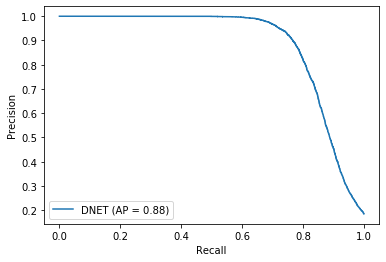

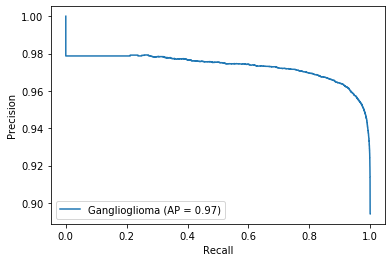

In [185]:
evaluator.plot_precision_recall_curves(level=shared.enums.EvaluationLevel.tile, 
                                       dataset_type=shared.enums.DatasetType.validation)









  0%|          | 0/2 [00:00<?, ?it/s]







100%|██████████| 2/2 [00:00<00:00, 19.03it/s]


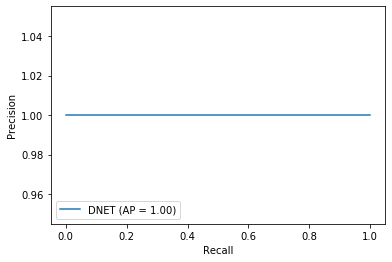

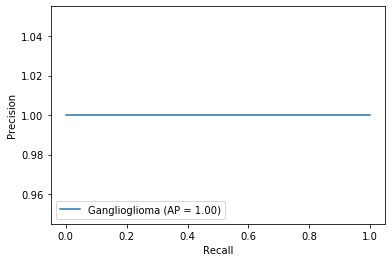

In [186]:
evaluator.plot_precision_recall_curves(level=shared.enums.EvaluationLevel.slide, 
                                       dataset_type=shared.enums.DatasetType.validation)

In [180]:
evaluator.calculate_accuracy_per_class(dataset_type=shared.enums.DatasetType.validation, 
                                       level=shared.enums.EvaluationLevel.case)









100%|██████████| 21/21 [00:00<00:00, 556.22it/s][A


{'DNET': 1.0, 'Ganglioglioma': 1.0}

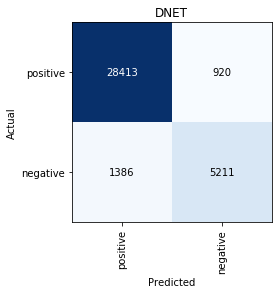

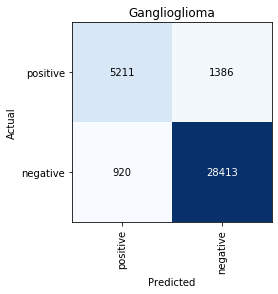

In [187]:
evaluator.plot_confusion_matrix(dataset_type=shared.enums.DatasetType.validation, 
                                level=shared.enums.EvaluationLevel.tile)

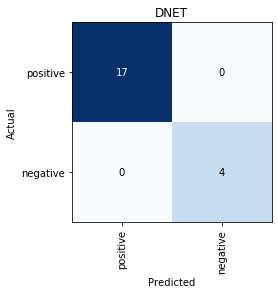

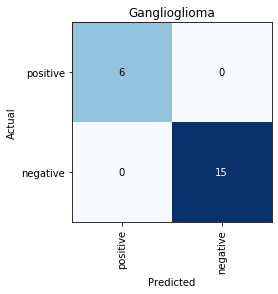

In [181]:
evaluator.plot_confusion_matrix(dataset_type=shared.enums.DatasetType.validation, 
                                level=shared.enums.EvaluationLevel.case)









  0%|          | 0/2 [00:00<?, ?it/s]







 50%|█████     | 1/2 [00:00<00:00,  1.17it/s]







100%|██████████| 2/2 [00:01<00:00,  1.18it/s]


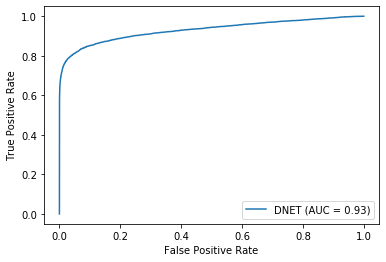

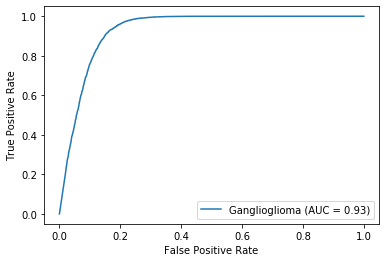

In [188]:
evaluator.plot_roc_curves(dataset_type=shared.enums.DatasetType.validation, level=shared.enums.EvaluationLevel.tile)









  0%|          | 0/2 [00:00<?, ?it/s]







100%|██████████| 2/2 [00:00<00:00, 19.20it/s]


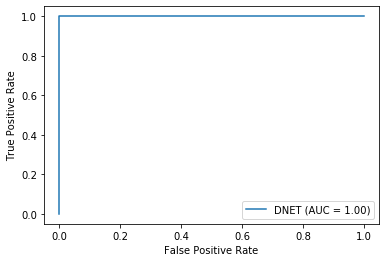

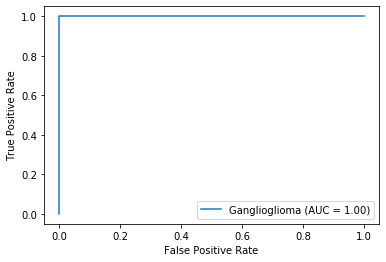

In [182]:
evaluator.plot_roc_curves(dataset_type=shared.enums.DatasetType.validation, level=shared.enums.EvaluationLevel.slide)